MAE6226 Aero/Hydrodynamics Final Project

# Canard for Delta Wing Fighters - Basic Control and Supermaneuverbility

## by Li Lin
#### May/2016

### Introduction

Born with the first powered airplane in history, "canard" was a pair of aerodynamic control surfaces for an aircraft in front of their primary wings. In addition to providing pitching and rolling moments, a canard can also preprocess the upstream flow before it reaches the primary wing leading edges, especially for some high swept angle ones, such as delta wings. Based on a careful design, the interaction of canard wake and delta wing leading edge vortices usually results in an extra vortex lift, and stall prevention. 

However, aircrafts equipped with canards are aerodynamic unstable. Such an instability requires computers to correct control inputs and cancel out the disturbance. Therefore, canard aircrafts are not common until fly-by-wire control is developed. For present days, different canard designs coupling with delta wings are widely used for military, mainly air superiority fighters, such as Dassault Rafale, Saab JAS-39 Gripen, and Chengdu J-10. 

In this project, a canard system is designed and analyzed using unsteady vortex lattice method, lifting surface approximation and other assumptions. The results include some common subsonic  aerodynamic phenomena such as vortex lift, flow separation, and control surface losing effectiveness. A simple automatic control function for pitching instability is also developed.

### Design and Modeling

A pair of canard fore planes and the delta wings to couple with is design for cruising at 5000m or 16404.2ft with M0.8. The aircraft is assumed to be a light weight fighter of 6000kg without load and 10,000kg for full load. NACA64A210 is chosen as the airfoil for both the canard fore planes and delta wings. A preliminary design is shown below:

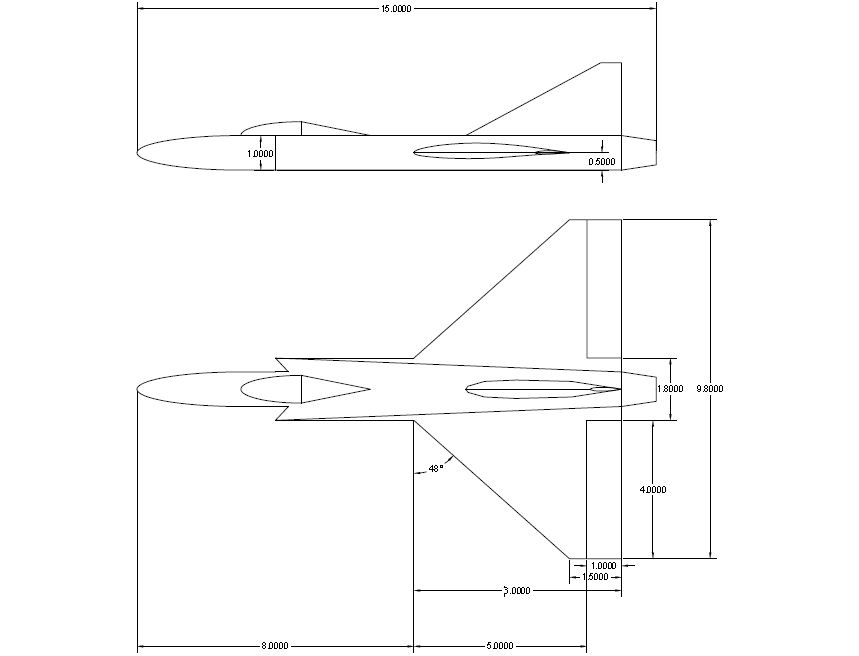

In [447]:
from IPython.display import Image
Image(filename='No Canard Design.JPG') 

Note that the elevon is set to 1m wide for an N by 1 coarse gird in vortex lattice mesh. A smaller size will limited the gird size and unfortunately increase the running time for the code. 

The design is then modeled and meshed in python. The airfoil is NACA 6 series, which cannot be created by Joukowsky transformation. Therefore both the airfoil surface and camber surface are plotted using a polynomial approximation. The polynomial expression also makes the panel slope easier to find (will be discussed later).

In [448]:
import math
import numpy as np
np.set_printoptions(threshold=np.inf)
import matplotlib.pyplot as plt
%matplotlib inline

In [449]:
def Airfoil_Gen(coeff,x,N):
    y = np.zeros(N)
    for n in range (N):
        y[n] = coeff[0]*(x[n]**6.0)+coeff[1]*(x[n]**5.0)+coeff[2]*(x[n]**4.0)\
            +coeff[3]*(x[n]**3.0)+coeff[4]*(x[n]**2.0)+coeff[5]*(x[n])+coeff[6]
    return y

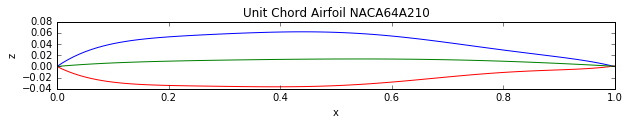

In [450]:
# Airfoil:
up_coeff = [-4.6618,15.174,-19.02,11.599,-3.7776,0.68614,0.0]
dw_coeff = [4.4295,-14.105,17.183,-10.136,3.1378,-0.50831,0.0]
cb_coeff = np.zeros(7)
cb_dzdx_coeff = np.zeros(7) 
for n in range (7):
    cb_coeff[n] = (up_coeff[n]+dw_coeff[n])/2.0 # Unit Chord Camber Line Equation Coefficients
for n in range (7):
    cb_dzdx_coeff[n] = cb_coeff[n]*(7-1-n)
x = np.linspace(0.0,1.0,100)
up_surface = Airfoil_Gen(up_coeff,x,100)
dw_surface = Airfoil_Gen(dw_coeff,x,100)
cb_surface = Airfoil_Gen(cb_coeff,x,100)
plt.figure(figsize = ([10,1.2]))
plt.title('Unit Chord Airfoil NACA64A210')
plt.xlabel('x')
plt.ylabel('z')
plt.plot(x,up_surface,color = 'blue');
plt.plot(x,dw_surface,color = 'red');
plt.plot(x,cb_surface,color = 'green');
plt.show()

Next step is to mesh the delta wing. To simplify the problem, the lifting surface method is used in this project, which means all the girds or vortex units are placed on the camber surface instead of upper and lower surfaces for the wings. Each vortex unit is a U-shape or horseshoe vortex sheet, as shown below. The control point $m$ is placed at the $3/4$ chord of the unit and the bound vortex sheet locates at the $1/4$ chord. Therefore, for each unit, there are three points $1n$, $2n$, and $m$ are in further compute and should be observed [1]. 

In [451]:
def VLM_Mesh(pn_c,pn_sp,hs,root,tip,FD,cb_coeff,cb_dzdx_coeff,LE,xp,zp,\
pa_s,pa_p,hp,showimage):
    totpn = pn_c*pn_sp*2 # Total Panel Number
    # Points Parameters: [0-3] x, y, z, Chord Length,
    # [4]dz/dx,[5]dy,[6]L,[7]D,[8]pa,[9]grid area (for Control Points Only)
    point_m = np.zeros((totpn,10)) # Control Points Parameters 
    point_1n = np.zeros((totpn,4)) # 1n Points Parameters
    point_2n = np.zeros((totpn,4)) # 2n Points Parameters
    for VLx in range (pn_c): # Starboard VLM Mesh
        for VLy in range (pn_sp):
            pn = VLy+VLx*pn_sp
            point_m[pn,1] = hs/pn_sp*(0.5+VLy)+FD/2.0
            point_m[pn,3] = root+(tip-root)/hs*(point_m[pn,1]-FD/2.0)
            xonwing = point_m[pn,3]/pn_c*(3.0/4.0+VLx) # x position from leading edge
            xonunitwing = xonwing/point_m[pn,3] # x position on wing for unit chord
            point_m[pn,0] = xp+(xonwing+(point_m[pn,1]-FD/2.0)*math.tan(LE))\
            *math.cos(pa_s)
            point_m[pn,2] = Airfoil_Gen(cb_coeff,[xonunitwing],1)+zp\
            +math.tan(pa_s)*(hp-point_m[pn,0])
            point_m[pn,4] = \
            cb_dzdx_coeff[0]*xonunitwing**5.0\
            +cb_dzdx_coeff[1]*xonunitwing**4.0\
            +cb_dzdx_coeff[2]*xonunitwing**3.0\
            +cb_dzdx_coeff[3]*xonunitwing**2.0\
            +cb_dzdx_coeff[4]*xonunitwing+cb_dzdx_coeff[5]-math.tan(pa_s)
            point_m[pn,5] = hs/pn_sp 
            point_m[pn,8] = pa_s
            point_m[pn,9] = point_m[pn,5]*point_m[pn,3]/pn_sp
            point_1n[pn,1] = hs/pn_sp*VLy+FD/2.0
            point_1n[pn,3] = root+(tip-root)/hs*(point_1n[pn,1]-FD/2.0)
            point_1n[pn,0] = xp+(point_1n[pn,3]/pn_c*(1.0/4.0+VLx)\
            +(point_1n[pn,1]-FD/2.0)*math.tan(LE))*math.cos(pa_s)
            point_1n[pn,2] = Airfoil_Gen(cb_coeff,\
            [(point_1n[pn,0]-xp-(point_1n[pn,1]-FD/2.0)*math.tan(LE))\
            /point_1n[pn,3]],1)+zp-math.sin(pa_s) 
            point_2n[pn,1] = hs/pn_sp*(VLy+1.0)+FD/2.0
            point_2n[pn,3] = root+(tip-root)/hs*(point_2n[pn,1]-FD/2.0)
            point_2n[pn,0] = xp+point_2n[pn,3]/pn_c*(1.0/4.0+VLx)\
            +(point_2n[pn,1]-FD/2.0)*math.tan(LE)*math.cos(pa_s)
            point_2n[pn,2] = Airfoil_Gen(cb_coeff,\
            [(point_2n[pn,0]-xp-(point_2n[pn,1]-FD/2.0)*math.tan(LE))\
            /point_2n[pn,3]],1)+zp-math.sin(pa_s) 
    for VLx in range (pn_c): # Port VLM Mesh
        for VLy in range (pn_sp):
            pn = VLy+VLx*pn_sp+pn_c*pn_sp
            point_m[pn,1] = -1.0*point_m[int(pn-totpn/2.0),1]
            point_m[pn,3] = point_m[int(pn-totpn/2.0),3]
            point_m[pn,0] = point_m[int(pn-totpn/2.0),0]/math.cos(pa_s)*math.cos(pa_p)
            point_m[pn,2] = point_m[int(pn-totpn/2.0),2]+\
            (-math.tan(pa_s)+math.tan(pa_p))*(hp-point_m[pn,0])
            point_m[pn,4] = point_m[int(pn-totpn/2.0),4]+math.tan(pa_s)-math.tan(pa_p)
            point_m[pn,5] = hs/pn_sp
            point_m[pn,8] = pa_p
            point_m[pn,9] = point_m[pn,5]*point_m[pn,3]/pn_sp
            point_1n[pn,1] = -1.0*point_1n[int(pn-totpn/2.0),1]
            point_1n[pn,3] = point_1n[int(pn-totpn/2.0),3]
            point_1n[pn,0] = point_1n[int(pn-totpn/2.0),0]/math.cos(pa_s)*math.cos(pa_p)
            point_1n[pn,2] = point_1n[int(pn-totpn/2.0),2]+math.sin(pa_s)-math.sin(pa_p)
            point_2n[pn,1] = -1.0*point_2n[int(pn-totpn/2.0),1]
            point_2n[pn,3] = point_2n[int(pn-totpn/2.0),3]
            point_2n[pn,0] = point_2n[int(pn-totpn/2.0),0]/math.cos(pa_s)*math.cos(pa_p)
            point_2n[pn,2] = point_2n[int(pn-totpn/2.0),2]+math.sin(pa_s)-math.sin(pa_p)
    if showimage == 1:
        plt.figure(figsize = ([5,7.5]))
        plt.grid('on')
        plt.title('VLM Mesh on Camber Surface - Top View')
        plt.xlabel('y')
        plt.ylabel('x')
        plt.xlim(-6,6)
        plt.ylim(15,0)
        for pn in range (totpn):
            plt.scatter(point_m[pn,1],point_m[pn,0],color = 'green',s = 5.0)
            plt.scatter(point_1n[pn,1],point_1n[pn,0],color = 'red',s = 5.0)
            plt.scatter(point_2n[pn,1],point_2n[pn,0],color = 'blue',s = 5.0)
        plt.show()
        plt.figure(figsize = ([7.5,1]))
        plt.grid('on')
        plt.title('VLM Mesh on Camber Surface - Side View')
        plt.xlabel('x')
        plt.ylabel('z')
        plt.xlim(0,15)
        plt.ylim(-0.5,0.5)
        for pn in range (totpn):
            plt.scatter(point_m[pn,0],point_m[pn,2],color = 'green',s = 1)
            plt.scatter(point_1n[pn,0],point_1n[pn,2],color = 'red',s = 1)
            plt.scatter(point_2n[pn,0],point_2n[pn,2],color = 'blue',s = 1)
        plt.show()
    return point_m,point_1n,point_2n,totpn

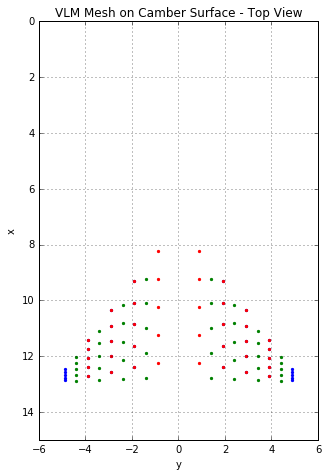

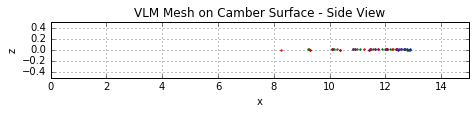

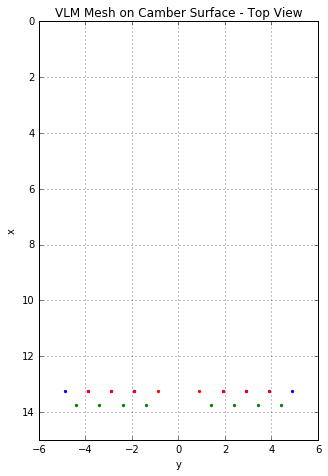

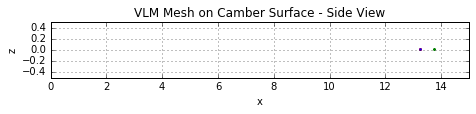

In [452]:
# Primary Delta Wing (DW) Geometery:
Grid = 1.0 # General Grid Size
FD = 1.8 # Fuselage Diameter + Blended Wing Body
DW_LE = 48.0/180.0*math.pi # Leading Edge Swept Angle
DW_TE = 0.0/180.0*math.pi # Trailing Edge Swept Angle
DW_r = 5.0 # Wing Root Chord Length
DW_t = 0.5 # Wing Tip Chord Length
DW_span = 9.8 # Wing Span
DW_hs = (DW_span-FD)/2.0 # Actual Half Wing Span in Flow Field
DW_S = DW_hs*(DW_r+DW_t)/2.0*2.0 # Wing Surface Area
DW_AR = DW_span**2.0/DW_S # Aspect Ratio
DWP = 8.0 # Delta Wing Root Leading Edge x Position
DWH = 0.0 # Delta Wing Root Leading Edge z Position
DWpa_s = 0.0 # Delta Wing Pitching Angle Starboard
DWpa_p = 0.0 # Delta Wing Pitching Angle Port
# Elevon Geometery:
EP = 13 # Elevon x Position
EH = 0.0 # Elevon z Position
EHP = EP
E_LE = 0.0
E_TE = 0.0
E_span = DW_span
E_hs = (E_span-FD)/2.0
E_r = 1.0
E_t = 1.0
E_S = E_r*E_hs*2.0
Epa_s = 0.0 # Elevon Pitching Angle Starboard
Epa_p = 0.0 # Elevon Pitching Angle Port
# Delta Wing VLM Mesh:
DWpanelnum_c = int(DW_r/Grid) # Panel Number along Chord
DWpanelnum_sp = int(DW_hs/Grid) # Panel Number along Half Wing Span
DWpoint_m,DWpoint_1n,DWpoint_2n,DWtotpanelnum = \
 VLM_Mesh(DWpanelnum_c,DWpanelnum_sp,DW_hs,DW_r,DW_t,FD,cb_coeff,cb_dzdx_coeff,\
 DW_LE,DWP,DWH,DWpa_s,DWpa_p,DWP,1)
# Elevon VLM Mesh:
Epanelnum_c = int(E_r/Grid) # Panel Number along Chord
Epanelnum_sp = int(E_hs/Grid) # Panel Number along Half Wing Span
Epoint_m,Epoint_1n,Epoint_2n,Etotpanelnum = \
 VLM_Mesh(Epanelnum_c,Epanelnum_sp,E_hs,E_r,E_t,FD,cb_coeff,cb_dzdx_coeff,\
 E_LE,EP,EH,Epa_s,Epa_p,EHP,1)

Next, the induced velocity of each horseshoe vortex unit is computed using Biot-Savart Law [1]. The horseshoe is the summation of three parts: $V_{AB}$, $V_{A\infty}$, and $V_{B\infty}$, where

$\vec{V}_{AB} = \frac{\Gamma}{4\pi}Fac1_{AB}Fac2_{AB}$,

$\vec{V}_{A\infty} = \frac{\Gamma}{4\pi}\frac{(z-z_{1n})\hat{j}+(y_{1n}-y)\hat{k}}{(z-z_{1n})^2+(y_{1n}-y)^2}[1+\frac{x-x_{1n}}{\sqrt{(x-x_{1n})^2+(y-y_{1n})^2+(z-z_{1n})^2}}]$,

$\vec{V}_{B\infty} = -\frac{\Gamma}{4\pi}\frac{(z-z_{2n})\hat{j}+(y_{2n}-y)\hat{k}}{(z-z_{2n})^2+(y_{2n}-y)^2}[1+\frac{x-x_{2n}}{\sqrt{(x-x_{2n})^2+(y-y_{2n})^2+(z-z_{2n})^2}}]$,

and

$Fac1_{AB} = \frac{\vec{r}_1\times\vec{r}_2}{|\vec{r}_1\times\vec{r}_2|^2} = \frac{[(y-y_{1n})(z-z_{2n})-(y-y_{2n})(z-z_{1n})]\hat{i}-[(x-x_{1n})(z-z_{2n})-(x-x_{2n})(z-z_{1n})]\hat{j}+[(x-x_{1n})(y-y_{2n})-(x-x_{2n})(y-y_{1n})]\hat{k}}{[(y-y_{1n})(z-z_{2n})-(y-y_{2n})(z-z_{1n})]^2+[(x-x_{1n})(z-z_{2n})-(x-x_{2n})(z-z_{1n})]^2+[(x-x_{1n})(y-y_{2n})-(x-x_{2n})(y-y_{1n})]^2}$,

$Fac2_{AB} = \vec{r}_0\cdot\frac{\vec{r}_1}{r_1}-\vec{r}_0\cdot\frac{\vec{r}_2}{r_2} = \frac{(x_{2n}-x_{1n})(x-x_{1n})+(y_{2n}-y_{1n})(y-y_{1n})+(z_{2n}-z_{1n})(z-z_{1n})}{\sqrt{(x-x_{1n})^2+(y-y_{1n})^2+(z-z_{1n})^2}}-\frac{(x_{2n}-x_{1n})(x-x_{2n})+(y_{2n}-y_{1n})(y-y_{2n})+(z_{2n}-z_{1n})(z-z_{2n})}{\sqrt{(x-x_{2n})^2+(y-y_{2n})^2+(z-z_{2n})^2}}$


In [453]:
def Induced_Velocity(point_m,point_1n,point_2n,Gamma_n):
    # V_AB:    
    # Fac1 Denominator:    
    Fac1_de = ((point_m[1]-point_1n[1])*(point_m[2]-point_2n[2])\
    -(point_m[1]-point_2n[1])*(point_m[2]-point_1n[2]))**2.0\
    +((point_m[0]-point_1n[0])*(point_m[2]-point_2n[2])\
    -(point_m[0]-point_2n[0])*(point_m[2]-point_1n[2]))**2.0\
    +((point_m[0]-point_1n[0])*(point_m[1]-point_2n[1])\
    -(point_m[0]-point_2n[0])*(point_m[1]-point_1n[1]))**2.0
    # Fac2:
    Fac2 = (((point_2n[0]-point_1n[0])*(point_m[0]-point_1n[0])\
    +(point_2n[1]-point_1n[1])*(point_m[1]-point_1n[1])\
    +(point_2n[2]-point_1n[2])*(point_m[2]-point_1n[2]))\
    /math.sqrt((point_m[0]-point_1n[0])**2.0\
    +(point_m[1]-point_1n[1])**2.0\
    +(point_m[2]-point_1n[2])**2.0))\
    -(((point_2n[0]-point_1n[0])*(point_m[0]-point_2n[0])\
    +(point_2n[1]-point_1n[1])*(point_m[1]-point_2n[1])\
    +(point_2n[2]-point_1n[2])*(point_m[2]-point_2n[2]))\
    /math.sqrt((point_m[0]-point_2n[0])**2.0\
    +(point_m[1]-point_2n[1])**2.0\
    +(point_m[2]-point_2n[2])**2.0))
    # Numerator:
    V_AB_u = (point_m[1]-point_1n[1])*(point_m[2]-point_2n[2])\
    -(point_m[1]-point_2n[1])*(point_m[2]-point_1n[2])
    V_AB_v = -((point_m[0]-point_1n[0])*(point_m[2]-point_2n[2])\
    -(point_m[0]-point_2n[0])*(point_m[2]-point_1n[2]))
    V_AB_w = (point_m[0]-point_1n[0])*(point_m[1]-point_2n[1])\
    -(point_m[0]-point_2n[0])*(point_m[1]-point_1n[1])    
    # V_Ainf:
    # Common Coefficient:
    V_Ainf_coeff = (Gamma_n/(4.0*math.pi))\
    /((point_m[2]-point_1n[2])**2.0+(point_1n[1]-point_m[1])**2.0)\
    *(1.0+(point_m[0]-point_1n[0])\
    /math.sqrt((point_m[0]-point_1n[0])**2.0+(point_m[1]-point_1n[1])**2.0\
    +(point_m[2]-point_1n[2])**2.0))
    # Numerator:
    Ainf_v = point_m[2]-point_1n[2]
    Ainf_w = point_1n[1]-point_m[1]
    # V_Binf:
    # Common Coefficient:
    V_Binf_coeff = (-Gamma_n/(4.0*math.pi))\
    /((point_m[2]-point_2n[2])**2.0+(point_2n[1]-point_m[1])**2.0)\
    *(1.0+(point_m[0]-point_2n[0])\
    /math.sqrt((point_m[0]-point_2n[0])**2.0+(point_m[1]-point_2n[1])**2.0\
    +(point_m[2]-point_2n[2])**2.0))
    # Numerator:
    Binf_v = point_m[2]-point_2n[2]
    Binf_w = point_2n[1]-point_m[1]
    # Compute the Induced Velocity: V_AB+V_Ainf+V_Binf
    u = Gamma_n/(4.0*math.pi)*V_AB_u*Fac2/Fac1_de
    v = Gamma_n/(4.0*math.pi)*V_AB_v*Fac2/Fac1_de\
    +V_Ainf_coeff*Ainf_v+V_Binf_coeff*Binf_v
    w = Gamma_n/(4.0*math.pi)*V_AB_w*Fac2/Fac1_de\
    +V_Ainf_coeff*Ainf_w+V_Binf_coeff*Binf_w
    return u,v,w

Then, the vortex strength values are computed in a linear system with the coefficient matrix is consists of the induced velocities, that $\vec{V}_m = \sum\limits_{i=1}^{2N}\vec{C}_{m,n}\Gamma_n$, 

and the right-hand-side (RHS) is "no penetration" boundary condition applied on the camber surface, that 

$-u_m\sin\delta\cos\phi-u_m\cos\delta\sin\phi+w_m\cos\phi\cos\delta+U_\infty\sin(\alpha-\delta)\cos\phi = 0$, 

where $\phi$ is the local dihedral angle of the vortex unit and $\delta$ is the local slope angle: $\delta = \tan^{-1}(\frac{dz}{dx})_m$. Finally, the total lift generated by the wings is computed by sum up of all unit lifts.

In [454]:
def Compute_Lift(point_m,point_1n,point_2n,U_inf,AOA,rho,totpanelnum,hs,\
panelnum_sp,pa_s,pa_p):
    # A matrix
    A = np.zeros((totpanelnum,totpanelnum))
    u = np.zeros((totpanelnum,totpanelnum))
    v = np.zeros((totpanelnum,totpanelnum))
    w = np.zeros((totpanelnum,totpanelnum))
    delta = np.zeros(totpanelnum)
    for m in range (totpanelnum):
        for n in range (totpanelnum):
            u[m,n],v[m,n],w[m,n] = \
            Induced_Velocity(point_m[m,:],point_1n[n,:],point_2n[n,:],1.0)
            if n >= (totpanelnum/2.0):
                w[m,n] = -1.0*w[m,n]
                u[m,n] = -1.0*u[m,n]
            delta[m] = math.atan(point_m[m,4])
            A[m,n] = u[m,n]*math.sin(delta[m])-w[m,n]*math.cos(delta[m])
    # b vector
    b = np.zeros(totpanelnum)
    for n in range (totpanelnum):
        if n < totpanelnum:
            b[n] = U_inf*math.sin(AOA-delta[n])
        else:
            b[n] = U_inf*math.sin(AOA-delta[n])
    # x vector
    Gamma = np.linalg.solve(A,b)
    #print(Gamma)
    # Compute Lift
    L_s_vec = 0.0 # Initialize Total Lift of Starboard Wing
    L_p_vec = 0.0 # Initialize Total Lift of Port Wing
    for n in range (int(totpanelnum/2.0)):
        L_s_vec = L_s_vec\
        +2.0*rho*U_inf*Gamma[n]*hs/panelnum_sp*math.cos(delta[n])
        L_p_vec = L_p_vec+2.0*rho*U_inf*Gamma[n+int(totpanelnum/2.0)]*hs/panelnum_sp\
        *math.cos(delta[n])
    L_s = L_s_vec*np.cos(AOA)
    L_p = L_p_vec*np.cos(AOA)
    return L_s, L_p

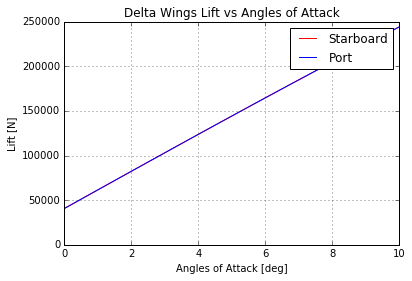

In [455]:
# Test at h = 5000m:
# T = 255.7[K], P = 54050[N/m^2], rho = 0.73647[kg/m^3], 
# mu = 1.6357x10^-5[Ns/m^2], Speed of Sound = 320.5[m/s]
# Lift and C_L vs AOA:
Ma = 0.8 # Cruise Air Speed
c = 320.5 # Speed of Sound
U_inf = Ma*c
rho = 0.73647
mu = 1.6357*(10.0**(-5.0))
TP = 10 # Test Points
AOA_test = np.linspace(0.0,10.0/180.0*math.pi,TP)
AOA_axis = AOA_test/np.pi*180.0
DWL_S = np.zeros(TP)
DWL_P = np.zeros(TP)
DWD_S = np.zeros(TP)
DWD_P = np.zeros(TP)
DWL_tot = np.zeros(TP)
DW_CL_tot = np.zeros(TP)
for n_AOA in range (TP):
    DWL_S[n_AOA],DWL_P[n_AOA]\
    = Compute_Lift(DWpoint_m,DWpoint_1n,\
    DWpoint_2n,U_inf,AOA_test[n_AOA],rho,DWtotpanelnum,DW_hs,DWpanelnum_sp,\
    DWpa_s,DWpa_p)
    DWL_tot[n_AOA] = DWL_S[n_AOA]+DWL_P[n_AOA]
    DW_CL_tot[n_AOA] = DWL_tot[n_AOA]/(0.5*rho*(U_inf**2.0)*DW_S)/2.0
plt.figure()
plt.grid('on')
plt.title('Delta Wings Lift vs Angles of Attack')
plt.xlabel('Angles of Attack [deg]')
plt.ylabel('Lift [N]')
plt.plot(AOA_axis,DWL_S,color = 'red')
plt.plot(AOA_axis,DWL_P,color = 'blue')
plt.legend(['Starboard','Port'])
plt.show()

The result indicates each side of the delta wing produces a lift about $42000N$, thus the total lift is about $84000N$. To complete the cruise, a total lift that $L = mg = 10000kg*9.8m/s^2 = 98000N$ is required. Therefore the canard fore plane area can be roughly assumed and designed as follows:

In [456]:
# Canard Fore Plane (CFP) Geometery:
CFPP = 4.0 # CFP Root x Position: from x = 4.0 to 8.0-Chord
CFPH = 0.4 # CFP Root z Position: from z = 0.0 to 0.5
CFPHP = 5.0
CFP_hs = 2.0
CFP_r = 2.0
CFP_t = 1.0
CFP_LE = DW_LE
CFP_TE = math.atan(CFP_hs/(CFP_hs*math.tan(CFP_LE+CFP_t-CFP_r)))
CFP_S = (CFP_r+CFP_t)*CFP_hs/2.0*2.0 
CFP_span = (CFP_hs+FD/2.0)*2.0
CFP_AR = CFP_span**2.0/CFP_S 
CFPpa_s = 0.0 # CFP Pitching Angle Starboard
CFPpa_p = 0.0 # CFP Wing Pitching Angle Port

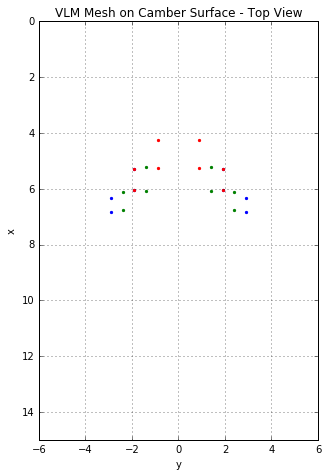

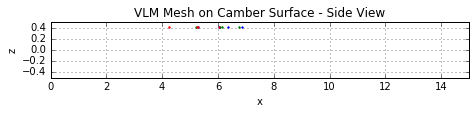

In [457]:
# Canard Fore Plane VLM Mesh:
CFPpanelnum_c = int(CFP_r/Grid) # Panel Number along Chord
CFPpanelnum_sp = int(CFP_hs/Grid) # Panel Number along Half Wing Span
CFPpoint_m,CFPpoint_1n,CFPpoint_2n,CFPtotpanelnum = \
 VLM_Mesh(CFPpanelnum_c,CFPpanelnum_sp,CFP_hs,CFP_r,CFP_t,FD,cb_coeff,cb_dzdx_coeff,\
 CFP_LE,CFPP,CFPH,CFPpa_s,CFPpa_p,CFPP,1)

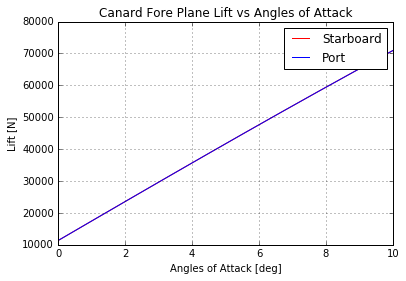

In [458]:
TP = 10 # Test Points
AOA_test = np.linspace(0.0,10.0/180.0*math.pi,TP)
AOA_axis = AOA_test/np.pi*180.0
CFPL_S = np.zeros(TP)
CFPL_P = np.zeros(TP)
CFPL_tot = np.zeros(TP)
CFP_CL_tot = np.zeros(TP)
for n_AOA in range (TP):
    CFPL_S[n_AOA],CFPL_P[n_AOA] \
    = Compute_Lift(CFPpoint_m,CFPpoint_1n,\
    CFPpoint_2n,U_inf,AOA_test[n_AOA],rho,CFPtotpanelnum,CFP_hs,CFPpanelnum_sp,\
    CFPpa_s,CFPpa_p)
    CFPL_tot[n_AOA] = CFPL_S[n_AOA]+CFPL_P[n_AOA]
    CFP_CL_tot[n_AOA] = CFPL_tot[n_AOA]/(0.5*rho*(U_inf**2.0)*CFP_S)/2.0
plt.figure()
plt.grid('on')
plt.title('Canard Fore Plane Lift vs Angles of Attack')
plt.xlabel('Angles of Attack [deg]')
plt.ylabel('Lift [N]')
plt.plot(AOA_axis,CFPL_S,color = 'red')
plt.plot(AOA_axis,CFPL_P,color = 'blue')
plt.legend(['Starboard','Port'])
plt.show()

For now, the canard fore planes are temporarily placed at $x = 4m$, next to the intakes, and the complete model is shown below:

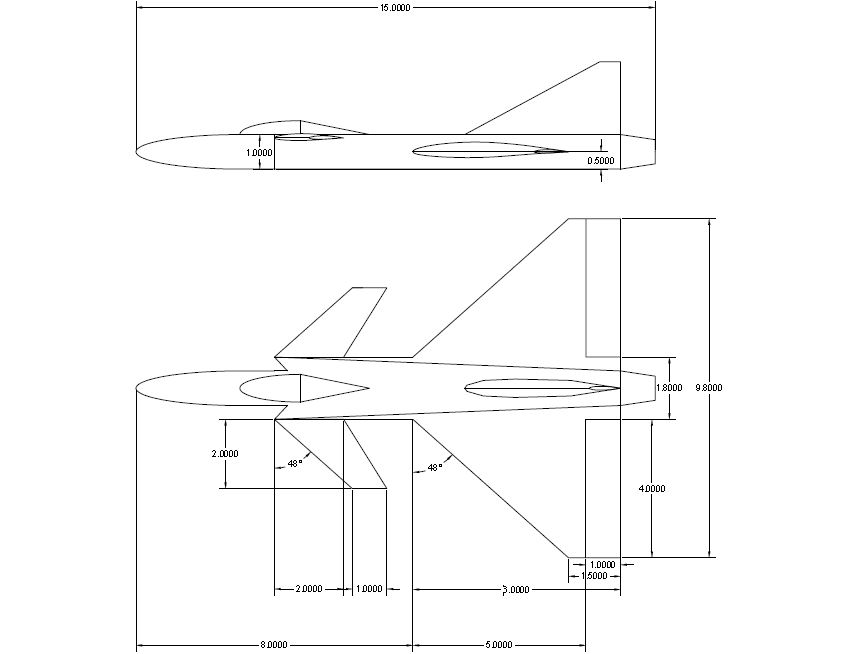

In [459]:
from IPython.display import Image
Image(filename='Complete Design.JPG')

### Flow Separation Correction Term and Static Test 

Now, it is ready to test the model. Although the model is design for cruse speed M0.8, the flow is assumed as incompressible in this project, therefore the Mach number is set to $0.3$ for all further test. Moreover, unfortunately, the lifting surface approximation can only deal with small angles of attack (AOA). Thus, here introduce a simple flow separation correction term to simulate some viscous effect. The lift coefficient curves [2] of NACA64A210 are extended linearly from the stall AOA and shown below: 

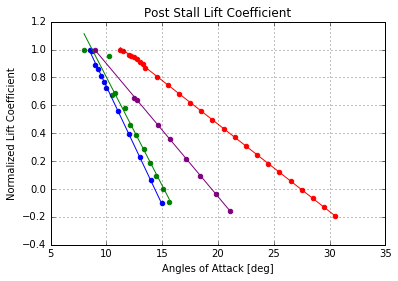

In [460]:
C_L50000 = [1,0.986212056,0.887665669,0.859448482,0.812099188,\
            0.770307824,0.722424113,0.557182557,0.391941,0.226699444,0.061457888,-0.103783668]
AOA50000 = [8.5,8.75,9,9.25,9.5,9.75,10,11,12,13,14,15]
C_L100000 = [1,0.952958866,0.676511653,0.686607239,0.582142985,0.458537691,0.385879704,0.285637193,0.186801929,\
             0.096223341,-0.00032878,-0.095650771]
AOA100000 = [8,10.25,10.5,10.75,11.66666667,12.13888889,12.68518519,13.33024691,13.88477366,14.46673525,15.06058528,\
             15.63736473]
C_L200000 = [1,0.65403041,0.637158925,0.455738388,0.356592377,0.216309102,0.096594459,-0.033404499,-0.1582613]
AOA200000 = [9,12.5,12.75,14.625,15.6875,17.15625,18.421875,19.7890625,21.10546875]
C_L1000000 = [1,0.99217334,0.959383754,0.955182073,0.945625309,0.931866864,0.913741967,0.893063108,0.867605866,\
              0.805322129,0.743038392,0.680754655,0.618470918,0.556187181,0.493903444,0.431619707,0.36933597,\
              0.307052233,0.244768496,0.182484759,0.120201022,0.057917285,-0.004366452,-0.066650189,-0.128933927,\
              -0.191217664]
AOA1000000 = [11.25,11.5,12,12.25,12.5,12.75,13,13.25,13.5,14.5,15.5,16.5,17.5,18.5,19.5,20.5,21.5,22.5,23.5,24.5,\
              25.5,26.5,27.5,28.5,29.5,30.5]
trendline50000 = [-0.16948,2.4301]
trendline100000 = [-0.15541,2.3562]
trendline200000 = [-0.09536,1.8527]
trendline1000000 = [-0.06263,1.7174]
plt.figure()
plt.grid('on')
plt.title('Post Stall Lift Coefficient')
plt.xlabel('Angles of Attack [deg]')
plt.ylabel('Normalized Lift Coefficient')
plt.scatter(AOA50000,C_L50000,color = 'blue')
plt.scatter(AOA100000,C_L100000,color = 'green')
plt.scatter(AOA200000,C_L200000,color = 'purple')
plt.scatter(AOA1000000,C_L1000000,color = 'red')
x50000 = np.linspace(np.min(AOA50000),np.max(AOA50000),100)
y50000 = trendline50000[0]*x50000+trendline50000[1]
plt.plot(x50000,y50000,color = 'blue')
x100000 = np.linspace(np.min(AOA100000),np.max(AOA100000),100)
y100000 = trendline100000[0]*x100000+trendline100000[1]
plt.plot(x100000,y100000,color = 'green')
x200000 = np.linspace(np.min(AOA200000),np.max(AOA200000),100)
y200000 = trendline200000[0]*x200000+trendline200000[1]
plt.plot(x200000,y200000,color = 'purple')
x1000000 = np.linspace(np.min(AOA1000000),np.max(AOA1000000),100)
y1000000 = trendline1000000[0]*x1000000+trendline1000000[1]
plt.plot(x1000000,y1000000,color = 'red');

Obviously, for different Reynold's numbers (Re), we have different $C_L$ vs AOA relations. If the $C_L$ drop after stall AOA is assumed linear, the slope and intercept can be concluded as a logarithm relation of Re as shown below:

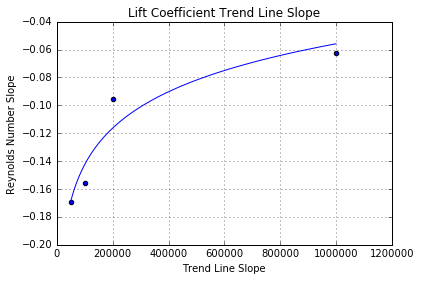

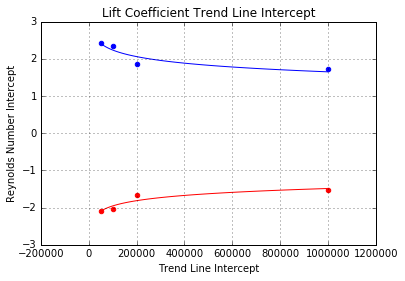

In [461]:
REx= [50000,100000,200000,1000000]
CLky = [trendline50000[0],trendline100000[0],trendline200000[0],trendline1000000[0]]
CLbyp = [trendline50000[1],trendline100000[1],trendline200000[1],trendline1000000[1]]
CLbyn = [-2.10162,-2.0490175,-1.66752,-1.532355]
CLk_trendline = [0.0375,-0.574]
CLbp_trendline = [-0.25441,5.1645]
CLbn_trendline = [0.20331,-4.2954]
plt.figure()
plt.grid('on')
plt.title('Lift Coefficient Trend Line Slope')
plt.xlabel('Trend Line Slope')
plt.ylabel('Reynolds Number Slope')
plt.scatter(REx,CLky)
CLktrendx = np.linspace(np.min(REx),np.max(REx),100)
CLktrendy = CLk_trendline[0]*np.log(CLktrendx)+CLk_trendline[1]
plt.plot(CLktrendx,CLktrendy);
plt.figure()
plt.grid('on')
plt.title('Lift Coefficient Trend Line Intercept')
plt.xlabel('Trend Line Intercept')
plt.ylabel('Reynolds Number Intercept')
plt.scatter(REx,CLbyp,color = 'blue')
plt.scatter(REx,CLbyn,color = 'red')
CLbtrendx = np.linspace(np.min(REx),np.max(REx),100)
CLbptrendy = CLbp_trendline[0]*np.log(CLbtrendx)+CLbp_trendline[1]
CLbntrendy = CLbn_trendline[0]*np.log(CLbtrendx)+CLbn_trendline[1]
plt.plot(CLbtrendx,CLbptrendy,color = 'blue')
plt.plot(CLbtrendx,CLbntrendy,color = 'red');

When the $C_L$ curve for each control point is found, their angles will be checked and if the value is higher than the AOA limit in the curve, a lift loss will be computed based on how much AOA exceed. Such an approximation allows the program to simulate an AOA up to about 30 degrees. The unit lift distributions for different AOAs are shown below. Note that the color of each control point is representing a normalized value, that is the ratio comparing with the highest unit lift.

In [462]:
# Lift Coefficient Correction Term:
# Assume the Lift Coefficient Curve is linear after Stall AOA. 
# The linear drop is a function of Re. 
# When AOA is positive:
# Slope = C_L_k[0]*ln(Re)+C_L_k[1]
# Intercept = C_L_b[0]*ln(Re)+C_L_b[1]
# When AOA is negative:
# Slope = C_L_k[0]*ln(Re)+C_L_k[1]
# Intercept = C_L_b[2]*ln(Re)+C_L_b[3]
C_L_k = [0.0375,-0.574] 
C_L_b = [-0.25441,5.1645,0.20331,-4.2954] 

In [463]:
def Compute_Lift_Drag_with_Correction(point_m,point_1n,point_2n,U_inf,AOA,rho,totpanelnum\
,mu,C_L_k,C_L_b):
    # A matrix
    A = np.zeros((totpanelnum,totpanelnum))
    u = np.zeros((totpanelnum,totpanelnum))
    v = np.zeros((totpanelnum,totpanelnum))
    w = np.zeros((totpanelnum,totpanelnum))
    delta = np.zeros(totpanelnum) # True AOA for each panel
    for m in range (totpanelnum):
        for n in range (totpanelnum):
            u[m,n],v[m,n],w[m,n] = \
            Induced_Velocity(point_m[m,:],point_1n[n,:],point_2n[n,:],1.0)
            if point_m[n,1] < 0:
                w[m,n] = -1.0*w[m,n]
                u[m,n] = -1.0*u[m,n]
            delta[m] = math.atan(point_m[m,4])
            A[m,n] = u[m,n]*math.sin(delta[m])-w[m,n]*math.cos(delta[m])
    # b vector
    b = np.zeros(totpanelnum)
    for n in range (totpanelnum):
        b[n] = U_inf*math.sin(AOA-delta[n])
    # x vector
    Gamma = np.linalg.solve(A,b)
    # Lift Coefficient Correction Term for High Angles of Attack
    Re = np.zeros(totpanelnum) # Re for each panel
    totu = np.zeros(totpanelnum)
    totv = np.zeros(totpanelnum)
    totw = np.zeros(totpanelnum)
    AOAlimit = np.ones((totpanelnum,2)) # AOA limit for airfoil sections before stall
    for m in range (totpanelnum):
        for n in range (totpanelnum):
            u[m,n],v[m,n],w[m,n] = \
            Induced_Velocity(point_m[m,:],point_1n[n,:],point_2n[n,:],Gamma[n])
            if point_m[m,1] < 0:
                w[m,n] = -1.0*w[m,n]
            totu[m] = totu[m]+u[m,n]
            totv[m] = totv[m]+v[m,n]
            totw[m] = totw[m]+w[m,n]
        Re[m] = Re[m]+np.sqrt(totu[m]**2.0+totv[m]**2.0+totw[m]**2.0)*rho*\
        point_m[m,3]/mu
        tempk = C_L_k[0]*np.log(Re[m])+C_L_k[1]
        if tempk > -0.01:
            tempk = -0.01
        tempbp = C_L_b[0]*np.log(Re[m])+C_L_b[1] # For positive AOA
        if tempbp < 0.1:
            tempbp = 0.1
        AOAlimit[m,0] = (1.0-tempbp)/tempk/180.0*math.pi
        if AOAlimit[m,0] > (math.pi/2.0):
            AOAlimit[m,0] = math.pi/2.0
        tempbn = C_L_b[2]*np.log(Re[m])+C_L_b[3] # For negative AOA
        if tempbp > -0.1:
            tempbp = -0.1
        AOAlimit[m,1] = (1.0-tempbn)/tempk/180.0*math.pi
        if AOAlimit[m,1] < (-1.0*math.pi/2.0):
            AOAlimit[m,1] = -1.0*math.pi/2.0
    # Compute Lift for each panel:
    for m in range (totpanelnum):
        point_m[m,6] = rho*U_inf*Gamma[m]*point_m[m,5]*math.cos(delta[m])*math.cos(AOA)
        if ((AOA-delta[m]) >= (AOAlimit[m,0]))\
        or ((AOA-delta[m]) <= (AOAlimit[m,1])):
            point_m[m,6] = point_m[m,6]*(((AOA-delta[m])*tempk)+tempbp)   
        point_m[m,7] = point_m[m,6]*math.tan(AOA) # Induced Drag
    return point_m, Re, delta, AOAlimit/np.pi*180.0, Gamma

In [464]:
# Combine all Panels:
totpanelnum = DWtotpanelnum+Etotpanelnum+CFPtotpanelnum
totpoint_m = np.zeros((totpanelnum,10))
totpoint_1n = np.zeros((totpanelnum,4))
totpoint_2n = np.zeros((totpanelnum,4))
for pn in range (totpanelnum):
    if pn < CFPtotpanelnum:
        totpoint_m[pn,:] = CFPpoint_m[pn,:]
        totpoint_1n[pn,:] = CFPpoint_1n[pn,:]
        totpoint_2n[pn,:] = CFPpoint_2n[pn,:]
    if (pn >= CFPtotpanelnum) and (pn < (CFPtotpanelnum+DWtotpanelnum)):
        totpoint_m[pn,:] = DWpoint_m[pn-CFPtotpanelnum,:]
        totpoint_1n[pn,:] = DWpoint_1n[pn-CFPtotpanelnum,:]
        totpoint_2n[pn,:] = DWpoint_2n[pn-CFPtotpanelnum,:]
    if (pn >= (CFPtotpanelnum+DWtotpanelnum)):
        totpoint_m[pn,:] = Epoint_m[pn-(CFPtotpanelnum+DWtotpanelnum),:]
        totpoint_1n[pn,:] = Epoint_1n[pn-(CFPtotpanelnum+DWtotpanelnum),:]
        totpoint_2n[pn,:] = Epoint_2n[pn-(CFPtotpanelnum+DWtotpanelnum),:]

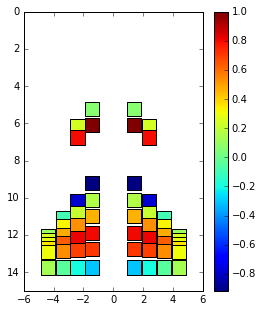

AOA =  0.0 [deg]
Max Unit Lift =  378.584148805 [N]


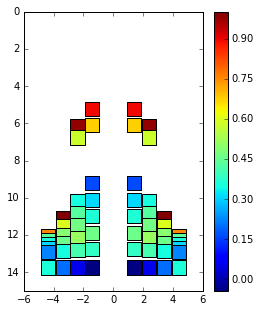

AOA =  5.1724137931 [deg]
Max Unit Lift =  986.228341798 [N]


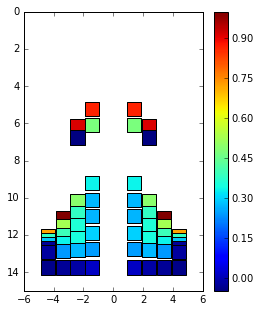

AOA =  10.3448275862 [deg]
Max Unit Lift =  1974.23471365 [N]


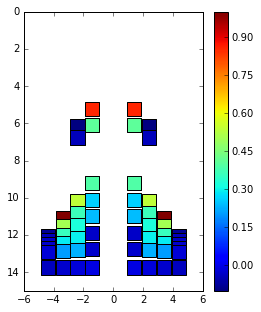

AOA =  15.5172413793 [deg]
Max Unit Lift =  2897.49892468 [N]


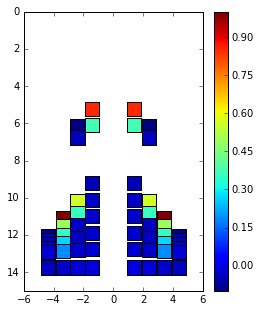

AOA =  20.6896551724 [deg]
Max Unit Lift =  3726.00536722 [N]


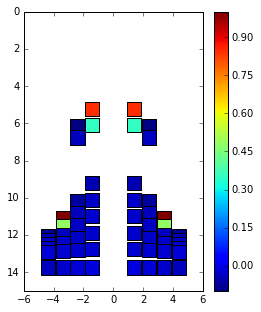

AOA =  25.8620689655 [deg]
Max Unit Lift =  4432.81903821 [N]


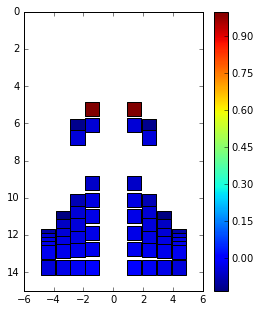

AOA =  30.0 [deg]
Max Unit Lift =  4151.00581476 [N]


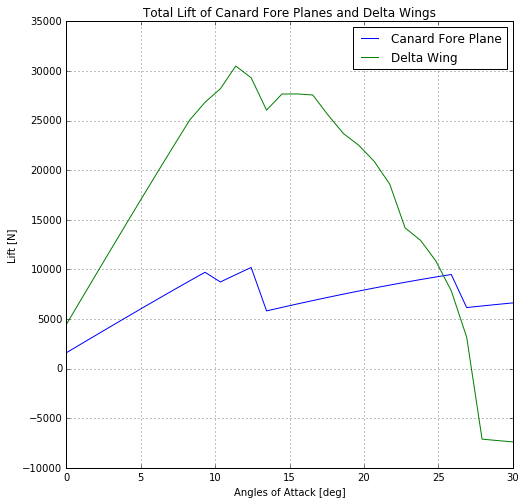

In [465]:
# Unit Lift Distribution for Different AOA (Ignoring Vortex Interaction):
Ma = 0.3 # Cruise Air Speed
c = 320.5 # Speed of Sound
U_inf = Ma*c
TP = 30 # Test Points
AOA_test = np.linspace(0.0/180.0*math.pi,30.0/180.0*math.pi,TP)
CFPtotlift = np.zeros(TP)
DWtotlift = np.zeros(TP)
for n_AOA in range (TP):
    totpoint_m, Re, delta, AOAlimit_deg,Gamma\
    = Compute_Lift_Drag_with_Correction(totpoint_m,totpoint_1n,totpoint_2n,\
    U_inf,AOA_test[n_AOA],rho,totpanelnum,mu,C_L_k,C_L_b)
    if (int(AOA_test[n_AOA]/math.pi*180.0)%5 == 0.0):
        plt.figure(figsize = ([4,5]))
        plt.xlim(-6,6)
        plt.ylim(15,0)
        nl = totpoint_m[:,6]/np.max(totpoint_m[:,6]) # Normalized Lift 
        plt.scatter(totpoint_m[:,1],totpoint_m[:,0],c = nl,s = 200,marker = 's')
        plt.colorbar()
        plt.show()
        print('AOA = ',AOA_test[n_AOA]/math.pi*180.0,'[deg]')
        print('Max Unit Lift = ',np.max(totpoint_m[:,6]),'[N]')
    # Compute Total Lift: (Starboard + Port)
    for pn in range (totpanelnum):
        if pn < CFPtotpanelnum:
            CFPtotlift[n_AOA] = CFPtotlift[n_AOA]+totpoint_m[pn,6]
        if (pn >= CFPtotpanelnum)\
        and (pn < CFPtotpanelnum+DWtotpanelnum):
            DWtotlift[n_AOA] = DWtotlift[n_AOA]+totpoint_m[pn,6]
plt.figure(figsize = ([8,8]))
plt.grid('on')
plt.title('Total Lift of Canard Fore Planes and Delta Wings')
plt.xlabel('Angles of Attack [deg]')
plt.ylabel('Lift [N]')
plt.plot(AOA_test/np.pi*180.0,CFPtotlift)
plt.plot(AOA_test/np.pi*180.0,DWtotlift)
plt.legend(['Canard Fore Plane','Delta Wing'])
plt.show()

As we can see, the trailing edge grids start to lose lift first, and then, the wing tips (wing tip stall), and then the wing roots and finally, the entire wings. The total lift vs AOA curve is plotted. Comparing with the wind tunnel result of F. Stoll et al [3], the curves of a delta wing without canard are very similar. However, the major benefits and also the main topic of this project is the interaction of the canard wake and the leading edge vortex of the delta wings. To simulate such an interaction, the process has to be time dependent.

### Unsteady Vortex Lattice Method and Time Dependent Simulation

The general idea of leading edge vortex simulation for delta wing is introduced by D. Levin et al [4]. At the beginning of each time step, all the leading edge vortex units and trailing edge vortex units are duplicated at the same location and then, compute the induced velocities applied on them from other vortices by solving a linear system. After that, these leading edge vortices and wake vortices are moved by these velocities. Finally, we solve the vortex strength for boundary condition on camber surface and compute the lift at the end of each time step. The time step width $dt$ is set to grid width divided by $U_\infty$, as advised in Levin's paper. This method is called Unsteady Vortex Lattice Method. 

In [466]:
# Time Dependent Linear Solver for Boundary Condition:
def TDLSBC(point_m,point_1n,point_2n,\
SVpoints,WVpoints,U_inf,AOA,totpanelnum,WVpointsnum,SVpointsnum\
,p,q,r,dhdt,SVpointer,WVpointer,OldGamma,ts):
    # A matrix
    A = np.zeros((totpanelnum,totpanelnum))
    B = np.zeros((totpanelnum,WVpointsnum))
    C = np.zeros((totpanelnum,SVpointsnum))
    u = np.zeros((totpanelnum,totpanelnum+WVpointer+SVpointer))
    v = np.zeros((totpanelnum,totpanelnum+WVpointer+SVpointer))
    w = np.zeros((totpanelnum,totpanelnum+WVpointer+SVpointer))
    TVm = np.zeros((totpanelnum+WVpointer+SVpointer,4)) # Temp Vortex m
    TV1n = np.zeros((totpanelnum+WVpointer+SVpointer,4)) # Temp Vortex 1n
    TV2n = np.zeros((totpanelnum+WVpointer+SVpointer,4)) # Temp Vortex 2n
    delta = np.zeros(totpanelnum) # True AOA for each panel
    for m in range(totpanelnum+WVpointer+SVpointer):
        if m < totpanelnum:        
            TVm[m,0:3] = point_m[m,0:3]
            TVm[m,3] = 1.0
            TV1n[m,0:3] = point_1n[m,0:3]
            TV1n[m,3] = 1.0
            TV2n[m,0:3] = point_2n[m,0:3]
            TV2n[m,3] = 1.0
        if (m >= totpanelnum) and (m < totpanelnum+WVpointer):
            TVm[m,0:3] = WVpoints[m-totpanelnum,0:3]
            TVm[m,3] = WVpoints[m-totpanelnum,12]
            TV1n[m,0:3] = WVpoints[m-totpanelnum,3:6]
            TV1n[m,3] = WVpoints[m-totpanelnum,12]
            TV2n[m,0:3] = WVpoints[m-totpanelnum,6:9]
            TV2n[m,3] = WVpoints[m-totpanelnum,12]
        if m >= totpanelnum+WVpointer:
            TVm[m,0:3] = SVpoints[m-totpanelnum-WVpointer,0:3]
            TVm[m,3] = SVpoints[m-totpanelnum-WVpointer,12]
            TV1n[m,0:3] = SVpoints[m-totpanelnum-WVpointer,3:6]
            TV1n[m,3] = SVpoints[m-totpanelnum-WVpointer,12]
            TV2n[m,0:3] = SVpoints[m-totpanelnum-WVpointer,6:9]
            TV2n[m,3] = SVpoints[m-totpanelnum-WVpointer,12]
    for m in range (totpanelnum):
        for n in range (totpanelnum+WVpointer+SVpointer):
            u[m,n],v[m,n],w[m,n] = \
            Induced_Velocity(TVm[m,0:3],TV1n[n,0:3],TV2n[n,0:3],TVm[n,3])
            if TVm[m,1] < 0:
                w[m,n] = -1.0*w[m,n]
                u[m,n] = -1.0*u[m,n]
            if n < totpanelnum:
                delta[m] = math.atan(point_m[m,4])
                A[m,n] = u[m,n]*np.sin(delta[m])-w[m,n]*np.cos(delta[m])
            if (n >= totpanelnum) and (n < totpanelnum+WVpointer):
                B[m,n-totpanelnum] = u[m,n]*np.sin(delta[m])-w[m,n]*np.cos(delta[m])
            if n >= totpanelnum+WVpointer:
                C[m,n-(totpanelnum+WVpointer)] = u[m,n]*np.sin(delta[m])-w[m,n]*np.cos(delta[m])
    # b vector
    b = np.zeros(totpanelnum)
    for n in range (totpanelnum):
        b[n] = -1.0*(-(U_inf-r*point_m[n,1])*math.sin(AOA-delta[n])\
        -q*point_m[n,0]+p*point_m[n,1]+dhdt)
    # x vector
    totb = b-np.dot(B,np.ones(WVpointsnum))-np.dot(C,np.ones(SVpointsnum))
    Gamma = np.linalg.solve(A,totb)
    # Lift Coefficient Correction Term for High Angles of Attack
    Re = np.zeros(totpanelnum) # Re for each panel
    totu = np.zeros(totpanelnum)
    totv = np.zeros(totpanelnum)
    totw = np.zeros(totpanelnum)
    AOAlimit = np.ones((totpanelnum,2)) # AOA limit for airfoil sections before stall
    for m in range (totpanelnum):
        for n in range (totpanelnum):
            u[m,n],v[m,n],w[m,n] = \
            Induced_Velocity(point_m[m,:],point_1n[n,:],point_2n[n,:],Gamma[n])
            if point_m[m,1] < 0:
                w[m,n] = -1.0*w[m,n]
            totu[m] = totu[m]+u[m,n]
            totv[m] = totv[m]+v[m,n]
            totw[m] = totw[m]+w[m,n]
        Re[m] = Re[m]+np.sqrt(totu[m]**2.0+totv[m]**2.0+totw[m]**2.0)*rho*\
        point_m[m,3]/mu
        tempk = C_L_k[0]*np.log(Re[m])+C_L_k[1]
        if tempk > -0.01:
            tempk = -0.01
        tempbp = C_L_b[0]*np.log(Re[m])+C_L_b[1] # For positive AOA
        if tempbp < 0.1:
            tempbp = 0.1
        AOAlimit[m,0] = (1.0-tempbp)/tempk/180.0*math.pi
        if AOAlimit[m,0] > (math.pi/2.0):
            AOAlimit[m,0] = math.pi/2.0
        tempbn = C_L_b[2]*np.log(Re[m])+C_L_b[3] # For negative AOA
        if tempbp > -0.1:
            tempbp = -0.1
        AOAlimit[m,1] = (1.0-tempbn)/tempk/180.0*math.pi
        if AOAlimit[m,1] < (-1.0*math.pi/2.0):
            AOAlimit[m,1] = -1.0*math.pi/2.0
    # Compute Lift for each panel:
    for m in range (totpanelnum):
        if ts == 0:
            point_m[m,6] = rho*U_inf*Gamma[m]\
            *point_m[m,5]*math.cos(delta[m])*math.cos(AOA)
        else:
            point_m[m,6] = (rho*(U_inf*Gamma[m]+\
            (point_m[m,9]/point_m[m,5])/dt*(Gamma[m]-OldGamma[m])))\
            *point_m[m,5]*math.cos(delta[m])*math.cos(AOA)
        if ((AOA-delta[m]) >= (AOAlimit[m,0]))\
        or ((AOA-delta[m]) <= (AOAlimit[m,1])):
            point_m[m,6] = point_m[m,6]*(((AOA-delta[m])*tempk)+tempbp)    
        point_m[m,7] = point_m[m,6]*math.tan(AOA) # Induced Drag
    return point_m,Gamma,b,totb,A,B,C

Unfortunately, there is a severe problem in this method. At the first time step the model is immediately set to moving at M0.3 assuming the model is already at the middle of a flight at $t = 0sec$, while the first group of leading edge and wake vortices are just crated. In other words, before these vortices fill out the area they should cover at the middle of a flight, all data are not correct. Actually, in this process, all unit lifts are observed in huge oscillation and gradually converge to stable. Therefore, for each simulation, a wait for flow field converge is required before the real tests begin. In the following simulation, the real test will start at $t = 0.5sec$ after the flow field is stable. To avoid wasting time meaninglessly, the simulation will only run once but including all the remaining test objectives in this project: 

1. A Lift vs AOA Test
2. A Stable Test for Automatic Control
3. A Pitching Accuracy Test for Automatic Control
4. A Pitching Rate Measurement

To combine these test objectives, the 'AutoPilot' will first control the aircraft and keep it stable at $AOA = 0^o$ until $t = 1.2sec$, and then increase the AOA to $AOA = 10^o$ and get stable. At the end of this test, control inputs, control surface positions, AOA, pitching rate, and lift will be plotted. It might take more than one hour to run the following codes.

Below is the function called in each time step when the test is running. The unit lift distribution, leading edge, and wake vortices will be shown, and the vortices are represented by scatter dots, red for leading edge vortices and blue for the wake. The size of these dots indicates the strength.

In [467]:
def Show_Flow_Result(totpoint_m,SVpointer,WVpointer,SVpoints,WVpoints):
    # Vortex and Wake position and Unit Lift Distribution 
    plt.figure(figsize = ([6,7.5])) # Top View:
    plt.xlim(-6,6)
    plt.ylim(15,0)
    nl = totpoint_m[:,6]/np.max(totpoint_m[:,6]) # Normalized Lift 
    plt.scatter(totpoint_m[:,1],totpoint_m[:,0],c = nl,s = 400,marker = 's')
    plt.colorbar()
    for m in range (SVpointer):
        c = 'red'
        plt.scatter(SVpoints[m,1],SVpoints[m,0],color = c,s = abs(SVpoints[m,12])*5.0)
    for m in range (WVpointer):
        c = 'blue'
        plt.scatter(WVpoints[m,1],WVpoints[m,0],color = c,s = abs(WVpoints[m,12])*5.0)
    plt.show()
    plt.figure(figsize = ([7.5,3])) # Side View:
    plt.xlim(0,15)
    plt.ylim(-3,3)
    nl = totpoint_m[:,6]/np.max(totpoint_m[:,6]) # Normalized Lift 
    plt.scatter(totpoint_m[:,0],totpoint_m[:,2],c = nl,s = 100,marker = 's')
    for m in range (SVpointer):
        c = 'red'
        plt.scatter(SVpoints[m,0],SVpoints[m,2],color = c,s = abs(SVpoints[m,12])*5.0)
    for m in range (WVpointer):
        c = 'blue'
        plt.scatter(WVpoints[m,0],WVpoints[m,2],color = c,s = abs(WVpoints[m,12])*5.0)
    plt.show()

The center of gravity (C.G) is set to 11m away from the nose. Since C.G is behind the aerodynamic center, the model is unstable. Therefore an automatic control function is developed.

Next function is the "AutoPilot" to control the aircraft and complete the test. This is a very simple close loop  control. The required pitching rate is computed by AOA difference, and the required control surface position is computed by the pitching rate difference, and finally, the required control input is computed by the control surface position difference. 

In addition, the control surface position limits are found by the stall AOA for each of them. To make the report concise, this process is not shown in this report since it requires to run the main time loop. These AOA limit results are shown below:

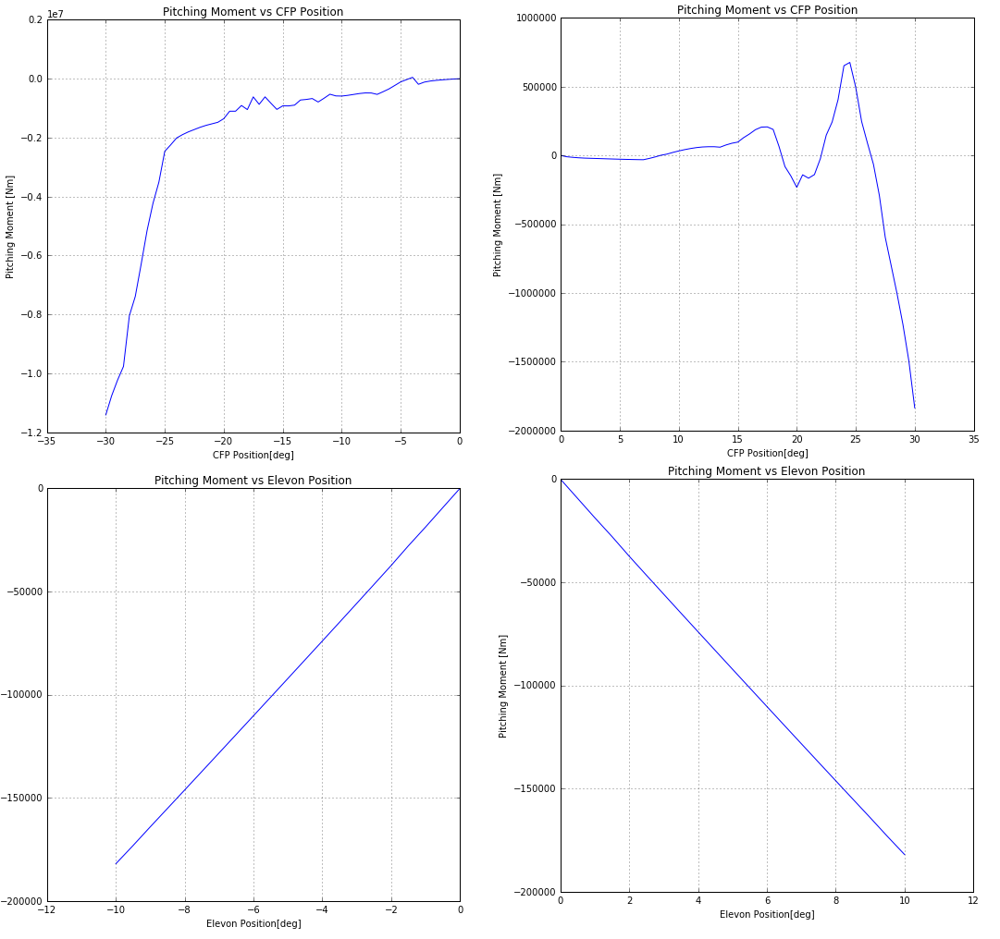

In [468]:
from IPython.display import Image
Image(filename='AOA for Control Surfaces.png')

In [469]:
def AutoPilot(AOA,CFPpa_s,CFPpa_p,Epa_s,Epa_p,q,AOA_target,CFPlimit,Elimit,dt):
    CFPs,CFPp,Es,Ep = 0.0,0.0,0.0,0.0
    if abs(AOA-AOA_target) > 1.0/180.0*math.pi:
        q_target = -1.0*(AOA-AOA_target)*2.0
        CFPs_target = -1.0*(q-q_target)
        CFPp_target = -1.0*(q-q_target)
        Es_target = 1.0*(q-q_target)
        Ep_target = 1.0*(q-q_target)
        if CFPs_target > CFPlimit[1]:
            CFPs_target = CFPlimit[1]
        if CFPs_target < CFPlimit[0]:
            CFPs_target = CFPlimit[0]
        if CFPp_target > CFPlimit[1]:
            CFPp_target = CFPlimit[1]
        if CFPp_target < CFPlimit[0]:
            CFPp_target = CFPlimit[0]
        if Es_target > Elimit[1]:
            Es_target = Elimit[1]
        if Es_target < Elimit[0]:
            Es_target = Elimit[0]
        if Ep_target > Elimit[1]:
            Ep_target = Elimit[1]
        if Ep_target < Elimit[0]:
            Ep_target = Elimit[0]
        CFPs = -1.0*(CFPpa_s-CFPs_target)/math.pi*180.0/1.5
        CFPp = -1.0*(CFPpa_p-CFPp_target)/math.pi*180.0/1.5
        Es = -1.0*(Epa_s-Es_target)/math.pi*180.0/1.5
        Ep = -1.0*(Epa_p-Ep_target)/math.pi*180.0/1.5
    else:
        q_target = -1.0*(AOA-AOA_target)*2.0 
        CFPs = -1.0*(q-q_target)/1.5/math.pi*180.0
        CFPp = -1.0*(q-q_target)/1.5/math.pi*180.0
        Es = 1.0*(q-q_target)/1.5/math.pi*180.0
        Ep = 1.0*(q-q_target)/1.5/math.pi*180.0
        CFPs_target, CFPp_target, Es_target, Ep_target = 0.0,0.0,0.0,0.0
    if CFPs > 1:
        CFPs = 1
    if CFPp > 1:
        CFPp = 1
    if Es > 1:
        Es = 1
    if Ep > 1:
        Ep = 1
    if CFPs < -1:
        CFPs = -1
    if CFPp < -1:
        CFPp = -1
    if Es < -1:
        Es = -1
    if Ep < -1:
        Ep = -1
    return CFPs,CFPp,Es,Ep,q_target,CFPs_target,Es_target

In [470]:
# Test at 3500m, rho = 1.2754*0.7048, mu = 1.943*10^(-5)*rho, c = 326.6m/s
# Initialize Parameters:
rho = 1.2754*0.7048
mu = 1.943*(10.0**(-5.0))*rho
Ma = 0.3
c = 326.6 # Speed of Sound
g = 9.8
U_inf = Ma*c
# Time Step:
T_rough = 10.0
dt = Grid/U_inf
Nt = int(T_rough/dt)
T = dt*Nt
# Define Separation Vortex and Wake Vortex:
SVnum = (CFPpanelnum_sp+DWpanelnum_sp)*2
WVnum = SVnum
SVpointsnum = int(SVnum*int((20.0-CFPP)/U_inf/dt))
WVpointsnum = SVpointsnum
OldGamma = np.zeros(totpanelnum)
# Separation Vortex and Wake Vortex Parameters:
# [0-8] xm,ym,zm,x1n,y1n,z1n,x2n,y2n,z2n,[9-11] u,v,w,[12] Strength
SVpoints = np.zeros((SVpointsnum,13))
WVpoints = np.zeros((WVpointsnum,13))
SVpointer = 0
WVpointer = 0
w = 6000.0 # Aircraft Weight 
TotalLift = 18000.0 # Initialize total lift to make convergence faster
dh = 0.0
AOA = 0.0/180.0*math.pi # Initialize Angle of Attack
RA = 0.0/180.0*math.pi # Initialize Roll Angle
dhdt = 0.0
# Moment of Inertia: Using Empirical Relations. See Ref[5] for Details
kx, ky, kz = 0.15, 0.185, 0.26 # Coefficient
b = DW_span # Primary Wing Span
L = 15.0 # Aircraft Total Length
Ix = w*(kx*b)**2.0
Iy = w*(ky*L)**2.0
Iz = w*(kz*(b+L)/2.0)**2.0
MX = 0.0
MY = 0.0
MZ = 0.0
p,q,r,q_target = 0.0,0.0,0.0,0.0
CG = [11.0,0.0,0.0] # Center of Gravity Position
CSRM = math.pi*2.0 # Control Surface Rotational Motion
# Control Surfaces Limit:
CFPlimit = [-20.0/180.0*math.pi,18.0/180.0*math.pi]
Elimit = [-10.0/180.0*math.pi,10.0/180.0*math.pi]
# Zero Control Surfaces:
CFPpa_s = 0.0
CFPpa_p = 0.0
Epa_s = 0.0
Epa_p = 0.0
CFPs_target,CFPp_target,Es_target,Ep_target = 0.0,0.0,0.0,0.0
# Zero Control Signals: 
CFPp = 0.0 # CFP Port Control Signal: 1 = moves up, -1 = moves down, 0 = stop
CFPs = 0.0 # CFP Starboard Control Signal
Ep = 0.0 # Elevon Port Control Signal
Es = 0.0 # Elevon Starboard Signal
# Data Record Matrices:
# Lift on Wings History:
# Time,CFPstarboardlift,CFPportlift,DWstarboardlift,DWportlift,total lift
LiftHis = np.zeros((Nt,6)) 
# Control Signal and Control Surface:
# Time,TPF,CFPp,CFPs,Ep,Es,CFPpa_s,CFPpa_p,Epa_s,Epa_p
CtrlS = np.zeros((Nt,10))
# Flying Attitude:
# Time, AOA,RA, p,q,r,Mx,My,Mz
FAtt = np.zeros((Nt,9))
# Flow Field Stable Time:
FFST = [0.45,0.5]

******************** Waiting for Flow Field Stable ********************
t =  0.0 time step =  0
Tests will start at t =  0.5
******************** Waiting for Flow Field Stable ********************
t =  0.010206164523372117 time step =  1
Tests will start at t =  0.5
******************** Waiting for Flow Field Stable ********************
t =  0.020412329046744233 time step =  2
Tests will start at t =  0.5
******************** Waiting for Flow Field Stable ********************
t =  0.03061849357011635 time step =  3
Tests will start at t =  0.5
******************** Waiting for Flow Field Stable ********************
t =  0.04082465809348847 time step =  4
Tests will start at t =  0.5
******************** Waiting for Flow Field Stable ********************
t =  0.05103082261686058 time step =  5
Tests will start at t =  0.5
******************** Waiting for Flow Field Stable ********************
t =  0.0612369871402327 time step =  6
Tests will start at t =  0.5
******************** Waiting

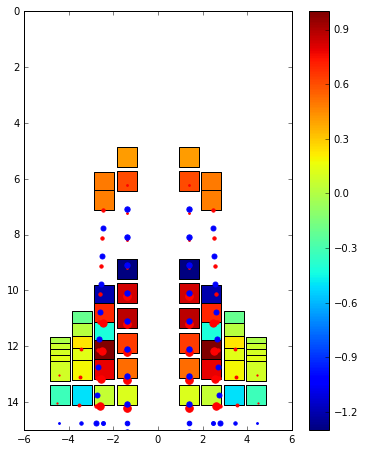

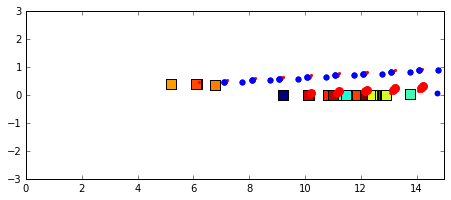

******************** New Time Step ********************
t =  0.5103082261686058 time step =  50
AOA =  -0.0140986769771 RA =  359.999872968
Pitching Rate =  -0.280997341931 Pitching Moment =  -22202.1094755
q_target =  0.0281973539542 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1762.10151115 CFP Port Lift =  1762.38390753
DW Starboard Lift =  2826.04314835 DW Port Lift =  2828.53685763
Total Lift =  9179.06542466
CFP Starboard Control Input =  0.206129797257 CFP Port Control Input =  0.206129797257
Elevon Starboard Control Input =  -0.206129797257 Elevon Port Control Input =  -0.206129797257
CFP angle: 1.73992420189 1.73992420189 Elevon angle: -1.73992420189 -1.73992420189


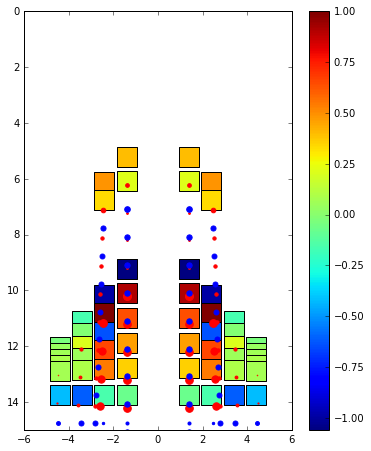

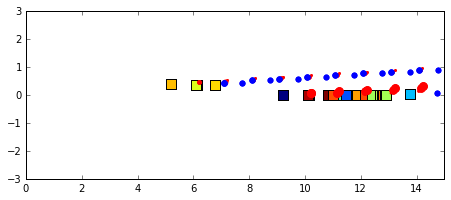

******************** New Time Step ********************
t =  0.5205143906919779 time step =  51
AOA =  -0.0151860242548 RA =  359.999829191
Pitching Rate =  -0.10653828627 Pitching Moment =  -8417.78316773
q_target =  0.0303720485096 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1553.69191087 CFP Port Lift =  1554.0222891
DW Starboard Lift =  2948.5948688 DW Port Lift =  2951.29133712
Total Lift =  9007.60040588
CFP Starboard Control Input =  0.0912735565194 CFP Port Control Input =  0.0912735565194
Elevon Starboard Control Input =  -0.0912735565194 Elevon Port Control Input =  -0.0912735565194
CFP angle: 2.0752832583 2.0752832583 Elevon angle: -2.0752832583 -2.0752832583


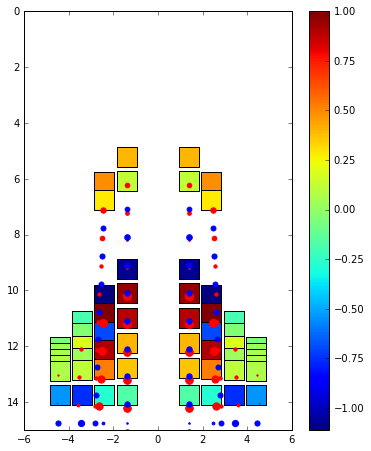

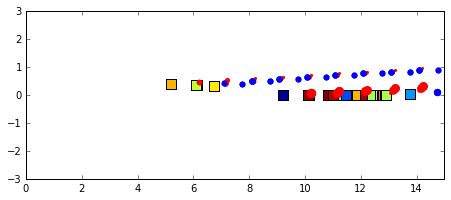

******************** New Time Step ********************
t =  0.5307205552153501 time step =  52
AOA =  -0.0143983080882 RA =  359.999778805
Pitching Rate =  0.0771804300055 Pitching Moment =  6098.1657142
q_target =  0.0287966161763 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1257.7145352 CFP Port Lift =  1257.99108912
DW Starboard Lift =  3904.67217637 DW Port Lift =  3907.07928781
Total Lift =  10327.4570885
CFP Starboard Control Input =  -0.0322558758861 CFP Port Control Input =  -0.0322558758861
Elevon Starboard Control Input =  0.0322558758861 Elevon Port Control Input =  0.0322558758861
CFP angle: 1.95676809889 1.95676809889 Elevon angle: -1.95676809889 -1.95676809889


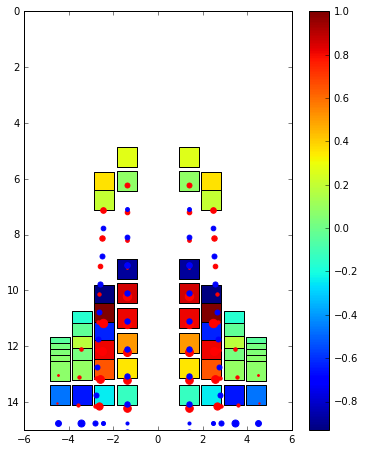

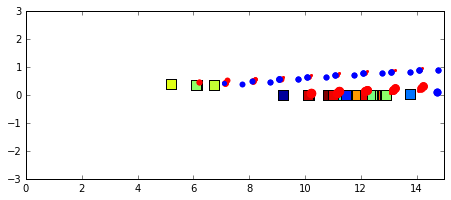

******************** New Time Step ********************
t =  0.5409267197387222 time step =  53
AOA =  -0.0122920372587 RA =  359.999722536
Pitching Rate =  0.206372415867 Pitching Moment =  16305.8587612
q_target =  0.0245840745175 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1002.2601686 CFP Port Lift =  1002.50610642
DW Starboard Lift =  4756.29992986 DW Port Lift =  4758.66292341
Total Lift =  11519.7291283
CFP Starboard Control Input =  -0.121192227567 CFP Port Control Input =  -0.121192227567
Elevon Starboard Control Input =  0.121192227567 Elevon Port Control Input =  0.121192227567
CFP angle: 1.51148128603 1.51148128603 Elevon angle: -1.51148128603 -1.51148128603


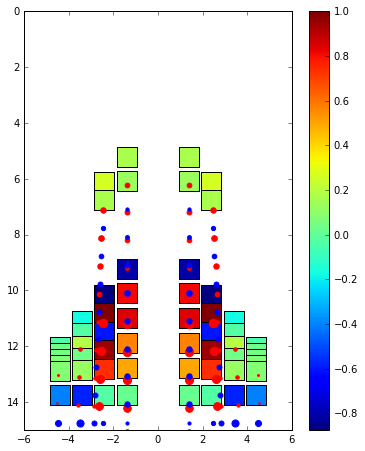

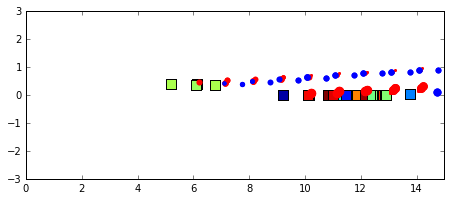

******************** New Time Step ********************
t =  0.5511328842620943 time step =  54
AOA =  -0.00991153850362 RA =  359.999660852
Pitching Rate =  0.233241268026 Pitching Moment =  18428.8154874
q_target =  0.0198230770072 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  918.711491279 CFP Port Lift =  918.930859311
DW Starboard Lift =  5298.48409427 DW Port Lift =  5300.70089065
Total Lift =  12436.8273355
CFP Starboard Control Input =  -0.142278794012 CFP Port Control Input =  -0.142278794012
Elevon Starboard Control Input =  0.142278794012 Elevon Port Control Input =  0.142278794012
CFP angle: 0.988717805276 0.988717805276 Elevon angle: -0.988717805276 -0.988717805276


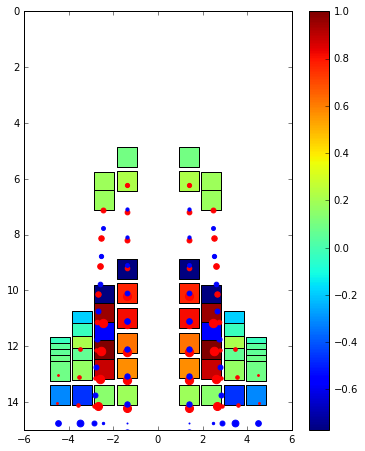

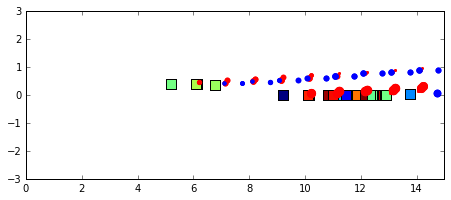

******************** New Time Step ********************
t =  0.5613390487854664 time step =  55
AOA =  -0.00808396845954 RA =  359.999594209
Pitching Rate =  0.17906531292 Pitching Moment =  14148.2750455
q_target =  0.0161679369191 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  974.232523726 CFP Port Lift =  974.445900433
DW Starboard Lift =  5291.92954942 DW Port Lift =  5294.07327153
Total Lift =  12534.6812451
CFP Starboard Control Input =  -0.108598250667 CFP Port Control Input =  -0.108598250667
Elevon Starboard Control Input =  0.108598250667 Elevon Port Control Input =  0.108598250667
CFP angle: 0.589704024503 0.589704024503 Elevon angle: -0.589704024503 -0.589704024503


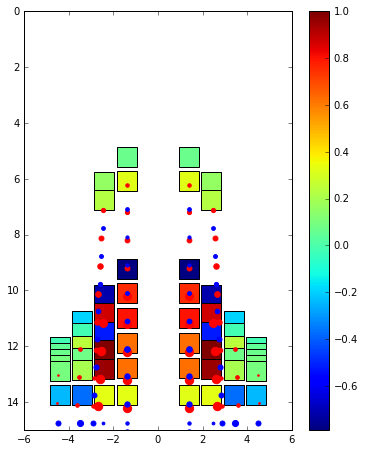

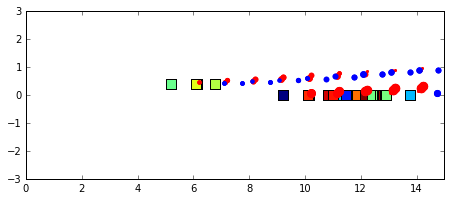

******************** New Time Step ********************
t =  0.5715452133088386 time step =  56
AOA =  -0.00724128623318 RA =  359.999522896
Pitching Rate =  0.0825660045386 Pitching Moment =  6523.6897229
q_target =  0.0144825724664 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1099.16029717 CFP Port Lift =  1099.38656025
DW Starboard Lift =  4960.90029753 DW Port Lift =  4962.99293818
Total Lift =  12122.4400931
CFP Starboard Control Input =  -0.0453889547148 CFP Port Control Input =  -0.0453889547148
Elevon Starboard Control Input =  0.0453889547148 Elevon Port Control Input =  0.0453889547148
CFP angle: 0.422935054333 0.422935054333 Elevon angle: -0.422935054333 -0.422935054333


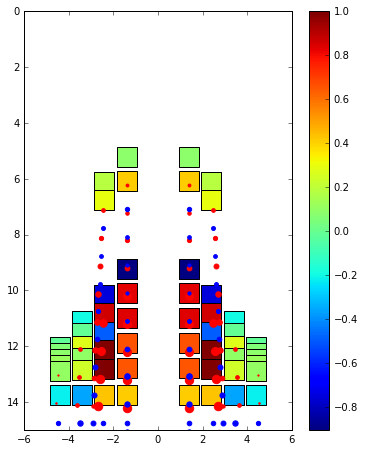

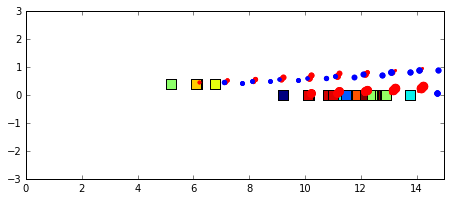

******************** New Time Step ********************
t =  0.5817513778322106 time step =  57
AOA =  -0.00731640451196 RA =  359.99944706
Pitching Rate =  -0.00736008895503 Pitching Moment =  -581.53397326
q_target =  0.0146328090239 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1202.84042107 CFP Port Lift =  1203.06609862
DW Starboard Lift =  4560.10018057 DW Port Lift =  4562.09621226
Total Lift =  11528.1029125
CFP Starboard Control Input =  0.014661931986 CFP Port Control Input =  0.014661931986
Elevon Starboard Control Input =  -0.014661931986 Elevon Port Control Input =  -0.014661931986
CFP angle: 0.476806206761 0.476806206761 Elevon angle: -0.476806206761 -0.476806206761


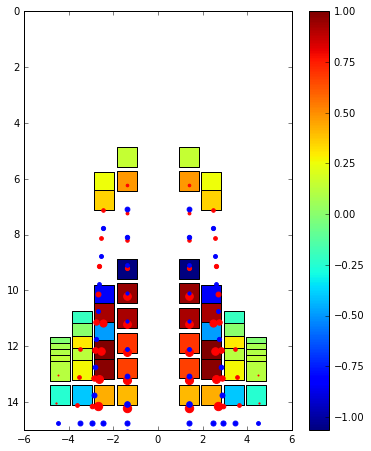

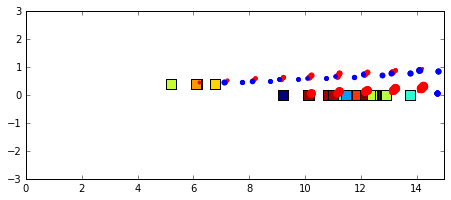

******************** New Time Step ********************
t =  0.5919575423555827 time step =  58
AOA =  -0.00796758737991 RA =  359.999366885
Pitching Rate =  -0.0638028974015 Pitching Moment =  -5041.18260773
q_target =  0.0159351747598 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1270.55934951 CFP Port Lift =  1270.77637748
DW Starboard Lift =  4252.27735257 DW Port Lift =  4254.14676117
Total Lift =  11047.7598407
CFP Starboard Control Input =  0.0531587147742 CFP Port Control Input =  0.0531587147742
Elevon Starboard Control Input =  -0.0531587147742 Elevon Port Control Input =  -0.0531587147742
CFP angle: 0.672122978742 0.672122978742 Elevon angle: -0.672122978742 -0.672122978742


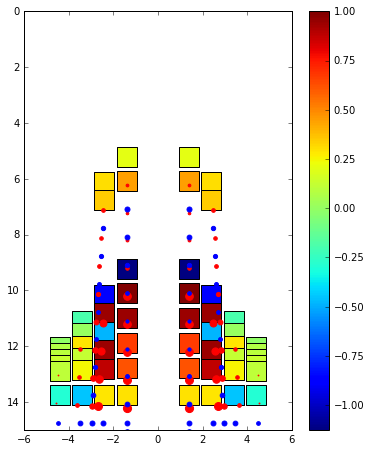

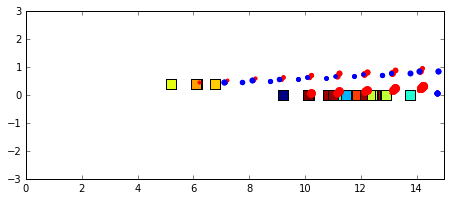

******************** New Time Step ********************
t =  0.6021637068789549 time step =  59
AOA =  -0.00876485699855 RA =  359.999282594
Pitching Rate =  -0.0781164772347 Pitching Moment =  -6172.12450297
q_target =  0.0175297139971 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1291.86123126 CFP Port Lift =  1292.07509773
DW Starboard Lift =  4098.2532125 DW Port Lift =  4100.0772935
Total Lift =  10782.266835
CFP Starboard Control Input =  0.0637641274879 CFP Port Control Input =  0.0637641274879
Elevon Starboard Control Input =  -0.0637641274879 Elevon Port Control Input =  -0.0637641274879
CFP angle: 0.906406362041 0.906406362041 Elevon angle: -0.906406362041 -0.906406362041


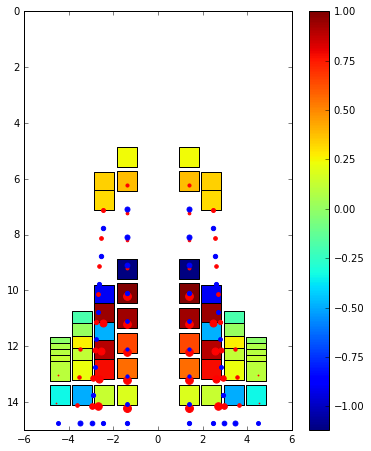

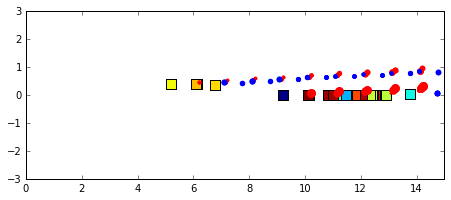

******************** New Time Step ********************
t =  0.612369871402327 time step =  60
AOA =  -0.00935679943745 RA =  359.999194304
Pitching Rate =  -0.0579985201635 Pitching Moment =  -4582.56823796
q_target =  0.0187135988749 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1267.24582832 CFP Port Lift =  1267.46223696
DW Starboard Lift =  4090.85582808 DW Port Lift =  4092.7627518
Total Lift =  10718.3266452
CFP Starboard Control Input =  0.0511414126923 CFP Port Control Input =  0.0511414126923
Elevon Starboard Control Input =  -0.0511414126923 Elevon Port Control Input =  -0.0511414126923
CFP angle: 1.09431112392 1.09431112392 Elevon angle: -1.09431112392 -1.09431112392


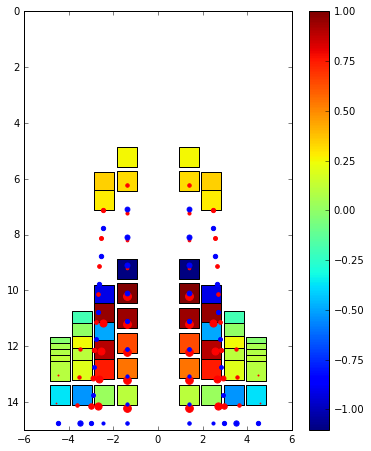

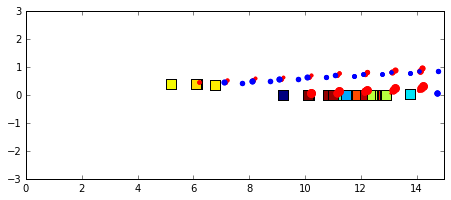

******************** New Time Step ********************
t =  0.6225760359256991 time step =  61
AOA =  -0.00956298278652 RA =  359.999101965
Pitching Rate =  -0.0202018445412 Pitching Moment =  -1596.18436612
q_target =  0.019125965573 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1200.32259436 CFP Port Lift =  1200.49340336
DW Starboard Lift =  4239.90124781 DW Port Lift =  4241.60099666
Total Lift =  10882.3182422
CFP Starboard Control Input =  0.0262185400762 CFP Port Control Input =  0.0262185400762
Elevon Starboard Control Input =  -0.0262185400762 Elevon Port Control Input =  -0.0262185400762
CFP angle: 1.19064378801 1.19064378801 Elevon angle: -1.19064378801 -1.19064378801


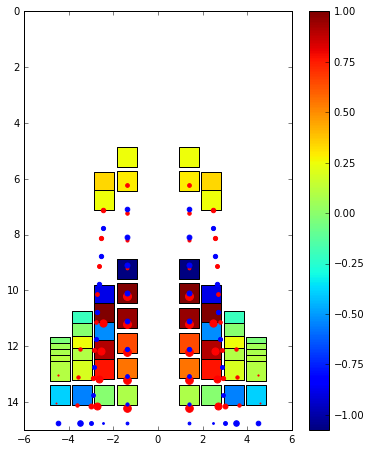

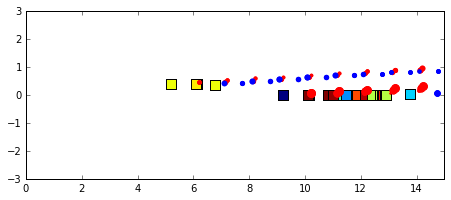

******************** New Time Step ********************
t =  0.6327822004490712 time step =  62
AOA =  -0.0093819853681 RA =  359.999005969
Pitching Rate =  0.017734127056 Pitching Moment =  1401.20553327
q_target =  0.0187639707362 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1148.71153264 CFP Port Lift =  1148.91369557
DW Starboard Lift =  4384.48971792 DW Port Lift =  4386.41836406
Total Lift =  11068.5333102
CFP Starboard Control Input =  0.000686562453499 CFP Port Control Input =  0.000686562453499
Elevon Starboard Control Input =  -0.000686562453499 Elevon Port Control Input =  -0.000686562453499
CFP angle: 1.19316636898 1.19316636898 Elevon angle: -1.19316636898 -1.19316636898


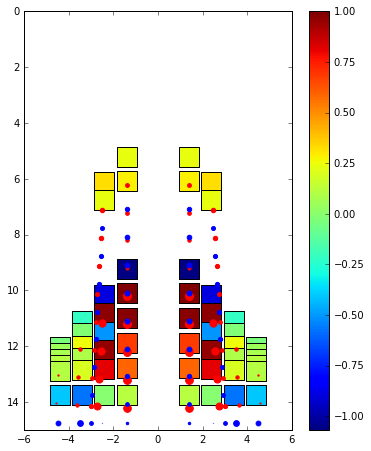

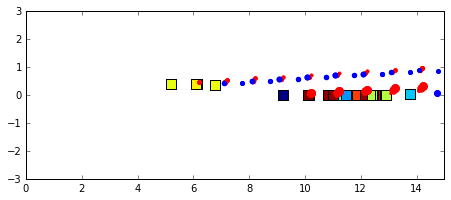

******************** New Time Step ********************
t =  0.6429883649724434 time step =  63
AOA =  -0.00894429695987 RA =  359.998906053
Pitching Rate =  0.0428847102387 Pitching Moment =  3388.39871224
q_target =  0.0178885939197 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1088.64352204 CFP Port Lift =  1088.77095094
DW Starboard Lift =  4591.88218505 DW Port Lift =  4593.42247122
Total Lift =  11362.7191292
CFP Starboard Control Input =  -0.016664077546 CFP Port Control Input =  -0.016664077546
Elevon Starboard Control Input =  0.016664077546 Elevon Port Control Input =  0.016664077546
CFP angle: 1.13193889484 1.13193889484 Elevon angle: -1.13193889484 -1.13193889484


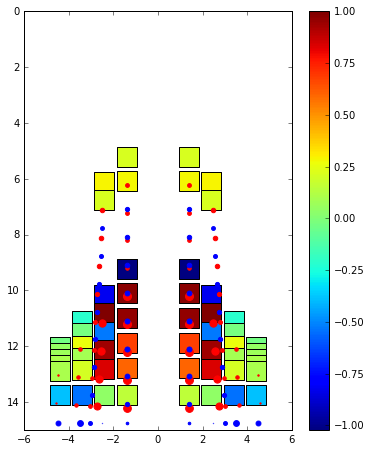

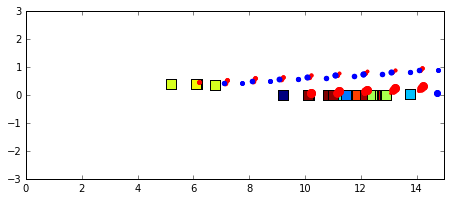

******************** New Time Step ********************
t =  0.6531945294958155 time step =  64
AOA =  -0.00841669132454 RA =  359.99880288
Pitching Rate =  0.0516948001496 Pitching Moment =  4084.49989009
q_target =  0.0168333826491 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1072.57742479 CFP Port Lift =  1072.7341377
DW Starboard Lift =  4659.86449401 DW Port Lift =  4661.48665139
Total Lift =  11466.6627079
CFP Starboard Control Input =  -0.0232409450003 CFP Port Control Input =  -0.0232409450003
Elevon Starboard Control Input =  0.0232409450003 Elevon Port Control Input =  0.0232409450003
CFP angle: 1.04654656783 1.04654656783 Elevon angle: -1.04654656783 -1.04654656783


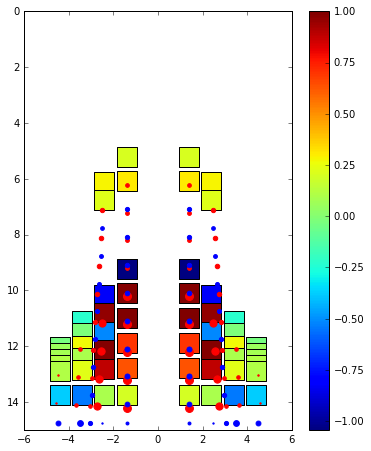

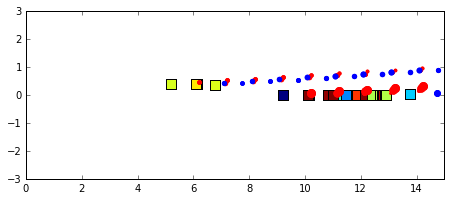

******************** New Time Step ********************
t =  0.6634006940191876 time step =  65
AOA =  -0.0079608920129 RA =  359.998696402
Pitching Rate =  0.0446592165542 Pitching Moment =  3528.60567367
q_target =  0.0159217840258 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1243.82114993 CFP Port Lift =  1244.68886765
DW Starboard Lift =  3945.90436303 DW Port Lift =  3953.26491269
Total Lift =  10387.6792933
CFP Starboard Control Input =  -0.0191582883523 CFP Port Control Input =  -0.0191582883523
Elevon Starboard Control Input =  0.0191582883523 Elevon Port Control Input =  0.0191582883523
CFP angle: 0.976154816383 0.976154816383 Elevon angle: -0.976154816383 -0.976154816383


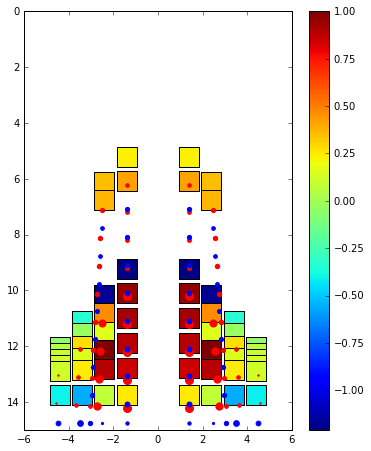

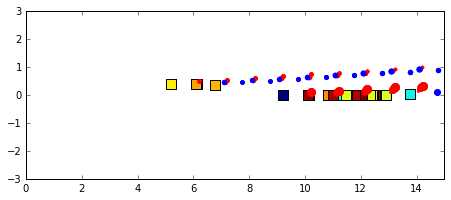

******************** New Time Step ********************
t =  0.6736068585425597 time step =  66
AOA =  -0.00757033155293 RA =  359.998577825
Pitching Rate =  0.0382671138678 Pitching Moment =  3023.5540506
q_target =  0.0151406631059 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1133.28511473 CFP Port Lift =  1133.35506365
DW Starboard Lift =  4112.35329083 DW Port Lift =  4115.92654101
Total Lift =  10494.9200102
CFP Starboard Control Input =  -0.0154176338413 CFP Port Control Input =  -0.0154176338413
Elevon Starboard Control Input =  0.0154176338413 Elevon Port Control Input =  0.0154176338413
CFP angle: 0.919507049667 0.919507049667 Elevon angle: -0.919507049667 -0.919507049667


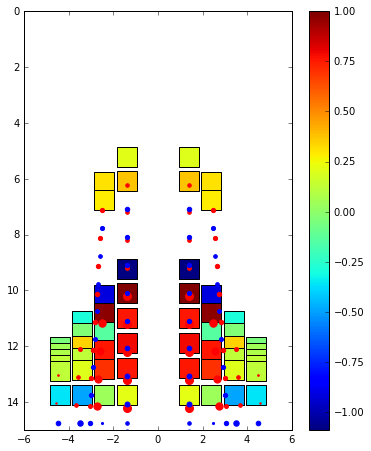

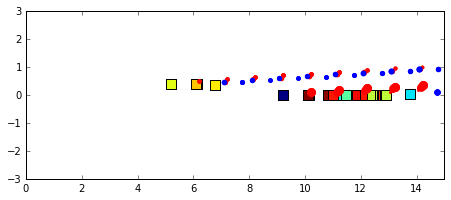

******************** New Time Step ********************
t =  0.6838130230659318 time step =  67
AOA =  -0.00712965806284 RA =  359.998452287
Pitching Rate =  0.0431771885595 Pitching Moment =  3411.50795468
q_target =  0.0142593161257 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1078.64640701 CFP Port Lift =  1078.74584059
DW Starboard Lift =  4280.35369391 DW Port Lift =  4281.94793553
Total Lift =  10719.693877
CFP Starboard Control Input =  -0.0192785816225 CFP Port Control Input =  -0.0192785816225
Elevon Starboard Control Input =  0.0192785816225 Elevon Port Control Input =  0.0192785816225
CFP angle: 0.848673314373 0.848673314373 Elevon angle: -0.848673314373 -0.848673314373


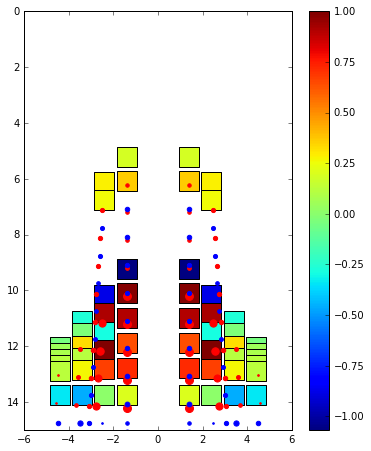

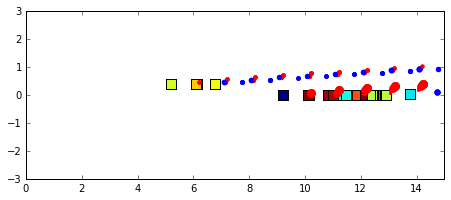

******************** New Time Step ********************
t =  0.6940191875893039 time step =  68
AOA =  -0.00673753666703 RA =  359.99832262
Pitching Rate =  0.0384200543616 Pitching Moment =  3035.63815632
q_target =  0.0134750733341 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1040.43736321 CFP Port Lift =  1040.41987021
DW Starboard Lift =  4729.97102431 DW Port Lift =  4729.76888051
Total Lift =  11540.5971382
CFP Starboard Control Input =  -0.0166299873517 CFP Port Control Input =  -0.0166299873517
Elevon Starboard Control Input =  0.0166299873517 Elevon Port Control Input =  0.0166299873517
CFP angle: 0.787571095077 0.787571095077 Elevon angle: -0.787571095077 -0.787571095077


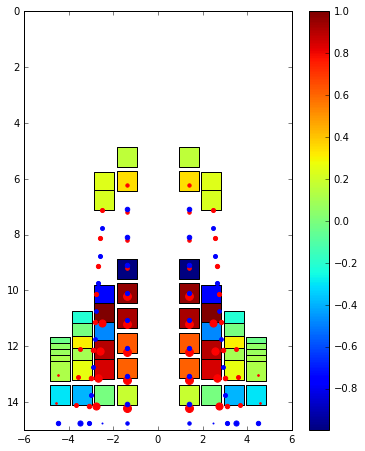

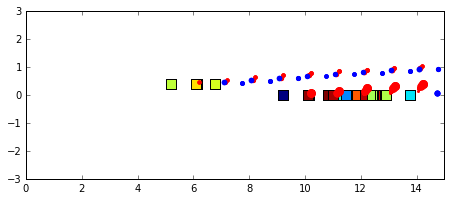

******************** New Time Step ********************
t =  0.704225352112676 time step =  69
AOA =  -0.00651268116899 RA =  359.99819201
Pitching Rate =  0.0220313416974 Pitching Moment =  1740.73625357
q_target =  0.013025362338 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1047.72236326 CFP Port Lift =  1047.72684802
DW Starboard Lift =  4894.29588379 DW Port Lift =  4893.85237559
Total Lift =  11883.5974707
CFP Starboard Control Input =  -0.0060039862396 CFP Port Control Input =  -0.0060039862396
Elevon Starboard Control Input =  0.0060039862396 Elevon Port Control Input =  0.0060039862396
CFP angle: 0.765511133388 0.765511133388 Elevon angle: -0.765511133388 -0.765511133388


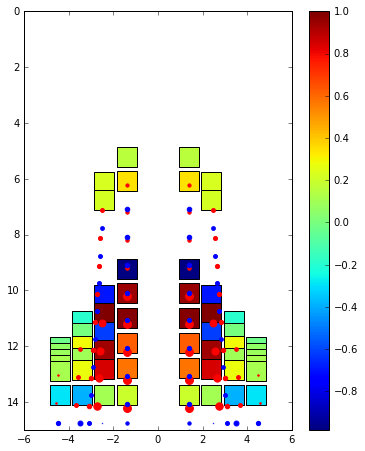

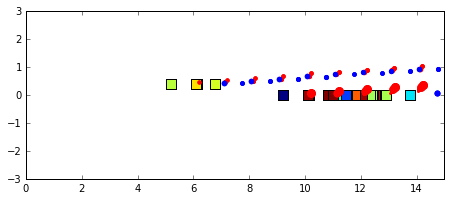

******************** New Time Step ********************
t =  0.7144315166360482 time step =  70
AOA =  -0.00656340540822 RA =  359.998061506
Pitching Rate =  -0.00496996095936 Pitching Moment =  -392.685626669
q_target =  0.0131268108164 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1125.89012072 CFP Port Lift =  1126.00051805
DW Starboard Lift =  4863.98787913 DW Port Lift =  4864.31951097
Total Lift =  11980.1980289
CFP Starboard Control Input =  0.0120645145172 CFP Port Control Input =  0.0120645145172
Elevon Starboard Control Input =  -0.0120645145172 Elevon Port Control Input =  -0.0120645145172
CFP angle: 0.809838804609 0.809838804609 Elevon angle: -0.809838804609 -0.809838804609


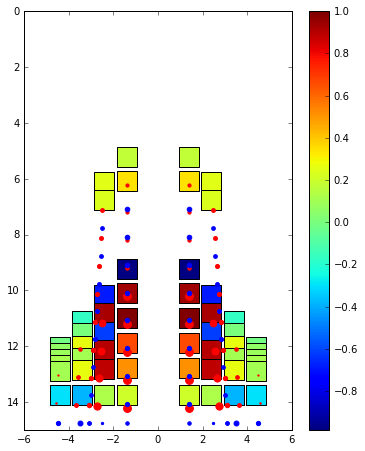

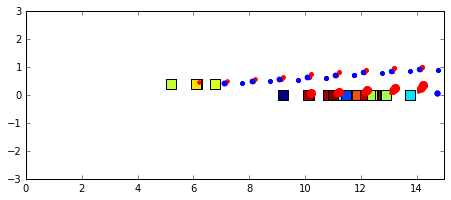

******************** New Time Step ********************
t =  0.7246376811594203 time step =  71
AOA =  -0.00682889770522 RA =  359.997930169
Pitching Rate =  -0.0260129352604 Pitching Moment =  -2055.3291802
q_target =  0.0136577954104 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1195.42727244 CFP Port Lift =  1195.60369385
DW Starboard Lift =  4602.55053304 DW Port Lift =  4604.02274363
Total Lift =  11597.604243
CFP Starboard Control Input =  0.0264471537806 CFP Port Control Input =  0.0264471537806
Elevon Starboard Control Input =  -0.0264471537806 Elevon Port Control Input =  -0.0264471537806
CFP angle: 0.907011445566 0.907011445566 Elevon angle: -0.907011445566 -0.907011445566


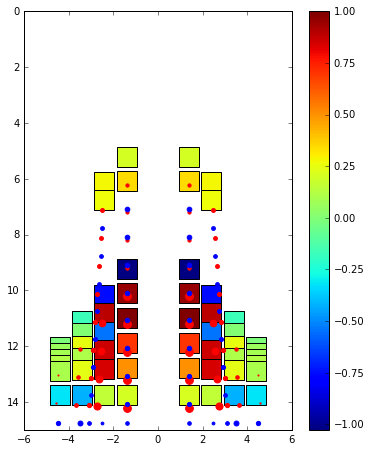

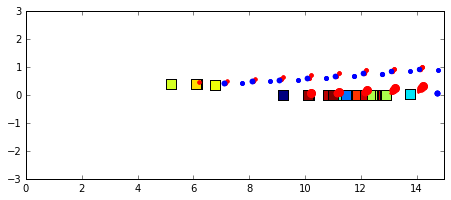

******************** New Time Step ********************
t =  0.7348438456827924 time step =  72
AOA =  -0.00715284696014 RA =  359.997796266
Pitching Rate =  -0.0317405479964 Pitching Moment =  -2507.87824747
q_target =  0.0143056939203 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1234.79927767 CFP Port Lift =  1235.02569275
DW Starboard Lift =  4282.869963 DW Port Lift =  4285.29155218
Total Lift =  11037.9864856
CFP Starboard Control Input =  0.0306974946111 CFP Port Control Input =  0.0306974946111
Elevon Starboard Control Input =  -0.0306974946111 Elevon Port Control Input =  -0.0306974946111
CFP angle: 1.01980077053 1.01980077053 Elevon angle: -1.01980077053 -1.01980077053


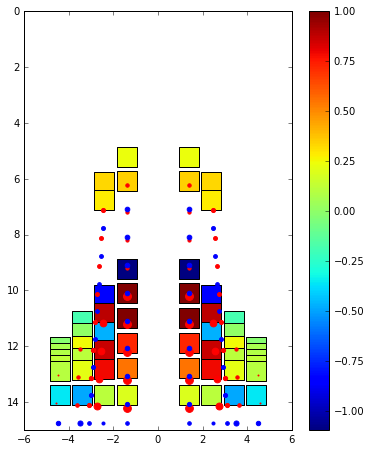

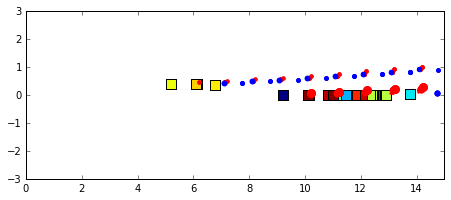

******************** New Time Step ********************
t =  0.7450500102061646 time step =  73
AOA =  -0.007330165756 RA =  359.997658043
Pitching Rate =  -0.0173736956188 Pitching Moment =  -1372.7271919
q_target =  0.014660331512 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1224.22499352 CFP Port Lift =  1224.45990984
DW Starboard Lift =  4126.43582301 DW Port Lift =  4129.22856779
Total Lift =  10704.3492942
CFP Starboard Control Input =  0.0213560180872 CFP Port Control Input =  0.0213560180872
Elevon Starboard Control Input =  -0.0213560180872 Elevon Port Control Input =  -0.0213560180872
CFP angle: 1.09826746283 1.09826746283 Elevon angle: -1.09826746283 -1.09826746283


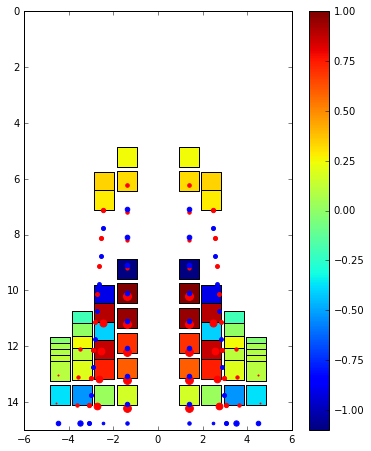

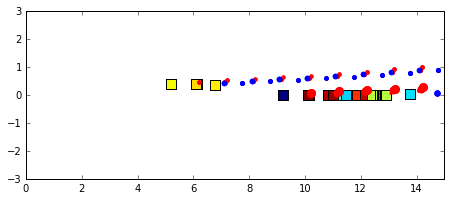

******************** New Time Step ********************
t =  0.7552561747295367 time step =  74
AOA =  -0.00722993525801 RA =  359.997514552
Pitching Rate =  0.00982058419291 Pitching Moment =  775.942163245
q_target =  0.014459870516 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1182.5954324 CFP Port Lift =  1182.8210884
DW Starboard Lift =  4165.41959151 DW Port Lift =  4168.2061886
Total Lift =  10699.0423009
CFP Starboard Control Input =  0.00309285754874 CFP Port Control Input =  0.00309285754874
Elevon Starboard Control Input =  -0.00309285754874 Elevon Port Control Input =  -0.00309285754874
CFP angle: 1.10963129951 1.10963129951 Elevon angle: -1.10963129951 -1.10963129951


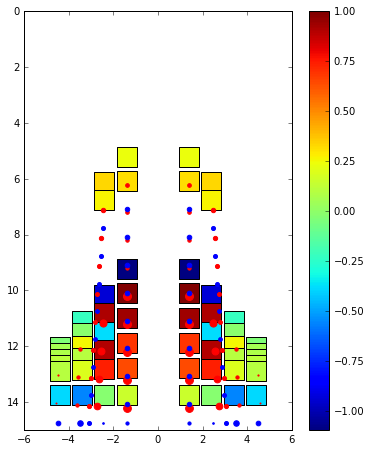

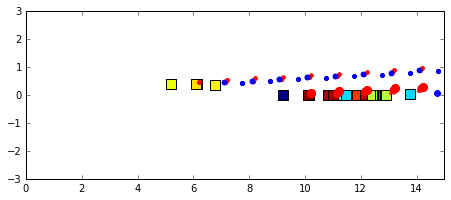

******************** New Time Step ********************
t =  0.7654623392529087 time step =  75
AOA =  -0.00686431170758 RA =  359.997365568
Pitching Rate =  0.0358237954712 Pitching Moment =  2830.50303399
q_target =  0.0137286234152 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1133.74831317 CFP Port Lift =  1133.94449876
DW Starboard Lift =  4323.76804009 DW Port Lift =  4326.28295819
Total Lift =  10917.7438102
CFP Starboard Control Input =  -0.014730114704 CFP Port Control Input =  -0.014730114704
Elevon Starboard Control Input =  0.014730114704 Elevon Port Control Input =  0.014730114704
CFP angle: 1.05550962882 1.05550962882 Elevon angle: -1.05550962882 -1.05550962882


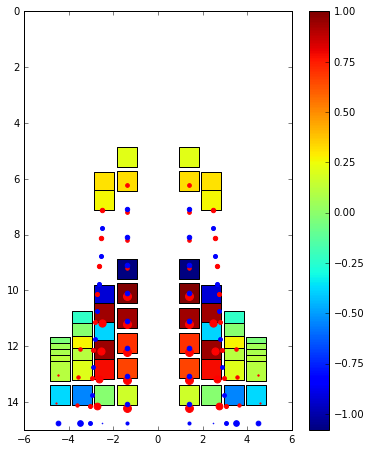

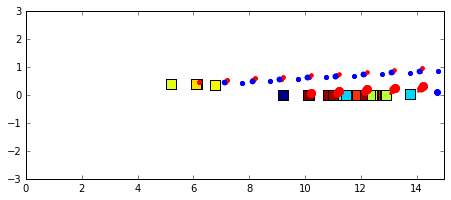

******************** New Time Step ********************
t =  0.7756685037762808 time step =  76
AOA =  -0.00636168869799 RA =  359.997211434
Pitching Rate =  0.0492470024796 Pitching Moment =  3891.09495797
q_target =  0.012723377396 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1099.90622151 CFP Port Lift =  1100.06688772
DW Starboard Lift =  4487.67969138 DW Port Lift =  4489.81227396
Total Lift =  11177.4650746
CFP Starboard Control Input =  -0.0243490833891 CFP Port Control Input =  -0.0243490833891
Elevon Starboard Control Input =  0.0243490833891 Elevon Port Control Input =  0.0243490833891
CFP angle: 0.96604575844 0.96604575844 Elevon angle: -0.96604575844 -0.96604575844


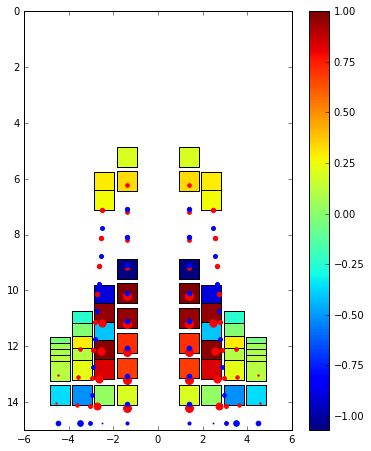

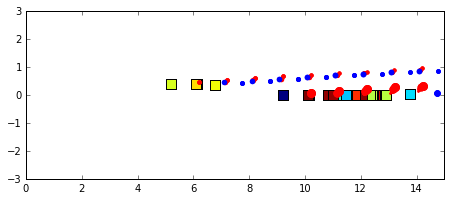

******************** New Time Step ********************
t =  0.785874668299653 time step =  77
AOA =  -0.00588719667398 RA =  359.997052784
Pitching Rate =  0.0464907285123 Pitching Moment =  3673.31675428
q_target =  0.011774393348 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1090.89753454 CFP Port Lift =  1091.02711374
DW Starboard Lift =  4599.2967218 DW Port Lift =  4601.03716258
Total Lift =  11382.2585327
CFP Starboard Control Input =  -0.0231442234429 CFP Port Control Input =  -0.0231442234429
Elevon Starboard Control Input =  0.0231442234429 Elevon Port Control Input =  0.0231442234429
CFP angle: 0.88100880764 0.88100880764 Elevon angle: -0.88100880764 -0.88100880764


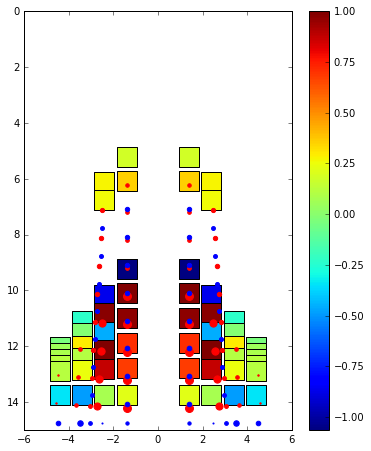

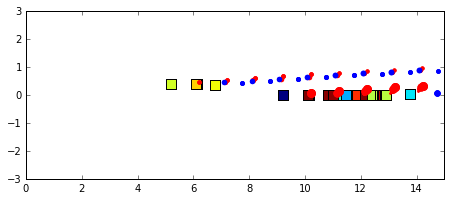

******************** New Time Step ********************
t =  0.7960808328230251 time step =  78
AOA =  -0.00556454203903 RA =  359.996890317
Pitching Rate =  0.0316137011333 Pitching Moment =  2497.85584683
q_target =  0.0111290840781 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1105.8851404 CFP Port Lift =  1106.00778532
DW Starboard Lift =  4625.8825604 DW Port Lift =  4627.41952863
Total Lift =  11465.1950147
CFP Starboard Control Input =  -0.0136564113701 CFP Port Control Input =  -0.0136564113701
Elevon Starboard Control Input =  0.0136564113701 Elevon Port Control Input =  0.0136564113701
CFP angle: 0.830832158393 0.830832158393 Elevon angle: -0.830832158393 -0.830832158393


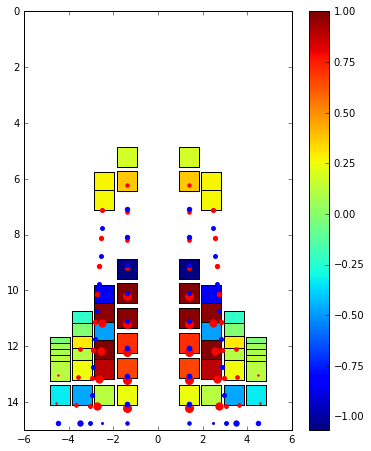

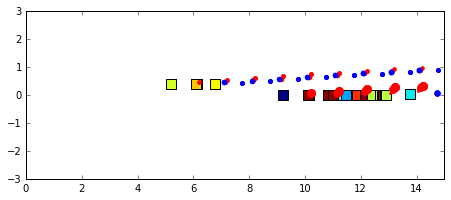

******************** New Time Step ********************
t =  0.8062869973463972 time step =  79
AOA =  -0.00544168211921 RA =  359.996724459
Pitching Rate =  0.0120378149435 Pitching Moment =  951.12958501
q_target =  0.0108833642384 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1132.35788726 CFP Port Lift =  1132.47747713
DW Starboard Lift =  4589.39059576 DW Port Lift =  4590.84661659
Total Lift =  11445.0725767
CFP Starboard Control Input =  -0.000769633803353 CFP Port Control Input =  -0.000769633803353
Elevon Starboard Control Input =  0.000769633803353 Elevon Port Control Input =  0.000769633803353
CFP angle: 0.828004355073 0.828004355073 Elevon angle: -0.828004355073 -0.828004355073


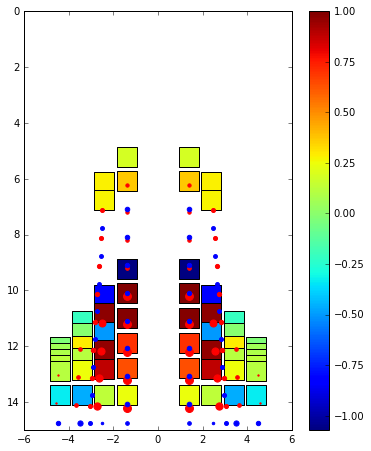

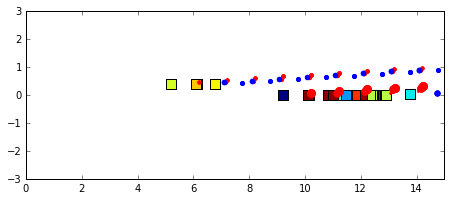

******************** New Time Step ********************
t =  0.8164931618697693 time step =  80
AOA =  -0.00548542853768 RA =  359.996555423
Pitching Rate =  -0.00428627408188 Pitching Moment =  -338.666286854
q_target =  0.0109708570754 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1159.15173038 CFP Port Lift =  1159.28512701
DW Starboard Lift =  4507.31407111 DW Port Lift =  4508.88256387
Total Lift =  11334.6334924
CFP Starboard Control Input =  0.0101714207715 CFP Port Control Input =  0.0101714207715
Elevon Starboard Control Input =  -0.0101714207715 Elevon Port Control Input =  -0.0101714207715
CFP angle: 0.865376384852 0.865376384852 Elevon angle: -0.865376384852 -0.865376384852


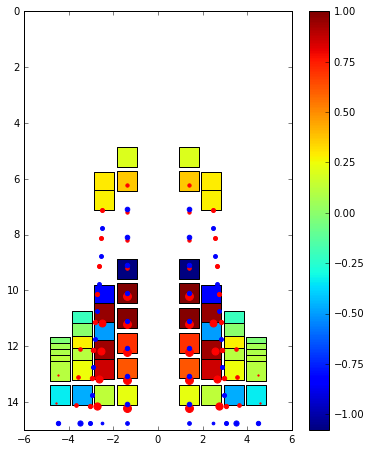

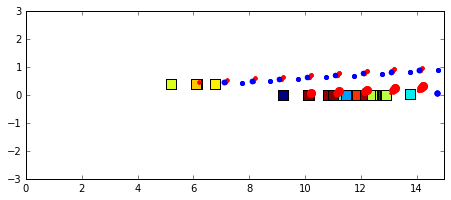

******************** New Time Step ********************
t =  0.8266993263931415 time step =  81
AOA =  -0.00561367247094 RA =  359.99638308
Pitching Rate =  -0.0125653405805 Pitching Moment =  -992.810342074
q_target =  0.0112273449419 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1190.99077225 CFP Port Lift =  1191.18874345
DW Starboard Lift =  4364.37078494 DW Port Lift =  4366.55676749
Total Lift =  11113.1070681
CFP Starboard Control Input =  0.0158617903482 CFP Port Control Input =  0.0158617903482
Elevon Starboard Control Input =  -0.0158617903482 Elevon Port Control Input =  -0.0158617903482
CFP angle: 0.923656079947 0.923656079947 Elevon angle: -0.923656079947 -0.923656079947


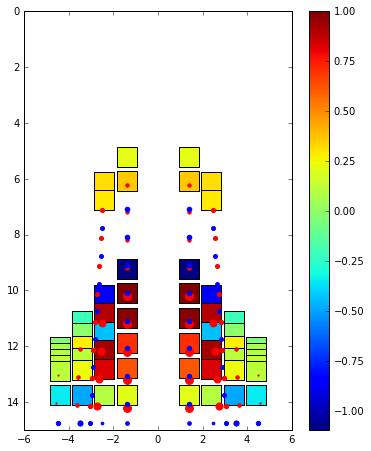

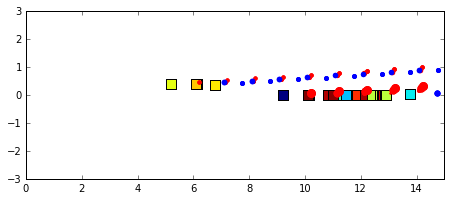

******************** New Time Step ********************
t =  0.8369054909165136 time step =  82
AOA =  -0.00572578898891 RA =  359.996206483
Pitching Rate =  -0.0109851764306 Pitching Moment =  -867.958707524
q_target =  0.0114515779778 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1185.83351886 CFP Port Lift =  1185.94855852
DW Starboard Lift =  4356.00619381 DW Port Lift =  4357.81393194
Total Lift =  11085.6022031
CFP Starboard Control Input =  0.0149578362723 CFP Port Control Input =  0.0149578362723
Elevon Starboard Control Input =  -0.0149578362723 Elevon Port Control Input =  -0.0149578362723
CFP angle: 0.978614449594 0.978614449594 Elevon angle: -0.978614449594 -0.978614449594


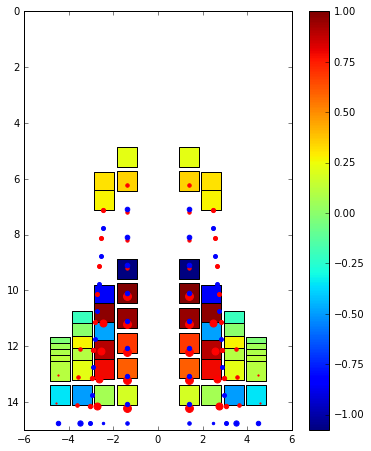

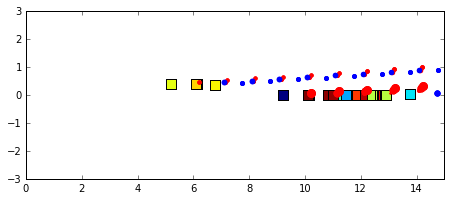

******************** New Time Step ********************
t =  0.8471116554398856 time step =  83
AOA =  -0.00572131335645 RA =  359.996026097
Pitching Rate =  0.00043852246798 Pitching Moment =  34.6484553008
q_target =  0.0114426267129 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1165.12684514 CFP Port Lift =  1165.24236778
DW Starboard Lift =  4393.34903249 DW Port Lift =  4394.93524886
Total Lift =  11118.6534943
CFP Starboard Control Input =  0.00733606949662 CFP Port Control Input =  0.00733606949662
Elevon Starboard Control Input =  -0.00733606949662 Elevon Port Control Input =  -0.00733606949662
CFP angle: 1.0055687772 1.0055687772 Elevon angle: -1.0055687772 -1.0055687772


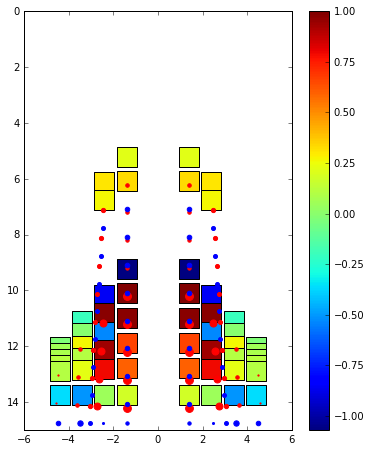

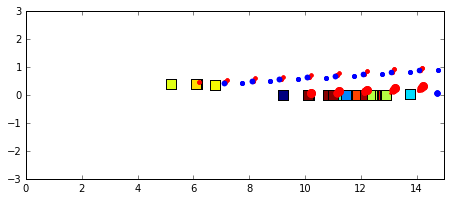

******************** New Time Step ********************
t =  0.8573178199632578 time step =  84
AOA =  -0.00559482816983 RA =  359.995842163
Pitching Rate =  0.0123930185855 Pitching Moment =  979.194868807
q_target =  0.0111896563397 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1151.07938185 CFP Port Lift =  1151.2028239
DW Starboard Lift =  4480.09797649 DW Port Lift =  4481.65841179
Total Lift =  11264.038594
CFP Starboard Control Input =  -0.000802241497245 CFP Port Control Input =  -0.000802241497245
Elevon Starboard Control Input =  0.000802241497245 Elevon Port Control Input =  0.000802241497245
CFP angle: 1.00262116606 1.00262116606 Elevon angle: -1.00262116606 -1.00262116606


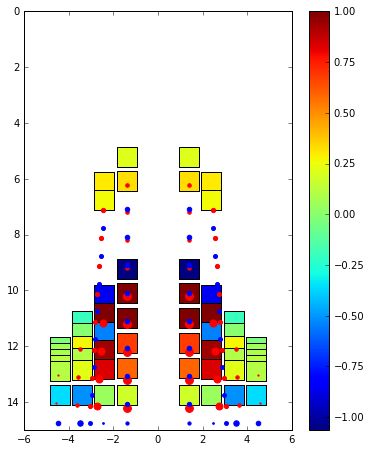

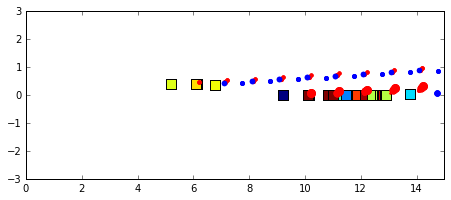

******************** New Time Step ********************
t =  0.8675239844866299 time step =  85
AOA =  -0.00538416269842 RA =  359.995654744
Pitching Rate =  0.0206410028887 Pitching Moment =  1630.88306341
q_target =  0.0107683253968 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1143.37757411 CFP Port Lift =  1143.51787165
DW Starboard Lift =  4506.44525523 DW Port Lift =  4508.25496733
Total Lift =  11301.5956683
CFP Starboard Control Input =  -0.00658178499459 CFP Port Control Input =  -0.00658178499459
Elevon Starboard Control Input =  0.00658178499459 Elevon Port Control Input =  0.00658178499459
CFP angle: 0.97843824508 0.97843824508 Elevon angle: -0.97843824508 -0.97843824508


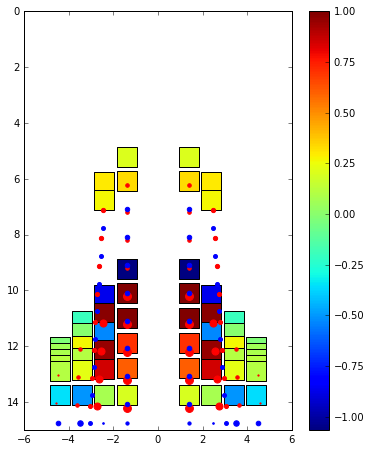

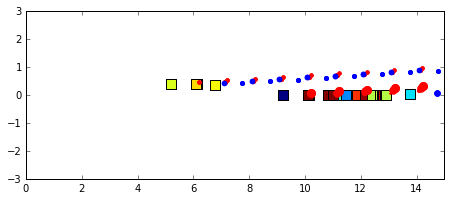

******************** New Time Step ********************
t =  0.877730149010002 time step =  86
AOA =  -0.00515993177856 RA =  359.99546353
Pitching Rate =  0.0219701455272 Pitching Moment =  1735.90103321
q_target =  0.0103198635571 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1150.0452088 CFP Port Lift =  1150.21277174
DW Starboard Lift =  4476.45531174 DW Port Lift =  4478.63068688
Total Lift =  11255.3439792
CFP Starboard Control Input =  -0.00776685464673 CFP Port Control Input =  -0.00776685464673
Elevon Starboard Control Input =  0.00776685464673 Elevon Port Control Input =  0.00776685464673
CFP angle: 0.949901118393 0.949901118393 Elevon angle: -0.949901118393 -0.949901118393


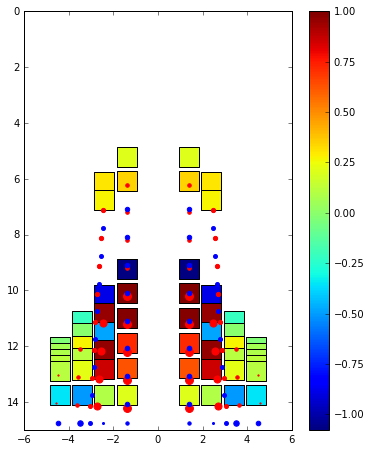

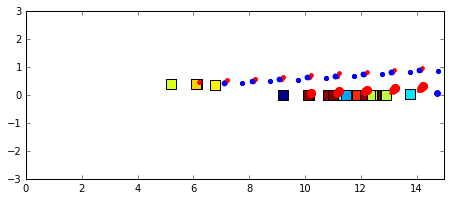

******************** New Time Step ********************
t =  0.8879363135333741 time step =  87
AOA =  -0.00496572727012 RA =  359.995267946
Pitching Rate =  0.0190281577374 Pitching Moment =  1503.44924368
q_target =  0.00993145454024 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1153.97973209 CFP Port Lift =  1154.14441529
DW Starboard Lift =  4434.61805186 DW Port Lift =  4436.93540164
Total Lift =  11179.6776009
CFP Starboard Control Input =  -0.00606446879812 CFP Port Control Input =  -0.00606446879812
Elevon Starboard Control Input =  0.00606446879812 Elevon Port Control Input =  0.00606446879812
CFP angle: 0.927618930525 0.927618930525 Elevon angle: -0.927618930525 -0.927618930525


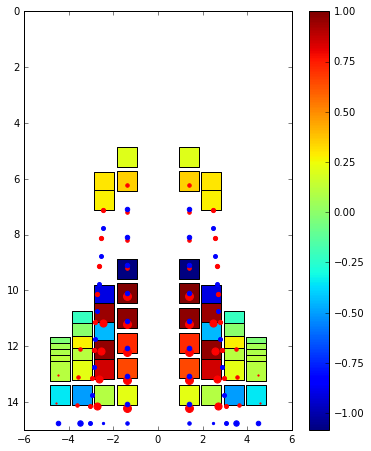

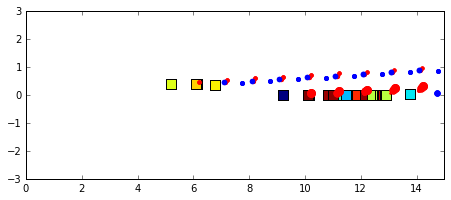

******************** New Time Step ********************
t =  0.8981424780567463 time step =  88
AOA =  -0.00481443760028 RA =  359.995067707
Pitching Rate =  0.0148233618507 Pitching Moment =  1171.22069676
q_target =  0.00962887520057 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1155.0416809 CFP Port Lift =  1155.19502357
DW Starboard Lift =  4409.32652142 DW Port Lift =  4411.58012416
Total Lift =  11131.1433501
CFP Starboard Control Input =  -0.00346299110007 CFP Port Control Input =  -0.00346299110007
Elevon Starboard Control Input =  0.00346299110007 Elevon Port Control Input =  0.00346299110007
CFP angle: 0.914895142037 0.914895142037 Elevon angle: -0.914895142037 -0.914895142037


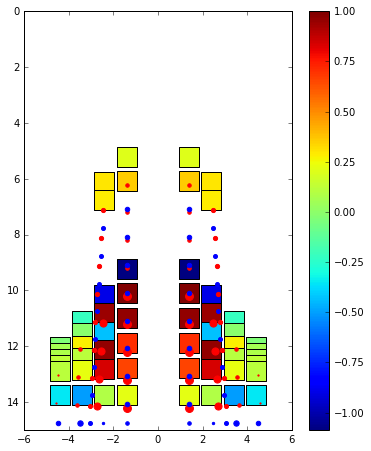

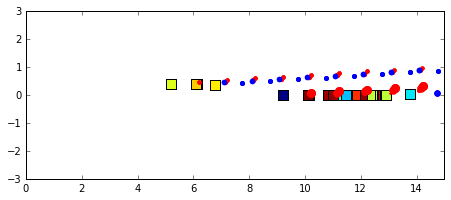

******************** New Time Step ********************
t =  0.9083486425801184 time step =  89
AOA =  -0.00470088792157 RA =  359.994862837
Pitching Rate =  0.0111255975207 Pitching Moment =  879.053632453
q_target =  0.00940177584313 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1151.56636513 CFP Port Lift =  1151.69322955
DW Starboard Lift =  4426.68058943 DW Port Lift =  4428.66325532
Total Lift =  11158.6034394
CFP Starboard Control Input =  -0.0011492144517 CFP Port Control Input =  -0.0011492144517
Elevon Starboard Control Input =  0.0011492144517 Elevon Port Control Input =  0.0011492144517
CFP angle: 0.910672676201 0.910672676201 Elevon angle: -0.910672676201 -0.910672676201


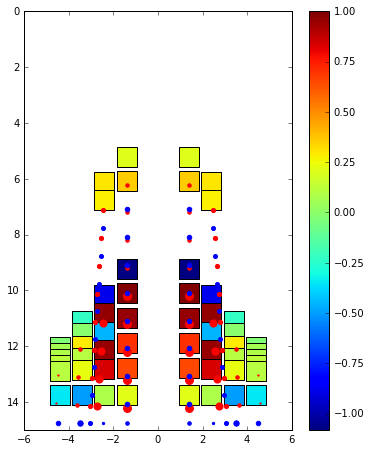

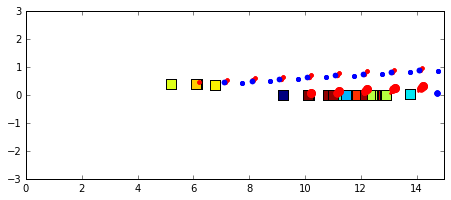

******************** New Time Step ********************
t =  0.9185548071034905 time step =  90
AOA =  -0.00461539927131 RA =  359.994653725
Pitching Rate =  0.00837617795189 Pitching Moment =  661.817007221
q_target =  0.00923079854262 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1147.2462276 CFP Port Lift =  1147.35062489
DW Starboard Lift =  4463.85645095 DW Port Lift =  4465.53971258
Total Lift =  11223.993016
CFP Starboard Control Input =  0.000569747060491 CFP Port Control Input =  0.000569747060491
Elevon Starboard Control Input =  -0.000569747060491 Elevon Port Control Input =  -0.000569747060491
CFP angle: 0.912766051806 0.912766051806 Elevon angle: -0.912766051806 -0.912766051806


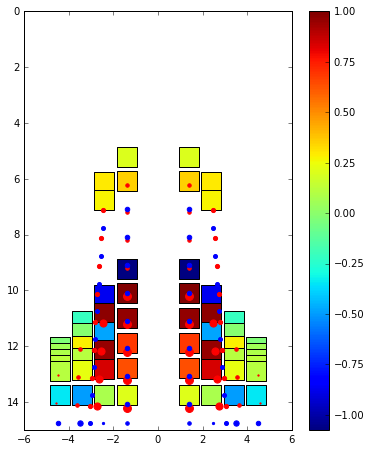

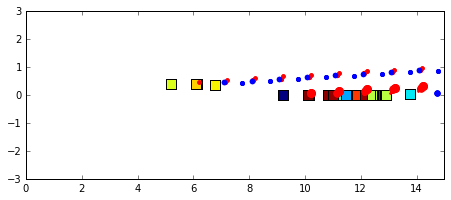

******************** New Time Step ********************
t =  0.9287609716268627 time step =  91
AOA =  -0.00455457443523 RA =  359.994440869
Pitching Rate =  0.00595961743895 Pitching Moment =  470.880179514
q_target =  0.00910914887047 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1146.91044356 CFP Port Lift =  1147.00470863
DW Starboard Lift =  4500.63432754 DW Port Lift =  4502.12771691
Total Lift =  11296.6771966
CFP Starboard Control Input =  0.00209968762101 CFP Port Control Input =  0.00209968762101
Elevon Starboard Control Input =  -0.00209968762101 Elevon Port Control Input =  -0.00209968762101
CFP angle: 0.920480764437 0.920480764437 Elevon angle: -0.920480764437 -0.920480764437


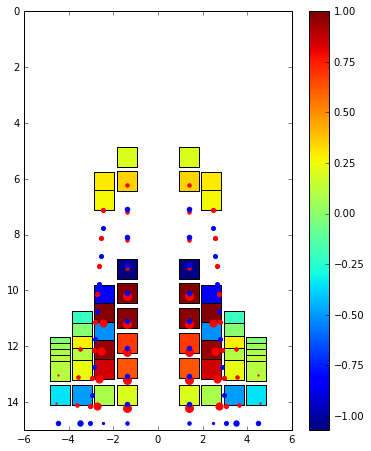

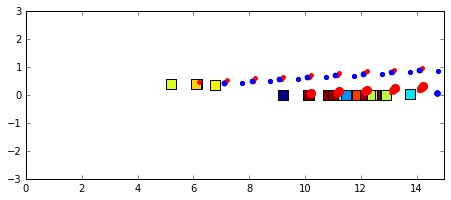

******************** New Time Step ********************
t =  0.9389671361502347 time step =  92
AOA =  -0.0045148336598 RA =  359.994224633
Pitching Rate =  0.00389380117709 Pitching Moment =  307.656291036
q_target =  0.0090296673196 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1151.67408354 CFP Port Lift =  1151.77151291
DW Starboard Lift =  4512.24237152 DW Port Lift =  4513.7292566
Total Lift =  11329.4172246
CFP Starboard Control Input =  0.00342391076167 CFP Port Control Input =  0.00342391076167
Elevon Starboard Control Input =  -0.00342391076167 Elevon Port Control Input =  -0.00342391076167
CFP angle: 0.933060963194 0.933060963194 Elevon angle: -0.933060963194 -0.933060963194


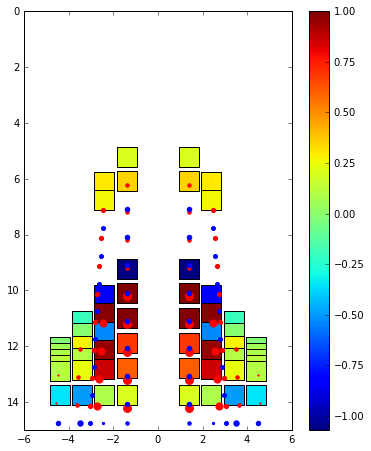

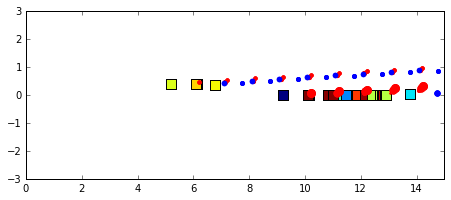

******************** New Time Step ********************
t =  0.9491733006736068 time step =  93
AOA =  -0.00448801299416 RA =  359.9940051
Pitching Rate =  0.00262788881885 Pitching Moment =  207.634260326
q_target =  0.00897602598833 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1159.52819936 CFP Port Lift =  1159.63585401
DW Starboard Lift =  4493.68705958 DW Port Lift =  4495.31175941
Total Lift =  11308.1628724
CFP Starboard Control Input =  0.00423209144632 CFP Port Control Input =  0.00423209144632
Elevon Starboard Control Input =  -0.00423209144632 Elevon Port Control Input =  -0.00423209144632
CFP angle: 0.948610594962 0.948610594962 Elevon angle: -0.948610594962 -0.948610594962


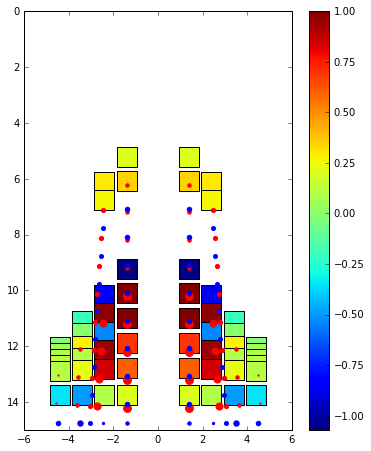

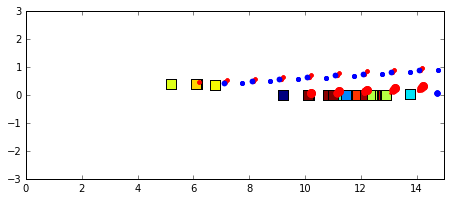

******************** New Time Step ********************
t =  0.9593794651969789 time step =  94
AOA =  -0.00445735629256 RA =  359.993782095
Pitching Rate =  0.0030037436236 Pitching Moment =  237.331229929
q_target =  0.00891471258511 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1165.6654561 CFP Port Lift =  1165.78377063
DW Starboard Lift =  4456.70892723 DW Port Lift =  4458.52545616
Total Lift =  11246.6836101
CFP Starboard Control Input =  0.00394064597434 CFP Port Control Input =  0.00394064597434
Elevon Starboard Control Input =  -0.00394064597434 Elevon Port Control Input =  -0.00394064597434
CFP angle: 0.963089392173 0.963089392173 Elevon angle: -0.963089392173 -0.963089392173


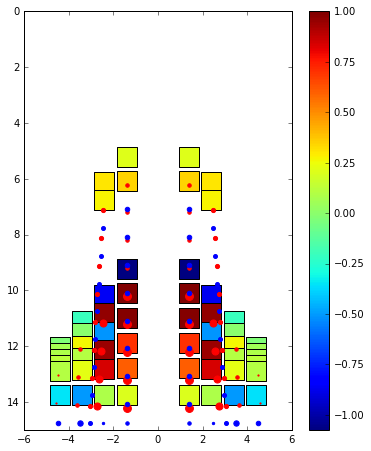

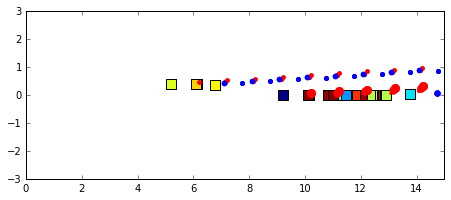

******************** New Time Step ********************
t =  0.9695856297203511 time step =  95
AOA =  -0.00440315291226 RA =  359.993555311
Pitching Rate =  0.00531084720186 Pitching Moment =  419.619666765
q_target =  0.00880630582451 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1166.84380417 CFP Port Lift =  1166.96823955
DW Starboard Lift =  4423.83192325 DW Port Lift =  4425.80298873
Total Lift =  11183.4469557
CFP Starboard Control Input =  0.00233030574844 CFP Port Control Input =  0.00233030574844
Elevon Starboard Control Input =  -0.00233030574844 Elevon Port Control Input =  -0.00233030574844
CFP angle: 0.971651446362 0.971651446362 Elevon angle: -0.971651446362 -0.971651446362


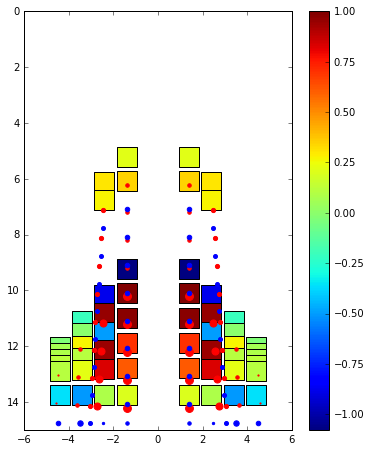

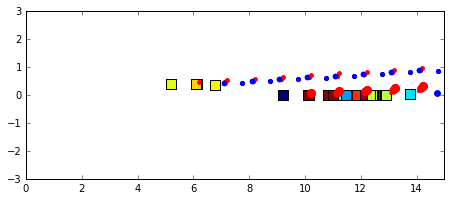

******************** New Time Step ********************
t =  0.9797917942437232 time step =  96
AOA =  -0.004311779463 RA =  359.993324461
Pitching Rate =  0.00895277055764 Pitching Moment =  707.374634448
q_target =  0.00862355892601 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1162.57625363 CFP Port Lift =  1162.70059667
DW Starboard Lift =  4411.7519725 DW Port Lift =  4413.79281346
Total Lift =  11150.8216363
CFP Starboard Control Input =  -0.000219474421089 CFP Port Control Input =  -0.000219474421089
Elevon Starboard Control Input =  0.000219474421089 Elevon Port Control Input =  0.000219474421089
CFP angle: 0.970845049224 0.970845049224 Elevon angle: -0.970845049224 -0.970845049224


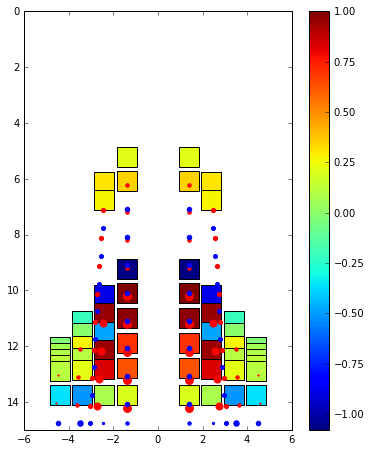

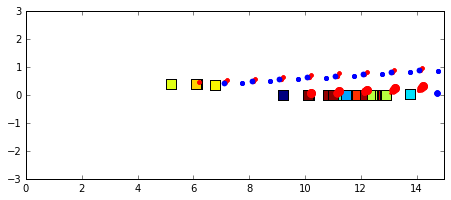

******************** New Time Step ********************
t =  0.9899979587670953 time step =  97
AOA =  -0.00418421291772 RA =  359.993089379
Pitching Rate =  0.0124989701067 Pitching Moment =  987.5662906
q_target =  0.00836842583545 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1156.52752581 CFP Port Lift =  1156.64996215
DW Starboard Lift =  4418.35421026 DW Port Lift =  4420.40869695
Total Lift =  11151.9403952
CFP Starboard Control Input =  -0.00275369618083 CFP Port Control Input =  -0.00275369618083
Elevon Starboard Control Input =  0.00275369618083 Elevon Port Control Input =  0.00275369618083
CFP angle: 0.960727365767 0.960727365767 Elevon angle: -0.960727365767 -0.960727365767


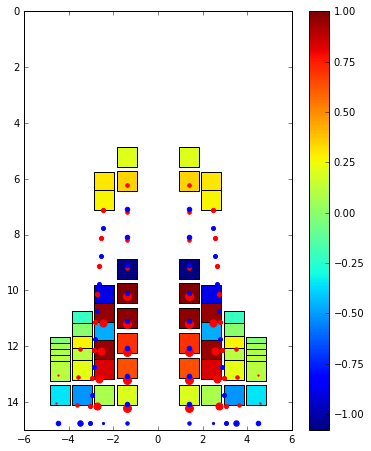

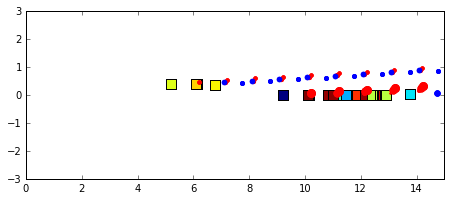

******************** New Time Step ********************
t =  1.0002041232904675 time step =  98
AOA =  -0.00403661095275 RA =  359.992850004
Pitching Rate =  0.0144620405281 Pitching Moment =  1142.67204393
q_target =  0.0080732219055 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1149.58906843 CFP Port Lift =  1149.69550642
DW Starboard Lift =  4446.64799066 DW Port Lift =  4448.57692987
Total Lift =  11194.5094954
CFP Starboard Control Input =  -0.0042592124151 CFP Port Control Input =  -0.0042592124151
Elevon Starboard Control Input =  0.0042592124151 Elevon Port Control Input =  0.0042592124151
CFP angle: 0.945078085614 0.945078085614 Elevon angle: -0.945078085614 -0.945078085614


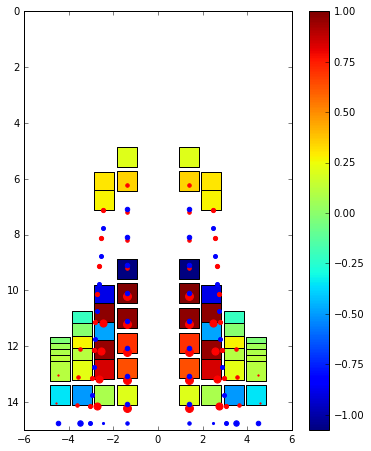

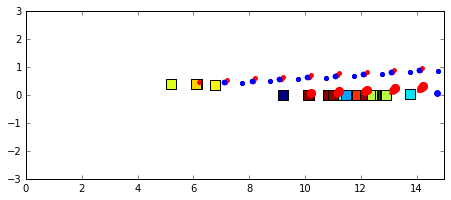

******************** New Time Step ********************
t =  1.0104102878138395 time step =  99
AOA =  -0.00389080423238 RA =  359.992606507
Pitching Rate =  0.0142861424618 Pitching Moment =  1128.77401879
q_target =  0.00778160846476 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1143.86438456 CFP Port Lift =  1143.95661663
DW Starboard Lift =  4480.8547804 DW Port Lift =  4482.61384926
Total Lift =  11251.2896309
CFP Starboard Control Input =  -0.00433635599806 CFP Port Control Input =  -0.00433635599806
Elevon Starboard Control Input =  0.00433635599806 Elevon Port Control Input =  0.00433635599806
CFP angle: 0.929145363025 0.929145363025 Elevon angle: -0.929145363025 -0.929145363025


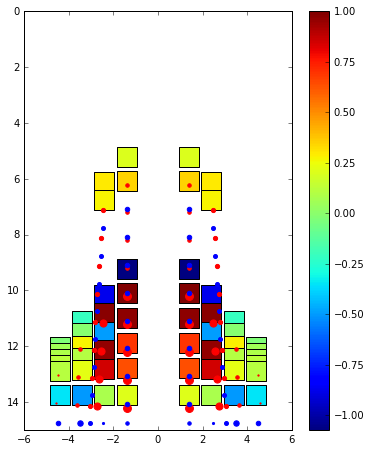

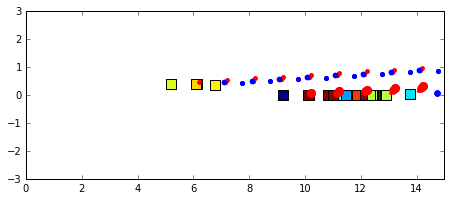

******************** New Time Step ********************
t =  1.0206164523372117 time step =  100
AOA =  -0.00377101515808 RA =  359.992359158
Pitching Rate =  0.0117369334998 Pitching Moment =  927.356396602
q_target =  0.00754203031616 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1144.82143863 CFP Port Lift =  1144.91112016
DW Starboard Lift =  4501.07967172 DW Port Lift =  4502.7586849
Total Lift =  11293.5709154
CFP Starboard Control Input =  -0.0027966021224 CFP Port Control Input =  -0.0027966021224
Elevon Starboard Control Input =  0.0027966021224 Elevon Port Control Input =  0.0027966021224
CFP angle: 0.918870033732 0.918870033732 Elevon angle: -0.918870033732 -0.918870033732


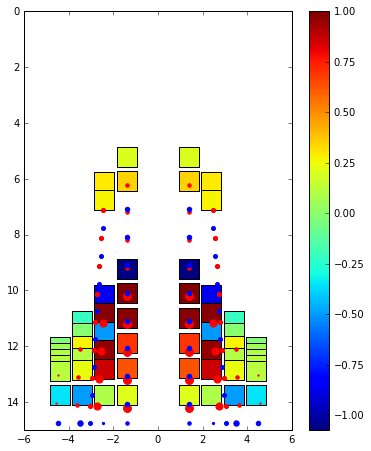

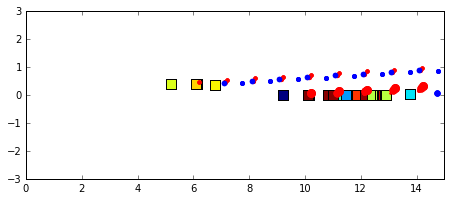

******************** New Time Step ********************
t =  1.0308226168605839 time step =  101
AOA =  -0.00369215369377 RA =  359.992108117
Pitching Rate =  0.00772684627272 Pitching Moment =  610.512133916
q_target =  0.00738430738755 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1149.90719069 CFP Port Lift =  1149.9955161
DW Starboard Lift =  4500.36328349 DW Port Lift =  4502.0340968
Total Lift =  11302.3000871
CFP Starboard Control Input =  -0.000228359256782 CFP Port Control Input =  -0.000228359256782
Elevon Starboard Control Input =  0.000228359256782 Elevon Port Control Input =  0.000228359256782
CFP angle: 0.91803099176 0.91803099176 Elevon angle: -0.91803099176 -0.91803099176


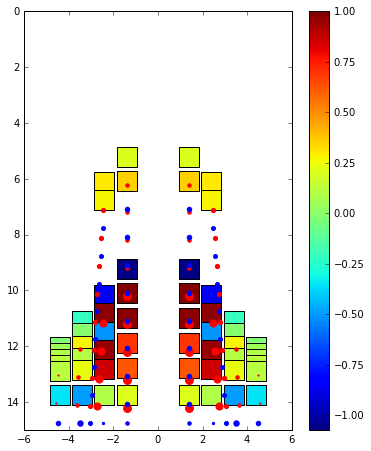

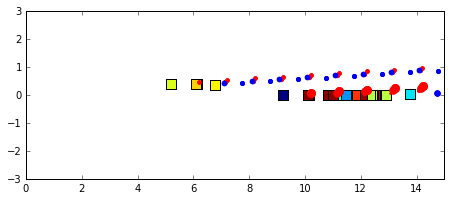

******************** New Time Step ********************
t =  1.0410287813839558 time step =  102
AOA =  -0.00365268698552 RA =  359.991853441
Pitching Rate =  0.00386694807505 Pitching Moment =  305.534578755
q_target =  0.00730537397103 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1157.63113804 CFP Port Lift =  1157.72417807
DW Starboard Lift =  4476.75529186 DW Port Lift =  4478.49734807
Total Lift =  11270.607956
CFP Starboard Control Input =  0.00229228393065 CFP Port Control Input =  0.00229228393065
Elevon Starboard Control Input =  -0.00229228393065 Elevon Port Control Input =  -0.00229228393065
CFP angle: 0.926453345455 0.926453345455 Elevon angle: -0.926453345455 -0.926453345455


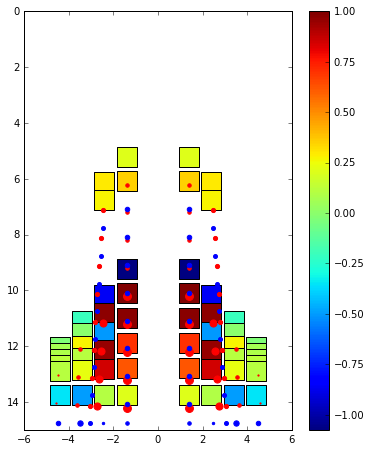

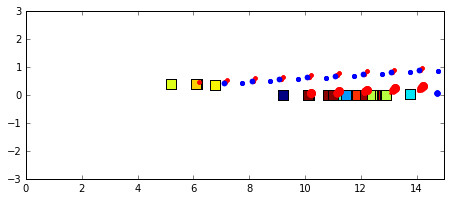

******************** New Time Step ********************
t =  1.051234945907328 time step =  103
AOA =  -0.00363584870036 RA =  359.991595042
Pitching Rate =  0.0016498151793 Pitching Moment =  130.354888674
q_target =  0.00727169740073 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1162.84123343 CFP Port Lift =  1162.93296194
DW Starboard Lift =  4452.52001153 DW Port Lift =  4454.30822936
Total Lift =  11232.6024363
CFP Starboard Control Input =  0.00374792148095 CFP Port Control Input =  0.00374792148095
Elevon Starboard Control Input =  -0.00374792148095 Elevon Port Control Input =  -0.00374792148095
CFP angle: 0.940224030627 0.940224030627 Elevon angle: -0.940224030627 -0.940224030627


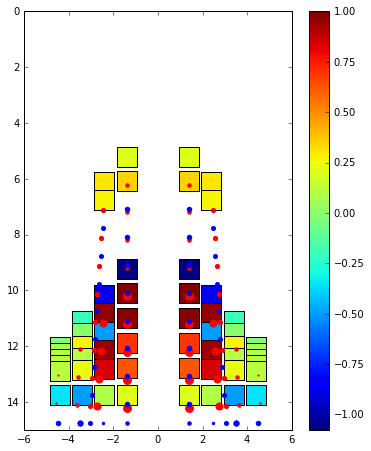

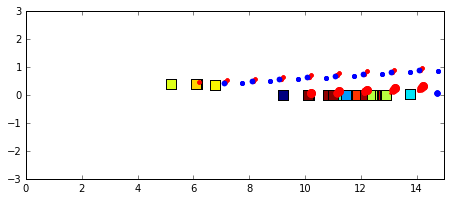

******************** New Time Step ********************
t =  1.0614411104307002 time step =  104
AOA =  -0.00361603631477 RA =  359.991332843
Pitching Rate =  0.00194121754073 Pitching Moment =  153.379117606
q_target =  0.00723207262953 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1163.66081088 CFP Port Lift =  1163.75034039
DW Starboard Lift =  4437.40497827 DW Port Lift =  4439.2115361
Total Lift =  11204.0276656
CFP Starboard Control Input =  0.00352723672587 CFP Port Control Input =  0.00352723672587
Elevon Starboard Control Input =  -0.00352723672587 Elevon Port Control Input =  -0.00352723672587
CFP angle: 0.953183871628 0.953183871628 Elevon angle: -0.953183871628 -0.953183871628


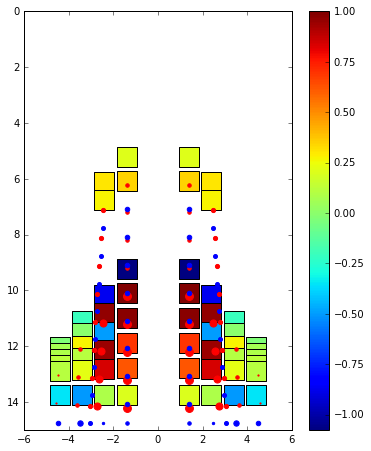

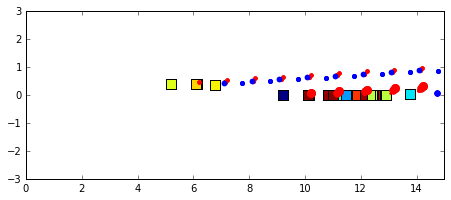

******************** New Time Step ********************
t =  1.0716472749540722 time step =  105
AOA =  -0.00357359381325 RA =  359.991066797
Pitching Rate =  0.00415851629885 Pitching Moment =  328.571912773
q_target =  0.0071471876265 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1160.96503887 CFP Port Lift =  1161.05088644
DW Starboard Lift =  4439.57182692 DW Port Lift =  4441.36699847
Total Lift =  11202.9547507
CFP Starboard Control Input =  0.00199244755177 CFP Port Control Input =  0.00199244755177
Elevon Starboard Control Input =  -0.00199244755177 Elevon Port Control Input =  -0.00199244755177
CFP angle: 0.960504560735 0.960504560735 Elevon angle: -0.960504560735 -0.960504560735


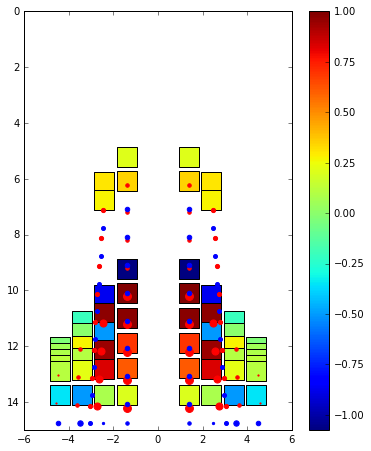

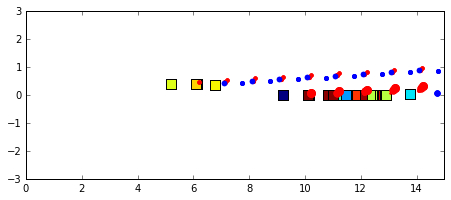

******************** New Time Step ********************
t =  1.0818534394774444 time step =  106
AOA =  -0.0035011925809 RA =  359.990796901
Pitching Rate =  0.00709387274554 Pitching Moment =  560.49974786
q_target =  0.0070023851618 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1156.63440621 CFP Port Lift =  1156.71722462
DW Starboard Lift =  4451.63630562 DW Port Lift =  4453.41807005
Total Lift =  11218.4060065
CFP Starboard Control Input =  -6.09917224976e-05 CFP Port Control Input =  -6.09917224976e-05
Elevon Starboard Control Input =  6.09917224976e-05 Elevon Port Control Input =  6.09917224976e-05
CFP angle: 0.960280463775 0.960280463775 Elevon angle: -0.960280463775 -0.960280463775


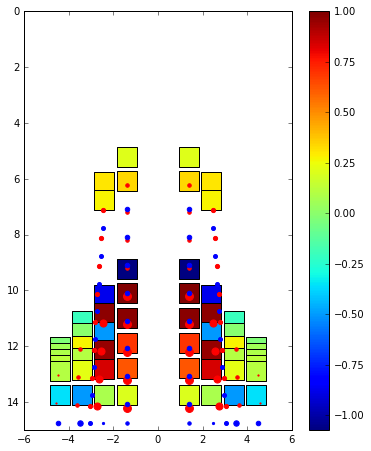

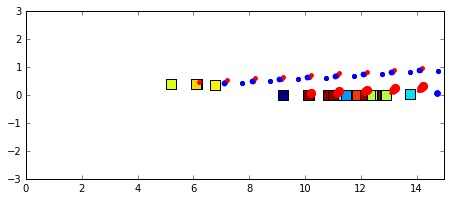

******************** New Time Step ********************
t =  1.0920596040008166 time step =  107
AOA =  -0.00340591164935 RA =  359.990523169
Pitching Rate =  0.00933562567357 Pitching Moment =  737.62471133
q_target =  0.00681182329869 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1153.39874778 CFP Port Lift =  1153.48027037
DW Starboard Lift =  4464.59050974 DW Port Lift =  4466.37477233
Total Lift =  11237.8443002
CFP Starboard Control Input =  -0.00168253491658 CFP Port Control Input =  -0.00168253491658
Elevon Starboard Control Input =  0.00168253491658 Elevon Port Control Input =  0.00168253491658
CFP angle: 0.954098461632 0.954098461632 Elevon angle: -0.954098461632 -0.954098461632


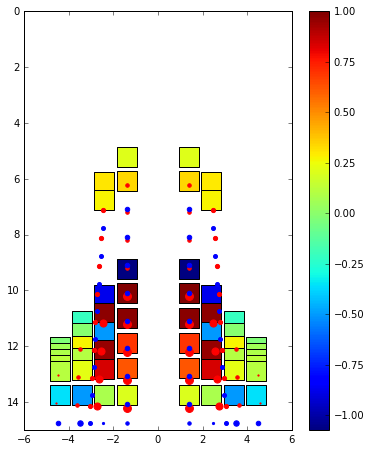

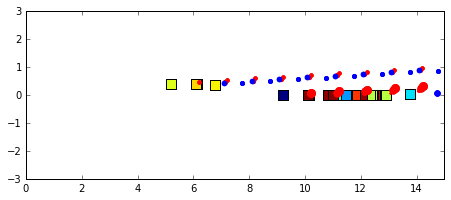

******************** New Time Step ********************
t =  1.1022657685241886 time step =  108
AOA =  -0.00330243438925 RA =  359.990245595
Pitching Rate =  0.0101387019441 Pitching Moment =  801.077223563
q_target =  0.0066048687785 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1152.10600681 CFP Port Lift =  1152.18646617
DW Starboard Lift =  4471.56134444 DW Port Lift =  4473.35906136
Total Lift =  11249.2128788
CFP Starboard Control Input =  -0.00235588877708 CFP Port Control Input =  -0.00235588877708
Elevon Starboard Control Input =  0.00235588877708 Elevon Port Control Input =  0.00235588877708
CFP angle: 0.945442409787 0.945442409787 Elevon angle: -0.945442409787 -0.945442409787


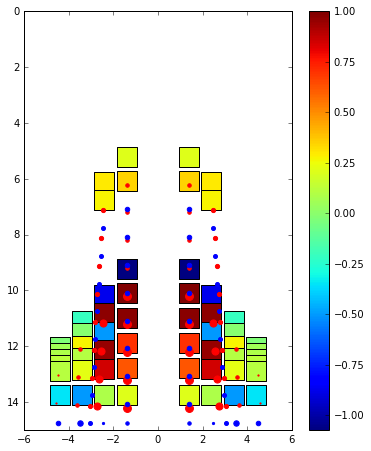

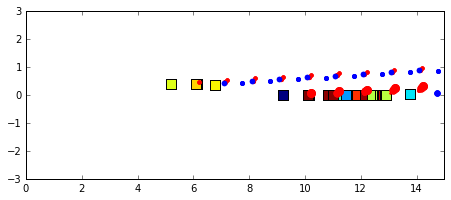

******************** New Time Step ********************
t =  1.1124719330475608 time step =  109
AOA =  -0.0032054626649 RA =  359.989964161
Pitching Rate =  0.00950128955235 Pitching Moment =  750.714114766
q_target =  0.00641092532979 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1152.65554573 CFP Port Lift =  1152.73436465
DW Starboard Lift =  4471.26484919 DW Port Lift =  4473.07362653
Total Lift =  11249.7283861
CFP Starboard Control Input =  -0.00206024281504 CFP Port Control Input =  -0.00206024281504
Elevon Starboard Control Input =  0.00206024281504 Elevon Port Control Input =  0.00206024281504
CFP angle: 0.937872626021 0.937872626021 Elevon angle: -0.937872626021 -0.937872626021


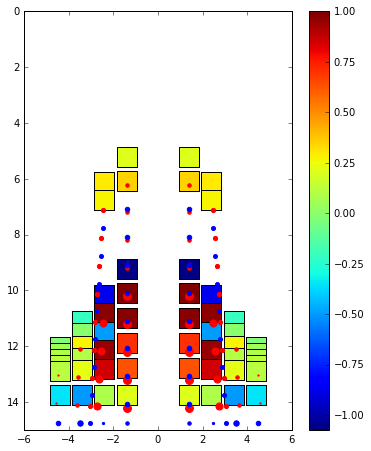

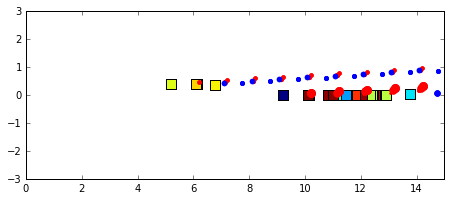

******************** New Time Step ********************
t =  1.1226780975709327 time step =  110
AOA =  -0.00312390056268 RA =  359.989678847
Pitching Rate =  0.00799145477481 Pitching Moment =  631.41933144
q_target =  0.00624780112537 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1153.96767596 CFP Port Lift =  1154.04305078
DW Starboard Lift =  4467.66773888 DW Port Lift =  4469.4680542
Total Lift =  11245.1465198
CFP Starboard Control Input =  -0.0011624357663 CFP Port Control Input =  -0.0011624357663
Elevon Starboard Control Input =  0.0011624357663 Elevon Port Control Input =  0.0011624357663
CFP angle: 0.933601582177 0.933601582177 Elevon angle: -0.933601582177 -0.933601582177


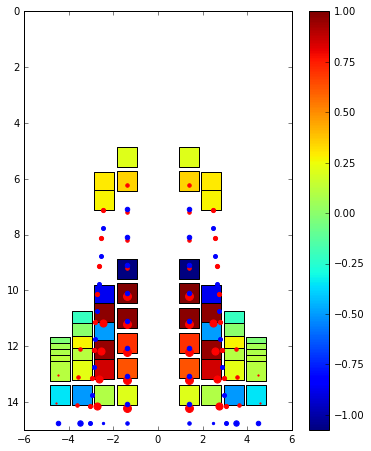

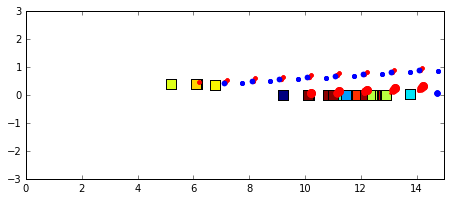

******************** New Time Step ********************
t =  1.132884262094305 time step =  111
AOA =  -0.00305931138974 RA =  359.989389662
Pitching Rate =  0.00632844716481 Pitching Moment =  500.022084897
q_target =  0.00611862277948 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1155.18890849 CFP Port Lift =  1155.2595737
DW Starboard Lift =  4464.85054947 DW Port Lift =  4466.62161395
Total Lift =  11241.9206456
CFP Starboard Control Input =  -0.000139882923553 CFP Port Control Input =  -0.000139882923553
Elevon Starboard Control Input =  0.000139882923553 Elevon Port Control Input =  0.000139882923553
CFP angle: 0.933087621649 0.933087621649 Elevon angle: -0.933087621649 -0.933087621649


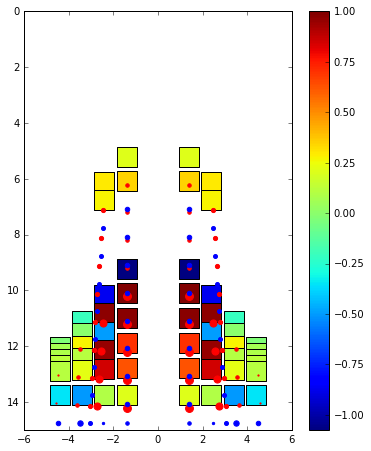

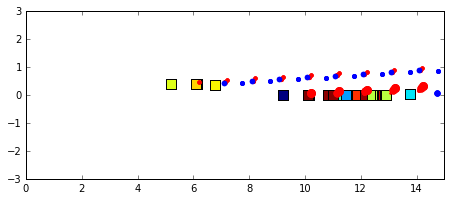

******************** New Time Step ********************
t =  1.1430904266176771 time step =  112
AOA =  -0.0030079408655 RA =  359.989096647
Pitching Rate =  0.00503328396489 Pitching Moment =  397.68889215
q_target =  0.00601588173101 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1155.96137787 CFP Port Lift =  1156.02703334
DW Starboard Lift =  4465.13864345 DW Port Lift =  4466.86998813
Total Lift =  11243.9970428
CFP Starboard Control Input =  0.000655065177411 CFP Port Control Input =  0.000655065177411
Elevon Starboard Control Input =  -0.000655065177411 Elevon Port Control Input =  -0.000655065177411
CFP angle: 0.93549447472 0.93549447472 Elevon angle: -0.93549447472 -0.93549447472


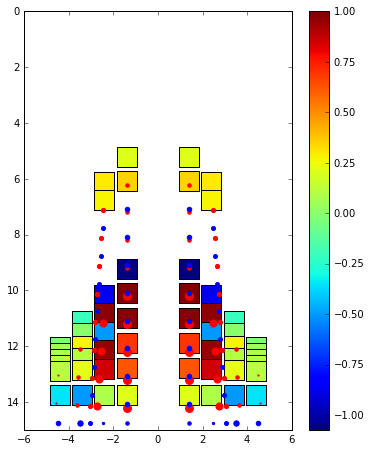

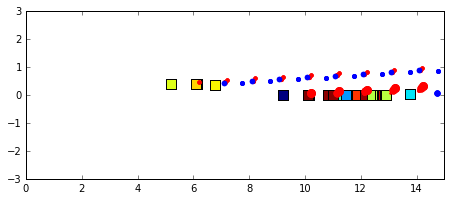

******************** New Time Step ********************
t =  1.153296591141049 time step =  113
AOA =  -0.00296378226006 RA =  359.988799868
Pitching Rate =  0.00432666016116 Pitching Moment =  341.857264205
q_target =  0.00592756452012 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1156.51239418 CFP Port Lift =  1156.57438675
DW Starboard Lift =  4467.0906996 DW Port Lift =  4468.79290349
Total Lift =  11248.970384
CFP Starboard Control Input =  0.00106726957264 CFP Port Control Input =  0.00106726957264
Elevon Starboard Control Input =  -0.00106726957264 Elevon Port Control Input =  -0.00106726957264
CFP angle: 0.939415857106 0.939415857106 Elevon angle: -0.939415857106 -0.939415857106


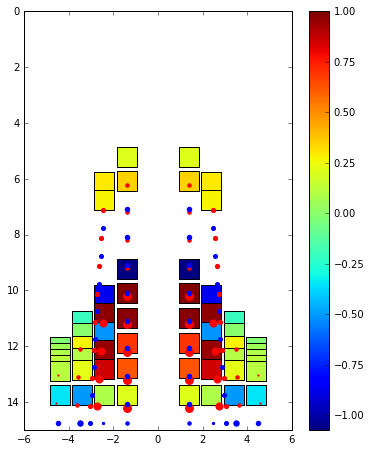

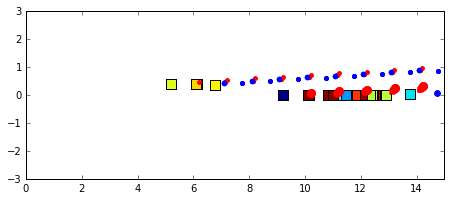

******************** New Time Step ********************
t =  1.1635027556644213 time step =  114
AOA =  -0.002921193251 RA =  359.988499375
Pitching Rate =  0.00417287110748 Pitching Moment =  329.706112231
q_target =  0.00584238650201 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1156.94952045 CFP Port Lift =  1157.00873138
DW Starboard Lift =  4469.2404529 DW Port Lift =  4470.92927582
Total Lift =  11254.1279805
CFP Starboard Control Input =  0.00111301026302 CFP Port Control Input =  0.00111301026302
Elevon Starboard Control Input =  -0.00111301026302 Elevon Port Control Input =  -0.00111301026302
CFP angle: 0.943505300815 0.943505300815 Elevon angle: -0.943505300815 -0.943505300815


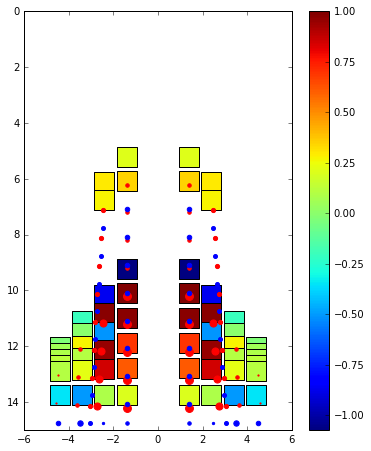

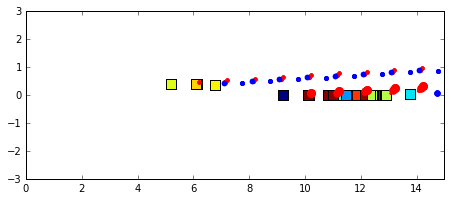

******************** New Time Step ********************
t =  1.1737089201877935 time step =  115
AOA =  -0.00287578876651 RA =  359.988195199
Pitching Rate =  0.00444873139099 Pitching Moment =  351.502333406
q_target =  0.00575157753301 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1157.13972116 CFP Port Lift =  1157.1972005
DW Starboard Lift =  4470.10421838 DW Port Lift =  4471.79665057
Total Lift =  11256.2377906
CFP Starboard Control Input =  0.000868564094681 CFP Port Control Input =  0.000868564094681
Elevon Starboard Control Input =  -0.000868564094681 Elevon Port Control Input =  -0.000868564094681
CFP angle: 0.946696595713 0.946696595713 Elevon angle: -0.946696595713 -0.946696595713


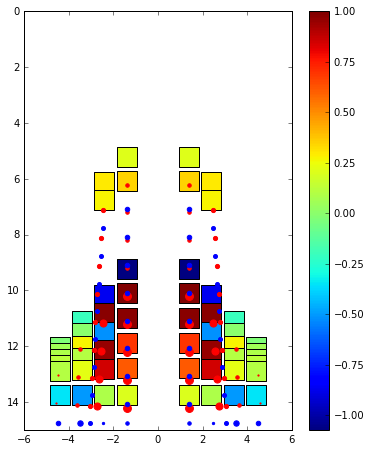

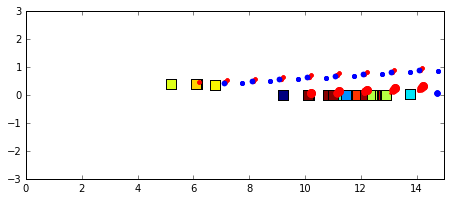

******************** New Time Step ********************
t =  1.1839150847111655 time step =  116
AOA =  -0.00282521269633 RA =  359.98788734
Pitching Rate =  0.00495544335586 Pitching Moment =  391.538564494
q_target =  0.00565042539266 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1157.49232858 CFP Port Lift =  1157.55016884
DW Starboard Lift =  4467.82380212 DW Port Lift =  4469.54452778
Total Lift =  11252.4108273
CFP Starboard Control Input =  0.000463321357864 CFP Port Control Input =  0.000463321357864
Elevon Starboard Control Input =  -0.000463321357864 Elevon Port Control Input =  -0.000463321357864
CFP angle: 0.948398939955 0.948398939955 Elevon angle: -0.948398939955 -0.948398939955


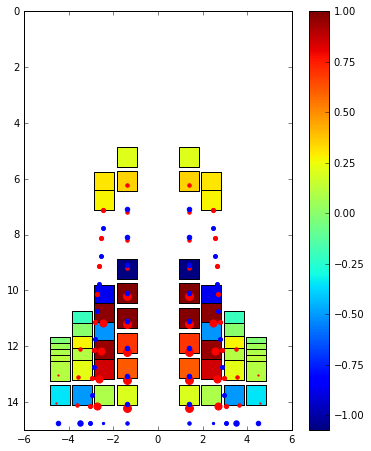

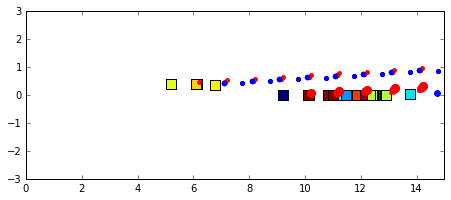

******************** New Time Step ********************
t =  1.1941212492345377 time step =  117
AOA =  -0.0027690727774 RA =  359.987575755
Pitching Rate =  0.00550058925702 Pitching Moment =  434.611530574
q_target =  0.0055381455548 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1157.66428223 CFP Port Lift =  1157.72184202
DW Starboard Lift =  4463.98680093 DW Port Lift =  4465.74016024
Total Lift =  11245.1130854
CFP Starboard Control Input =  2.50375318497e-05 CFP Port Control Input =  2.50375318497e-05
Elevon Starboard Control Input =  -2.50375318497e-05 Elevon Port Control Input =  -2.50375318497e-05
CFP angle: 0.948490933336 0.948490933336 Elevon angle: -0.948490933336 -0.948490933336


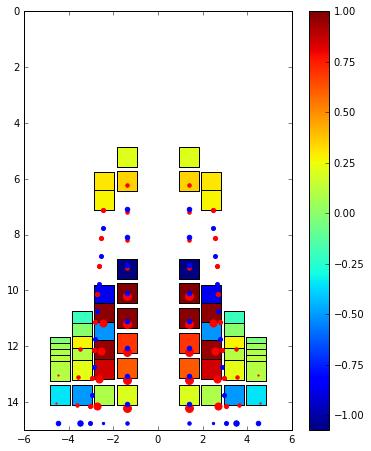

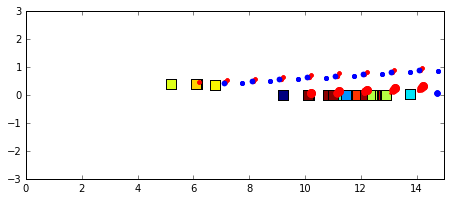

******************** New Time Step ********************
t =  1.2043274137579099 time step =  118
AOA =  -0.00270803441064 RA =  359.987260388
Pitching Rate =  0.00598053917518 Pitching Moment =  472.533243828
q_target =  20.0054160688 CFP_target =  18.0 E_target =  -10.0
CFP Starboard Lift =  4731.09854496 CFP Port Lift =  4731.1726729
DW Starboard Lift =  -1506.75713133 DW Port Lift =  -1504.968647
Total Lift =  6450.54543953
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: 4.62271016175 4.62271016175 Elevon angle: -4.62271016175 -4.62271016175


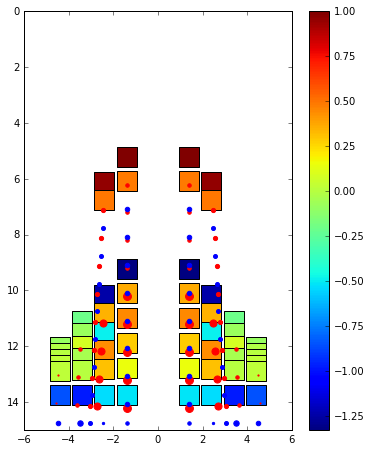

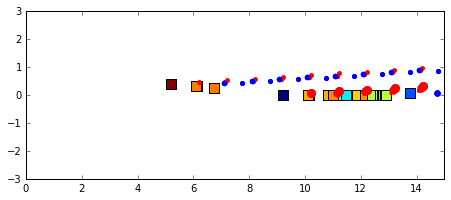

******************** New Time Step ********************
t =  1.2145335782812818 time step =  119
AOA =  0.00504174307257 RA =  359.986940728
Pitching Rate =  0.759323197805 Pitching Moment =  59995.5026232
q_target =  19.9899165139 CFP_target =  18.0 E_target =  -10.0
CFP Starboard Lift =  4708.5089328 CFP Port Lift =  4708.56579636
DW Starboard Lift =  -4275.12715653 DW Port Lift =  -4271.74442362
Total Lift =  870.20314902
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: 8.29692939016 8.29692939016 Elevon angle: -8.29692939016 -8.29692939016


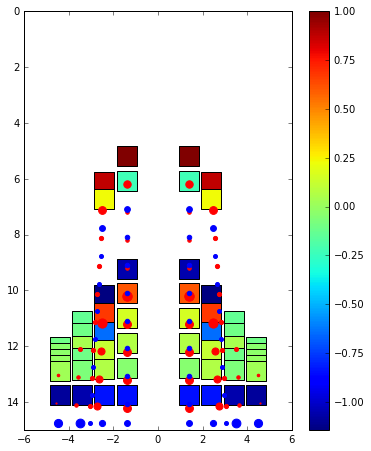

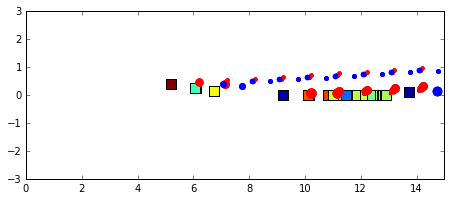

******************** New Time Step ********************
t =  1.224739742804654 time step =  120
AOA =  0.0249349147166 RA =  359.986608798
Pitching Rate =  1.94913295768 Pitching Moment =  154004.529051
q_target =  19.9501301706 CFP_target =  18.0 E_target =  -10.0
CFP Starboard Lift =  6714.28448608 CFP Port Lift =  6714.34533979
DW Starboard Lift =  -5809.24992574 DW Port Lift =  -5806.93826963
Total Lift =  1812.4416305
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: 11.9711486186 11.9711486186 Elevon angle: -10.0 -10.0


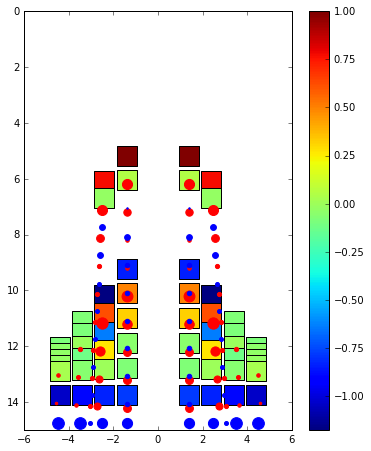

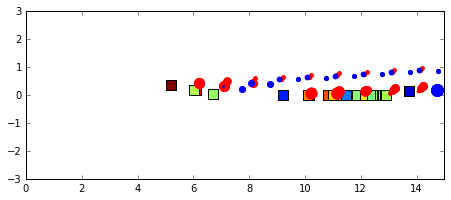

******************** New Time Step ********************
t =  1.2349459073280262 time step =  121
AOA =  0.062343788863 RA =  359.986268707
Pitching Rate =  3.66532148886 Pitching Moment =  289603.696602
q_target =  19.8753124223 CFP_target =  16.2099909334 E_target =  -10.0
CFP Starboard Lift =  9256.63724161 CFP Port Lift =  9256.68016494
DW Starboard Lift =  -5393.99168501 DW Port Lift =  -5391.20525998
Total Lift =  7728.12046155
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -0.0 Elevon Port Control Input =  -0.0
CFP angle: 15.645367847 15.645367847 Elevon angle: -10.0 -10.0


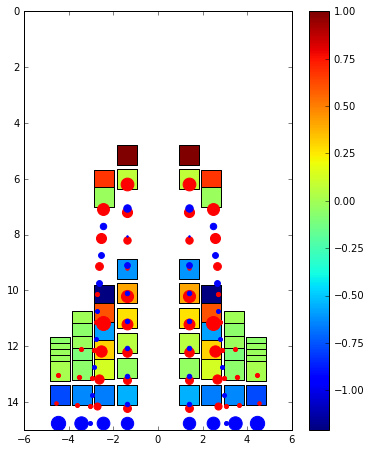

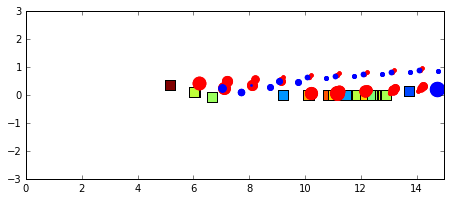

******************** New Time Step ********************
t =  1.2451520718513982 time step =  122
AOA =  0.120760141135 RA =  359.985919587
Pitching Rate =  5.72363419564 Pitching Moment =  452234.715587
q_target =  19.7584797177 CFP_target =  14.0348455221 E_target =  -10.0
CFP Starboard Lift =  -2997.63942999 CFP Port Lift =  -2997.6931449
DW Starboard Lift =  3728.49909551 DW Port Lift =  3731.84183986
Total Lift =  1465.00836048
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  -0.0 Elevon Port Control Input =  -0.0
CFP angle: 11.9711486186 11.9711486186 Elevon angle: -10.0 -10.0


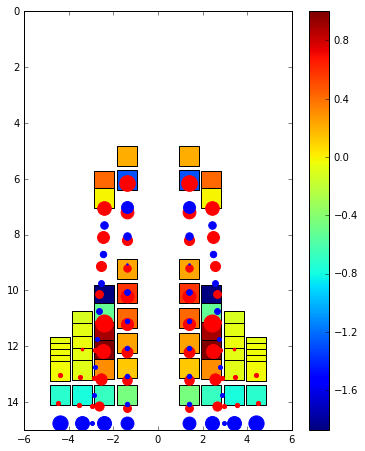

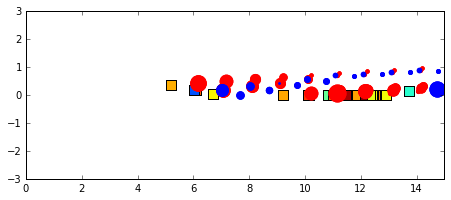

******************** New Time Step ********************
t =  1.2553582363747704 time step =  123
AOA =  0.180825447958 RA =  359.98556312
Pitching Rate =  5.88519876253 Pitching Moment =  465000.224958
q_target =  19.6383491041 CFP_target =  13.7531503415 E_target =  -10.0
CFP Starboard Lift =  9387.6257272 CFP Port Lift =  9387.65299425
DW Starboard Lift =  -5768.6131112 DW Port Lift =  -5764.62230598
Total Lift =  7242.04330427
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -0.0 Elevon Port Control Input =  -0.0
CFP angle: 15.645367847 15.645367847 Elevon angle: -10.0 -10.0


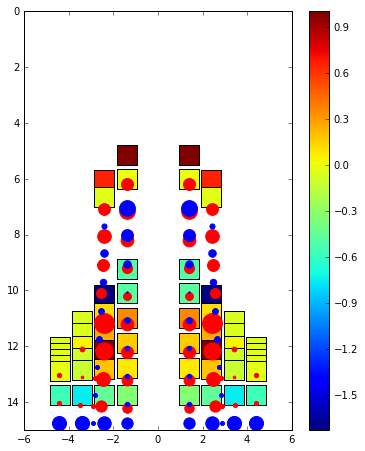

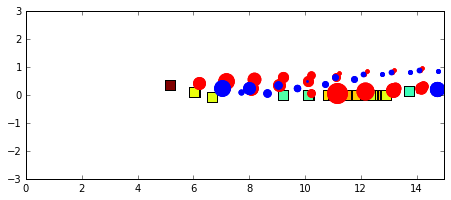

******************** New Time Step ********************
t =  1.2655644008981424 time step =  124
AOA =  0.256726229776 RA =  359.985196759
Pitching Rate =  7.43675860252 Pitching Moment =  587591.781122
q_target =  19.4865475404 CFP_target =  12.0497889379 E_target =  -10.0
CFP Starboard Lift =  -2696.17295103 CFP Port Lift =  -2696.21978344
DW Starboard Lift =  18097.884864 DW Port Lift =  18100.9545356
Total Lift =  30806.4466651
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  -0.0 Elevon Port Control Input =  -0.0
CFP angle: 11.9711486186 11.9711486186 Elevon angle: -10.0 -10.0


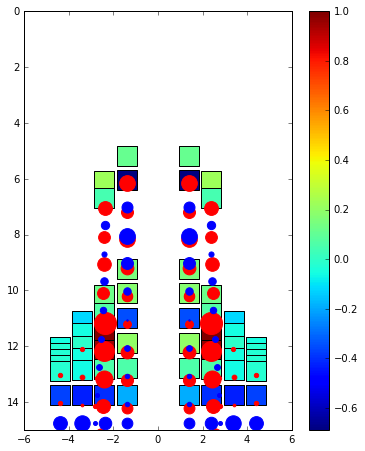

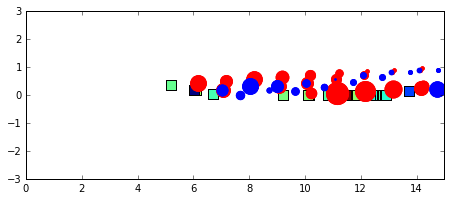

******************** New Time Step ********************
t =  1.2757705654215146 time step =  125
AOA =  0.335797323627 RA =  359.984821747
Pitching Rate =  7.74738577548 Pitching Moment =  612134.99727
q_target =  19.3284053527 CFP_target =  11.5810195773 E_target =  -10.0
CFP Starboard Lift =  4599.73510058 CFP Port Lift =  4599.74996638
DW Starboard Lift =  5278.48852143 DW Port Lift =  5281.66599184
Total Lift =  19759.6395802
CFP Starboard Control Input =  -0.260086027543 CFP Port Control Input =  -0.260086027543
Elevon Starboard Control Input =  -0.0 Elevon Port Control Input =  -0.0
CFP angle: 11.0155355351 11.0155355351 Elevon angle: -10.0 -10.0


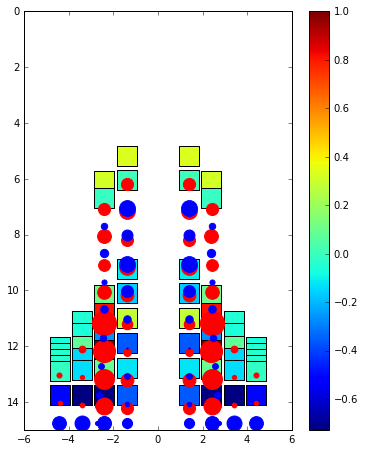

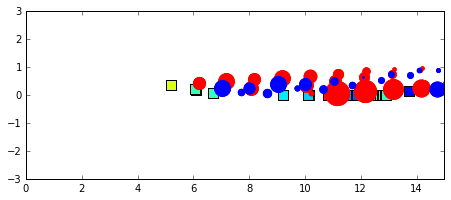

******************** New Time Step ********************
t =  1.2859767299448868 time step =  126
AOA =  0.432799242017 RA =  359.984437532
Pitching Rate =  9.50424796386 Pitching Moment =  750947.864223
q_target =  19.134401516 CFP_target =  9.63015355211 E_target =  -9.63015355211
CFP Starboard Lift =  1193.52138354 CFP Port Lift =  1193.5091369
DW Starboard Lift =  -3125.78943823 DW Port Lift =  -3122.01030234
Total Lift =  -3860.76922014
CFP Starboard Control Input =  -0.923587988685 CFP Port Control Input =  -0.923587988685
Elevon Starboard Control Input =  0.246564298594 Elevon Port Control Input =  0.246564298594
CFP angle: 7.62207078798 7.62207078798 Elevon angle: -9.09406871307 -9.09406871307


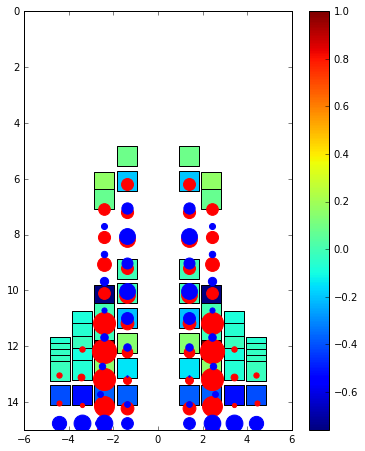

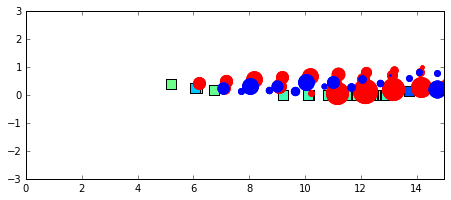

******************** New Time Step ********************
t =  1.2961828944682587 time step =  127
AOA =  0.538974914107 RA =  359.984043402
Pitching Rate =  10.4030923514 Pitching Moment =  821967.189019
q_target =  18.9220501718 CFP_target =  8.5189578204 E_target =  -8.5189578204
CFP Starboard Lift =  5439.80823903 CFP Port Lift =  5439.79829219
DW Starboard Lift =  -5066.61017527 DW Port Lift =  -5063.99721743
Total Lift =  748.99913852
CFP Starboard Control Input =  0.59792468828 CFP Port Control Input =  0.59792468828
Elevon Starboard Control Input =  0.383407261779 Elevon Port Control Input =  0.383407261779
CFP angle: 9.8189771748 9.8189771748 Elevon angle: -7.68534637952 -7.68534637952


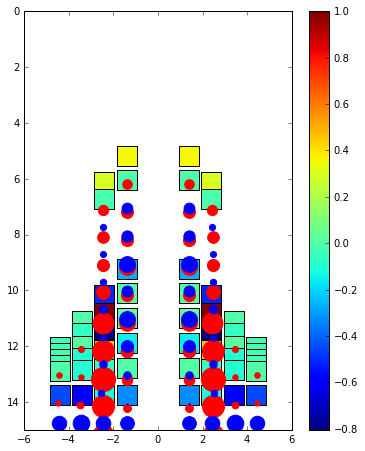

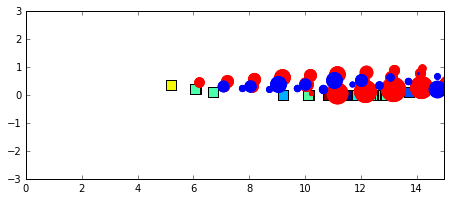

******************** New Time Step ********************
t =  1.306389058991631 time step =  128
AOA =  0.66134707721 RA =  359.983640915
Pitching Rate =  11.9900245408 Pitching Moment =  947353.578646
q_target =  18.6773058456 CFP_target =  6.68728130478 E_target =  -6.68728130478
CFP Starboard Lift =  -754.515133441 CFP Port Lift =  -754.549910329
DW Starboard Lift =  2712.17644854 DW Port Lift =  2715.13869476
Total Lift =  3918.25009953
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  0.665376716497 Elevon Port Control Input =  0.665376716497
CFP angle: 6.14475794638 6.14475794638 Elevon angle: -5.24060645363 -5.24060645363


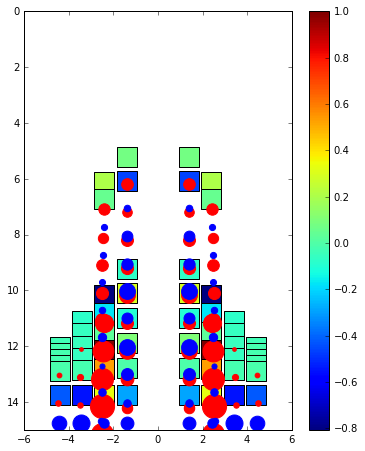

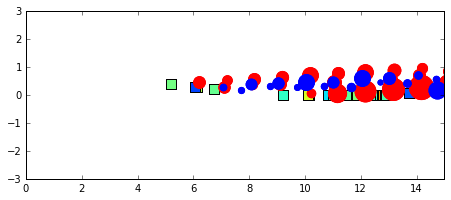

******************** New Time Step ********************
t =  1.3165952235150031 time step =  129
AOA =  0.782984253608 RA =  359.983231198
Pitching Rate =  11.9180105435 Pitching Moment =  941663.622147
q_target =  18.4340314928 CFP_target =  6.51602094929 E_target =  -6.51602094929
CFP Starboard Lift =  4490.63628904 CFP Port Lift =  4490.61922337
DW Starboard Lift =  -118.142824414 DW Port Lift =  -115.411698999
Total Lift =  8747.700989
CFP Starboard Control Input =  0.2475086686 CFP Port Control Input =  0.2475086686
Elevon Starboard Control Input =  -0.850276330435 Elevon Port Control Input =  -0.850276330435
CFP angle: 7.05415905576 7.05415905576 Elevon angle: -8.36470809638 -8.36470809638


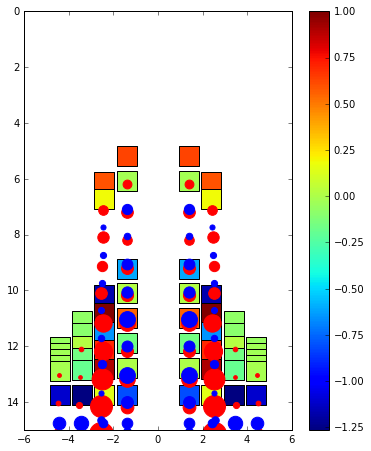

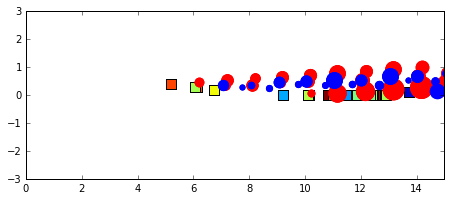

******************** New Time Step ********************
t =  1.326801388038375 time step =  130
AOA =  0.914999482508 RA =  359.982813825
Pitching Rate =  12.9348521276 Pitching Moment =  1022006.11939
q_target =  18.170001035 CFP_target =  5.23514890739 E_target =  -5.23514890739
CFP Starboard Lift =  146.248612962 CFP Port Lift =  146.183079566
DW Starboard Lift =  4947.84314819 DW Port Lift =  4950.40456532
Total Lift =  10190.679406
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: 3.37993982734 3.37993982734 Elevon angle: -4.69048886797 -4.69048886797


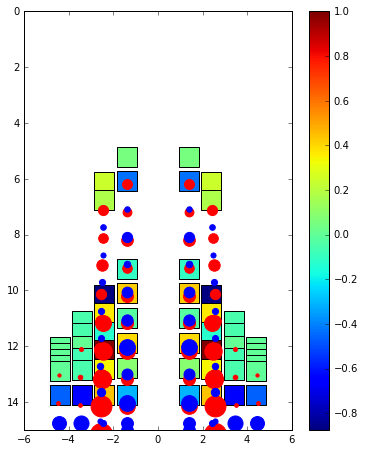

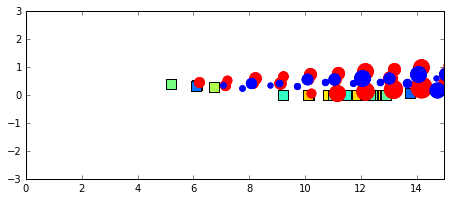

******************** New Time Step ********************
t =  1.3370075525617473 time step =  131
AOA =  1.04735131163 RA =  359.982390597
Pitching Rate =  12.9678322173 Pitching Moment =  1024611.93608
q_target =  17.9052973767 CFP_target =  4.9374651594 E_target =  -4.9374651594
CFP Starboard Lift =  6939.71939586 CFP Port Lift =  6939.667223
DW Starboard Lift =  69.9329526357 DW Port Lift =  72.210454672
Total Lift =  14021.5300262
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -0.164650860956 Elevon Port Control Input =  -0.164650860956
CFP angle: 7.05415905576 7.05415905576 Elevon angle: -5.29545222727 -5.29545222727


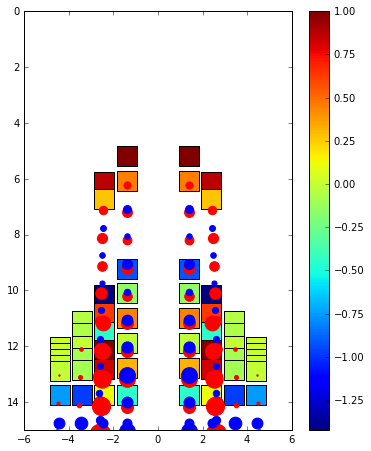

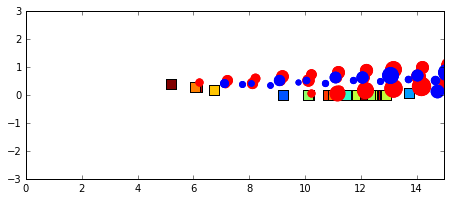

******************** New Time Step ********************
t =  1.3472137170851195 time step =  132
AOA =  1.18903351003 RA =  359.981961725
Pitching Rate =  13.8820217994 Pitching Moment =  1096843.71252
q_target =  17.6219329799 CFP_target =  3.73991118051 E_target =  -3.73991118051
CFP Starboard Lift =  -784.505064369 CFP Port Lift =  -784.586716002
DW Starboard Lift =  7388.18981811 DW Port Lift =  7390.35286478
Total Lift =  13209.4509025
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: 3.37993982734 3.37993982734 Elevon angle: -1.62123299885 -1.62123299885


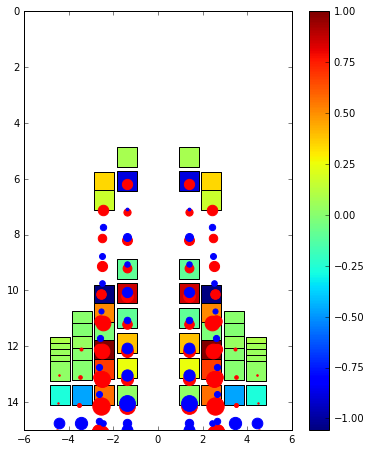

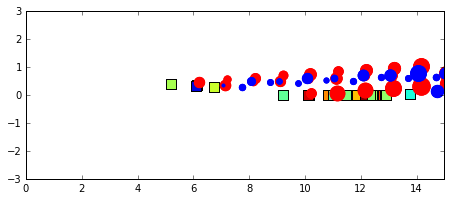

******************** New Time Step ********************
t =  1.3574198816084915 time step =  133
AOA =  1.32731219096 RA =  359.981528376
Pitching Rate =  13.5485451571 Pitching Moment =  1070495.11837
q_target =  17.3453756181 CFP_target =  3.79683046099 E_target =  -3.79683046099
CFP Starboard Lift =  4643.96839534 CFP Port Lift =  4643.90548169
DW Starboard Lift =  994.205412953 DW Port Lift =  996.548604171
Total Lift =  11278.6278941
CFP Starboard Control Input =  0.277927089102 CFP Port Control Input =  0.277927089102
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: 4.40110488222 4.40110488222 Elevon angle: -5.29545222727 -5.29545222727


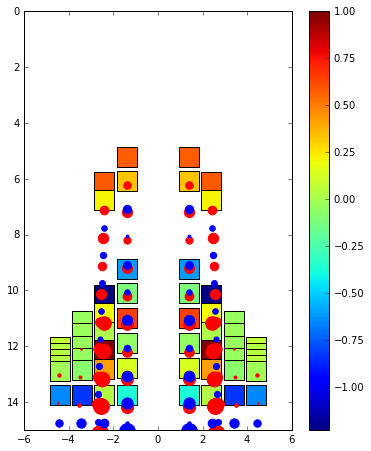

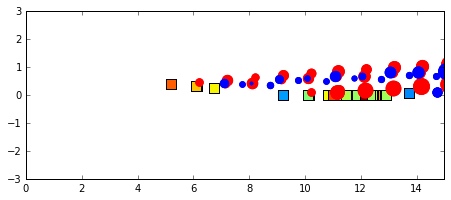

******************** New Time Step ********************
t =  1.3676260461318637 time step =  134
AOA =  1.47225152151 RA =  359.981089732
Pitching Rate =  14.2011556072 Pitching Moment =  1122059.05331
q_target =  17.055496957 CFP_target =  2.85434134981 E_target =  -2.85434134981
CFP Starboard Lift =  -436.524242421 CFP Port Lift =  -434.128498766
DW Starboard Lift =  7000.09269257 DW Port Lift =  7023.03617061
Total Lift =  13152.476122
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: 0.726885653802 0.726885653802 Elevon angle: -1.62123299885 -1.62123299885


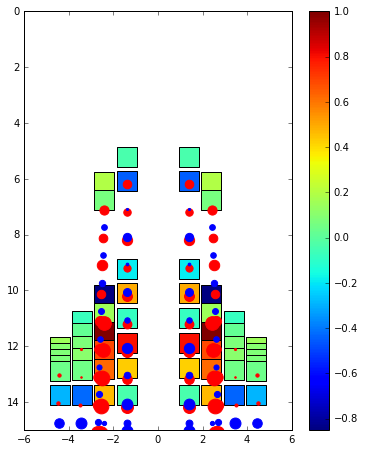

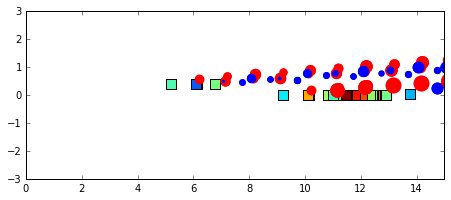

******************** New Time Step ********************
t =  1.3778322106552356 time step =  135
AOA =  1.61434093813 RA =  359.980614388
Pitching Rate =  13.9219210411 Pitching Moment =  1099996.22394
q_target =  16.7713181237 CFP_target =  2.84939708266 E_target =  -2.84939708266
CFP Starboard Lift =  6388.99424807 CFP Port Lift =  6390.20516459
DW Starboard Lift =  -1098.07589976 DW Port Lift =  -1082.06929869
Total Lift =  10599.0542142
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -0.818776055869 Elevon Port Control Input =  -0.818776055869
CFP angle: 4.40110488222 4.40110488222 Elevon angle: -4.62959572709 -4.62959572709


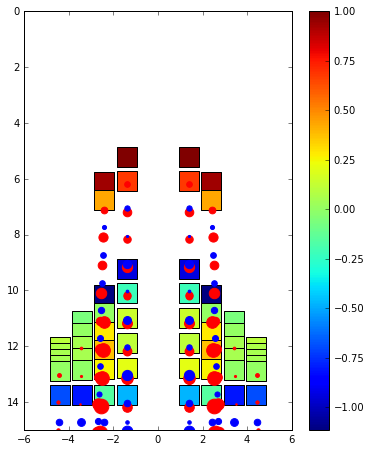

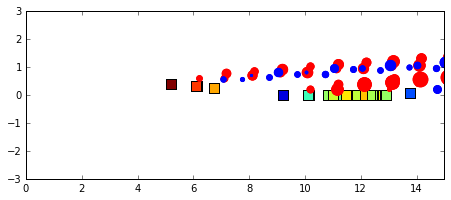

******************** New Time Step ********************
t =  1.3880383751786078 time step =  136
AOA =  1.76539021482 RA =  359.980109188
Pitching Rate =  14.7998081296 Pitching Moment =  1169359.67455
q_target =  16.4692195704 CFP_target =  1.66941144079 E_target =  -1.66941144079
CFP Starboard Lift =  -1807.32652698 CFP Port Lift =  -1806.30942577
DW Starboard Lift =  8405.40978358 DW Port Lift =  8422.3074744
Total Lift =  13214.0813052
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: 0.726885653802 0.726885653802 Elevon angle: -0.955376498681 -0.955376498681


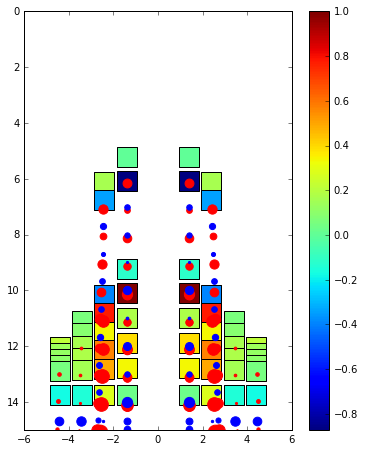

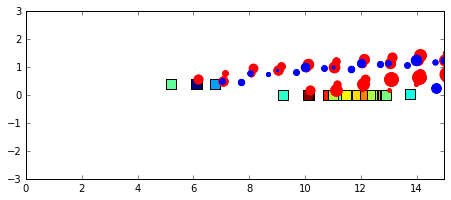

******************** New Time Step ********************
t =  1.39824453970198 time step =  137
AOA =  1.91256312562 RA =  359.979573875
Pitching Rate =  14.4200018007 Pitching Moment =  1139350.48785
q_target =  16.1748737488 CFP_target =  1.75487194809 E_target =  -1.75487194809
CFP Starboard Lift =  5212.25090806 CFP Port Lift =  5213.5185083
DW Starboard Lift =  1873.99684256 DW Port Lift =  1889.44893581
Total Lift =  14189.2151947
CFP Starboard Control Input =  0.685324196189 CFP Port Control Input =  0.685324196189
Elevon Starboard Control Input =  -0.53299696627 Elevon Port Control Input =  -0.53299696627
CFP angle: 3.24491699314 3.24491699314 Elevon angle: -2.91372420083 -2.91372420083


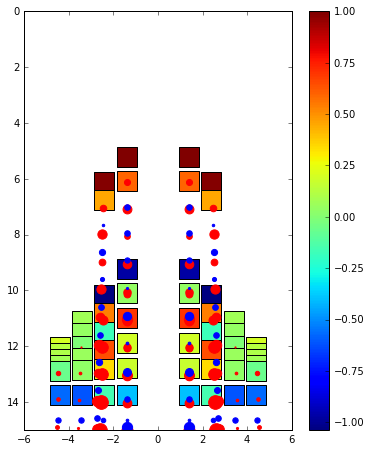

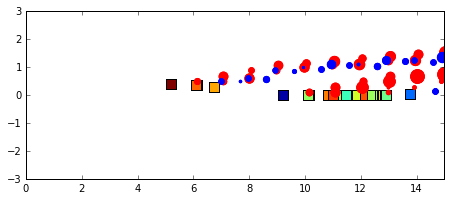

******************** New Time Step ********************
t =  1.408450704225352 time step =  138
AOA =  2.06653182718 RA =  359.979007386
Pitching Rate =  15.0858533787 Pitching Moment =  1191960.62832
q_target =  15.8669363456 CFP_target =  0.781082966931 E_target =  -0.781082966931
CFP Starboard Lift =  35.4993709935 CFP Port Lift =  28.2597621763
DW Starboard Lift =  8239.22357981 DW Port Lift =  8164.54089586
Total Lift =  16467.5236088
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -0.429302235278 -0.429302235278 Elevon angle: 0.760495027579 0.760495027579


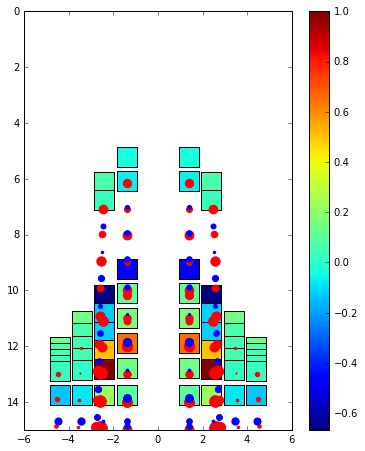

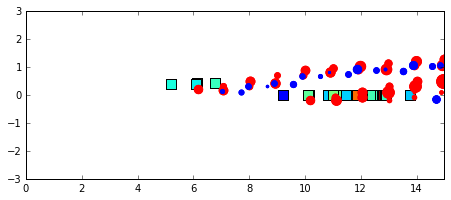

******************** New Time Step ********************
t =  1.4186568687487242 time step =  139
AOA =  2.21434869273 RA =  359.978555148
Pitching Rate =  14.483096487 Pitching Moment =  1144335.71342
q_target =  15.5713026145 CFP_target =  1.08820612753 E_target =  -1.08820612753
CFP Starboard Lift =  6269.92047593 CFP Port Lift =  6280.53659053
DW Starboard Lift =  2971.31377476 DW Port Lift =  3039.28015928
Total Lift =  18561.0510005
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: 3.24491699314 3.24491699314 Elevon angle: -2.91372420083 -2.91372420083


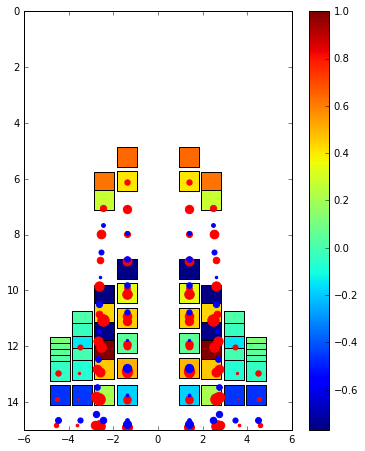

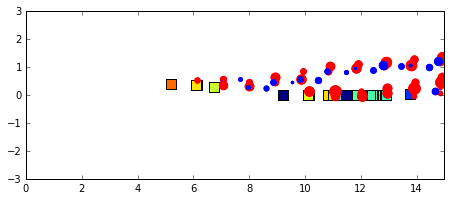

******************** New Time Step ********************
t =  1.4288630332720964 time step =  140
AOA =  2.36905793683 RA =  359.978013224
Pitching Rate =  15.1584117362 Pitching Moment =  1197693.5957
q_target =  15.2618841263 CFP_target =  0.10347239018 E_target =  -0.10347239018
CFP Starboard Lift =  -659.104426468 CFP Port Lift =  -670.183034498
DW Starboard Lift =  5103.31867173 DW Port Lift =  5039.22886714
Total Lift =  8813.2600779
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -0.429302235278 -0.429302235278 Elevon angle: 0.760495027579 0.760495027579


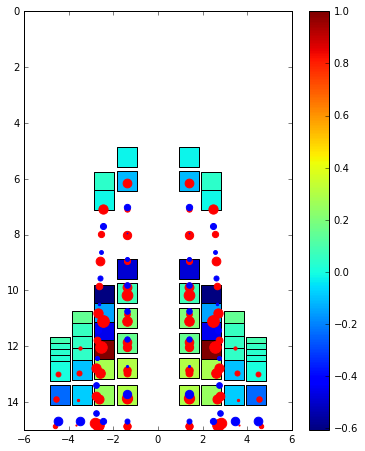

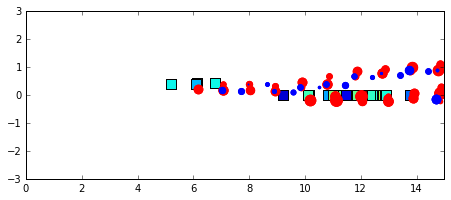

******************** New Time Step ********************
t =  1.4390691977954684 time step =  141
AOA =  2.51552907977 RA =  359.977553895
Pitching Rate =  14.3512425851 Pitching Moment =  1133917.69756
q_target =  14.9689418405 CFP_target =  0.617699255331 E_target =  -0.617699255331
CFP Starboard Lift =  4742.04530182 CFP Port Lift =  4749.03769973
DW Starboard Lift =  12516.5173127 DW Port Lift =  12563.8704074
Total Lift =  34571.4707217
CFP Starboard Control Input =  0.698000993739 CFP Port Control Input =  0.698000993739
Elevon Starboard Control Input =  -0.918796188607 Elevon Port Control Input =  -0.918796188607
CFP angle: 2.13530643737 2.13530643737 Elevon angle: -2.61536359559 -2.61536359559


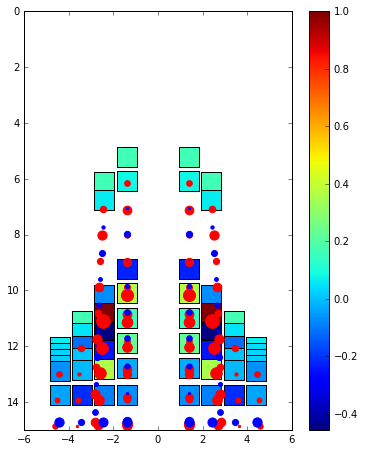

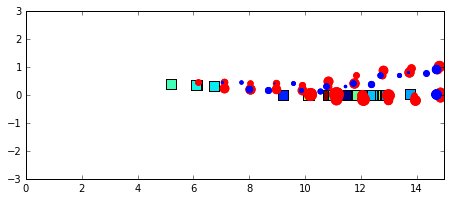

******************** New Time Step ********************
t =  1.4492753623188406 time step =  142
AOA =  2.67043257949 RA =  359.977029766
Pitching Rate =  15.1774449025 Pitching Moment =  1199197.44068
q_target =  14.659134841 CFP_target =  -0.51831006145 E_target =  0.51831006145
CFP Starboard Lift =  816.166367624 CFP Port Lift =  811.8934032
DW Starboard Lift =  -4824.02874997 DW Port Lift =  -4789.73107448
Total Lift =  -7985.70005362
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -1.53891279104 -1.53891279104 Elevon angle: 1.05885563282 1.05885563282


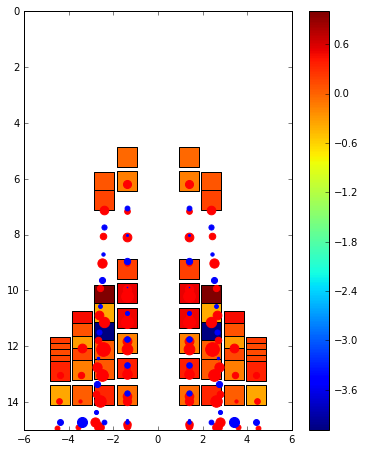

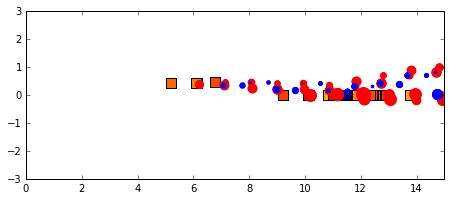

******************** New Time Step ********************
t =  1.4594815268422128 time step =  143
AOA =  2.82939373334 RA =  359.976492597
Pitching Rate =  15.5750138548 Pitching Moment =  1230610.08446
q_target =  14.3412125333 CFP_target =  -1.23380132147 E_target =  1.23380132147
CFP Starboard Lift =  3630.93009345 CFP Port Lift =  3635.12207192
DW Starboard Lift =  -7096.77766977 DW Port Lift =  -7045.82493646
Total Lift =  -6876.55044085
CFP Starboard Control Input =  0.203407646379 CFP Port Control Input =  0.203407646379
Elevon Starboard Control Input =  0.116630459103 Elevon Port Control Input =  0.116630459103
CFP angle: -0.791548505511 -0.791548505511 Elevon angle: 1.48738150827 1.48738150827


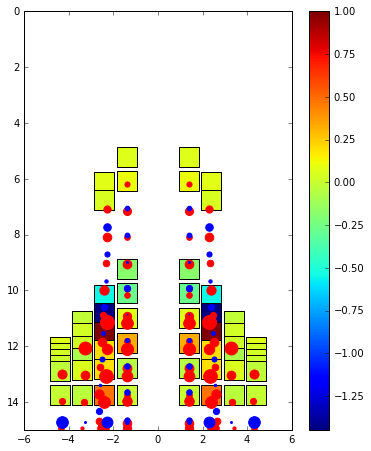

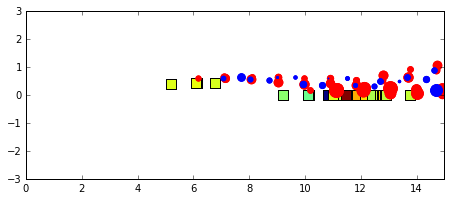

******************** New Time Step ********************
t =  1.4696876913655847 time step =  144
AOA =  2.98092439112 RA =  359.975888916
Pitching Rate =  14.8469738489 Pitching Moment =  1173086.32355
q_target =  14.0381512178 CFP_target =  -0.808822631147 E_target =  0.808822631147
CFP Starboard Lift =  4107.45988097 CFP Port Lift =  4103.26044225
DW Starboard Lift =  -7873.76037995 DW Port Lift =  -7906.25256185
Total Lift =  -7569.29261858
CFP Starboard Control Input =  -0.011516083757 CFP Port Control Input =  -0.011516083757
Elevon Starboard Control Input =  -0.452372584752 Elevon Port Control Input =  -0.452372584752
CFP angle: -0.833861121887 -0.833861121887 Elevon angle: -0.174734541028 -0.174734541028


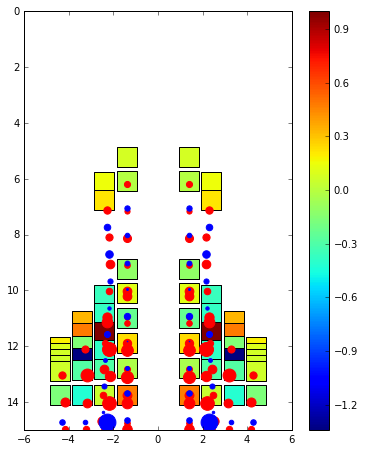

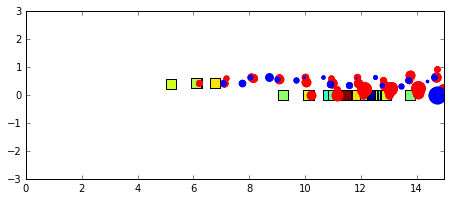

******************** New Time Step ********************
t =  1.479893855888957 time step =  145
AOA =  3.14135151205 RA =  359.975353188
Pitching Rate =  15.7186493093 Pitching Moment =  1241958.98215
q_target =  13.7172969759 CFP_target =  -2.0013523334 E_target =  2.0013523334
CFP Starboard Lift =  880.876027925 CFP Port Lift =  883.854223968
DW Starboard Lift =  7571.08083924 DW Port Lift =  7586.43503882
Total Lift =  16922.24613
CFP Starboard Control Input =  -0.77832747434 CFP Port Control Input =  -0.77832747434
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -3.69360689411 -3.69360689411 Elevon angle: 3.49948468739 3.49948468739


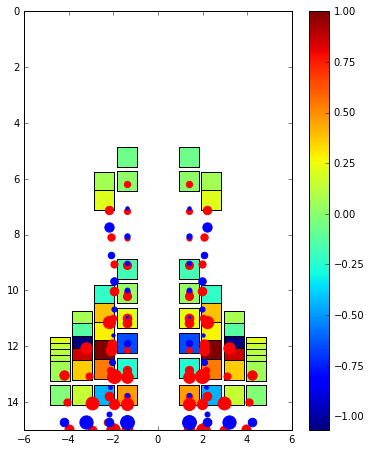

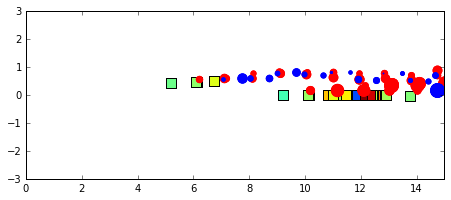

******************** New Time Step ********************
t =  1.4901000204123291 time step =  146
AOA =  3.29890637082 RA =  359.974795257
Pitching Rate =  15.4372250624 Pitching Moment =  1219723.14214
q_target =  13.4021872584 CFP_target =  -2.03503780404 E_target =  2.03503780404
CFP Starboard Lift =  5225.89174074 CFP Port Lift =  5222.32187229
DW Starboard Lift =  7583.53034109 DW Port Lift =  7557.5783354
Total Lift =  25589.3222895
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -0.976297922229 Elevon Port Control Input =  -0.976297922229
CFP angle: -0.0193876656964 -0.0193876656964 Elevon angle: -0.0876479111276 -0.0876479111276


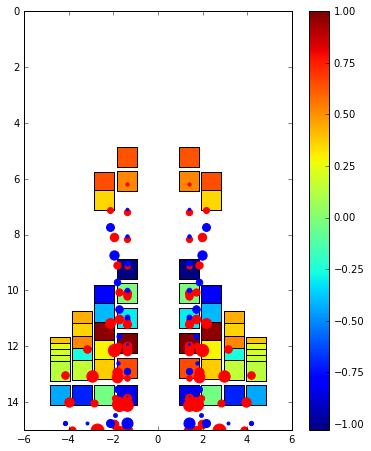

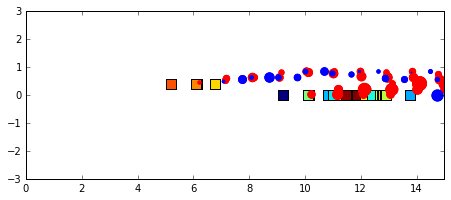

******************** New Time Step ********************
t =  1.5003061849357011 time step =  147
AOA =  3.46153141129 RA =  359.974276932
Pitching Rate =  15.9340014647 Pitching Moment =  1258974.34641
q_target =  13.0769371774 CFP_target =  -2.85706428727 E_target =  2.85706428727
CFP Starboard Lift =  -7.12539882277 CFP Port Lift =  -2.37020720114
DW Starboard Lift =  12954.7713581 DW Port Lift =  12996.4698918
Total Lift =  25941.7456439
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -3.69360689411 -3.69360689411 Elevon angle: 3.58657131729 3.58657131729


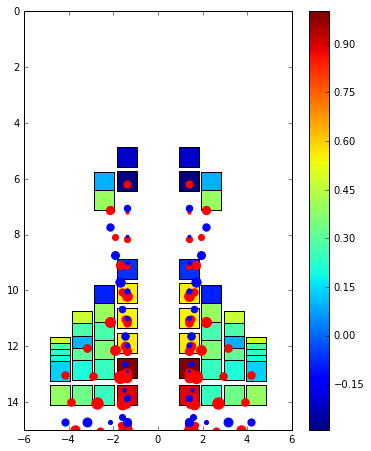

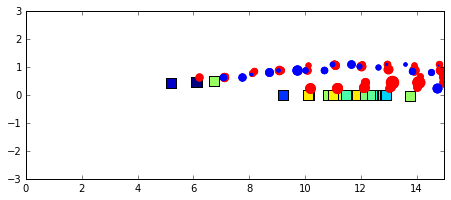

******************** New Time Step ********************
t =  1.5105123494590733 time step =  148
AOA =  3.61827185346 RA =  359.973695775
Pitching Rate =  15.3574285241 Pitching Moment =  1213418.27296
q_target =  12.7634562931 CFP_target =  -2.59397223099 E_target =  2.59397223099
CFP Starboard Lift =  4671.71294318 CFP Port Lift =  4666.85413228
DW Starboard Lift =  7369.52548747 DW Port Lift =  7335.05537618
Total Lift =  24043.1479391
CFP Starboard Control Input =  0.733089775416 CFP Port Control Input =  0.733089775416
Elevon Starboard Control Input =  -0.6617327242 Elevon Port Control Input =  -0.6617327242
CFP angle: -1.00007434512 -1.00007434512 Elevon angle: 1.15522021796 1.15522021796


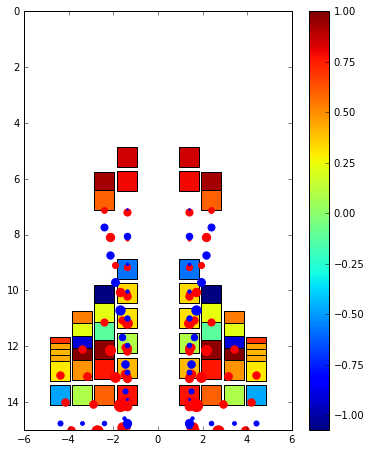

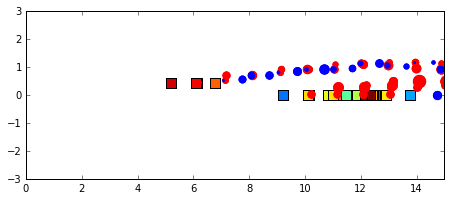

******************** New Time Step ********************
t =  1.5207185139824453 time step =  149
AOA =  3.77636334196 RA =  359.973164236
Pitching Rate =  15.4898040431 Pitching Moment =  1223877.50274
q_target =  12.4472733161 CFP_target =  -3.042530727 E_target =  3.042530727
CFP Starboard Lift =  896.029079542 CFP Port Lift =  898.650318273
DW Starboard Lift =  11531.6119798 DW Port Lift =  11559.4678673
Total Lift =  24885.7592449
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -4.67429357354 -4.67429357354 Elevon angle: 4.82943944637 4.82943944637


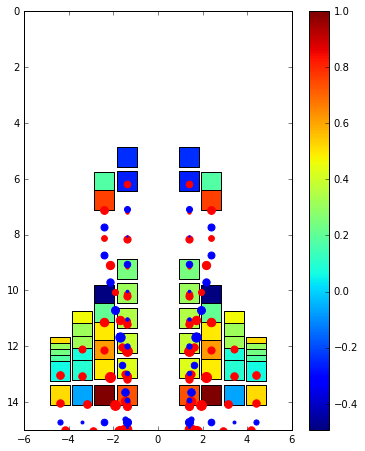

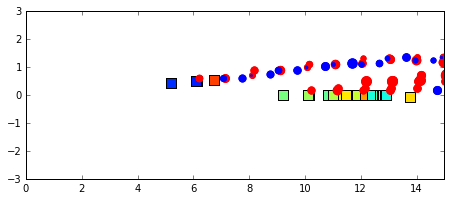

******************** New Time Step ********************
t =  1.5309246785058175 time step =  150
AOA =  3.92928378771 RA =  359.972593332
Pitching Rate =  14.9831452751 Pitching Moment =  1183845.47483
q_target =  12.1414324246 CFP_target =  -2.84171285053 E_target =  2.84171285053
CFP Starboard Lift =  4609.29130652 CFP Port Lift =  4606.4273375
DW Starboard Lift =  6167.83698102 DW Port Lift =  6150.3385002
Total Lift =  21533.8941252
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: -1.00007434512 -1.00007434512 Elevon angle: 1.15522021796 1.15522021796


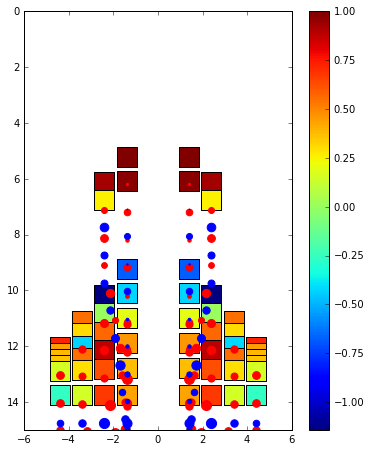

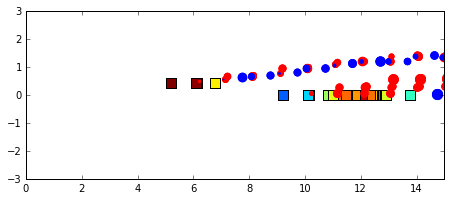

******************** New Time Step ********************
t =  1.5411308430291897 time step =  151
AOA =  4.08351223276 RA =  359.972047308
Pitching Rate =  15.1113030457 Pitching Moment =  1193971.45266
q_target =  11.8329755345 CFP_target =  -3.27832751126 E_target =  3.27832751126
CFP Starboard Lift =  -664.874097005 CFP Port Lift =  -660.469547025
DW Starboard Lift =  12941.4158594 DW Port Lift =  12980.5027735
Total Lift =  24596.5749889
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -4.67429357354 -4.67429357354 Elevon angle: 4.82943944637 4.82943944637


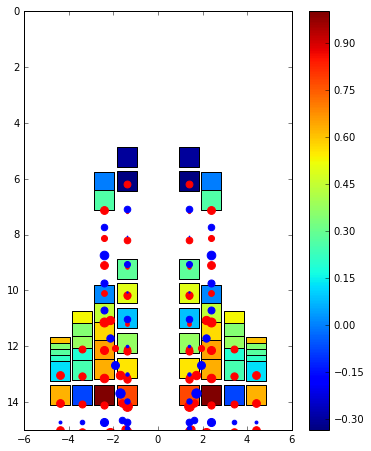

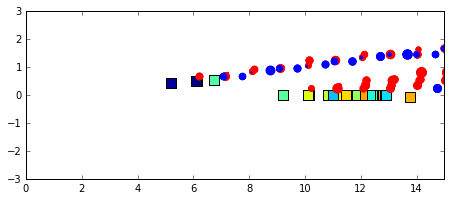

******************** New Time Step ********************
t =  1.5513370075525617 time step =  152
AOA =  4.23111236889 RA =  359.971444978
Pitching Rate =  14.4618613377 Pitching Moment =  1142657.88577
q_target =  11.5377752622 CFP_target =  -2.92408607547 E_target =  2.92408607547
CFP Starboard Lift =  5146.69369588 CFP Port Lift =  5142.48275726
DW Starboard Lift =  5560.89853453 DW Port Lift =  5533.99749781
Total Lift =  21384.0724855
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: -1.00007434512 -1.00007434512 Elevon angle: 1.15522021796 1.15522021796


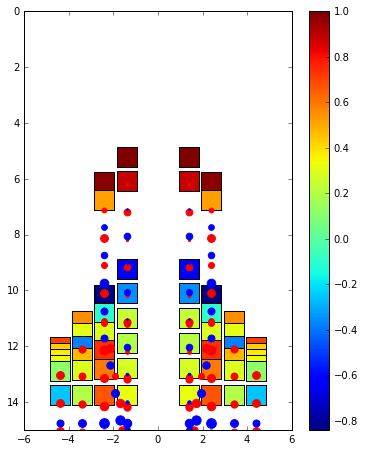

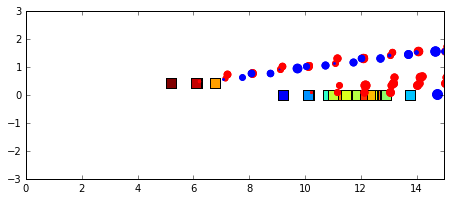

******************** New Time Step ********************
t =  1.5615431720759338 time step =  153
AOA =  4.38106005238 RA =  359.970879974
Pitching Rate =  14.6918740285 Pitching Moment =  1160831.60552
q_target =  11.2378798952 CFP_target =  -3.4539941333 E_target =  3.4539941333
CFP Starboard Lift =  -120.044304369 CFP Port Lift =  -116.709979317
DW Starboard Lift =  12254.0483721 DW Port Lift =  12281.7581759
Total Lift =  24299.0522643
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -4.67429357354 -4.67429357354 Elevon angle: 4.82943944637 4.82943944637


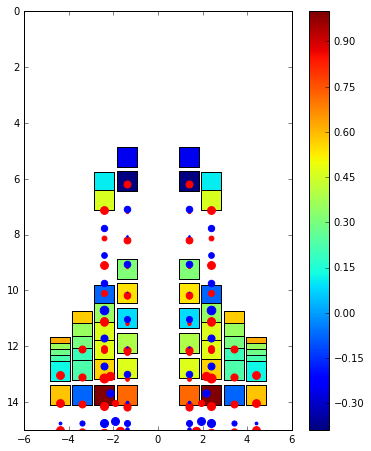

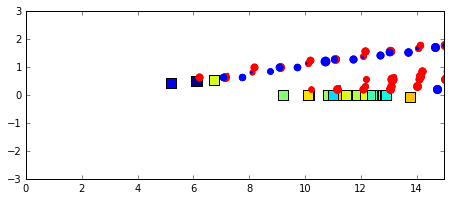

******************** New Time Step ********************
t =  1.571749336599306 time step =  154
AOA =  4.5253004449 RA =  359.970274585
Pitching Rate =  14.1326736591 Pitching Moment =  1116648.17042
q_target =  10.9493991102 CFP_target =  -3.18327454892 E_target =  3.18327454892
CFP Starboard Lift =  5003.53600359 CFP Port Lift =  5001.10111505
DW Starboard Lift =  5518.95144917 DW Port Lift =  5504.9480226
Total Lift =  21028.5365904
CFP Starboard Control Input =  0.994012683079 CFP Port Control Input =  0.994012683079
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: -1.02207306008 -1.02207306008 Elevon angle: 1.15522021796 1.15522021796


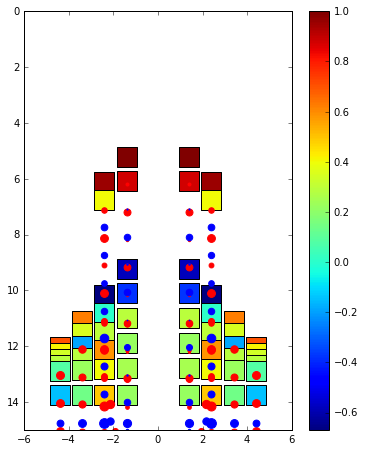

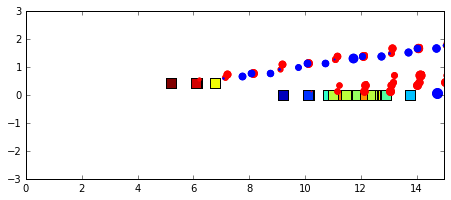

******************** New Time Step ********************
t =  1.581955501122678 time step =  155
AOA =  4.67236981735 RA =  359.96968829
Pitching Rate =  14.409857113 Pitching Moment =  1138548.93769
q_target =  10.6552603653 CFP_target =  -3.75459674771 E_target =  3.75459674771
CFP Starboard Lift =  -465.778559483 CFP Port Lift =  -461.883218009
DW Starboard Lift =  12954.3791679 DW Port Lift =  12985.1878422
Total Lift =  25011.9052327
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -4.69629228849 -4.69629228849 Elevon angle: 4.82943944637 4.82943944637


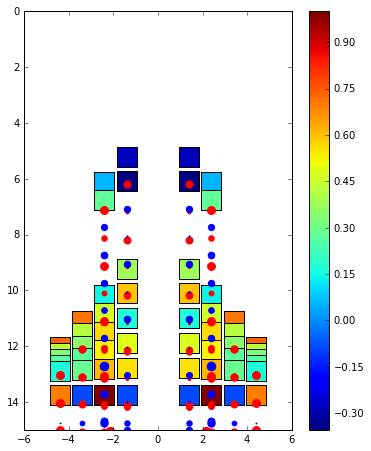

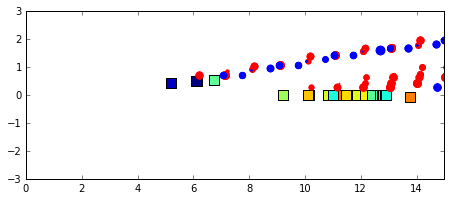

******************** New Time Step ********************
t =  1.5921616656460502 time step =  156
AOA =  4.81458532001 RA =  359.96905777
Pitching Rate =  13.9342749497 Pitching Moment =  1100972.32867
q_target =  10.37082936 CFP_target =  -3.56344558976 E_target =  3.56344558976
CFP Starboard Lift =  4515.51391168 CFP Port Lift =  4512.30032803
DW Starboard Lift =  6662.37691971 DW Port Lift =  6642.30228912
Total Lift =  22332.4934485
CFP Starboard Control Input =  0.75523113249 CFP Port Control Input =  0.75523113249
Elevon Starboard Control Input =  -0.84399590441 Elevon Port Control Input =  -0.84399590441
CFP angle: -1.9214075396 -1.9214075396 Elevon angle: 1.72841346569 1.72841346569


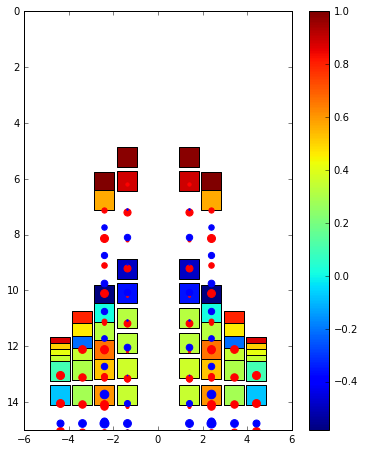

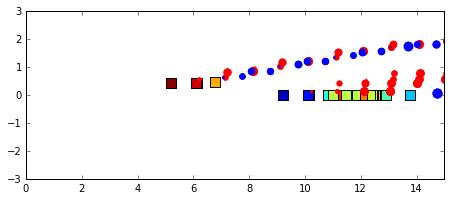

******************** New Time Step ********************
t =  1.6023678301694224 time step =  157
AOA =  4.95866425748 RA =  359.968454931
Pitching Rate =  14.1168542934 Pitching Moment =  1115398.25365
q_target =  10.082671485 CFP_target =  -4.03418280831 E_target =  4.03418280831
CFP Starboard Lift =  -125.685789515 CFP Port Lift =  -123.055733088
DW Starboard Lift =  12985.6125875 DW Port Lift =  13003.6524535
Total Lift =  25740.5235184
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -5.59562676801 -5.59562676801 Elevon angle: 5.4026326941 5.4026326941


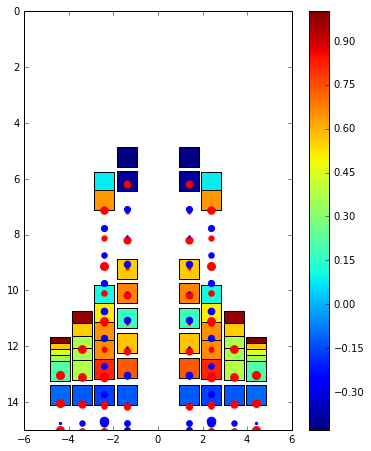

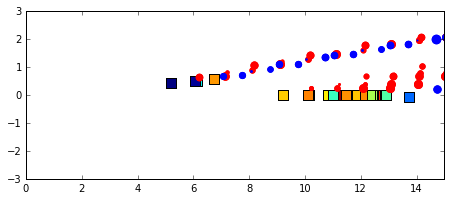

******************** New Time Step ********************
t =  1.6125739946927944 time step =  158
AOA =  5.10025726991 RA =  359.967828201
Pitching Rate =  13.8732833585 Pitching Moment =  1096153.27246
q_target =  9.79948546018 CFP_target =  -4.07379789837 E_target =  4.07379789837
CFP Starboard Lift =  5025.9721888 CFP Port Lift =  5022.779195
DW Starboard Lift =  6548.13012916 DW Port Lift =  6529.19183991
Total Lift =  23126.0733529
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -0.885889863822 Elevon Port Control Input =  -0.885889863822
CFP angle: -1.9214075396 -1.9214075396 Elevon angle: 2.14767912219 2.14767912219


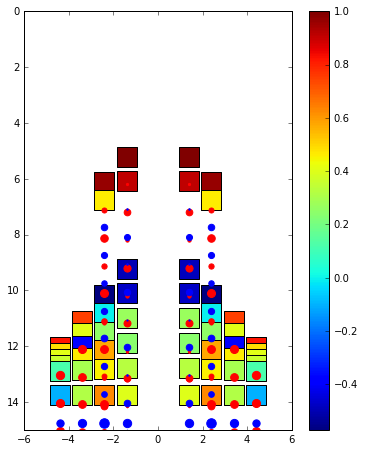

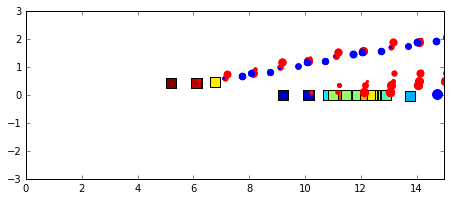

******************** New Time Step ********************
t =  1.6227801592161666 time step =  159
AOA =  5.24389939285 RA =  359.967229664
Pitching Rate =  14.0740552052 Pitching Moment =  1112016.62009
q_target =  9.5122012143 CFP_target =  -4.56185399088 E_target =  4.56185399088
CFP Starboard Lift =  765.795742913 CFP Port Lift =  767.228794705
DW Starboard Lift =  12435.4835754 DW Port Lift =  12450.8913207
Total Lift =  26419.3994336
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -5.59562676801 -5.59562676801 Elevon angle: 5.8218983506 5.8218983506


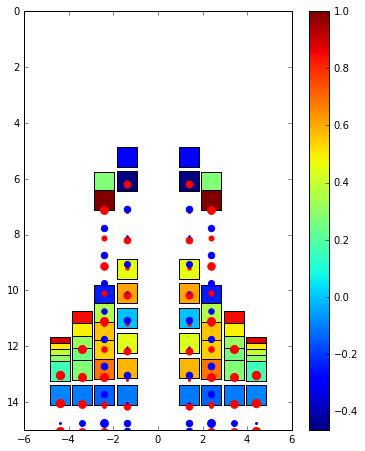

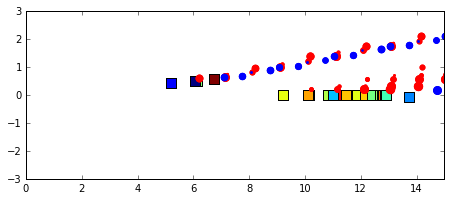

******************** New Time Step ********************
t =  1.6329863237395386 time step =  160
AOA =  5.38601203446 RA =  359.966612369
Pitching Rate =  13.9241966249 Pitching Moment =  1100176.02195
q_target =  9.22797593109 CFP_target =  -4.69622069383 E_target =  4.69622069383
CFP Starboard Lift =  3455.41696813 CFP Port Lift =  3454.92052756
DW Starboard Lift =  8810.97369576 DW Port Lift =  8810.48381764
Total Lift =  24531.7950091
CFP Starboard Control Input =  0.599604049456 CFP Port Control Input =  0.599604049456
Elevon Starboard Control Input =  -0.750451771181 Elevon Port Control Input =  -0.750451771181
CFP angle: -3.39255004007 -3.39255004007 Elevon angle: 3.06457402293 3.06457402293


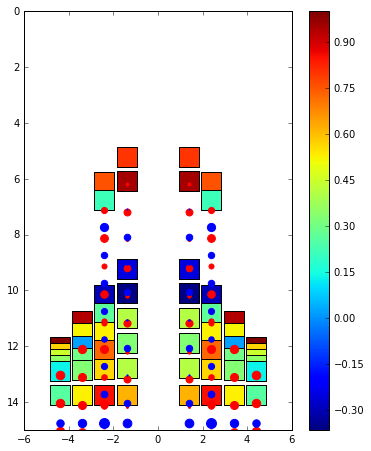

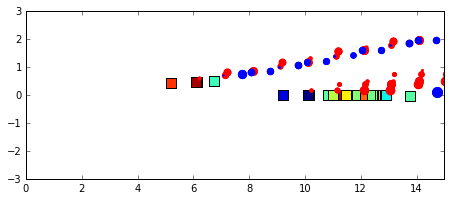

******************** New Time Step ********************
t =  1.6431924882629108 time step =  161
AOA =  5.52776228127 RA =  359.96599503
Pitching Rate =  13.888689183 Pitching Moment =  1097370.51459
q_target =  8.94447543745 CFP_target =  -4.94421374558 E_target =  4.94421374558
CFP Starboard Lift =  2341.04778314 CFP Port Lift =  2339.11571922
DW Starboard Lift =  11885.9061839 DW Port Lift =  11877.5500747
Total Lift =  28443.619761
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -7.06676926848 -7.06676926848 Elevon angle: 6.73879325135 6.73879325135


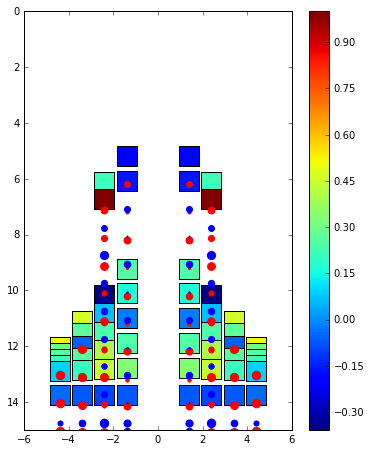

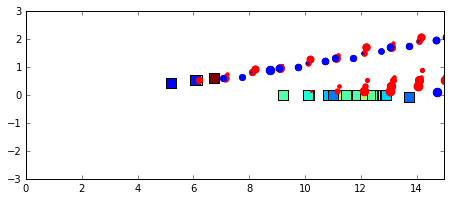

******************** New Time Step ********************
t =  1.653398652786283 time step =  162
AOA =  5.66913595818 RA =  359.965389867
Pitching Rate =  13.8517928638 Pitching Moment =  1094455.2695
q_target =  8.66172808363 CFP_target =  -5.19006478012 E_target =  5.19006478012
CFP Starboard Lift =  3452.02264186 CFP Port Lift =  3454.79679921
DW Starboard Lift =  8873.22990629 DW Port Lift =  8892.49555066
Total Lift =  24672.544898
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: -3.39255004007 -3.39255004007 Elevon angle: 3.06457402293 3.06457402293


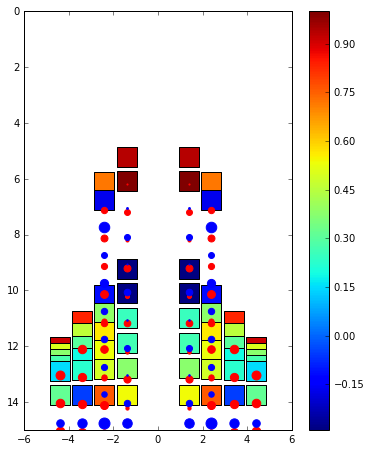

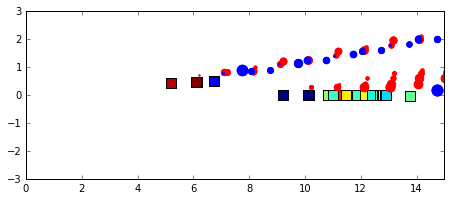

******************** New Time Step ********************
t =  1.663604817309655 time step =  163
AOA =  5.81091782907 RA =  359.964756681
Pitching Rate =  13.8917877097 Pitching Moment =  1097615.33479
q_target =  8.37816434185 CFP_target =  -5.51362336782 E_target =  5.51362336782
CFP Starboard Lift =  2523.64039184 CFP Port Lift =  2521.47115033
DW Starboard Lift =  11679.0488761 DW Port Lift =  11661.5577936
Total Lift =  28385.7182119
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -7.06676926848 -7.06676926848 Elevon angle: 6.73879325135 6.73879325135


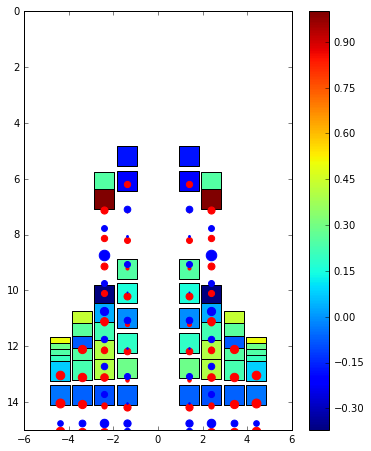

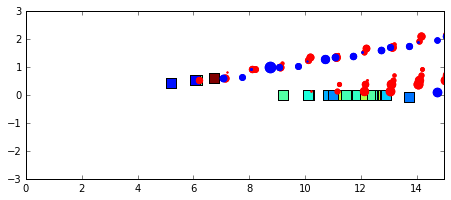

******************** New Time Step ********************
t =  1.6738109818330271 time step =  164
AOA =  5.95253772938 RA =  359.964145726
Pitching Rate =  13.8759178319 Pitching Moment =  1096361.42698
q_target =  8.09492454124 CFP_target =  -5.7809932907 E_target =  5.7809932907
CFP Starboard Lift =  3130.35187675 CFP Port Lift =  3132.40477902
DW Starboard Lift =  10136.5879977 DW Port Lift =  10151.8524078
Total Lift =  26551.1970612
CFP Starboard Control Input =  0.857183985189 CFP Port Control Input =  0.857183985189
Elevon Starboard Control Input =  -0.638533307099 Elevon Port Control Input =  -0.638533307099
CFP angle: -3.91728738781 -3.91728738781 Elevon angle: 4.39268189642 4.39268189642


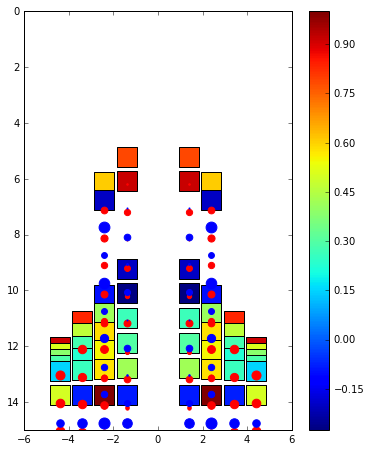

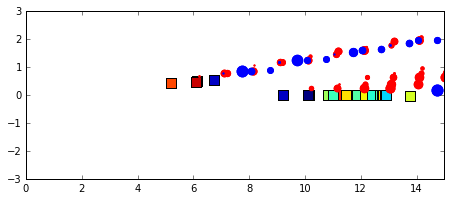

******************** New Time Step ********************
t =  1.6840171463563993 time step =  165
AOA =  6.09399551176 RA =  359.963513458
Pitching Rate =  13.8600335177 Pitching Moment =  1095106.37852
q_target =  7.81200897648 CFP_target =  -6.04802454127 E_target =  6.04802454127
CFP Starboard Lift =  1202.17241084 CFP Port Lift =  1199.39404464
DW Starboard Lift =  13679.2148154 DW Port Lift =  13663.107869
Total Lift =  29743.8891399
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -7.59150661622 -7.59150661622 Elevon angle: 8.06690112483 8.06690112483


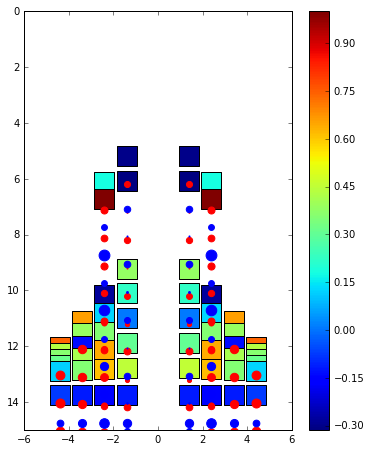

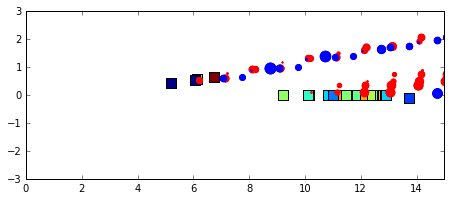

******************** New Time Step ********************
t =  1.6942233108797713 time step =  166
AOA =  6.23363315982 RA =  359.962902743
Pitching Rate =  13.6816967572 Pitching Moment =  1081015.66771
q_target =  7.53273368035 CFP_target =  -6.14896307683 E_target =  6.14896307683
CFP Starboard Lift =  3790.31271783 CFP Port Lift =  3793.07564556
DW Starboard Lift =  10238.1143737 DW Port Lift =  10257.1473792
Total Lift =  28078.6501163
CFP Starboard Control Input =  0.961695692932 CFP Port Control Input =  0.961695692932
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: -4.05802580937 -4.05802580937 Elevon angle: 4.39268189642 4.39268189642


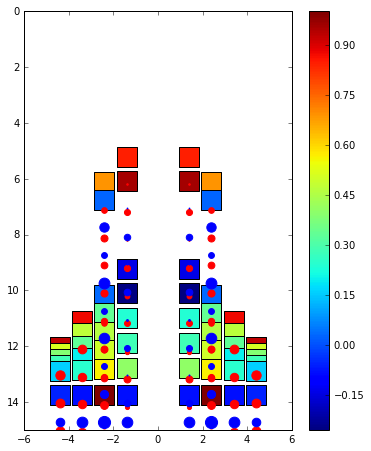

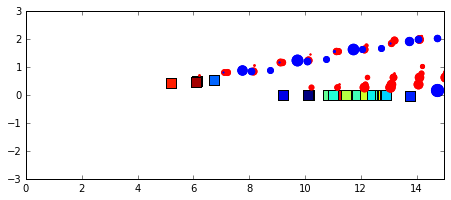

******************** New Time Step ********************
t =  1.7044294754031435 time step =  167
AOA =  6.37459518318 RA =  359.962267141
Pitching Rate =  13.8114590484 Pitching Moment =  1091268.42162
q_target =  7.25080963364 CFP_target =  -6.56064941475 E_target =  6.56064941475
CFP Starboard Lift =  1649.50375334 CFP Port Lift =  1646.77211416
DW Starboard Lift =  13226.0229232 DW Port Lift =  13208.7662135
Total Lift =  29731.0650042
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -7.73224503778 -7.73224503778 Elevon angle: 8.06690112483 8.06690112483


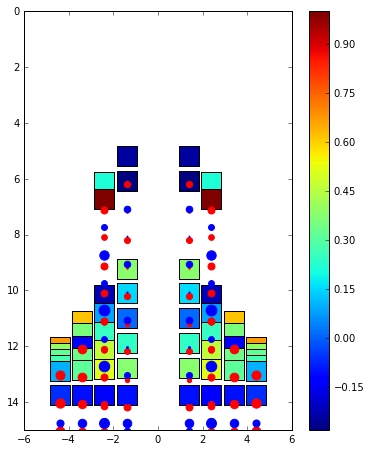

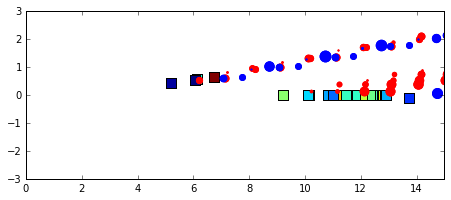

******************** New Time Step ********************
t =  1.7146356399265157 time step =  168
AOA =  6.51448413095 RA =  359.9616544
Pitching Rate =  13.7063191022 Pitching Moment =  1082961.12384
q_target =  6.97103173811 CFP_target =  -6.7352873641 E_target =  6.7352873641
CFP Starboard Lift =  2804.86630114 CFP Port Lift =  2807.55387138
DW Starboard Lift =  11233.8065313 DW Port Lift =  11252.0542091
Total Lift =  28098.2809129
CFP Starboard Control Input =  0.664638449126 CFP Port Control Input =  0.664638449126
Elevon Starboard Control Input =  -0.887742507159 Elevon Port Control Input =  -0.887742507159
CFP angle: -5.29021766806 -5.29021766806 Elevon angle: 4.80514053515 4.80514053515


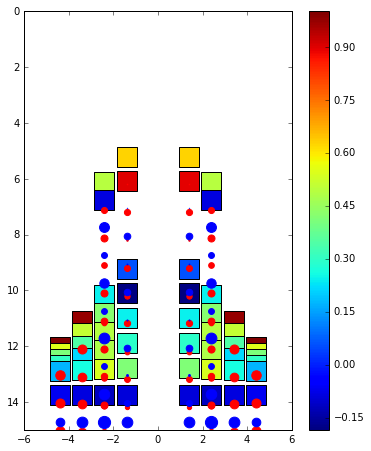

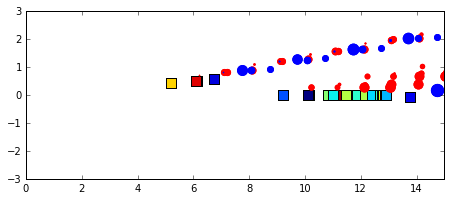

******************** New Time Step ********************
t =  1.7248418044498877 time step =  169
AOA =  6.65582638866 RA =  359.961018143
Pitching Rate =  13.848714411 Pitching Moment =  1094212.03537
q_target =  6.68834722268 CFP_target =  -7.16036718834 E_target =  7.16036718834
CFP Starboard Lift =  265.082450568 CFP Port Lift =  262.104804844
DW Starboard Lift =  14793.9166022 DW Port Lift =  14776.5981879
Total Lift =  30097.7020455
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -8.96443689648 -8.96443689648 Elevon angle: 8.47935976356 8.47935976356


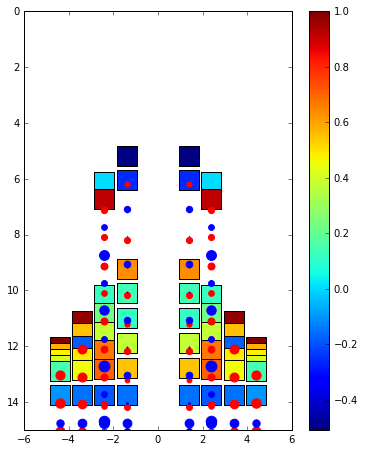

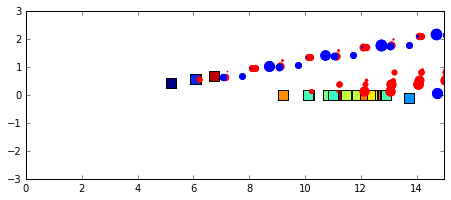

******************** New Time Step ********************
t =  1.7350479689732599 time step =  170
AOA =  6.79454543176 RA =  359.960405044
Pitching Rate =  13.5916918425 Pitching Moment =  1073904.21621
q_target =  6.41090913649 CFP_target =  -7.18078270605 E_target =  7.18078270605
CFP Starboard Lift =  3863.39440955 CFP Port Lift =  3866.20649245
DW Starboard Lift =  11190.4445796 DW Port Lift =  11208.663904
Total Lift =  30128.7093856
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -0.865718038345 Elevon Port Control Input =  -0.865718038345
CFP angle: -5.29021766806 -5.29021766806 Elevon angle: 5.29852190069 5.29852190069


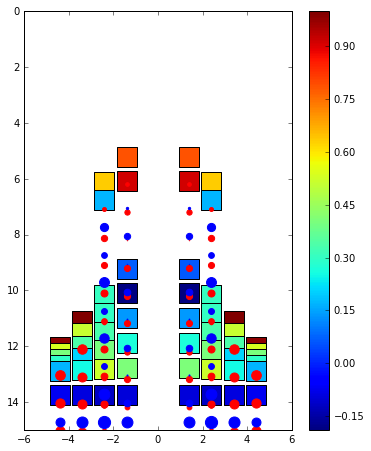

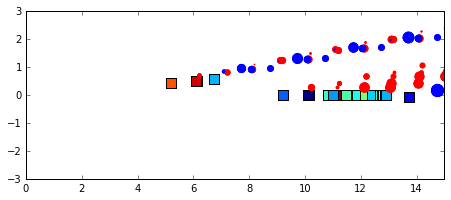

******************** New Time Step ********************
t =  1.745254133496632 time step =  171
AOA =  6.93607860747 RA =  359.95976833
Pitching Rate =  13.8674205564 Pitching Moment =  1095690.04183
q_target =  6.12784278506 CFP_target =  -7.73957777132 E_target =  7.73957777132
CFP Starboard Lift =  942.380211487 CFP Port Lift =  939.850573453
DW Starboard Lift =  14400.7289651 DW Port Lift =  14384.5817871
Total Lift =  30667.5415371
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -8.96443689648 -8.96443689648 Elevon angle: 8.9727411291 8.9727411291


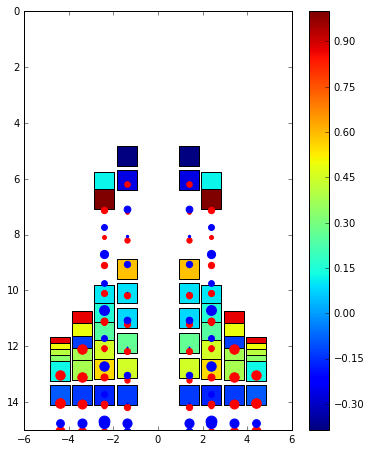

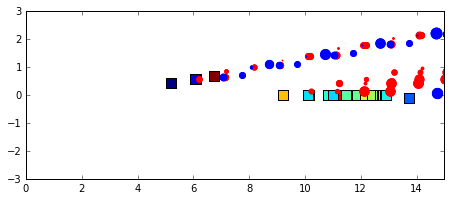

******************** New Time Step ********************
t =  1.755460298020004 time step =  172
AOA =  7.07601832325 RA =  359.959152935
Pitching Rate =  13.7112933524 Pitching Moment =  1083354.14836
q_target =  5.84796335349 CFP_target =  -7.86332999887 E_target =  7.86332999887
CFP Starboard Lift =  2969.60671077 CFP Port Lift =  2971.7343784
DW Starboard Lift =  12359.5238479 DW Port Lift =  12373.8340016
Total Lift =  30674.6989387
CFP Starboard Control Input =  0.734071265067 CFP Port Control Input =  0.734071265067
Elevon Starboard Control Input =  -0.739607420152 Elevon Port Control Input =  -0.739607420152
CFP angle: -6.26729813934 -6.26729813934 Elevon angle: 6.2552613245 6.2552613245


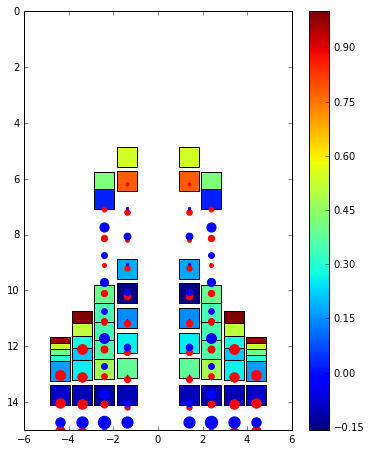

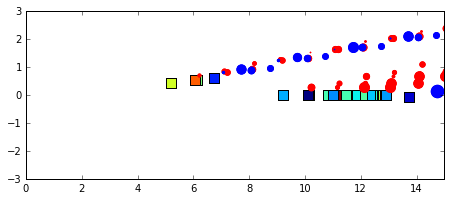

******************** New Time Step ********************
t =  1.7656664625433762 time step =  173
AOA =  7.21768287323 RA =  359.958519231
Pitching Rate =  13.8802926066 Pitching Moment =  1096707.08586
q_target =  5.56463425354 CFP_target =  -8.31565835307 E_target =  8.31565835307
CFP Starboard Lift =  -369.09967883 CFP Port Lift =  -372.081879665
DW Starboard Lift =  16134.7333582 DW Port Lift =  16119.3469288
Total Lift =  31512.8987286
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -9.94151736775 -9.94151736775 Elevon angle: 9.92948055292 9.92948055292


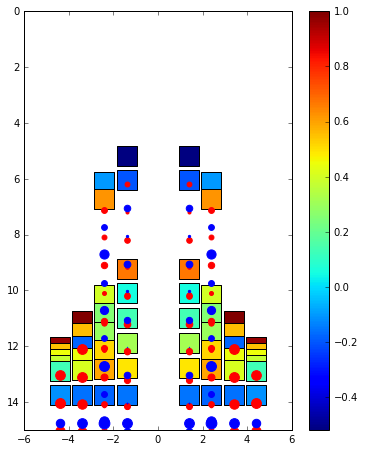

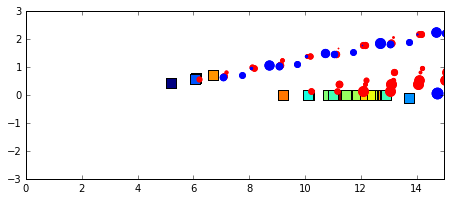

******************** New Time Step ********************
t =  1.7758726270667482 time step =  174
AOA =  7.35616353187 RA =  359.957906709
Pitching Rate =  13.5683349333 Pitching Moment =  1072058.74447
q_target =  5.28767293627 CFP_target =  -8.28066199704 E_target =  8.28066199704
CFP Starboard Lift =  3878.54665859 CFP Port Lift =  3881.3350119
DW Starboard Lift =  12362.0499978 DW Port Lift =  12379.5707117
Total Lift =  32501.50238
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: -6.26729813934 -6.26729813934 Elevon angle: 6.2552613245 6.2552613245


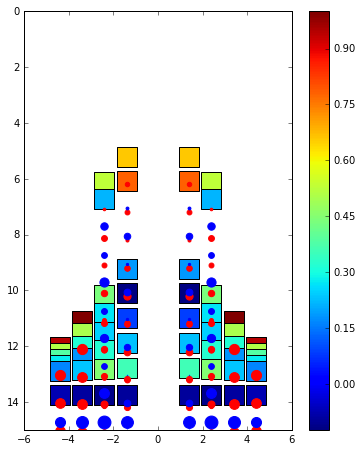

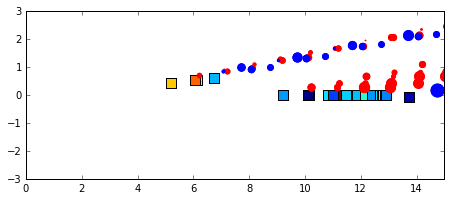

******************** New Time Step ********************
t =  1.7860787915901204 time step =  175
AOA =  7.49756985189 RA =  359.957271443
Pitching Rate =  13.8549912357 Pitching Moment =  1094707.97867
q_target =  5.00486029622 CFP_target =  -8.85013093952 E_target =  8.85013093952
CFP Starboard Lift =  -86.4241618758 CFP Port Lift =  -89.4225656584
DW Starboard Lift =  15856.9520107 DW Port Lift =  15840.2333546
Total Lift =  31521.3386377
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -9.94151736775 -9.94151736775 Elevon angle: 9.92948055292 9.92948055292


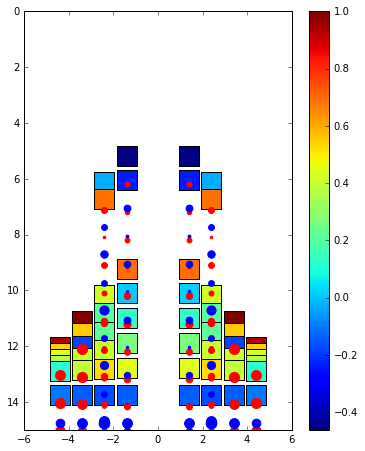

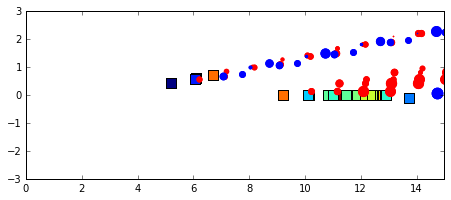

******************** New Time Step ********************
t =  1.7962849561134926 time step =  176
AOA =  7.63630526025 RA =  359.956658835
Pitching Rate =  13.5932953118 Pitching Moment =  1074030.90922
q_target =  4.72738947949 CFP_target =  -8.86590583226 E_target =  8.86590583226
CFP Starboard Lift =  3106.98708402 CFP Port Lift =  3108.92384115
DW Starboard Lift =  13441.2162939 DW Port Lift =  13453.4772752
Total Lift =  33110.6044943
CFP Starboard Control Input =  0.717074356996 CFP Port Control Input =  0.717074356996
Elevon Starboard Control Input =  -0.709049813771 Elevon Port Control Input =  -0.709049813771
CFP angle: -7.30682897708 -7.30682897708 Elevon angle: 7.32427609326 7.32427609326


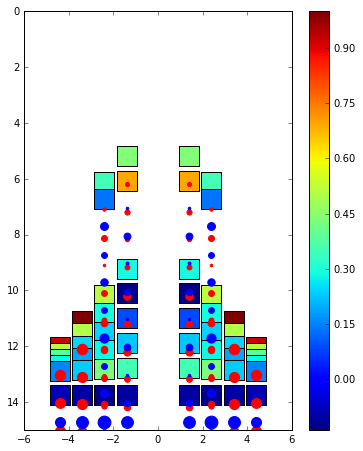

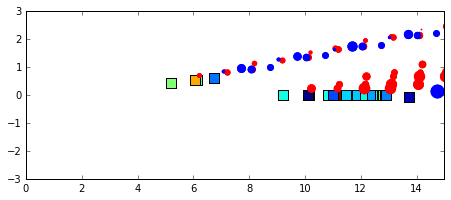

******************** New Time Step ********************
t =  1.8064911206368646 time step =  177
AOA =  7.77700404327 RA =  359.956030647
Pitching Rate =  13.7856667596 Pitching Moment =  1089230.52612
q_target =  4.44599191347 CFP_target =  -9.33967484613 E_target =  9.33967484613
CFP Starboard Lift =  -1110.75651282 CFP Port Lift =  -1113.96418042
DW Starboard Lift =  16803.5184752 DW Port Lift =  16789.0391473
Total Lift =  31367.8369293
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -10.9810482055 -10.9810482055 Elevon angle: 10.0 10.0


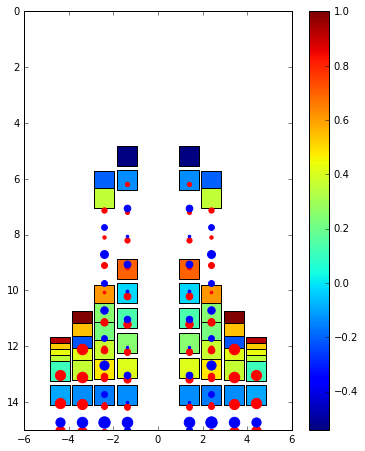

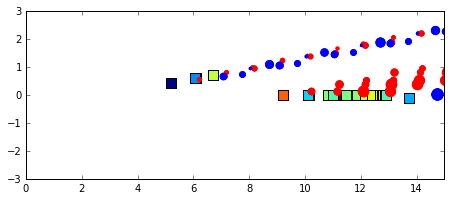

******************** New Time Step ********************
t =  1.8166972851602368 time step =  178
AOA =  7.91384948946 RA =  359.955423108
Pitching Rate =  13.4081168177 Pitching Moment =  1059399.62065
q_target =  4.17230102109 CFP_target =  -9.23581579657 E_target =  9.23581579657
CFP Starboard Lift =  3917.95918385 CFP Port Lift =  3920.57292231
DW Starboard Lift =  13802.0080914 DW Port Lift =  13818.0214291
Total Lift =  35458.5616267
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -0.509456135617 Elevon Port Control Input =  -0.509456135617
CFP angle: -7.30682897708 -7.30682897708 Elevon angle: 8.12814647048 8.12814647048


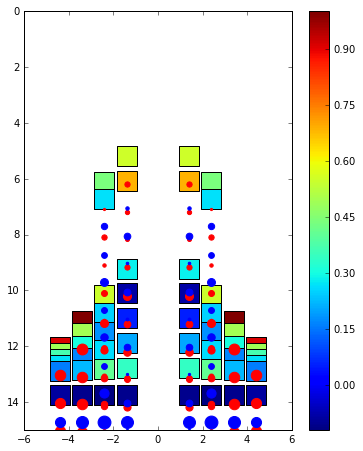

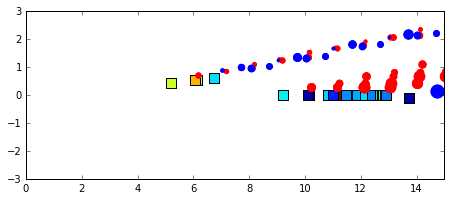

******************** New Time Step ********************
t =  1.826903449683609 time step =  179
AOA =  8.05376527375 RA =  359.954794876
Pitching Rate =  13.7089485452 Pitching Moment =  1083168.8809
q_target =  3.8924694525 CFP_target =  -9.81647909271 E_target =  9.81647909271
CFP Starboard Lift =  -957.997979593 CFP Port Lift =  -961.368618197
DW Starboard Lift =  16733.1174812 DW Port Lift =  16716.9645747
Total Lift =  31530.7154581
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -10.9810482055 -10.9810482055 Elevon angle: 10.0 10.0


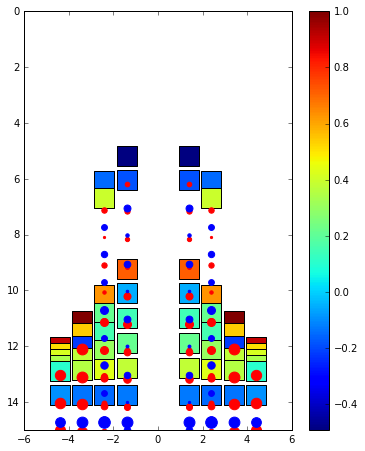

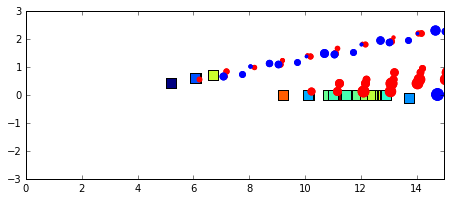

******************** New Time Step ********************
t =  1.837109614206981 time step =  180
AOA =  8.19014261632 RA =  359.954189313
Pitching Rate =  13.3622520248 Pitching Moment =  1055775.76021
q_target =  3.61971476736 CFP_target =  -9.74253725742 E_target =  9.74253725742
CFP Starboard Lift =  3449.04527027 CFP Port Lift =  3451.44818361
DW Starboard Lift =  14809.514468 DW Port Lift =  14823.7090133
Total Lift =  36533.7169352
CFP Starboard Control Input =  0.825673965381 CFP Port Control Input =  0.825673965381
Elevon Starboard Control Input =  -0.171641828388 Elevon Port Control Input =  -0.171641828388
CFP angle: -7.94734104549 -7.94734104549 Elevon angle: 9.36935029374 9.36935029374


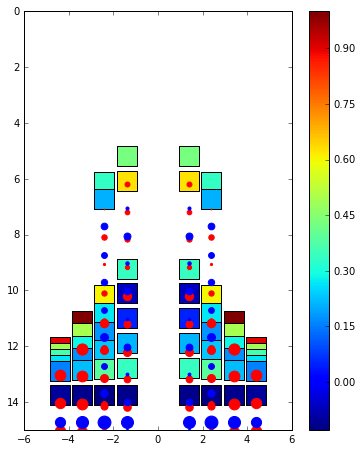

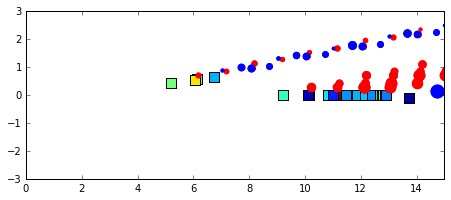

******************** New Time Step ********************
t =  1.8473157787303531 time step =  181
AOA =  8.32904699101 RA =  359.953565361
Pitching Rate =  13.6098506323 Pitching Moment =  1075338.97511
q_target =  3.34190601798 CFP_target =  -10.2679446143 E_target =  10.0
CFP Starboard Lift =  -1424.46932208 CFP Port Lift =  -1428.11437004
DW Starboard Lift =  17290.6339614 DW Port Lift =  17273.9906241
Total Lift =  31712.0408934
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  0.420433137509 Elevon Port Control Input =  0.420433137509
CFP angle: -11.6215602739 -11.6215602739 Elevon angle: 10.0 10.0


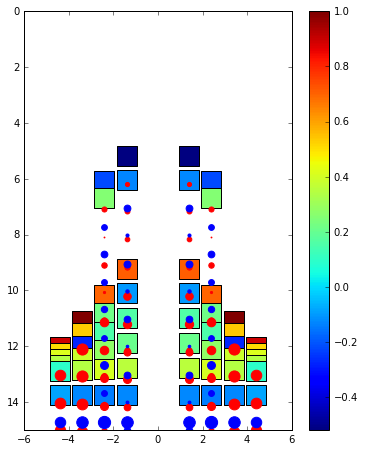

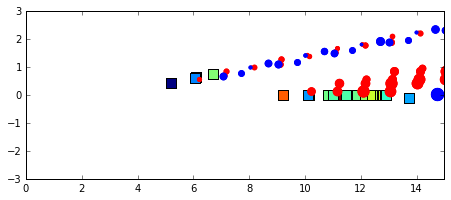

******************** New Time Step ********************
t =  1.8575219432537253 time step =  182
AOA =  8.46382573898 RA =  359.952965028
Pitching Rate =  13.2056217259 Pitching Moment =  1043400.11629
q_target =  3.07234852204 CFP_target =  -10.1332732038 E_target =  10.0
CFP Starboard Lift =  3951.53454677 CFP Port Lift =  3954.25617568
DW Starboard Lift =  15049.8448598 DW Port Lift =  15065.6226796
Total Lift =  38021.2582619
CFP Starboard Control Input =  0.992191380056 CFP Port Control Input =  0.992191380056
Elevon Starboard Control Input =  -0.0 Elevon Port Control Input =  -0.0
CFP angle: -7.97603162703 -7.97603162703 Elevon angle: 10.0 10.0


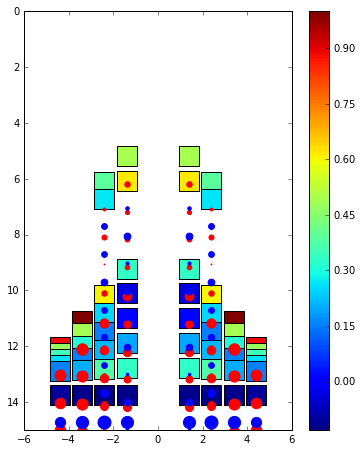

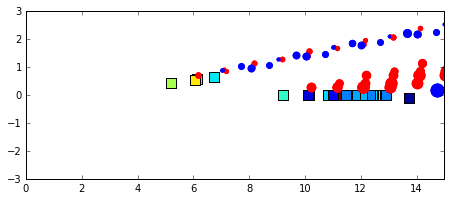

******************** New Time Step ********************
t =  1.8677281077770973 time step =  183
AOA =  8.60182345082 RA =  359.952344156
Pitching Rate =  13.5210158063 Pitching Moment =  1068319.97444
q_target =  2.79635309836 CFP_target =  -10.7246627079 E_target =  10.0
CFP Starboard Lift =  -1206.58380356 CFP Port Lift =  -1210.18047275
DW Starboard Lift =  17287.043366 DW Port Lift =  17270.6169624
Total Lift =  32140.8960521
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  -0.0 Elevon Port Control Input =  -0.0
CFP angle: -11.6502508554 -11.6502508554 Elevon angle: 10.0 10.0


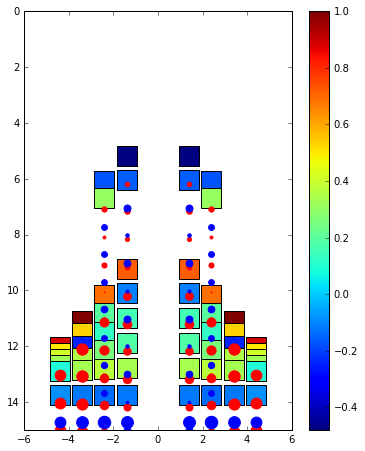

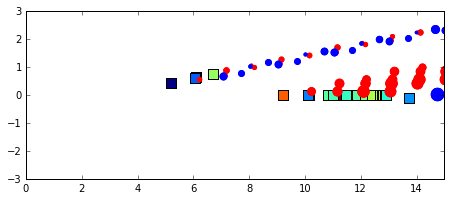

******************** New Time Step ********************
t =  1.8779342723004695 time step =  184
AOA =  8.73603151207 RA =  359.951746592
Pitching Rate =  13.1497058412 Pitching Moment =  1038982.10086
q_target =  2.52793697586 CFP_target =  -10.6217688653 E_target =  10.0
CFP Starboard Lift =  3048.74699018 CFP Port Lift =  3050.75088004
DW Starboard Lift =  15648.9220477 DW Port Lift =  15661.0441382
Total Lift =  37409.4640561
CFP Starboard Control Input =  0.685654660071 CFP Port Control Input =  0.685654660071
Elevon Starboard Control Input =  -0.0 Elevon Port Control Input =  -0.0
CFP angle: -9.13100531936 -9.13100531936 Elevon angle: 10.0 10.0


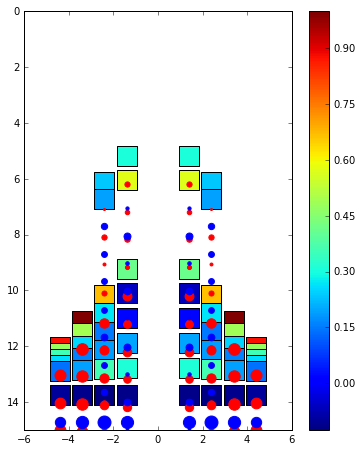

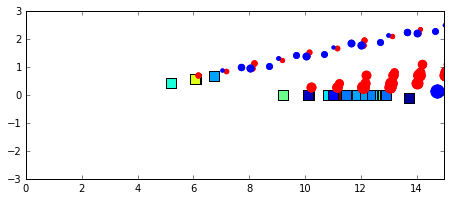

******************** New Time Step ********************
t =  1.8881404368238417 time step =  185
AOA =  8.87236233417 RA =  359.951133641
Pitching Rate =  13.3576939493 Pitching Moment =  1055415.6184
q_target =  2.25527533166 CFP_target =  -11.1024186177 E_target =  10.0
CFP Starboard Lift =  -1904.98003654 CFP Port Lift =  -1908.6895318
DW Starboard Lift =  17877.2179403 DW Port Lift =  17861.6060599
Total Lift =  31925.1544318
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  -0.0 Elevon Port Control Input =  -0.0
CFP angle: -12.8052245478 -12.8052245478 Elevon angle: 10.0 10.0


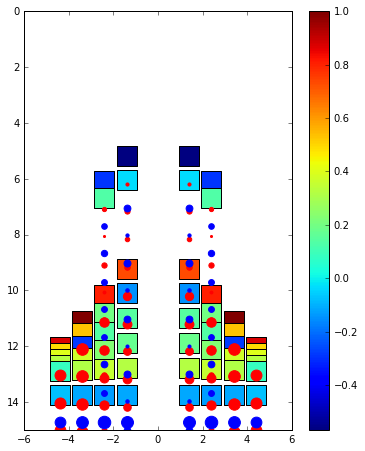

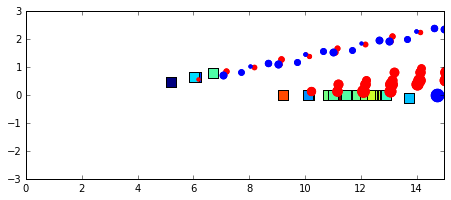

******************** New Time Step ********************
t =  1.8983466013472137 time step =  186
AOA =  9.00406388153 RA =  359.950543469
Pitching Rate =  12.9041176102 Pitching Moment =  1019577.72945
q_target =  1.99187223694 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -4512.24179084 CFP Port Lift =  -4512.62564215
DW Starboard Lift =  21243.7355669 DW Port Lift =  21261.2250717
Total Lift =  33480.0932057
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -16.4794437762 -16.4794437762 Elevon angle: 10.0 10.0


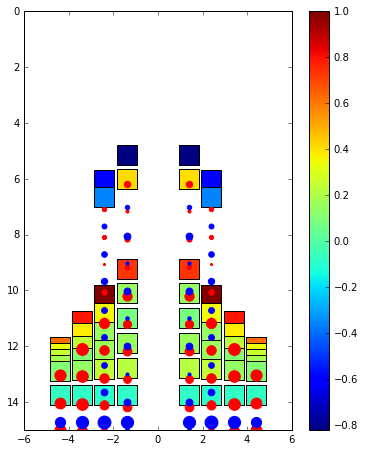

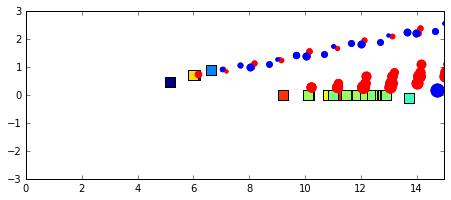

******************** New Time Step ********************
t =  1.9085527658705859 time step =  187
AOA =  9.1286686115 RA =  359.949934433
Pitching Rate =  12.2087714423 Pitching Moment =  964637.167952
q_target =  1.74266277701 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -2880.53084752 CFP Port Lift =  -2883.80168406
DW Starboard Lift =  19897.1205884 DW Port Lift =  19881.0550064
Total Lift =  34013.8430632
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


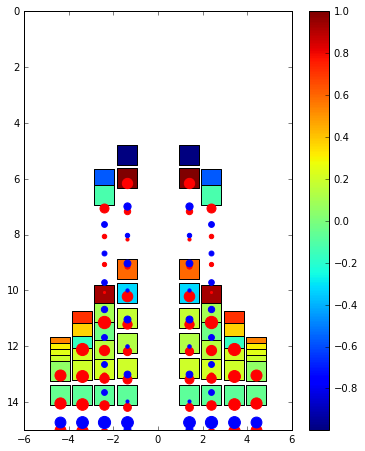

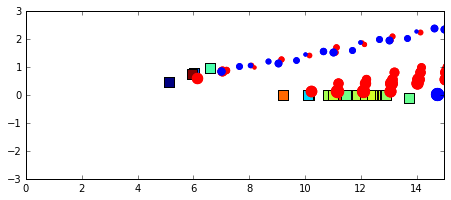

******************** New Time Step ********************
t =  1.9187589303939578 time step =  188
AOA =  9.24735743317 RA =  359.94934804
Pitching Rate =  11.629130748 Pitching Moment =  918838.705724
q_target =  1.50528513365 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -12947.3545049 CFP Port Lift =  -12949.0008335
DW Starboard Lift =  26624.2431686 DW Port Lift =  26638.8753682
Total Lift =  27366.7631983
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


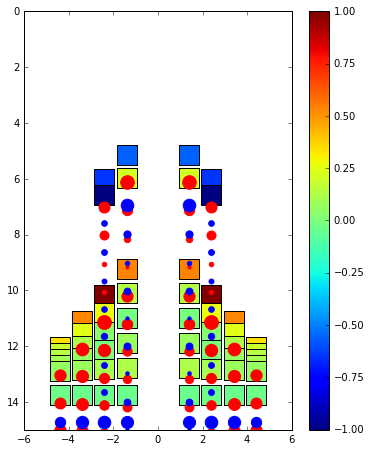

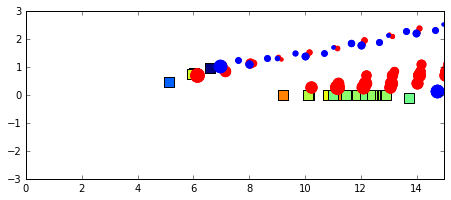

******************** New Time Step ********************
t =  1.92896509491733 time step =  189
AOA =  9.34985891175 RA =  359.94874749
Pitching Rate =  10.0430948707 Pitching Moment =  793523.135341
q_target =  1.3002821765 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -834.643230787 CFP Port Lift =  -838.06385343
DW Starboard Lift =  19239.6574457 DW Port Lift =  19223.9008663
Total Lift =  36790.8512278
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


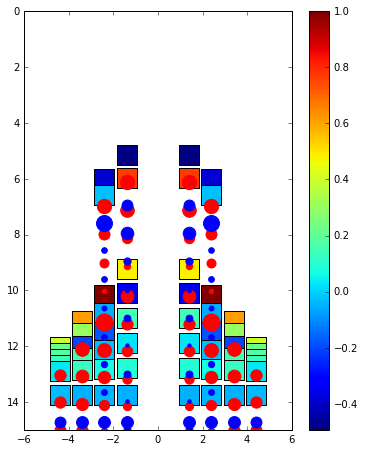

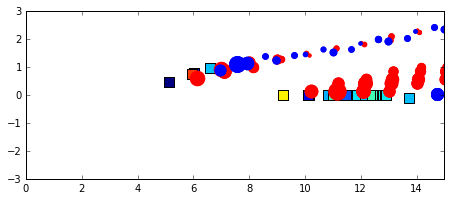

******************** New Time Step ********************
t =  1.9391712594407022 time step =  190
AOA =  9.45052356408 RA =  359.948169498
Pitching Rate =  9.86312263512 Pitching Moment =  779303.202692
q_target =  1.09895287185 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -15301.4587751 CFP Port Lift =  -15303.1111027
DW Starboard Lift =  28480.2636029 DW Port Lift =  28498.0952674
Total Lift =  26373.7889925
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


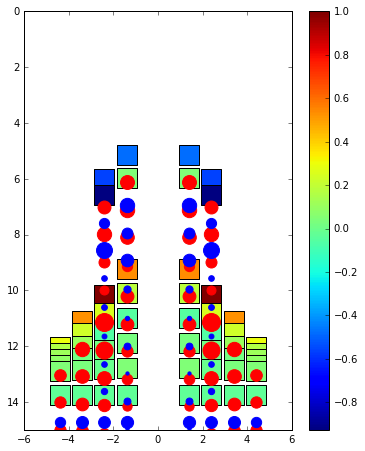

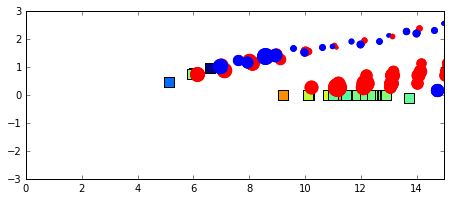

******************** New Time Step ********************
t =  1.9493774239640742 time step =  191
AOA =  9.53340026236 RA =  359.9475735
Pitching Rate =  8.12025889737 Pitching Moment =  641596.378705
q_target =  0.933199475289 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1251.54812918 CFP Port Lift =  -1255.20428754
DW Starboard Lift =  12233.9772387 DW Port Lift =  12219.6268027
Total Lift =  21946.8516247
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


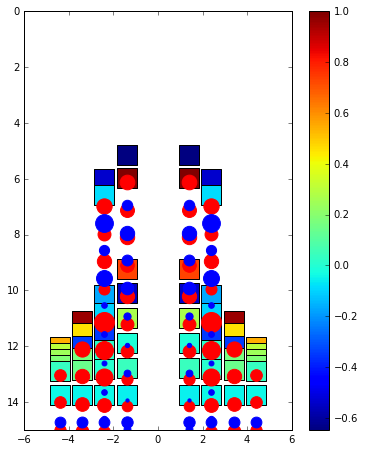

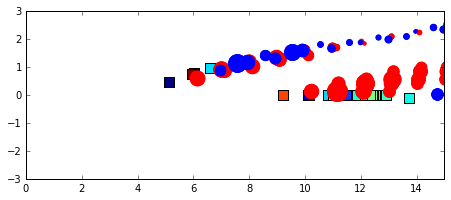

******************** New Time Step ********************
t =  1.9595835884874464 time step =  192
AOA =  9.61279770202 RA =  359.946998567
Pitching Rate =  7.77936113797 Pitching Moment =  614661.428636
q_target =  0.774404595968 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -17741.4566719 CFP Port Lift =  -17744.3609057
DW Starboard Lift =  20638.5478256 DW Port Lift =  20650.8431791
Total Lift =  5803.57342703
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


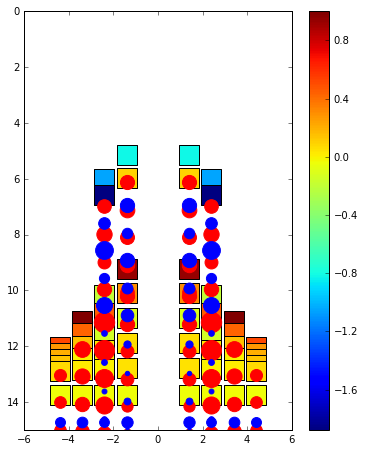

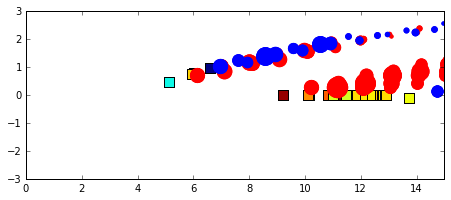

******************** New Time Step ********************
t =  1.9697897530108186 time step =  193
AOA =  9.66952143066 RA =  359.946413292
Pitching Rate =  5.5577909325 Pitching Moment =  439131.138669
q_target =  0.66095713868 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  109.360770195 CFP Port Lift =  106.027441354
DW Starboard Lift =  11691.2490417 DW Port Lift =  11677.3897252
Total Lift =  23584.0269785
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


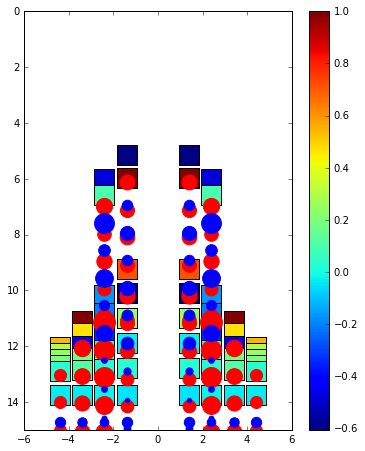

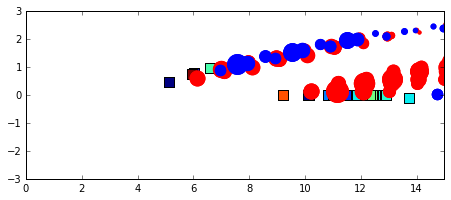

******************** New Time Step ********************
t =  1.9799959175341906 time step =  194
AOA =  9.72425078779 RA =  359.945848295
Pitching Rate =  5.36238241147 Pitching Moment =  423691.557118
q_target =  0.551498424423 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -17034.9365471 CFP Port Lift =  -17037.4909374
DW Starboard Lift =  20329.8931719 DW Port Lift =  20344.699137
Total Lift =  6602.16482441
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


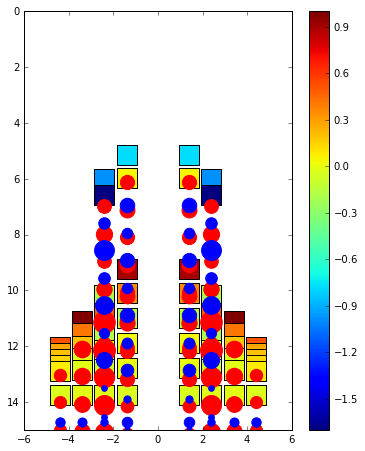

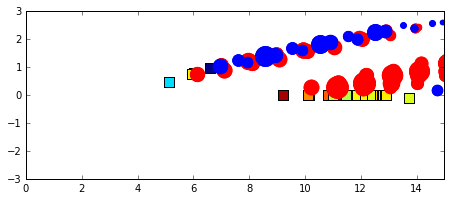

******************** New Time Step ********************
t =  1.9902020820575628 time step =  195
AOA =  9.75746676762 RA =  359.945269542
Pitching Rate =  3.25450170423 Pitching Moment =  257144.080541
q_target =  0.485066464753 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -633.272527037 CFP Port Lift =  -636.915648615
DW Starboard Lift =  10893.984553 DW Port Lift =  10878.5796243
Total Lift =  20502.3760017
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


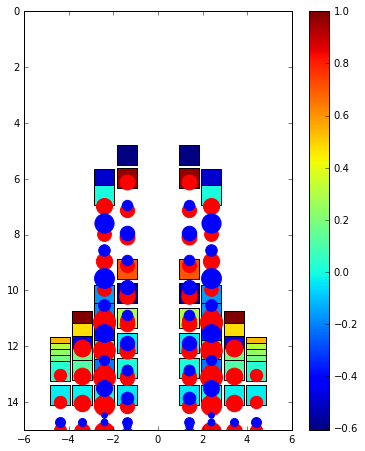

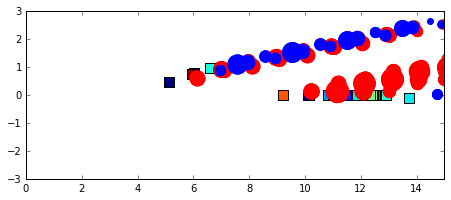

******************** New Time Step ********************
t =  2.000408246580935 time step =  196
AOA =  9.78826293451 RA =  359.944712998
Pitching Rate =  3.01740843138 Pitching Moment =  238410.911168
q_target =  0.423474130983 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -18194.3040907 CFP Port Lift =  -18197.5293074
DW Starboard Lift =  18526.0981597 DW Port Lift =  18539.2264287
Total Lift =  673.491190271
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


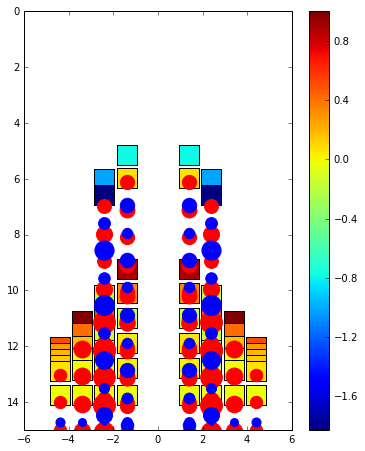

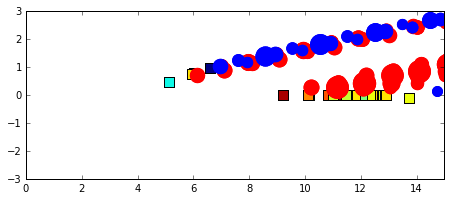

******************** New Time Step ********************
t =  2.010614411104307 time step =  197
AOA =  9.79664319898 RA =  359.944145358
Pitching Rate =  0.82109831288 Pitching Moment =  64876.4664726
q_target =  0.406713602041 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1803.47756812 CFP Port Lift =  -1807.3399123
DW Starboard Lift =  11499.5916902 DW Port Lift =  11486.7010756
Total Lift =  19375.4752854
CFP Starboard Control Input =  -0.276256473893 CFP Port Control Input =  -0.276256473893
Elevon Starboard Control Input =  0.276256473893 Elevon Port Control Input =  0.276256473893
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


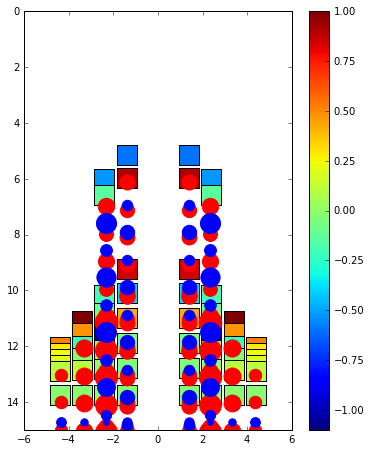

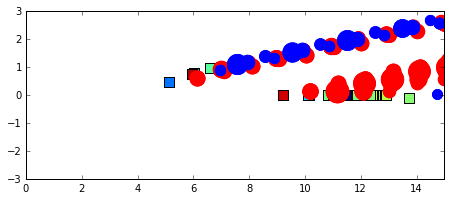

******************** New Time Step ********************
t =  2.020820575627679 time step =  198
AOA =  9.80156412478 RA =  359.943597732
Pitching Rate =  0.48215231007 Pitching Moment =  38095.7282317
q_target =  0.396871750437 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -10066.2148828 CFP Port Lift =  -10066.0529818
DW Starboard Lift =  14314.2011221 DW Port Lift =  14325.8131578
Total Lift =  8507.74641529
CFP Starboard Control Input =  -0.0568537064219 CFP Port Control Input =  -0.0568537064219
Elevon Starboard Control Input =  0.0568537064219 Elevon Port Control Input =  0.0568537064219
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


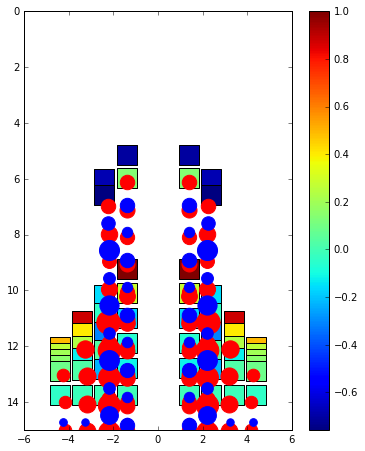

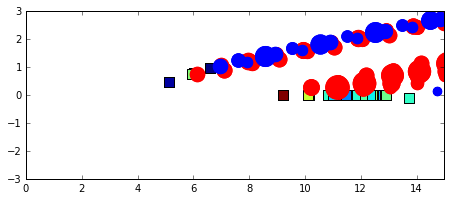

******************** New Time Step ********************
t =  2.0310267401510513 time step =  199
AOA =  9.79421671671 RA =  359.943037227
Pitching Rate =  -0.719899043102 Pitching Moment =  -56880.5286783
q_target =  0.411566566586 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -12658.389213 CFP Port Lift =  -12664.9118798
DW Starboard Lift =  6527.74362369 DW Port Lift =  6515.23514424
Total Lift =  -12280.3223249
CFP Starboard Control Input =  0.754310406458 CFP Port Control Input =  0.754310406458
Elevon Starboard Control Input =  -0.754310406458 Elevon Port Control Input =  -0.754310406458
CFP angle: -17.2284982004 -17.2284982004 Elevon angle: 7.2284982004 7.2284982004


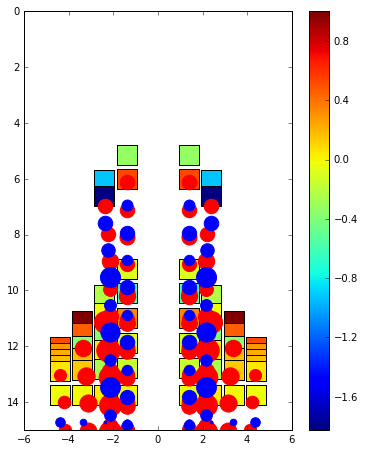

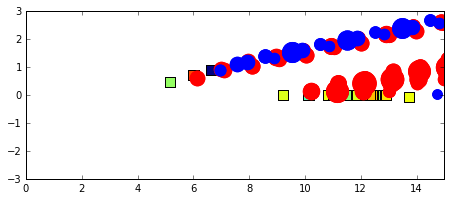

******************** New Time Step ********************
t =  2.0412329046744233 time step =  200
AOA =  9.76867833323 RA =  359.942499217
Pitching Rate =  -2.50225081345 Pitching Moment =  -197707.373719
q_target =  0.462643333547 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  3659.56183783 CFP Port Lift =  3661.88784137
DW Starboard Lift =  2312.70921231 DW Port Lift =  2323.10424057
Total Lift =  11957.2631321
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: -13.554278972 -13.554278972 Elevon angle: 3.55427897198 3.55427897198


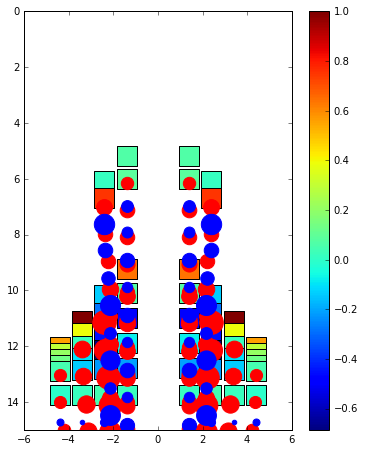

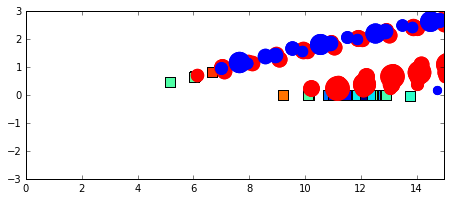

******************** New Time Step ********************
t =  2.0514390691977953 time step =  201
AOA =  9.74863611506 RA =  359.941947141
Pitching Rate =  -1.96373653642 Pitching Moment =  -155158.384285
q_target =  0.50272776989 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  8389.38882521 CFP Port Lift =  8387.20521213
DW Starboard Lift =  -9286.3411968 DW Port Lift =  -9302.76693601
Total Lift =  -1812.51409547
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: -9.88005974357 -9.88005974357 Elevon angle: -0.11994025643 -0.11994025643


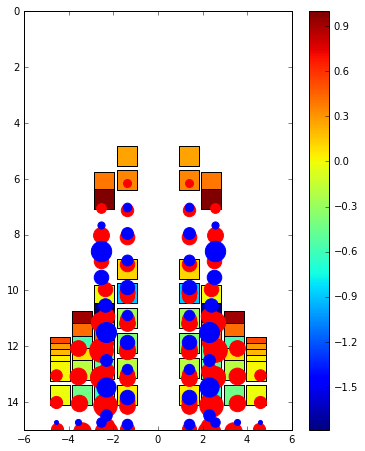

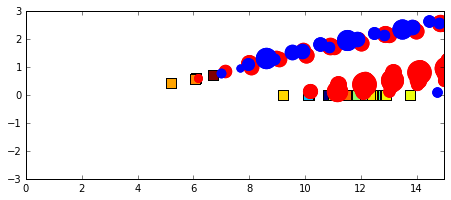

******************** New Time Step ********************
t =  2.0616452337211677 time step =  202
AOA =  9.74229181936 RA =  359.941417998
Pitching Rate =  -0.621614092006 Pitching Moment =  -49114.8564871
q_target =  0.515416361276 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1169.02959481 CFP Port Lift =  1167.22174277
DW Starboard Lift =  -912.416649343 DW Port Lift =  -925.886533774
Total Lift =  497.948154463
CFP Starboard Control Input =  0.758020302188 CFP Port Control Input =  0.758020302188
Elevon Starboard Control Input =  -0.758020302188 Elevon Port Control Input =  -0.758020302188
CFP angle: -7.09492697374 -7.09492697374 Elevon angle: -2.90507302626 -2.90507302626


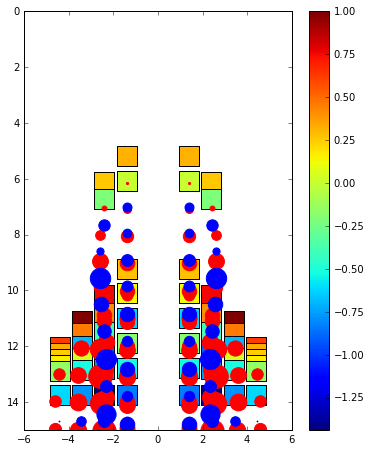

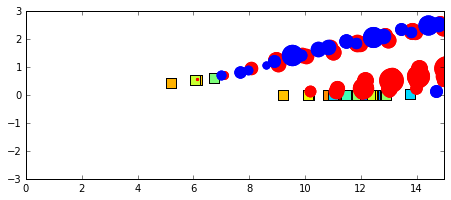

******************** New Time Step ********************
t =  2.0718513982445397 time step =  203
AOA =  9.75023665953 RA =  359.940912766
Pitching Rate =  0.778435439189 Pitching Moment =  61505.5954682
q_target =  0.499526680949 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  548.07445925 CFP Port Lift =  547.91714943
DW Starboard Lift =  11674.3789919 DW Port Lift =  11675.1765668
Total Lift =  24445.5471674
CFP Starboard Control Input =  -0.185939172159 CFP Port Control Input =  -0.185939172159
Elevon Starboard Control Input =  0.185939172159 Elevon Port Control Input =  0.185939172159
CFP angle: -7.77810825541 -7.77810825541 Elevon angle: -2.22189174459 -2.22189174459


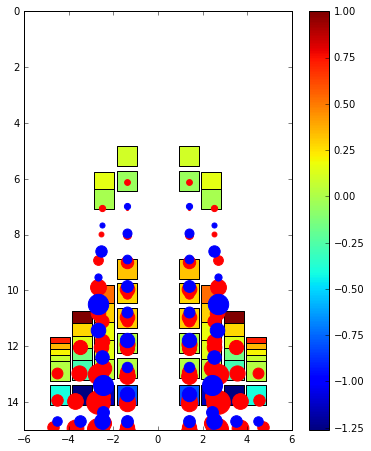

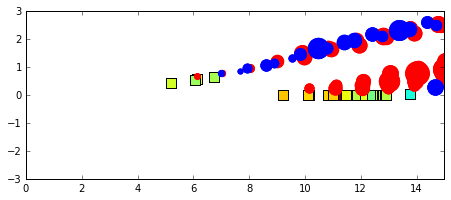

******************** New Time Step ********************
t =  2.0820575627679117 time step =  204
AOA =  9.76533367514 RA =  359.940410265
Pitching Rate =  1.47920559006 Pitching Moment =  116874.715688
q_target =  0.469332649717 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1999.63406784 CFP Port Lift =  -2000.90490007
DW Starboard Lift =  10271.5901886 DW Port Lift =  10255.7793361
Total Lift =  16526.8305568
CFP Starboard Control Input =  -0.673248626897 CFP Port Control Input =  -0.673248626897
Elevon Starboard Control Input =  0.673248626897 Elevon Port Control Input =  0.673248626897
CFP angle: -10.2517713059 -10.2517713059 Elevon angle: 0.251771305855 0.251771305855


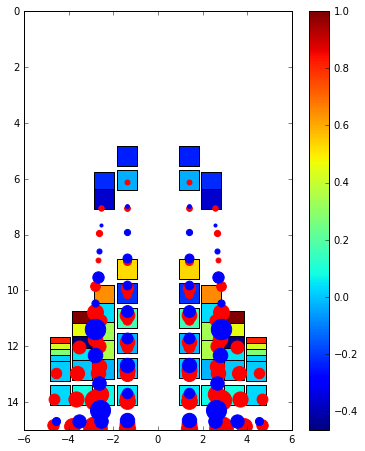

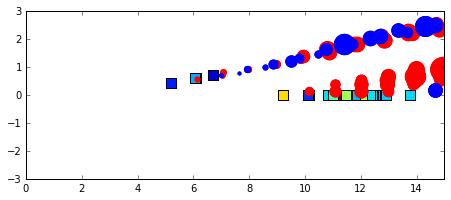

******************** New Time Step ********************
t =  2.092263727291284 time step =  205
AOA =  9.77681814245 RA =  359.939930321
Pitching Rate =  1.12524810655 Pitching Moment =  88907.8931391
q_target =  0.446363715107 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  704.082044123 CFP Port Lift =  704.443154524
DW Starboard Lift =  15659.9747036 DW Port Lift =  15673.9401273
Total Lift =  32742.4400295
CFP Starboard Control Input =  -0.452589594298 CFP Port Control Input =  -0.452589594298
Elevon Starboard Control Input =  0.452589594298 Elevon Port Control Input =  0.452589594298
CFP angle: -11.9146846958 -11.9146846958 Elevon angle: 1.91468469581 1.91468469581


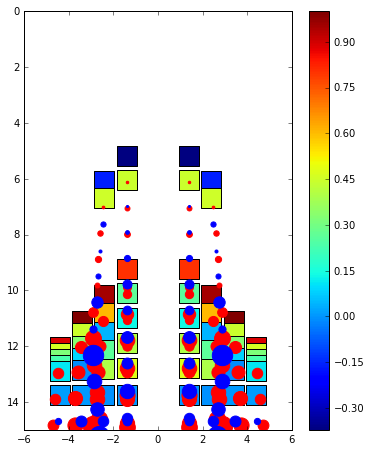

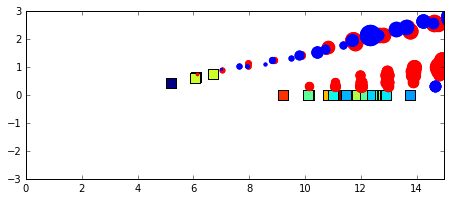

******************** New Time Step ********************
t =  2.102469891814656 time step =  206
AOA =  9.78737647954 RA =  359.939436304
Pitching Rate =  1.03450586863 Pitching Moment =  81738.184392
q_target =  0.425247040916 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -177.613407004 CFP Port Lift =  -184.078162093
DW Starboard Lift =  12413.3164203 DW Port Lift =  12387.3821474
Total Lift =  24439.0069987
CFP Starboard Control Input =  -0.406172551812 CFP Port Control Input =  -0.406172551812
Elevon Starboard Control Input =  0.406172551812 Elevon Port Control Input =  0.406172551812
CFP angle: -13.4070516957 -13.4070516957 Elevon angle: 3.40705169573 3.40705169573


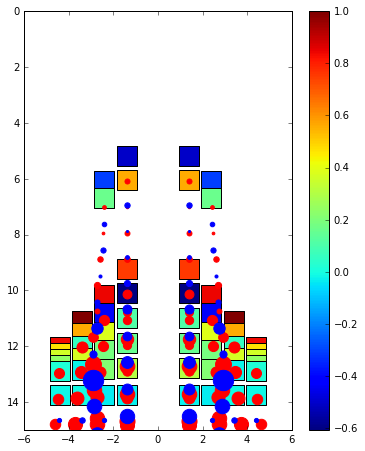

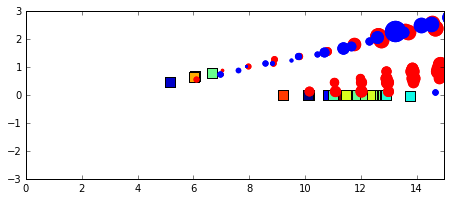

******************** New Time Step ********************
t =  2.112676056338028 time step =  207
AOA =  9.79561039127 RA =  359.938981869
Pitching Rate =  0.806758671384 Pitching Moment =  63743.4653981
q_target =  0.408779217454 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -2092.65365945 CFP Port Lift =  -2094.64180775
DW Starboard Lift =  16729.8335799 DW Port Lift =  16746.5730278
Total Lift =  29289.1111406
CFP Starboard Control Input =  -0.265319635953 CFP Port Control Input =  -0.265319635953
Elevon Starboard Control Input =  0.265319635953 Elevon Port Control Input =  0.265319635953
CFP angle: -14.3818942038 -14.3818942038 Elevon angle: 4.38189420382 4.38189420382


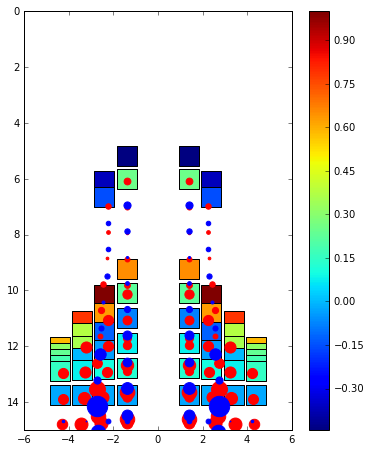

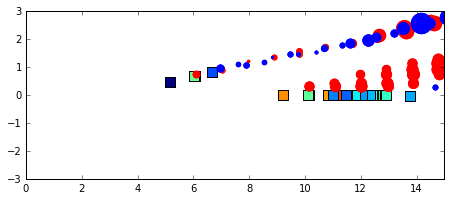

******************** New Time Step ********************
t =  2.1228822208614004 time step =  208
AOA =  9.80048656214 RA =  359.938513857
Pitching Rate =  0.477767221495 Pitching Moment =  37749.2544325
q_target =  0.399026875721 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1133.17849337 CFP Port Lift =  -1141.76842649
DW Starboard Lift =  15676.9687167 DW Port Lift =  15651.3542747
Total Lift =  29053.3760716
CFP Starboard Control Input =  -0.0524935638491 CFP Port Control Input =  -0.0524935638491
Elevon Starboard Control Input =  0.0524935638491 Elevon Port Control Input =  0.0524935638491
CFP angle: -14.5747670655 -14.5747670655 Elevon angle: 4.57476706548 4.57476706548


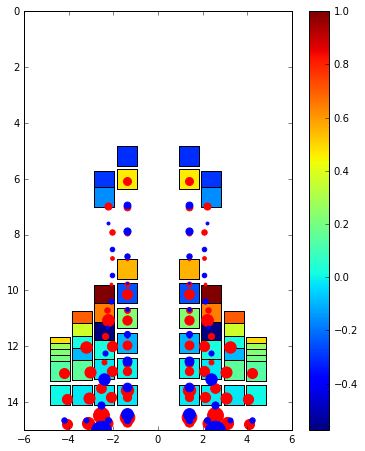

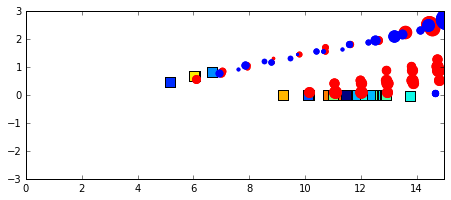

******************** New Time Step ********************
t =  2.1330883853847724 time step =  209
AOA =  9.80369520378 RA =  359.938090346
Pitching Rate =  0.314382708247 Pitching Moment =  24839.9478006
q_target =  0.392609592434 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -706.727425285 CFP Port Lift =  -704.83103449
DW Starboard Lift =  9697.4493746 DW Port Lift =  9713.6313842
Total Lift =  17999.522299
CFP Starboard Control Input =  0.0521512561249 CFP Port Control Input =  0.0521512561249
Elevon Starboard Control Input =  -0.0521512561249 Elevon Port Control Input =  -0.0521512561249
CFP angle: -14.3831519174 -14.3831519174 Elevon angle: 4.38315191745 4.38315191745


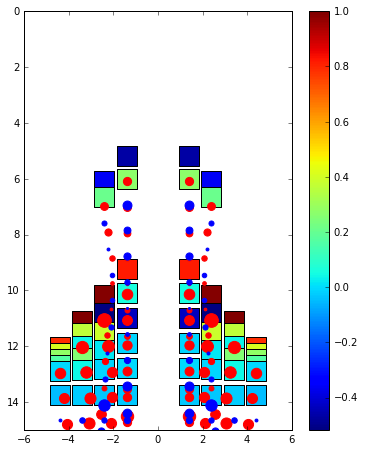

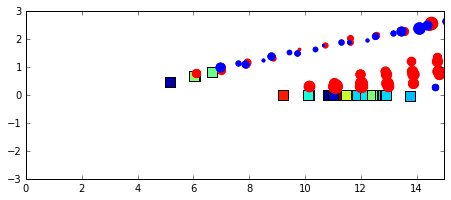

******************** New Time Step ********************
t =  2.1432945499081444 time step =  210
AOA =  9.80548550163 RA =  359.937647481
Pitching Rate =  0.175413383308 Pitching Moment =  13859.7294654
q_target =  0.389028996735 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  2021.03299644 CFP Port Lift =  2015.32940977
DW Starboard Lift =  11897.4364792 DW Port Lift =  11876.0068086
Total Lift =  27809.8056939
CFP Starboard Control Input =  0.142410408951 CFP Port Control Input =  0.142410408951
Elevon Starboard Control Input =  -0.142410408951 Elevon Port Control Input =  -0.142410408951
CFP angle: -13.8599048546 -13.8599048546 Elevon angle: 3.85990485455 3.85990485455


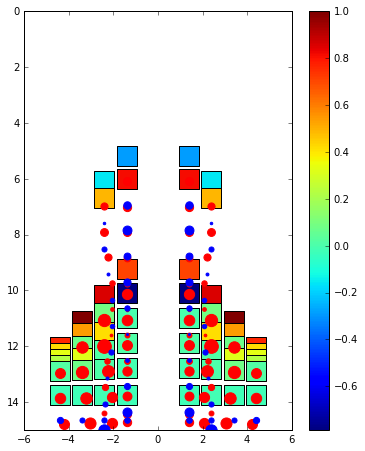

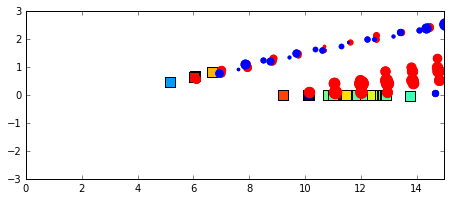

******************** New Time Step ********************
t =  2.153500714431517 time step =  211
AOA =  9.80831412877 RA =  359.937238953
Pitching Rate =  0.277148887052 Pitching Moment =  21898.0360777
q_target =  0.383371742457 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1106.00077444 CFP Port Lift =  -1105.05091343
DW Starboard Lift =  13071.78423 DW Port Lift =  13088.2331816
Total Lift =  23948.9657237
CFP Starboard Control Input =  0.0708152369364 CFP Port Control Input =  0.0708152369364
Elevon Starboard Control Input =  -0.0708152369364 Elevon Port Control Input =  -0.0708152369364
CFP angle: -13.5997141493 -13.5997141493 Elevon angle: 3.59971414933 3.59971414933


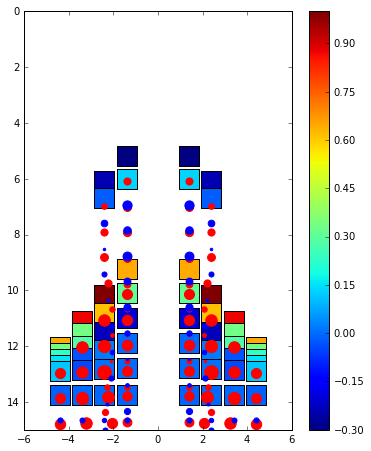

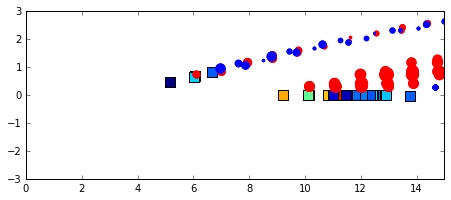

******************** New Time Step ********************
t =  2.163706878954889 time step =  212
AOA =  9.80965968148 RA =  359.936811833
Pitching Rate =  0.131837254373 Pitching Moment =  10416.7005083
q_target =  0.38068063704 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  2225.763134 CFP Port Lift =  2220.42337293
DW Starboard Lift =  9557.57725567 DW Port Lift =  9531.60427373
Total Lift =  23535.3680363
CFP Starboard Control Input =  0.165895588445 CFP Port Control Input =  0.165895588445
Elevon Starboard Control Input =  -0.165895588445 Elevon Port Control Input =  -0.165895588445
CFP angle: -12.9901773884 -12.9901773884 Elevon angle: 2.99017738836 2.99017738836


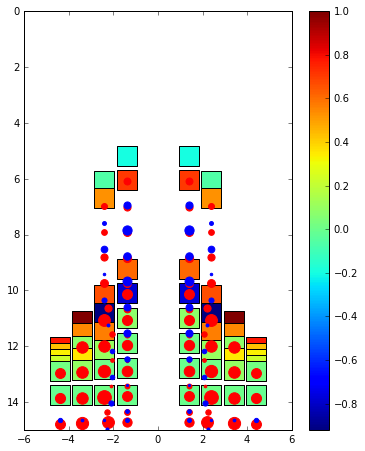

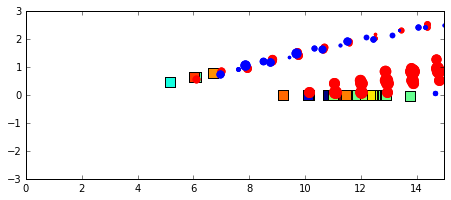

******************** New Time Step ********************
t =  2.1739130434782608 time step =  213
AOA =  9.81178464764 RA =  359.936423815
Pitching Rate =  0.208204184776 Pitching Moment =  16450.590144
q_target =  0.376430704712 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -430.659011594 CFP Port Lift =  -429.677835286
DW Starboard Lift =  11566.5452677 DW Port Lift =  11582.2312415
Total Lift =  22288.4396622
CFP Starboard Control Input =  0.11215101329 CFP Port Control Input =  0.11215101329
Elevon Starboard Control Input =  -0.11215101329 Elevon Port Control Input =  -0.11215101329
CFP angle: -12.5781099788 -12.5781099788 Elevon angle: 2.57810997884 2.57810997884


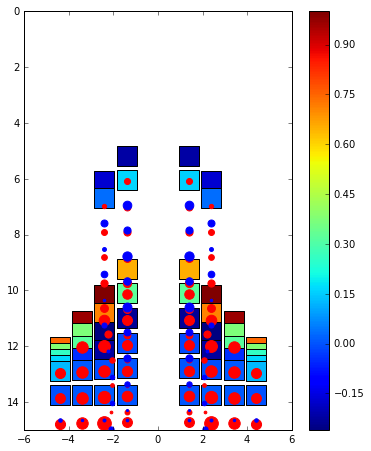

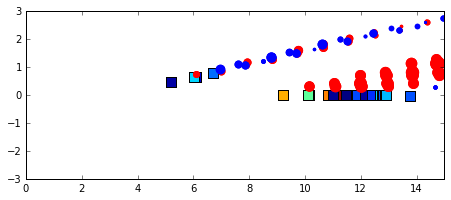

******************** New Time Step ********************
t =  2.184119208001633 time step =  214
AOA =  9.81323389554 RA =  359.936018195
Pitching Rate =  0.141997308949 Pitching Moment =  11219.4648421
q_target =  0.373532208918 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  14748.7391204 CFP Port Lift =  14780.2300543
DW Starboard Lift =  -1706.8049617 DW Port Lift =  -1753.5491741
Total Lift =  26068.6150389
CFP Starboard Control Input =  0.154356599979 CFP Port Control Input =  0.154356599979
Elevon Starboard Control Input =  -0.154356599979 Elevon Port Control Input =  -0.154356599979
CFP angle: -12.0109699912 -12.0109699912 Elevon angle: 2.01096999117 2.01096999117


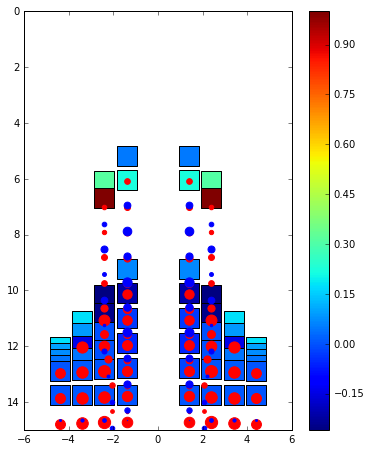

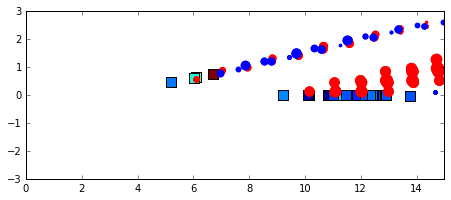

******************** New Time Step ********************
t =  2.194325372525005 time step =  215
AOA =  9.83037915727 RA =  359.935633867
Pitching Rate =  1.67989274439 Pitching Moment =  132731.371627
q_target =  0.339241685456 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1744.36217831 CFP Port Lift =  1753.37241489
DW Starboard Lift =  8581.03845057 DW Port Lift =  8582.11124401
Total Lift =  20660.8842878
CFP Starboard Control Input =  -0.893767372626 CFP Port Control Input =  -0.893767372626
Elevon Starboard Control Input =  0.893767372626 Elevon Port Control Input =  0.893767372626
CFP angle: -15.2948672574 -15.2948672574 Elevon angle: 5.2948672574 5.2948672574


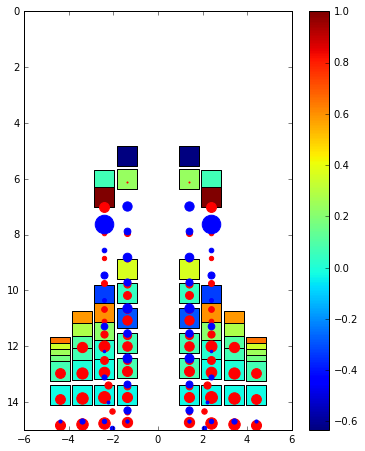

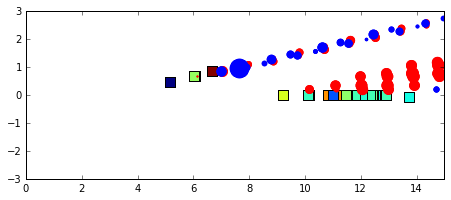

******************** New Time Step ********************
t =  2.204531537048377 time step =  216
AOA =  9.84776397586 RA =  359.935240275
Pitching Rate =  1.70336452557 Pitching Moment =  134585.919616
q_target =  0.304472048273 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -5352.20176633 CFP Port Lift =  -5353.99383176
DW Starboard Lift =  16200.1609209 DW Port Lift =  16202.7458342
Total Lift =  21696.711157
CFP Starboard Control Input =  -0.932594984864 CFP Port Control Input =  -0.932594984864
Elevon Starboard Control Input =  0.932594984864 Elevon Port Control Input =  0.932594984864
CFP angle: -18.7214256831 -18.7214256831 Elevon angle: 8.72142568311 8.72142568311


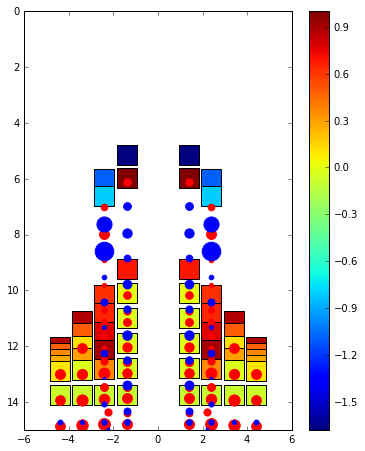

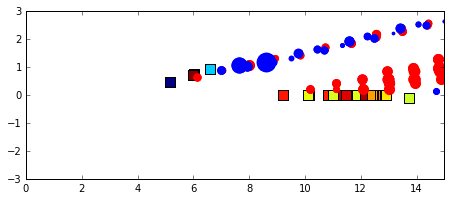

******************** New Time Step ********************
t =  2.2147377015717495 time step =  217
AOA =  9.85618787672 RA =  359.934846355
Pitching Rate =  0.825373806256 Pitching Moment =  65214.2809563
q_target =  0.287624246553 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -9073.13128571 CFP Port Lift =  -9066.32508041
DW Starboard Lift =  25145.8042303 DW Port Lift =  25161.6777686
Total Lift =  32168.0256328
CFP Starboard Control Input =  -0.358499706468 CFP Port Control Input =  -0.358499706468
Elevon Starboard Control Input =  0.358499706468 Elevon Port Control Input =  0.358499706468
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


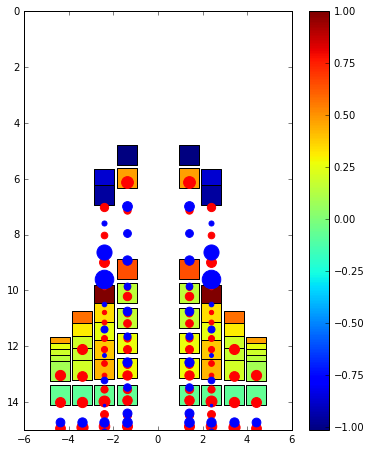

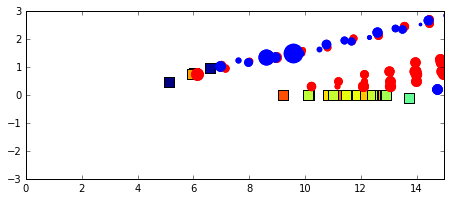

******************** New Time Step ********************
t =  2.2249438660951215 time step =  218
AOA =  9.8507260687 RA =  359.934428121
Pitching Rate =  -0.535147950592 Pitching Moment =  -42283.0098781
q_target =  0.29854786261 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -5011.99945819 CFP Port Lift =  -5009.60494333
DW Starboard Lift =  20928.6463567 DW Port Lift =  20926.4598074
Total Lift =  31833.5017626
CFP Starboard Control Input =  0.555797208801 CFP Port Control Input =  0.555797208801
Elevon Starboard Control Input =  -0.555797208801 Elevon Port Control Input =  -0.555797208801
CFP angle: -17.9578792083 -17.9578792083 Elevon angle: 7.95787920833 7.95787920833


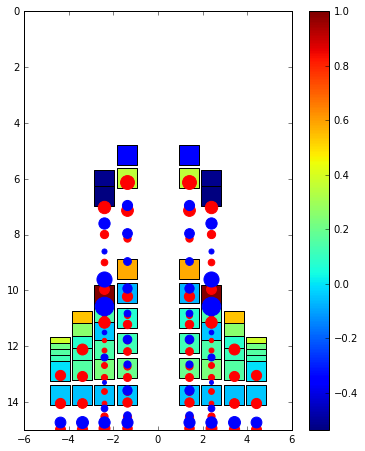

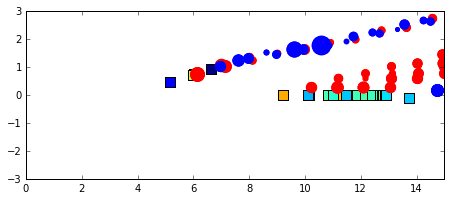

******************** New Time Step ********************
t =  2.2351500306184935 time step =  219
AOA =  9.83818505853 RA =  359.934010349
Pitching Rate =  -1.22876817595 Pitching Moment =  -97087.2015189
q_target =  0.323629882939 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  184.315454163 CFP Port Lift =  184.146544238
DW Starboard Lift =  12970.4683987 DW Port Lift =  12963.4406473
Total Lift =  26302.3710443
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: -14.2836599799 -14.2836599799 Elevon angle: 4.28365997991 4.28365997991


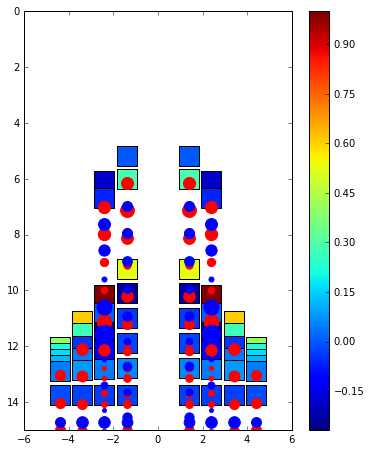

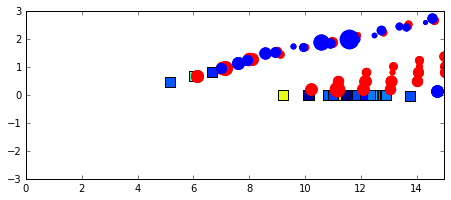

******************** New Time Step ********************
t =  2.2453561951418655 time step =  220
AOA =  9.82631231128 RA =  359.933601728
Pitching Rate =  -1.16329177529 Pitching Moment =  -91913.7923843
q_target =  0.347375377434 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1756.35270725 CFP Port Lift =  1755.07182271
DW Starboard Lift =  9768.93613917 DW Port Lift =  9759.34009975
Total Lift =  23039.7007689
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: -10.6094407515 -10.6094407515 Elevon angle: 0.609440751497 0.609440751497


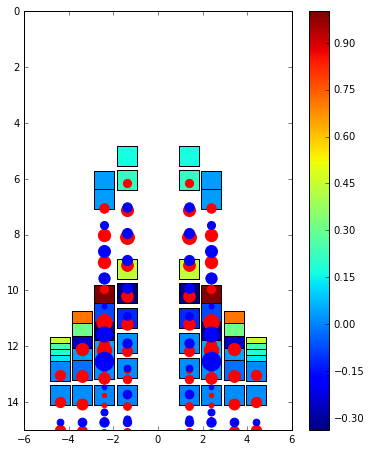

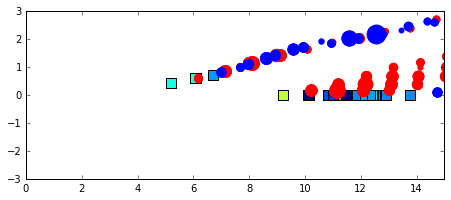

******************** New Time Step ********************
t =  2.255562359665238 time step =  221
AOA =  9.81672043171 RA =  359.933207858
Pitching Rate =  -0.939812361004 Pitching Moment =  -74256.2786609
q_target =  0.366559136589 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  3741.91002805 CFP Port Lift =  3741.40057958
DW Starboard Lift =  7294.72718388 DW Port Lift =  7292.8510378
Total Lift =  22070.8888293
CFP Starboard Control Input =  0.870914331729 CFP Port Control Input =  0.870914331729
Elevon Starboard Control Input =  -0.870914331729 Elevon Port Control Input =  -0.870914331729
CFP angle: -7.40951056756 -7.40951056756 Elevon angle: -2.59048943244 -2.59048943244


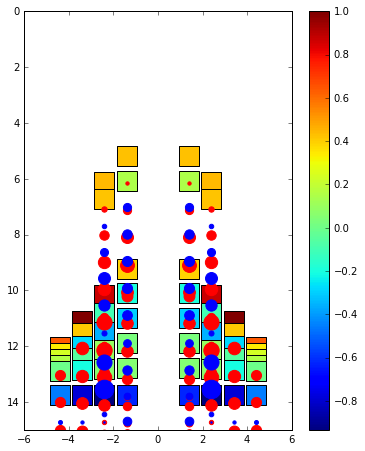

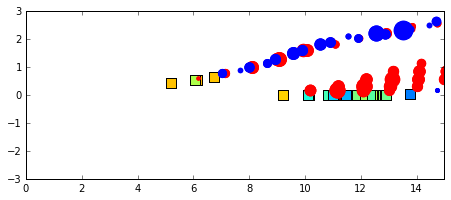

******************** New Time Step ********************
t =  2.26576852418861 time step =  222
AOA =  9.8170145719 RA =  359.932817282
Pitching Rate =  0.0288198559438 Pitching Moment =  2277.10907276
q_target =  0.365970856206 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  2660.6611635 CFP Port Lift =  2659.88273121
DW Starboard Lift =  7433.91826093 DW Port Lift =  7431.35289735
Total Lift =  20185.815053
CFP Starboard Control Input =  0.224767333508 CFP Port Control Input =  0.224767333508
Elevon Starboard Control Input =  -0.224767333508 Elevon Port Control Input =  -0.224767333508
CFP angle: -6.58366610886 -6.58366610886 Elevon angle: -3.41633389114 -3.41633389114


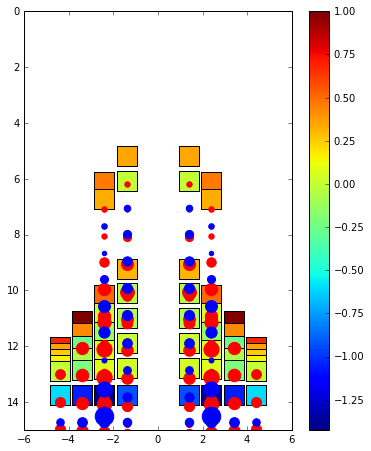

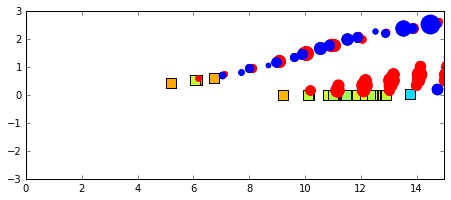

******************** New Time Step ********************
t =  2.275974688711982 time step =  223
AOA =  9.82700706296 RA =  359.93243058
Pitching Rate =  0.97906427434 Pitching Moment =  77357.6435031
q_target =  0.34598587408 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  6353.95975229 CFP Port Lift =  6350.08789603
DW Starboard Lift =  3846.96244645 DW Port Lift =  3841.47720372
Total Lift =  20392.4872985
CFP Starboard Control Input =  -0.42205226684 CFP Port Control Input =  -0.42205226684
Elevon Starboard Control Input =  0.42205226684 Elevon Port Control Input =  0.42205226684
CFP angle: -8.13437866308 -8.13437866308 Elevon angle: -1.86562133692 -1.86562133692


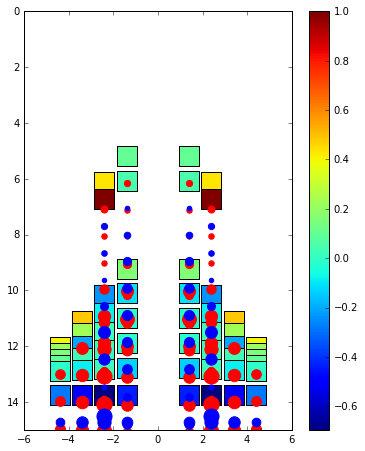

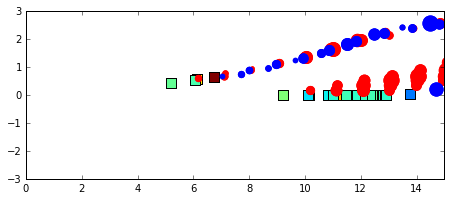

******************** New Time Step ********************
t =  2.2861808532353542 time step =  224
AOA =  9.84926507236 RA =  359.932055811
Pitching Rate =  2.18083976119 Pitching Moment =  172312.103715
q_target =  0.301469855277 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  7630.33983957 CFP Port Lift =  7624.12342166
DW Starboard Lift =  5559.8210116 DW Port Lift =  5567.51949929
Total Lift =  26381.8037721
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -11.8085978915 -11.8085978915 Elevon angle: 1.8085978915 1.8085978915


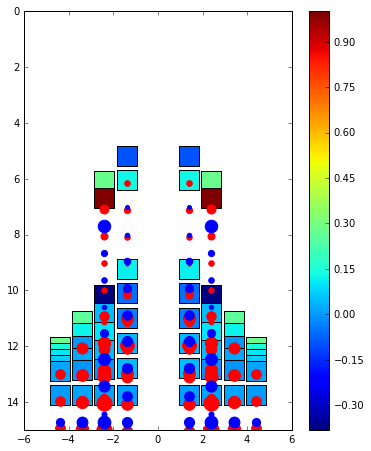

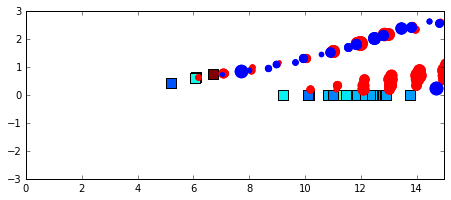

******************** New Time Step ********************
t =  2.2963870177587262 time step =  225
AOA =  9.87819331591 RA =  359.931680701
Pitching Rate =  2.83438930299 Pitching Moment =  223950.237994
q_target =  0.243613368178 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -3482.3471213 CFP Port Lift =  -3483.75839526
DW Starboard Lift =  11827.0542896 DW Port Lift =  11823.6086522
Total Lift =  16684.5574252
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -15.4828171199 -15.4828171199 Elevon angle: 5.48281711991 5.48281711991


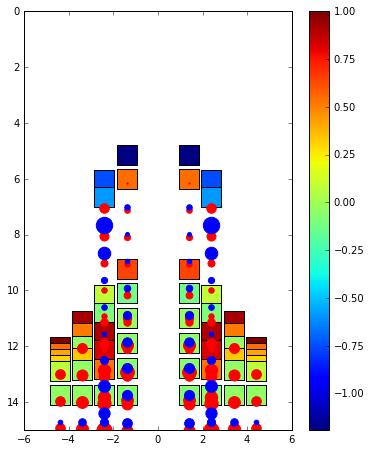

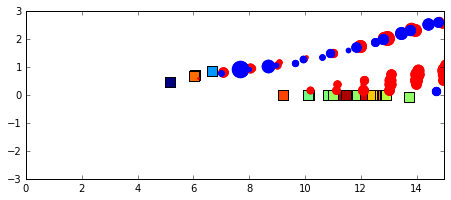

******************** New Time Step ********************
t =  2.306593182282098 time step =  226
AOA =  9.90026913745 RA =  359.931312654
Pitching Rate =  2.16298899392 Pitching Moment =  170901.682226
q_target =  0.199461725109 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -5538.59027836 CFP Port Lift =  -5540.32359925
DW Starboard Lift =  19061.5233943 DW Port Lift =  19068.8420098
Total Lift =  27051.4515265
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -19.1570363483 -19.1570363483 Elevon angle: 9.15703634832 9.15703634832


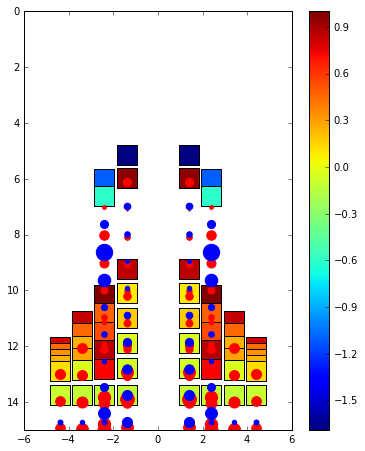

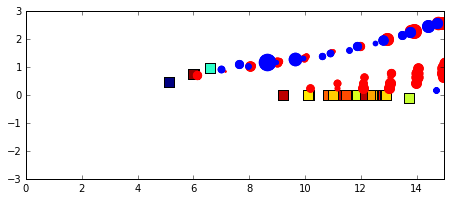

******************** New Time Step ********************
t =  2.3167993468054706 time step =  227
AOA =  9.91316884586 RA =  359.930938519
Pitching Rate =  1.26391343005 Pitching Moment =  99864.0917693
q_target =  0.173662308288 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -5344.52366624 CFP Port Lift =  -5347.18926878
DW Starboard Lift =  20864.9769167 DW Port Lift =  20858.7697679
Total Lift =  31032.0337496
CFP Starboard Control Input =  -0.726834081176 CFP Port Control Input =  -0.726834081176
Elevon Starboard Control Input =  0.726834081176 Elevon Port Control Input =  0.726834081176
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


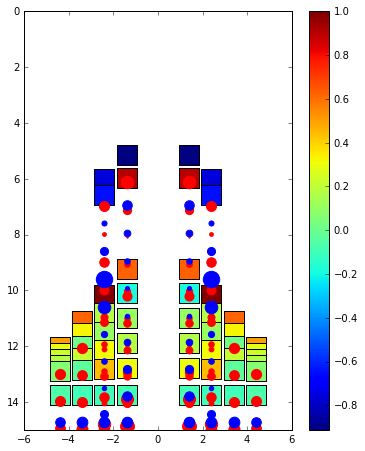

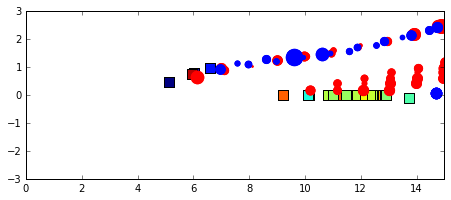

******************** New Time Step ********************
t =  2.3270055113288426 time step =  228
AOA =  9.91739064344 RA =  359.930574814
Pitching Rate =  0.413651727565 Pitching Moment =  32683.3730063
q_target =  0.165218713115 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -17022.9135713 CFP Port Lift =  -17026.93554
DW Starboard Lift =  28848.6224584 DW Port Lift =  28857.6091042
Total Lift =  23656.3824513
CFP Starboard Control Input =  -0.165622009633 CFP Port Control Input =  -0.165622009633
Elevon Starboard Control Input =  0.165622009633 Elevon Port Control Input =  0.165622009633
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


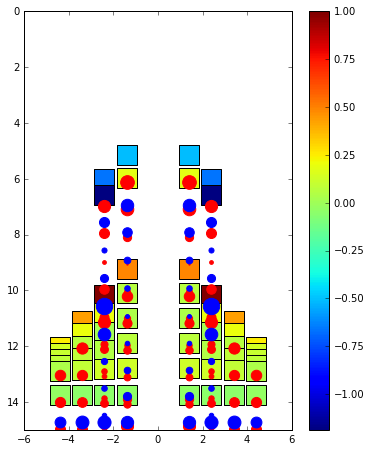

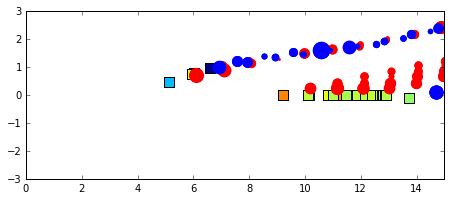

******************** New Time Step ********************
t =  2.3372116758522146 time step =  229
AOA =  9.90056568019 RA =  359.930205419
Pitching Rate =  -1.64850989903 Pitching Moment =  -130251.756113
q_target =  0.19886863961 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -9190.33896847 CFP Port Lift =  -9193.91675886
DW Starboard Lift =  22735.0949343 DW Port Lift =  22733.5349863
Total Lift =  27084.3741934
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: -16.32578077158604 -16.32578077158604 Elevon angle: 6.325780771586038 6.325780771586038


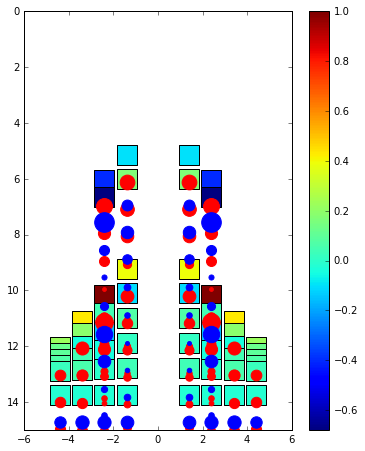

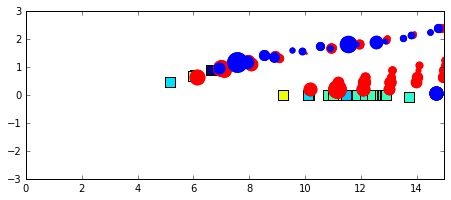

******************** New Time Step ********************
t =  2.347417840375587 time step =  230
AOA =  9.87429391054 RA =  359.929841872
Pitching Rate =  -2.57410799081 Pitching Moment =  -203384.93959
q_target =  0.251412178921 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  5693.16902418 CFP Port Lift =  5696.89119968
DW Starboard Lift =  6537.48037894 DW Port Lift =  6549.56045946
Total Lift =  24477.1010623
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: -12.651561543172075 -12.651561543172075 Elevon angle: 2.6515615431720763 2.6515615431720763


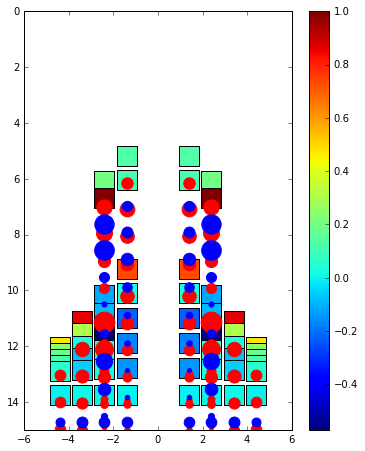

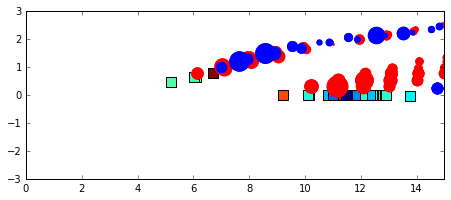

******************** New Time Step ********************
t =  2.357624004898959 time step =  231
AOA =  9.85522810461 RA =  359.929459743
Pitching Rate =  -1.86806766502 Pitching Moment =  -147599.413295
q_target =  0.289543790781 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  3438.92714903 CFP Port Lift =  3436.01948292
DW Starboard Lift =  5780.54892121 DW Port Lift =  5767.02260703
Total Lift =  18422.5181602
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: -8.977342314758115 -8.977342314758115 Elevon angle: -1.0226576852418858 -1.0226576852418858


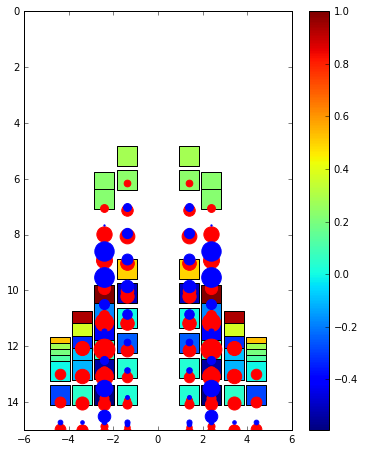

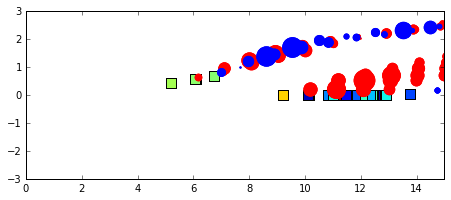

******************** New Time Step ********************
t =  2.367830169422331 time step =  232
AOA =  9.84402193524 RA =  359.929098151
Pitching Rate =  -1.09798047521 Pitching Moment =  -86753.4281461
q_target =  0.311956129528 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  4121.92498828 CFP Port Lift =  4119.64137037
DW Starboard Lift =  3093.58209323 DW Port Lift =  3081.92192619
Total Lift =  14417.0703781
CFP Starboard Control Input =  0.939957736489 CFP Port Control Input =  0.939957736489
Elevon Starboard Control Input =  -0.939957736489 Elevon Port Control Input =  -0.939957736489
CFP angle: -5.52373152545 -5.52373152545 Elevon angle: -4.47626847455 -4.47626847455


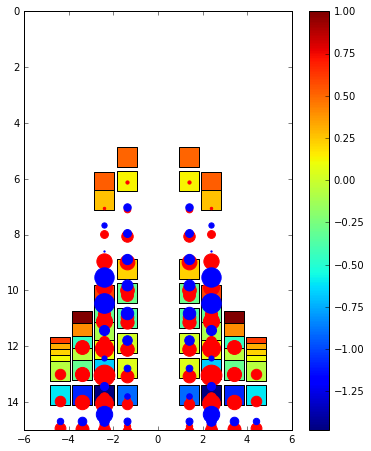

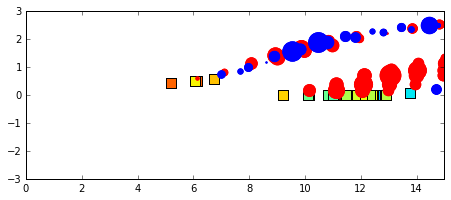

******************** New Time Step ********************
t =  2.3780363339457034 time step =  233
AOA =  9.84738767182 RA =  359.928760142
Pitching Rate =  0.329774870406 Pitching Moment =  26056.1104411
q_target =  0.305224656361 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1514.88432991 CFP Port Lift =  1512.26230014
DW Starboard Lift =  4327.2868045 DW Port Lift =  4313.06922756
Total Lift =  11667.5026621
CFP Starboard Control Input =  -0.0163668093631 CFP Port Control Input =  -0.0163668093631
Elevon Starboard Control Input =  0.0163668093631 Elevon Port Control Input =  0.0163668093631
CFP angle: -5.58386677112 -5.58386677112 Elevon angle: -4.41613322888 -4.41613322888


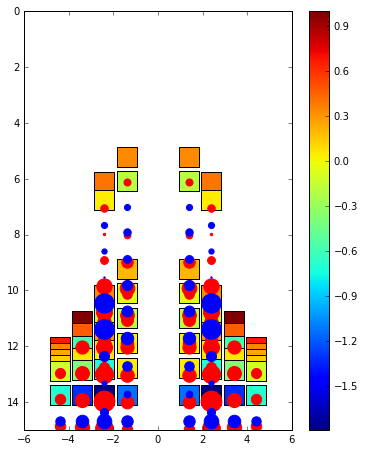

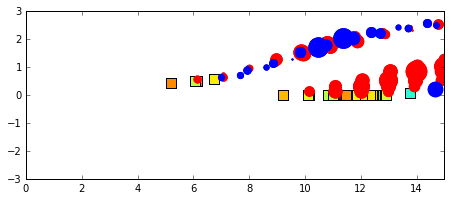

******************** New Time Step ********************
t =  2.3882424984690753 time step =  234
AOA =  9.86228187373 RA =  359.928452777
Pitching Rate =  1.45933390321 Pitching Moment =  115304.61768
q_target =  0.27543625254 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  15549.7366245 CFP Port Lift =  15529.1029073
DW Starboard Lift =  -2502.1732383 DW Port Lift =  -2483.5326175
Total Lift =  26093.1336759
CFP Starboard Control Input =  -0.789265100449 CFP Port Control Input =  -0.789265100449
Elevon Starboard Control Input =  0.789265100449 Elevon Port Control Input =  0.789265100449
CFP angle: -8.48379977951 -8.48379977951 Elevon angle: -1.51620022049 -1.51620022049


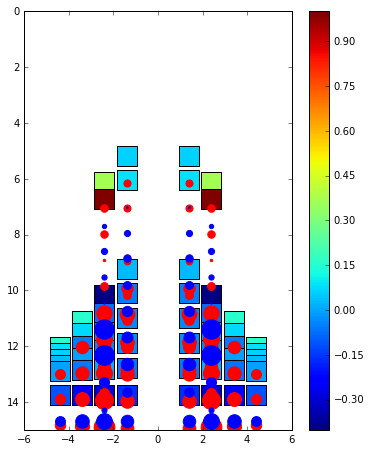

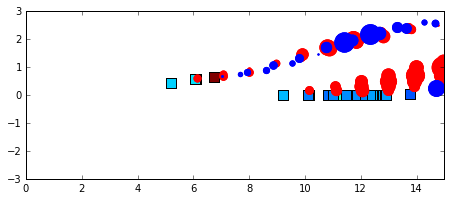

******************** New Time Step ********************
t =  2.3984486629924473 time step =  235
AOA =  9.90017679859 RA =  359.928149589
Pitching Rate =  3.71294473742 Pitching Moment =  293366.495818
q_target =  0.199646402828 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  13919.2439362 CFP Port Lift =  13897.0060843
DW Starboard Lift =  589.46443388 DW Port Lift =  621.23789223
Total Lift =  29026.9523466
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -12.1580190079 -12.1580190079 Elevon angle: 2.15801900792 2.15801900792


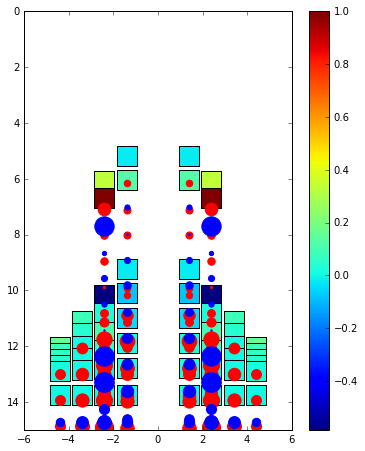

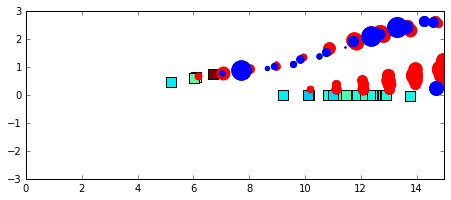

******************** New Time Step ********************
t =  2.4086548275158197 time step =  236
AOA =  9.95093154115 RA =  359.927836932
Pitching Rate =  4.97294967651 Pitching Moment =  392921.77063
q_target =  0.0981369176977 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  5597.52933003 CFP Port Lift =  5581.75039714
DW Starboard Lift =  10571.8420164 DW Port Lift =  10595.0305159
Total Lift =  32346.1522594
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -15.8322382363 -15.8322382363 Elevon angle: 5.83223823634 5.83223823634


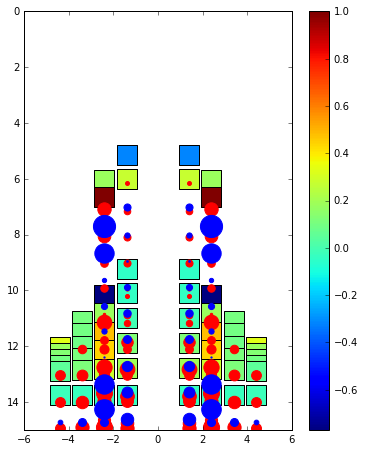

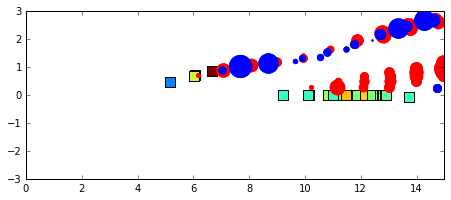

******************** New Time Step ********************
t =  2.4188609920391917 time step =  237
AOA =  10.0030227926 RA =  359.927515668
Pitching Rate =  5.10390081744 Pitching Moment =  403268.457708
q_target =  -0.00604558520976 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -3027.25319512 CFP Port Lift =  -3036.42621629
DW Starboard Lift =  14044.5520491 DW Port Lift =  14058.5778784
Total Lift =  22039.4505161
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -19.5064574648 -19.5064574648 Elevon angle: 9.50645746475 9.50645746475


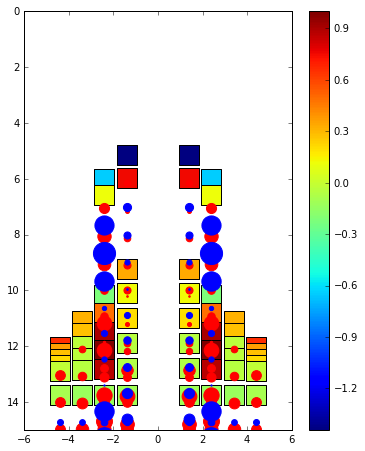

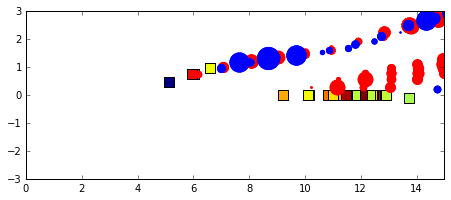

******************** New Time Step ********************
t =  2.4290671565625637 time step =  238
AOA =  10.0482801317 RA =  359.927186506
Pitching Rate =  4.43431408636 Pitching Moment =  350363.196026
q_target =  -0.0965602634371 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -6584.98791312 CFP Port Lift =  -6595.93423146
DW Starboard Lift =  18906.9813648 DW Port Lift =  18916.7800751
Total Lift =  24642.8392953
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


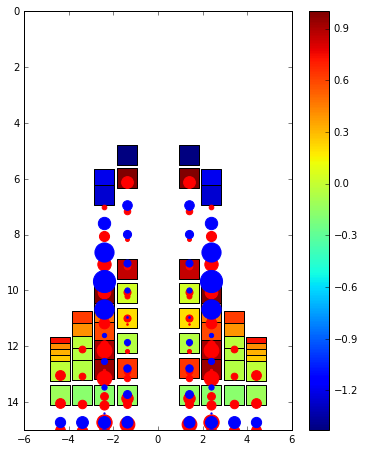

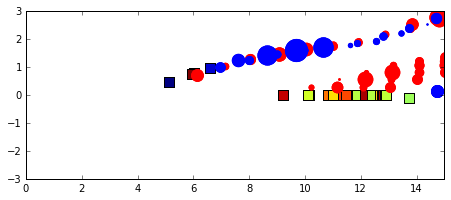

******************** New Time Step ********************
t =  2.439273321085936 time step =  239
AOA =  10.0832639084 RA =  359.926854794
Pitching Rate =  3.42771043489 Pitching Moment =  270829.616403
q_target =  -0.166527816711 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -11540.4673587 CFP Port Lift =  -11551.9657151
DW Starboard Lift =  25955.0396787 DW Port Lift =  25962.519934
Total Lift =  28825.1265389
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


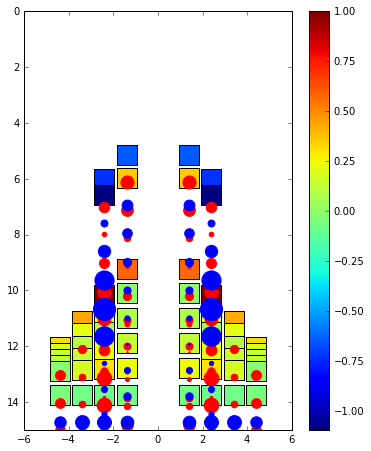

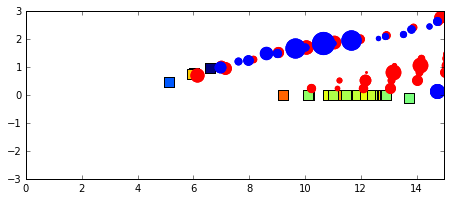

******************** New Time Step ********************
t =  2.449479485609308 time step =  240
AOA =  10.1025086687 RA =  359.926524438
Pitching Rate =  1.88560162334 Pitching Moment =  148984.803133
q_target =  -0.205017337498 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -14648.7882982 CFP Port Lift =  -14660.163245
DW Starboard Lift =  27602.4032311 DW Port Lift =  27608.5055037
Total Lift =  25901.9571917
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


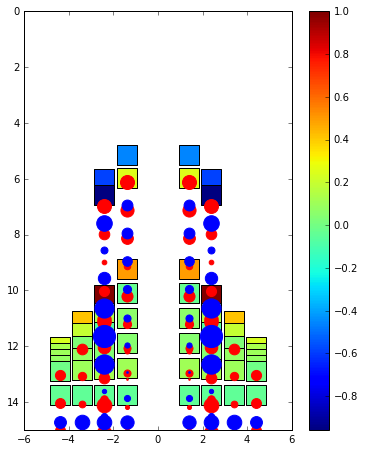

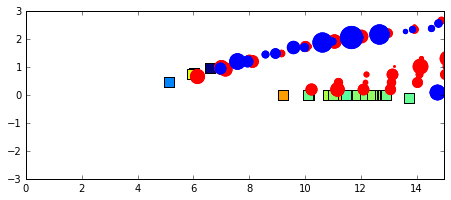

******************** New Time Step ********************
t =  2.45968565013268 time step =  241
AOA =  10.1041594275 RA =  359.926197295
Pitching Rate =  0.161741338996 Pitching Moment =  12779.4764549
q_target =  -0.20831885493 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -2808.16445614 CFP Port Lift =  -2810.82110021
DW Starboard Lift =  10898.3831414 DW Port Lift =  10891.0180953
Total Lift =  16170.4156804
CFP Starboard Control Input =  -0.24670679595 CFP Port Control Input =  -0.24670679595
Elevon Starboard Control Input =  0.24670679595 Elevon Port Control Input =  0.24670679595
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


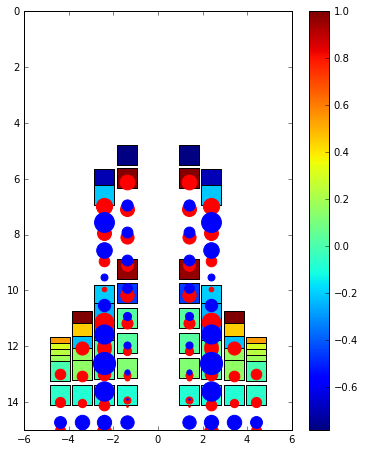

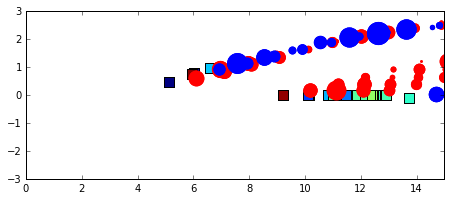

******************** New Time Step ********************
t =  2.4698918146560525 time step =  242
AOA =  10.1011979917 RA =  359.925880169
Pitching Rate =  -0.290161474044 Pitching Moment =  -22926.1841697
q_target =  -0.202395983445 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -2373.6986883 CFP Port Lift =  -2377.40936867
DW Starboard Lift =  6111.51532252 DW Port Lift =  6097.08225154
Total Lift =  7457.48951709
CFP Starboard Control Input =  0.0585103270664 CFP Port Control Input =  0.0585103270664
Elevon Starboard Control Input =  -0.0585103270664 Elevon Port Control Input =  -0.0585103270664
CFP angle: -19.7850202312 -19.7850202312 Elevon angle: 9.78502023123 9.78502023123


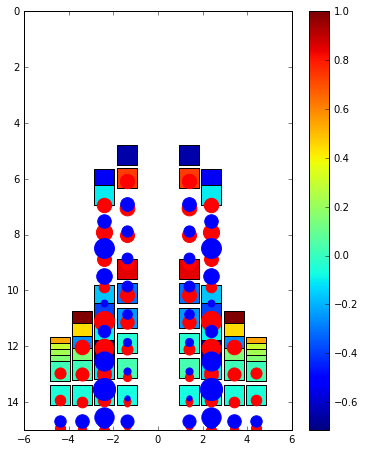

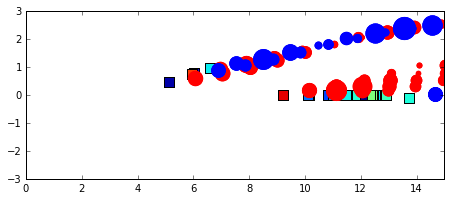

******************** New Time Step ********************
t =  2.4800979791794244 time step =  243
AOA =  10.0955033147 RA =  359.925583561
Pitching Rate =  -0.557964450773 Pitching Moment =  -44085.7829272
q_target =  -0.191006629479 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -24537.3865907 CFP Port Lift =  -24557.0777783
DW Starboard Lift =  18395.1373105 DW Port Lift =  18403.2132569
Total Lift =  -12296.1138015
CFP Starboard Control Input =  0.244638547529 CFP Port Control Input =  0.244638547529
Elevon Starboard Control Input =  -0.244638547529 Elevon Port Control Input =  -0.244638547529
CFP angle: -18.8861645759 -18.8861645759 Elevon angle: 8.88616457589 8.88616457589


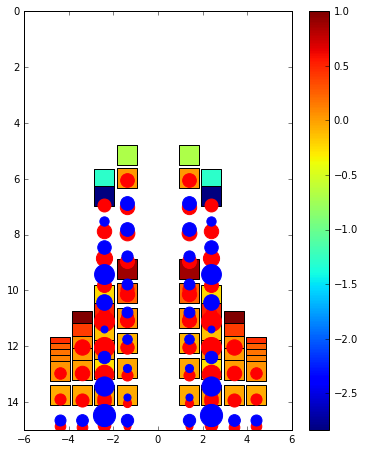

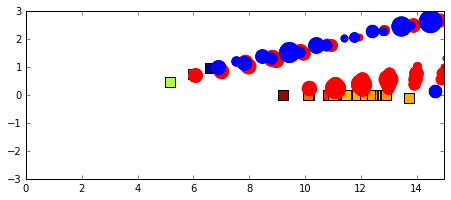

******************** New Time Step ********************
t =  2.4903041437027964 time step =  244
AOA =  10.060277139 RA =  359.925299569
Pitching Rate =  -3.45146069668 Pitching Moment =  -272706.16765
q_target =  -0.120554278047 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  20613.6715937 CFP Port Lift =  20626.3410868
DW Starboard Lift =  -13502.9267157 DW Port Lift =  -13523.9517086
Total Lift =  14213.1342562
CFP Starboard Control Input =  1 CFP Port Control Input =  1
Elevon Starboard Control Input =  -1 Elevon Port Control Input =  -1
CFP angle: -15.2119453475 -15.2119453475 Elevon angle: 5.21194534747 5.21194534747


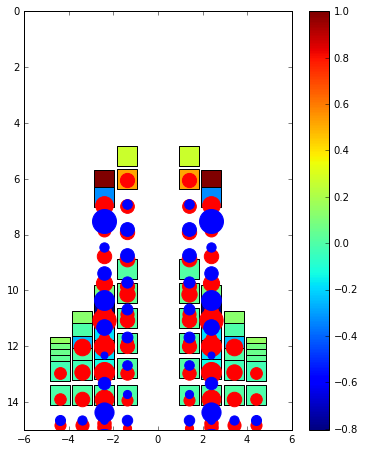

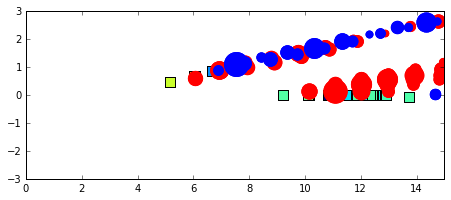

******************** New Time Step ********************
t =  2.5005103082261684 time step =  245
AOA =  10.0549237545 RA =  359.92503365
Pitching Rate =  -0.524524615625 Pitching Moment =  -41443.6409208
q_target =  -0.109847509 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  9529.85874023 CFP Port Lift =  9538.07405031
DW Starboard Lift =  -17338.9754843 DW Port Lift =  -17348.6887623
Total Lift =  -15619.7314561
CFP Starboard Control Input =  0.276451404417 CFP Port Control Input =  0.276451404417
Elevon Starboard Control Input =  -0.276451404417 Elevon Port Control Input =  -0.276451404417
CFP angle: -14.1962022816 -14.1962022816 Elevon angle: 4.19620228164 4.19620228164


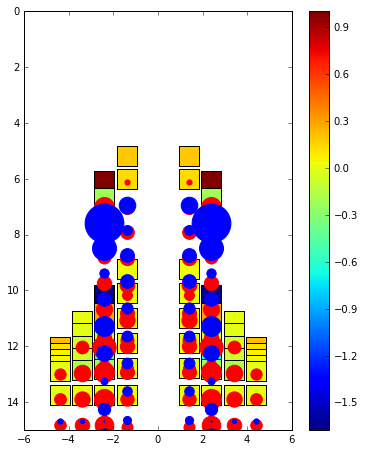

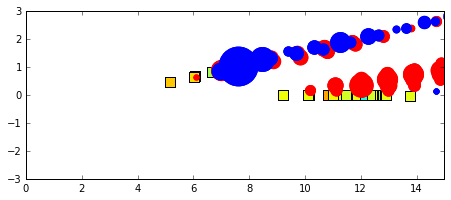

******************** New Time Step ********************
t =  2.510716472749541 time step =  246
AOA =  10.0616989354 RA =  359.92477141
Pitching Rate =  0.663832221517 Pitching Moment =  52450.5874474
q_target =  -0.123397870737 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  24142.9001719 CFP Port Lift =  24162.467797
DW Starboard Lift =  9625.40376947 DW Port Lift =  9630.87795619
Total Lift =  67561.6496946
CFP Starboard Control Input =  -0.524820061502 CFP Port Control Input =  -0.524820061502
Elevon Starboard Control Input =  0.524820061502 Elevon Port Control Input =  0.524820061502
CFP angle: -16.1245062431 -16.1245062431 Elevon angle: 6.12450624307 6.12450624307


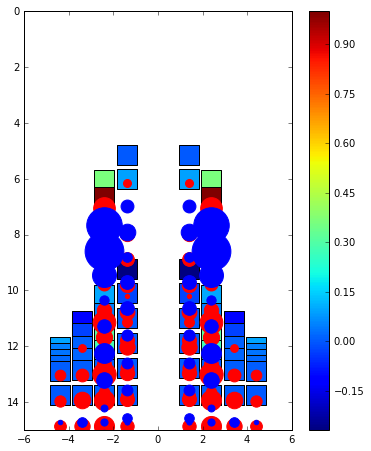

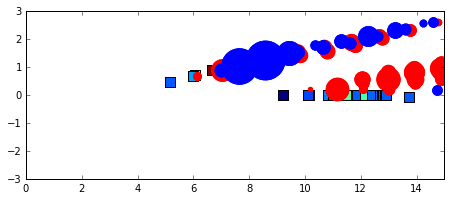

******************** New Time Step ********************
t =  2.5209226372729128 time step =  247
AOA =  10.0919314987 RA =  359.924480848
Pitching Rate =  2.96218655323 Pitching Moment =  234047.730451
q_target =  -0.183862997359 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  5533.81536985 CFP Port Lift =  5547.23322581
DW Starboard Lift =  16562.2078442 DW Port Lift =  16570.1166377
Total Lift =  44213.3730775
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -19.7987254715 -19.7987254715 Elevon angle: 9.79872547149 9.79872547149


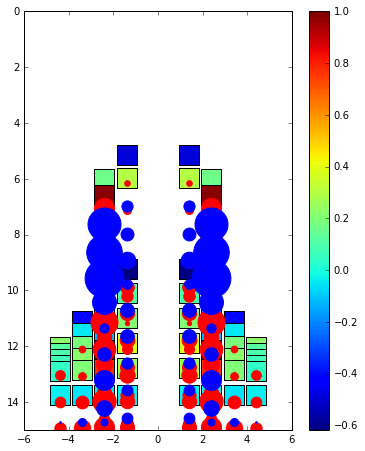

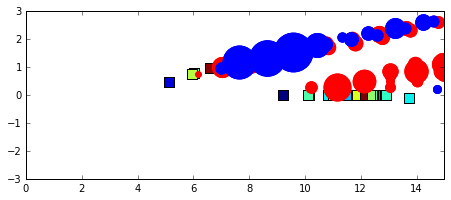

******************** New Time Step ********************
t =  2.5311288017962847 time step =  248
AOA =  10.1199378225 RA =  359.924167454
Pitching Rate =  2.7440596067 Pitching Moment =  216813.124909
q_target =  -0.239875644975 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -2186.00511874 CFP Port Lift =  -2176.30661508
DW Starboard Lift =  18960.5958586 DW Port Lift =  18965.0598484
Total Lift =  33563.3439732
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


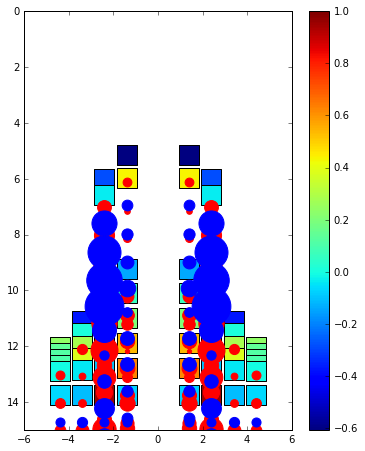

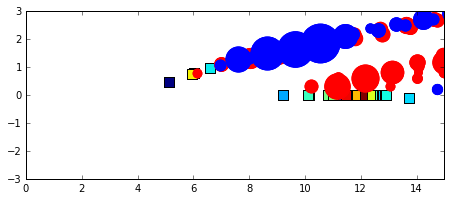

******************** New Time Step ********************
t =  2.541334966319657 time step =  249
AOA =  10.1367710719 RA =  359.923837574
Pitching Rate =  1.64932177739 Pitching Moment =  130315.904095
q_target =  -0.273542143799 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -3905.95133039 CFP Port Lift =  -3891.43238462
DW Starboard Lift =  12485.9166926 DW Port Lift =  12469.9008073
Total Lift =  17158.4337849
CFP Starboard Control Input =  -1 CFP Port Control Input =  -1
Elevon Starboard Control Input =  1 Elevon Port Control Input =  1
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


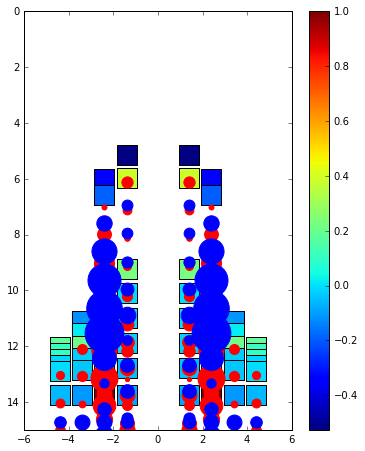

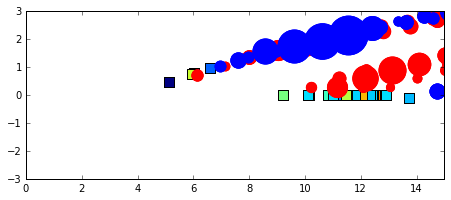

******************** New Time Step ********************
t =  2.551541130843029 time step =  250
AOA =  10.1419280103 RA =  359.923509069
Pitching Rate =  0.505276826125 Pitching Moment =  39922.8381733
q_target =  -0.283856020634 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -8334.67779824 CFP Port Lift =  -8322.42648248
DW Starboard Lift =  17787.4666122 DW Port Lift =  17776.92713
Total Lift =  18907.2894615
CFP Starboard Control Input =  -0.526088564506 CFP Port Control Input =  -0.526088564506
Elevon Starboard Control Input =  0.526088564506 Elevon Port Control Input =  0.526088564506
CFP angle: -20.0 -20.0 Elevon angle: 10.0 10.0


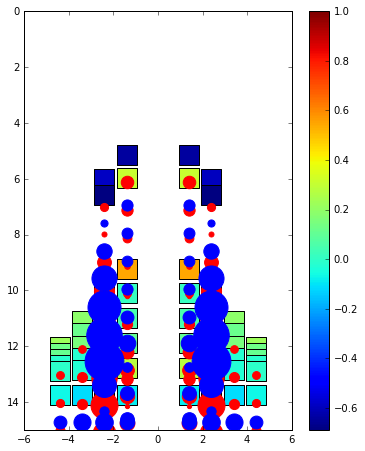

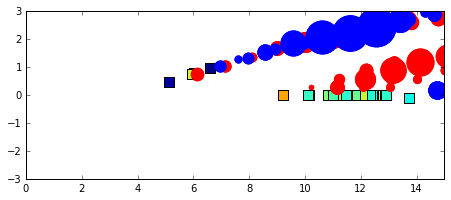

******************** New Time Step ********************
t =  2.561747295366401 time step =  251
AOA =  10.1322238175 RA =  359.923178845
Pitching Rate =  -0.950816816714 Pitching Moment =  -75125.7606592
q_target =  -0.264447634908 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -5547.61640822 CFP Port Lift =  -5542.36168261
DW Starboard Lift =  16915.2242287 DW Port Lift =  16905.9979828
Total Lift =  22731.2441207
CFP Starboard Control Input =  0.457579454537 CFP Port Control Input =  0.457579454537
Elevon Starboard Control Input =  -0.457579454537 Elevon Port Control Input =  -0.457579454537
CFP angle: -18.3187527696 -18.3187527696 Elevon angle: 8.31875276961 8.31875276961


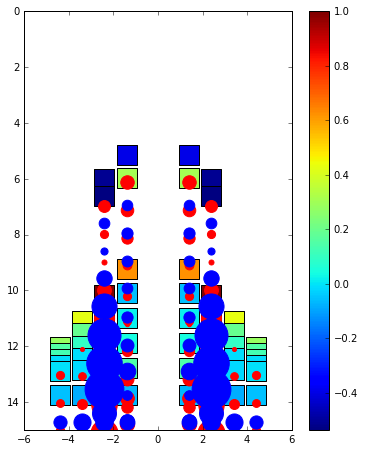

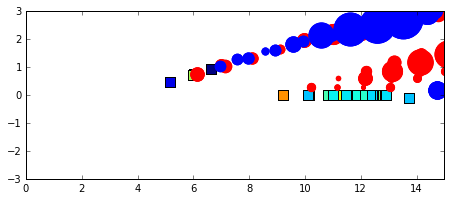

******************** New Time Step ********************
t =  2.5719534598897735 time step =  252
AOA =  10.1167163852 RA =  359.922855003
Pitching Rate =  -1.51941821584 Pitching Moment =  -120051.988162
q_target =  -0.233432770327 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -183.146063779 CFP Port Lift =  -183.526186039
DW Starboard Lift =  12254.7078966 DW Port Lift =  12243.3977478
Total Lift =  24131.4333946
CFP Starboard Control Input =  0.857323630339 CFP Port Control Input =  0.857323630339
Elevon Starboard Control Input =  -0.857323630339 Elevon Port Control Input =  -0.857323630339
CFP angle: -15.168757802 -15.168757802 Elevon angle: 5.16875780205 5.16875780205


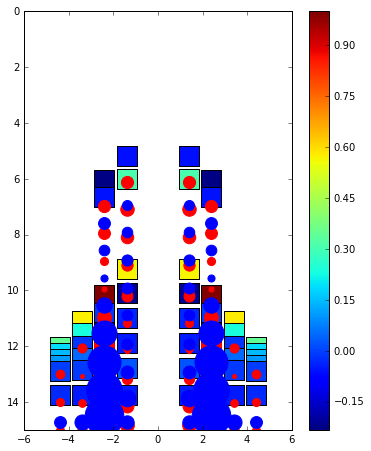

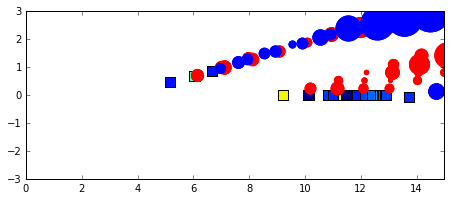

******************** New Time Step ********************
t =  2.5821596244131455 time step =  253
AOA =  10.102086825 RA =  359.92254664
Pitching Rate =  -1.43340430477 Pitching Moment =  -113255.873093
q_target =  -0.204173650001 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  2530.30319905 CFP Port Lift =  2526.73323145
DW Starboard Lift =  8786.73047233 DW Port Lift =  8770.9808995
Total Lift =  22614.7478023
CFP Starboard Control Input =  0.819487103179 CFP Port Control Input =  0.819487103179
Elevon Starboard Control Input =  -0.819487103179 Elevon Port Control Input =  -0.819487103179
CFP angle: -12.1577825301 -12.1577825301 Elevon angle: 2.15778253011 2.15778253011


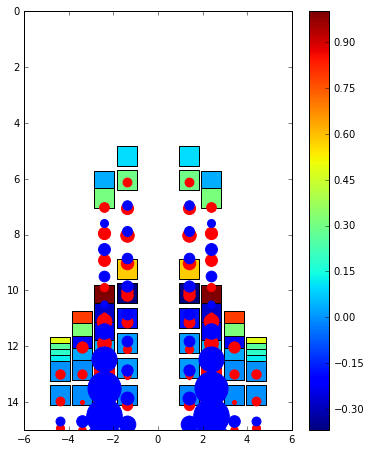

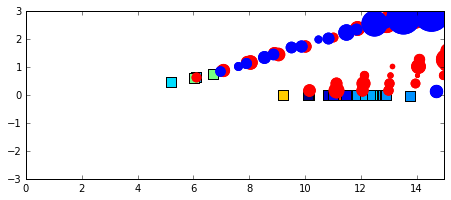

******************** New Time Step ********************
t =  2.5923657889365175 time step =  254
AOA =  10.0908216222 RA =  359.92226398
Pitching Rate =  -1.10376456748 Pitching Moment =  -87210.4397636
q_target =  -0.181643244459 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  2327.95541483 CFP Port Lift =  2326.58898732
DW Starboard Lift =  8631.37186347 DW Port Lift =  8623.63776511
Total Lift =  21909.5540307
CFP Starboard Control Input =  0.614747548677 CFP Port Control Input =  0.614747548677
Elevon Starboard Control Input =  -0.614747548677 Elevon Port Control Input =  -0.614747548677
CFP angle: -9.89906526614 -9.89906526614 Elevon angle: -0.100934733861 -0.100934733861


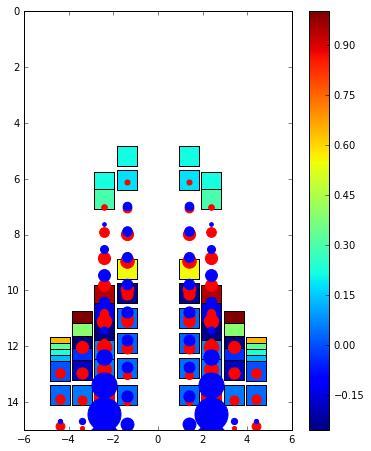

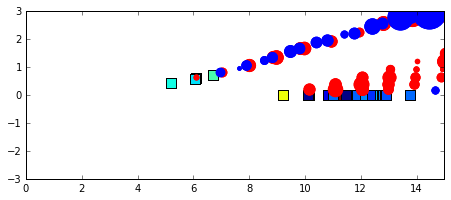

******************** New Time Step ********************
t =  2.60257195345989 time step =  255
AOA =  10.0822907281 RA =  359.921995871
Pitching Rate =  -0.835857007717 Pitching Moment =  -66042.5777114
q_target =  -0.164581456182 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  2370.43375015 CFP Port Lift =  2368.26914177
DW Starboard Lift =  7043.87270389 DW Port Lift =  7033.12351052
Total Lift =  18815.6991063
CFP Starboard Control Input =  0.447517034357 CFP Port Control Input =  0.447517034357
Elevon Starboard Control Input =  -0.447517034357 Elevon Port Control Input =  -0.447517034357
CFP angle: -8.25478957346 -8.25478957346 Elevon angle: -1.74521042654 -1.74521042654


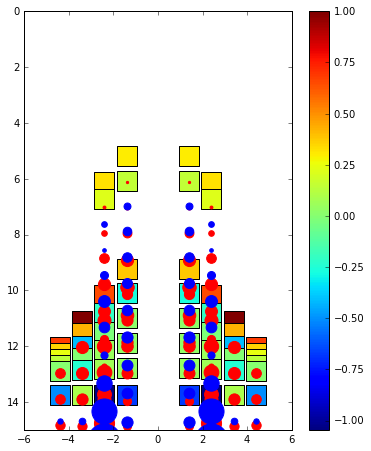

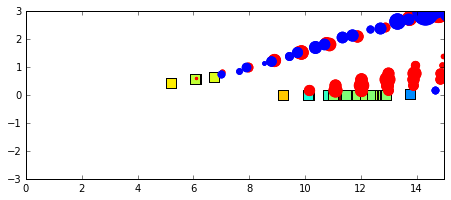

******************** New Time Step ********************
t =  2.612778117983262 time step =  256
AOA =  10.0801672167 RA =  359.92174557
Pitching Rate =  -0.20806164805 Pitching Moment =  -16439.3280588
q_target =  -0.16033443336 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1110.73713388 CFP Port Lift =  1109.40646165
DW Starboard Lift =  8253.65278172 DW Port Lift =  8242.87512369
Total Lift =  18716.6715009
CFP Starboard Control Input =  0.031818143127 CFP Port Control Input =  0.031818143127
Elevon Starboard Control Input =  -0.031818143127 Elevon Port Control Input =  -0.031818143127
CFP angle: -8.13788274017 -8.13788274017 Elevon angle: -1.86211725983 -1.86211725983


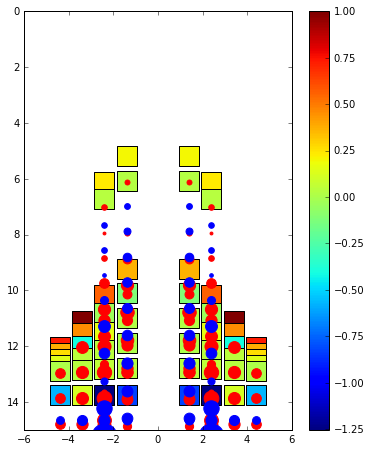

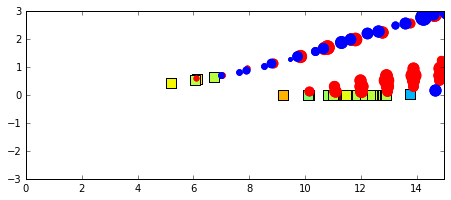

******************** New Time Step ********************
t =  2.622984282506634 time step =  257
AOA =  10.0828524633 RA =  359.921513016
Pitching Rate =  0.263100464685 Pitching Moment =  20788.0447546
q_target =  -0.165704926617 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1283.73174512 CFP Port Lift =  1283.81215018
DW Starboard Lift =  9652.53493645 DW Port Lift =  9658.33712429
Total Lift =  21878.4159561
CFP Starboard Control Input =  -0.285870260868 CFP Port Control Input =  -0.285870260868
Elevon Starboard Control Input =  0.285870260868 Elevon Port Control Input =  0.285870260868
CFP angle: -9.18823274949 -9.18823274949 Elevon angle: -0.811767250513 -0.811767250513


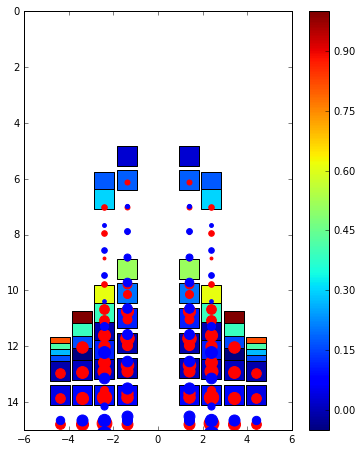

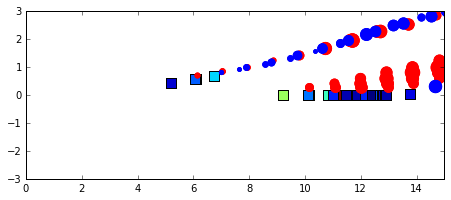

******************** New Time Step ********************
t =  2.6331904470300063 time step =  258
AOA =  10.0862513843 RA =  359.921276019
Pitching Rate =  0.333026277524 Pitching Moment =  26313.0100128
q_target =  -0.172502768575 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  669.320786729 CFP Port Lift =  668.504103864
DW Starboard Lift =  10690.0841882 DW Port Lift =  10690.9024457
Total Lift =  22718.8115245
CFP Starboard Control Input =  -0.337019364067 CFP Port Control Input =  -0.337019364067
Elevon Starboard Control Input =  0.337019364067 Elevon Port Control Input =  0.337019364067
CFP angle: -10.4265157773 -10.4265157773 Elevon angle: 0.426515777288 0.426515777288


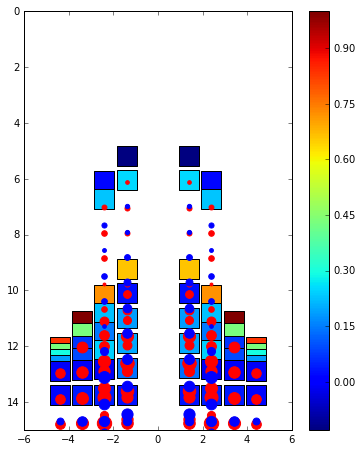

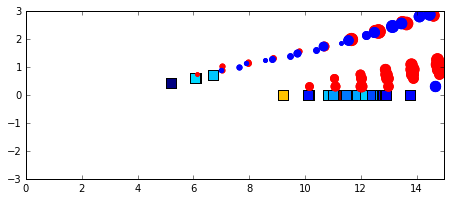

******************** New Time Step ********************
t =  2.6433966115533782 time step =  259
AOA =  10.0894573417 RA =  359.921040519
Pitching Rate =  0.314119703759 Pitching Moment =  24819.1673392
q_target =  -0.178914683329 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  262.874425584 CFP Port Lift =  257.704181354
DW Starboard Lift =  10143.2498849 DW Port Lift =  10123.8182119
Total Lift =  20787.6467037
CFP Starboard Control Input =  -0.328689591392 CFP Port Control Input =  -0.328689591392
Elevon Starboard Control Input =  0.328689591392 Elevon Port Control Input =  0.328689591392
CFP angle: -11.6341933942 -11.6341933942 Elevon angle: 1.63419339416 1.63419339416


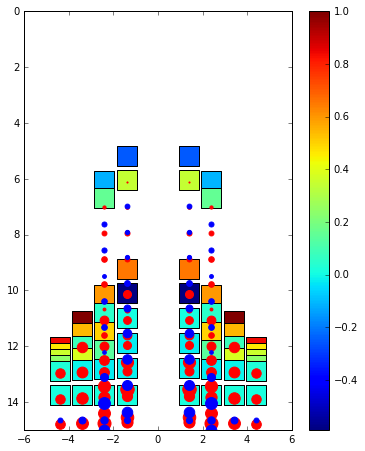

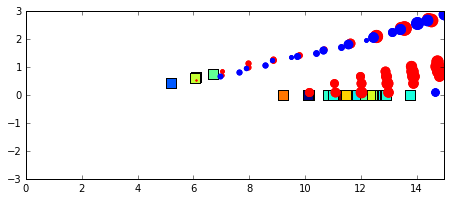

******************** New Time Step ********************
t =  2.65360277607675 time step =  260
AOA =  10.0914161085 RA =  359.920835894
Pitching Rate =  0.191919975492 Pitching Moment =  15163.9452427
q_target =  -0.182832217019 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -557.201599979 CFP Port Lift =  -542.878447055
DW Starboard Lift =  17741.5413348 DW Port Lift =  17807.5673732
Total Lift =  34449.028661
CFP Starboard Control Input =  -0.249834795007 CFP Port Control Input =  -0.249834795007
Elevon Starboard Control Input =  0.249834795007 Elevon Port Control Input =  0.249834795007
CFP angle: -12.5521412019 -12.5521412019 Elevon angle: 2.5521412019 2.5521412019


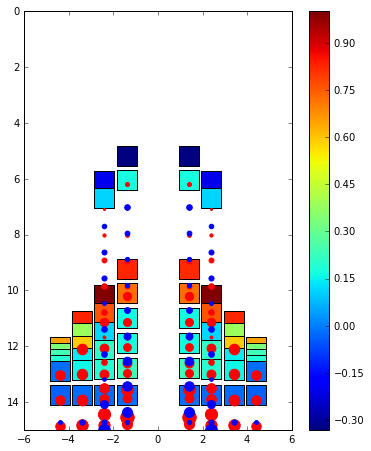

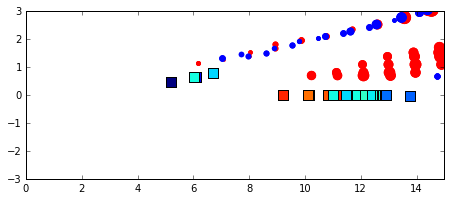

******************** New Time Step ********************
t =  2.6638089406001226 time step =  261
AOA =  10.0918642205 RA =  359.920537898
Pitching Rate =  0.0439060085503 Pitching Moment =  3469.09334361
q_target =  -0.183728440913 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -485.684435494 CFP Port Lift =  -483.53361853
DW Starboard Lift =  15532.2063351 DW Port Lift =  15527.1358844
Total Lift =  30090.1241654
CFP Starboard Control Input =  -0.151756299642 CFP Port Control Input =  -0.151756299642
Elevon Starboard Control Input =  0.151756299642 Elevon Port Control Input =  0.151756299642
CFP angle: -13.1097271161 -13.1097271161 Elevon angle: 3.10972711608 3.10972711608


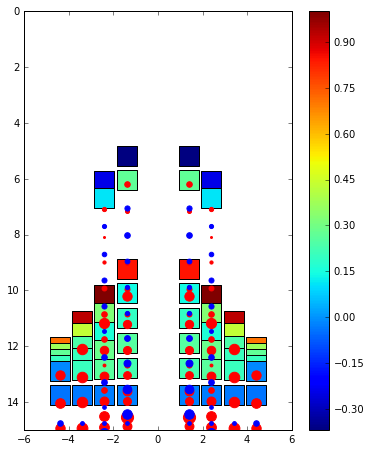

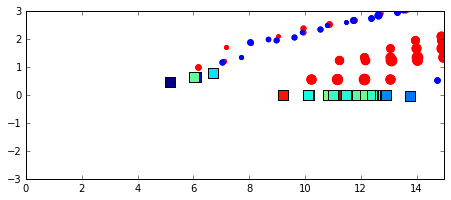

******************** New Time Step ********************
t =  2.6740151051234946 time step =  262
AOA =  10.0904581453 RA =  359.920239756
Pitching Rate =  -0.137767239287 Pitching Moment =  -10885.2393683
q_target =  -0.180916290692 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -268.702937192 CFP Port Lift =  -267.059965516
DW Starboard Lift =  13955.8829979 DW Port Lift =  13949.3652859
Total Lift =  27369.485381
CFP Starboard Control Input =  -0.0287660342703 CFP Port Control Input =  -0.0287660342703
Elevon Starboard Control Input =  0.0287660342703 Elevon Port Control Input =  0.0287660342703
CFP angle: -13.2154198323 -13.2154198323 Elevon angle: 3.21541983232 3.21541983232


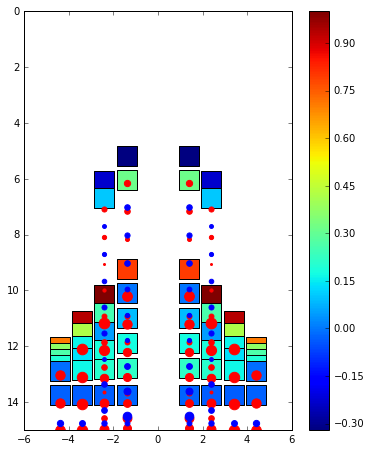

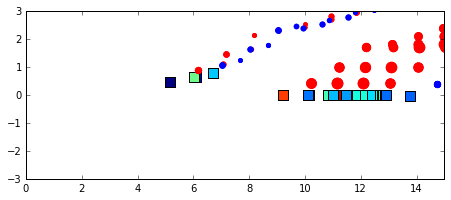

******************** New Time Step ********************
t =  2.6842212696468666 time step =  263
AOA =  10.087688119 RA =  359.919945052
Pitching Rate =  -0.271407185323 Pitching Moment =  -21444.3738135
q_target =  -0.17537623792 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  56.2849598419 CFP Port Lift =  54.5980626364
DW Starboard Lift =  11823.9989368 DW Port Lift =  11809.7941101
Total Lift =  23744.6760694
CFP Starboard Control Input =  0.0640206316018 CFP Port Control Input =  0.0640206316018
Elevon Starboard Control Input =  -0.0640206316018 Elevon Port Control Input =  -0.0640206316018
CFP angle: -12.9801939967 -12.9801939967 Elevon angle: 2.98019399667 2.98019399667


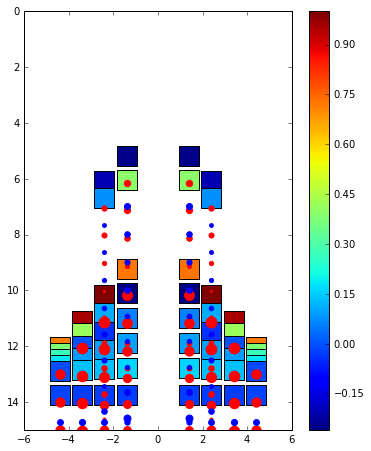

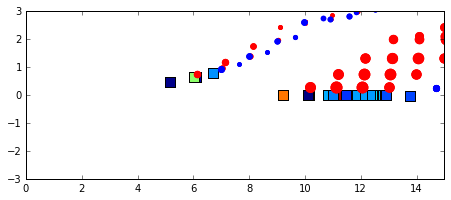

******************** New Time Step ********************
t =  2.694427434170239 time step =  264
AOA =  10.0841540186 RA =  359.919667585
Pitching Rate =  -0.346271155481 Pitching Moment =  -27359.5118351
q_target =  -0.168308037155 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  267.713466317 CFP Port Lift =  266.560859526
DW Starboard Lift =  10019.8813041 DW Port Lift =  10014.4451544
Total Lift =  20568.6007844
CFP Starboard Control Input =  0.118642078884 CFP Port Control Input =  0.118642078884
Elevon Starboard Control Input =  -0.118642078884 Elevon Port Control Input =  -0.118642078884
CFP angle: -12.5442769891 -12.5442769891 Elevon angle: 2.54427698914 2.54427698914


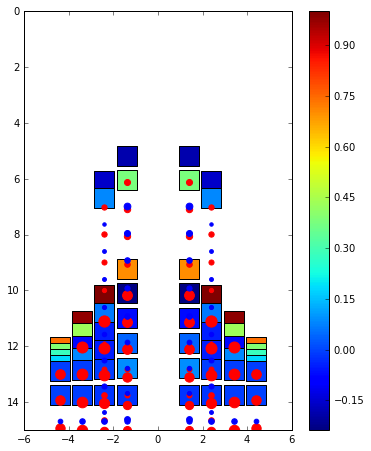

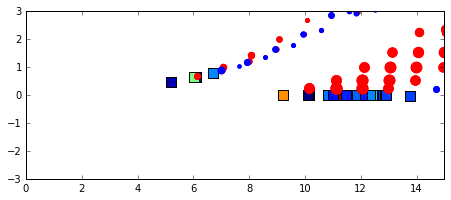

******************** New Time Step ********************
t =  2.704633598693611 time step =  265
AOA =  10.0805898824 RA =  359.919398184
Pitching Rate =  -0.349214065813 Pitching Moment =  -27592.0365163
q_target =  -0.161179764736 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  547.545659055 CFP Port Lift =  545.73424483
DW Starboard Lift =  9537.45465419 DW Port Lift =  9533.86835335
Total Lift =  20164.6029114
CFP Starboard Control Input =  0.125356200718 CFP Port Control Input =  0.125356200718
Elevon Starboard Control Input =  -0.125356200718 Elevon Port Control Input =  -0.125356200718
CFP angle: -12.0836908261 -12.0836908261 Elevon angle: 2.08369082606 2.08369082606


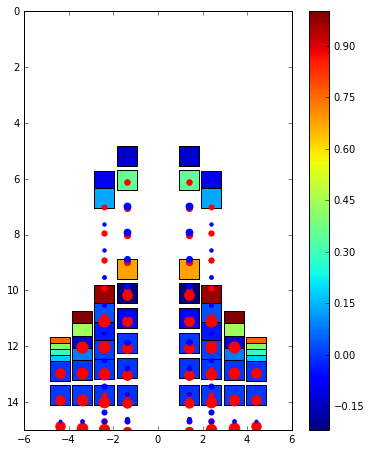

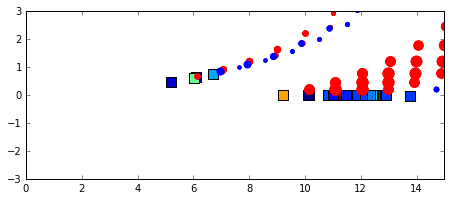

******************** New Time Step ********************
t =  2.714839763216983 time step =  266
AOA =  10.0773132323 RA =  359.91913644
Pitching Rate =  -0.321046175538 Pitching Moment =  -25366.4404332
q_target =  -0.154626464561 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  206.241397848 CFP Port Lift =  201.744950442
DW Starboard Lift =  9377.13052549 DW Port Lift =  9371.15666439
Total Lift =  19156.2735382
CFP Starboard Control Input =  0.110946473985 CFP Port Control Input =  0.110946473985
Elevon Starboard Control Input =  -0.110946473985 Elevon Port Control Input =  -0.110946473985
CFP angle: -11.676049158 -11.676049158 Elevon angle: 1.67604915802 1.67604915802


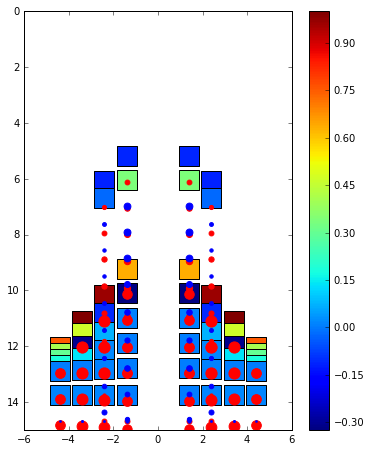

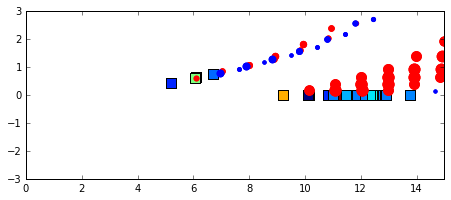

******************** New Time Step ********************
t =  2.7250459277403554 time step =  267
AOA =  10.0737249508 RA =  359.918888769
Pitching Rate =  -0.351579820174 Pitching Moment =  -27778.9590578
q_target =  -0.147449901586 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  553.483083352 CFP Port Lift =  549.254922721
DW Starboard Lift =  9698.78771961 DW Port Lift =  9700.70193304
Total Lift =  20502.2276587
CFP Starboard Control Input =  0.136086612392 CFP Port Control Input =  0.136086612392
Elevon Starboard Control Input =  -0.136086612392 Elevon Port Control Input =  -0.136086612392
CFP angle: -11.17603711 -11.17603711 Elevon angle: 1.17603711004 1.17603711004


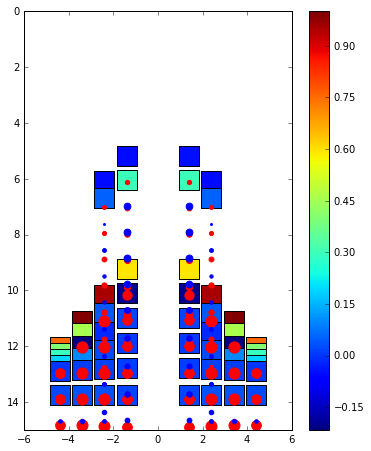

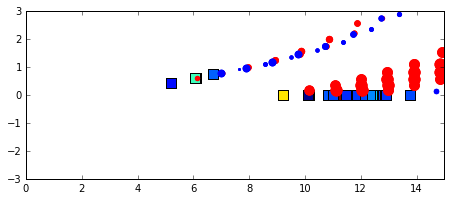

******************** New Time Step ********************
t =  2.7352520922637273 time step =  268
AOA =  10.070215309 RA =  359.918645739
Pitching Rate =  -0.343874701261 Pitching Moment =  -27170.163642
q_target =  -0.140430618033 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1284.43003338 CFP Port Lift =  1284.92160162
DW Starboard Lift =  9593.09207897 DW Port Lift =  9513.8230852
Total Lift =  21676.2667992
CFP Starboard Control Input =  0.135629388818 CFP Port Control Input =  0.135629388818
Elevon Starboard Control Input =  -0.135629388818 Elevon Port Control Input =  -0.135629388818
CFP angle: -10.6777050017 -10.6777050017 Elevon angle: 0.677705001706 0.677705001706


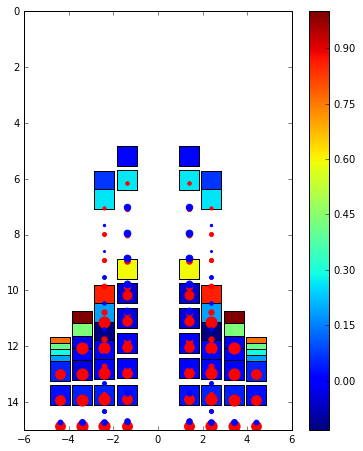

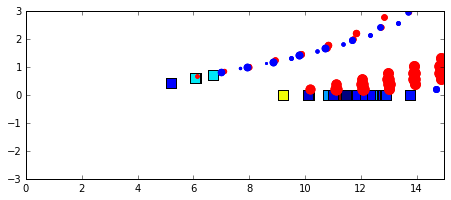

******************** New Time Step ********************
t =  2.7454582567870993 time step =  269
AOA =  10.0676865982 RA =  359.918532091
Pitching Rate =  -0.24776308343 Pitching Moment =  -19576.2104527
q_target =  -0.135373196448 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1234.57921843 CFP Port Lift =  1235.88060943
DW Starboard Lift =  9454.42217211 DW Port Lift =  9461.00510974
Total Lift =  21385.8871097
CFP Starboard Control Input =  0.0749265913215 CFP Port Control Input =  0.0749265913215
Elevon Starboard Control Input =  -0.0749265913215 Elevon Port Control Input =  -0.0749265913215
CFP angle: -10.4024082792 -10.4024082792 Elevon angle: 0.402408279153 0.402408279153


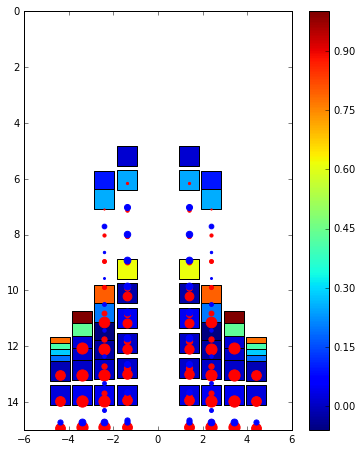

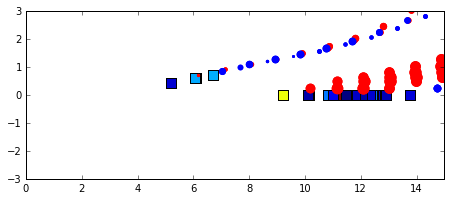

******************** New Time Step ********************
t =  2.7556644213104713 time step =  270
AOA =  10.0661121026 RA =  359.918409028
Pitching Rate =  -0.15426908227 Pitching Moment =  -12189.0799027
q_target =  -0.132224205179 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1201.23366097 CFP Port Lift =  1202.03185416
DW Starboard Lift =  9449.69739586 DW Port Lift =  9451.20443674
Total Lift =  21304.1673477
CFP Starboard Control Input =  0.0146965847272 CFP Port Control Input =  0.0146965847272
Elevon Starboard Control Input =  -0.0146965847272 Elevon Port Control Input =  -0.0146965847272
CFP angle: -10.348409805 -10.348409805 Elevon angle: 0.348409804956 0.348409804956


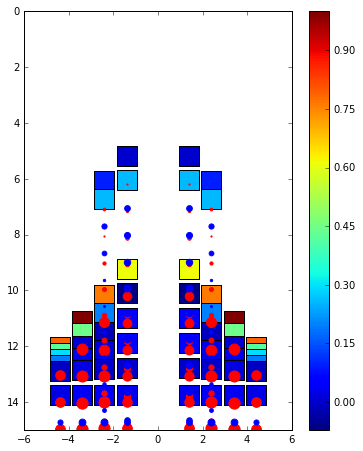

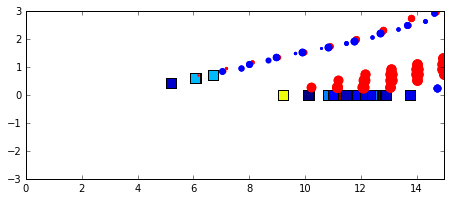

******************** New Time Step ********************
t =  2.7658705858338437 time step =  271
AOA =  10.065338506 RA =  359.918282398
Pitching Rate =  -0.0757969970277 Pitching Moment =  -5988.85816626
q_target =  -0.130677011935 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1078.45877944 CFP Port Lift =  1079.60376518
DW Starboard Lift =  9694.39365924 DW Port Lift =  9696.06012636
Total Lift =  21548.5163302
CFP Starboard Control Input =  -0.036586676605 CFP Port Control Input =  -0.036586676605
Elevon Starboard Control Input =  0.036586676605 Elevon Port Control Input =  0.036586676605
CFP angle: -10.4828372756 -10.4828372756 Elevon angle: 0.482837275642 0.482837275642


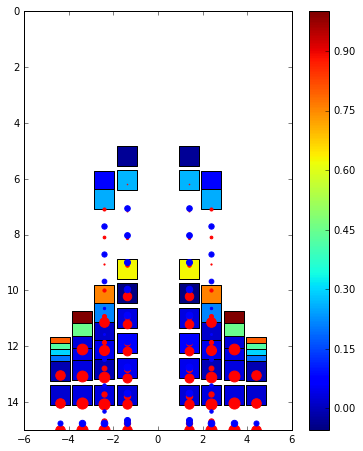

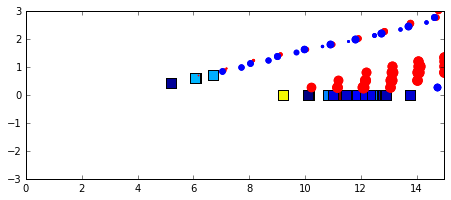

******************** New Time Step ********************
t =  2.7760767503572157 time step =  272
AOA =  10.0651447146 RA =  359.918151489
Pitching Rate =  -0.0189876773048 Pitching Moment =  -1500.2508113
q_target =  -0.130289429218 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1004.04513528 CFP Port Lift =  1004.71259695
DW Starboard Lift =  9457.93114861 DW Port Lift =  9456.86816817
Total Lift =  20923.557049
CFP Starboard Control Input =  -0.0742011679422 CFP Port Control Input =  -0.0742011679422
Elevon Starboard Control Input =  0.0742011679422 Elevon Port Control Input =  0.0742011679422
CFP angle: -10.7554686337 -10.7554686337 Elevon angle: 0.755468633666 0.755468633666


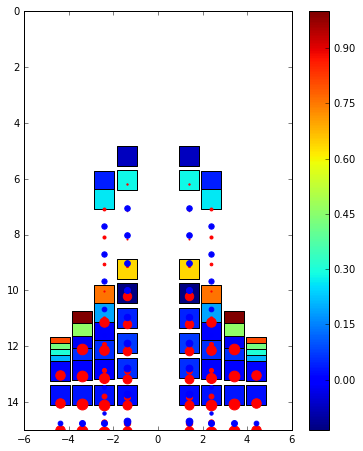

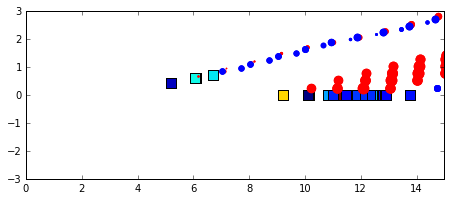

******************** New Time Step ********************
t =  2.7862829148805877 time step =  273
AOA =  10.0654347178 RA =  359.91802002
Pitching Rate =  0.0284145171807 Pitching Moment =  2245.08252214
q_target =  -0.130869435693 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  827.968522708 CFP Port Lift =  828.738369579
DW Starboard Lift =  9373.71818345 DW Port Lift =  9373.08952817
Total Lift =  20403.5146039
CFP Starboard Control Input =  -0.106189301915 CFP Port Control Input =  -0.106189301915
Elevon Starboard Control Input =  0.106189301915 Elevon Port Control Input =  0.106189301915
CFP angle: -11.1456314086 -11.1456314086 Elevon angle: 1.14563140862 1.14563140862


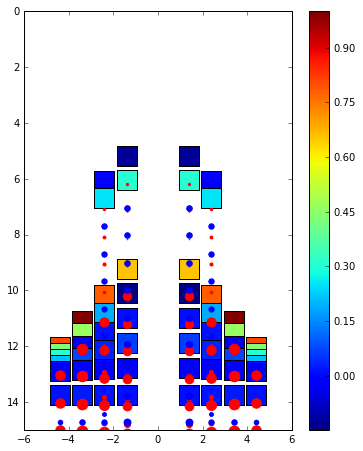

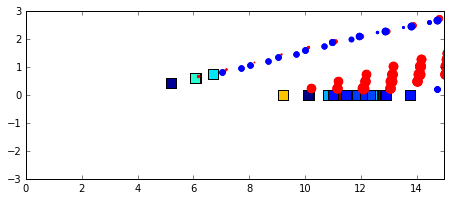

******************** New Time Step ********************
t =  2.79648907940396 time step =  274
AOA =  10.0660707189 RA =  359.917887835
Pitching Rate =  0.0623153848121 Pitching Moment =  4923.65154096
q_target =  -0.132141437832 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  525.957258201 CFP Port Lift =  526.724232923
DW Starboard Lift =  9501.787833 DW Port Lift =  9500.7023223
Total Lift =  20055.1716464
CFP Starboard Control Input =  -0.129637881763 CFP Port Control Input =  -0.129637881763
Elevon Starboard Control Input =  0.129637881763 Elevon Port Control Input =  0.129637881763
CFP angle: -11.6219494065 -11.6219494065 Elevon angle: 1.62194940652 1.62194940652


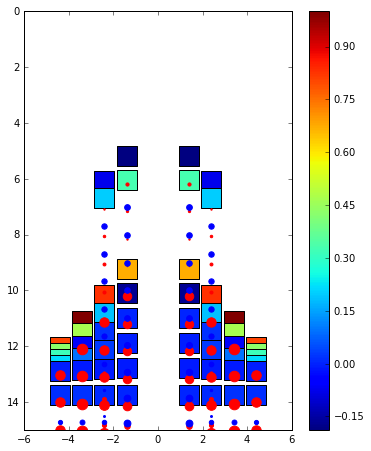

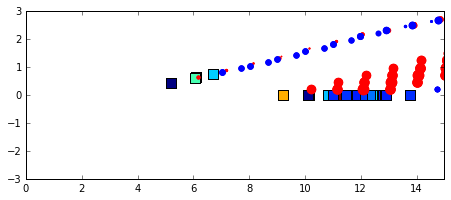

******************** New Time Step ********************
t =  2.806695243927332 time step =  275
AOA =  10.0667354497 RA =  359.917755824
Pitching Rate =  0.0651303188282 Pitching Moment =  5146.06458146
q_target =  -0.133470899331 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -36.0385694232 CFP Port Lift =  -35.2648601893
DW Starboard Lift =  10059.1759109 DW Port Lift =  10057.9400295
Total Lift =  20045.8125108
CFP Starboard Control Input =  -0.132400812106 CFP Port Control Input =  -0.132400812106
Elevon Starboard Control Input =  0.132400812106 Elevon Port Control Input =  0.132400812106
CFP angle: -12.1084190162 -12.1084190162 Elevon angle: 2.10841901622 2.10841901622


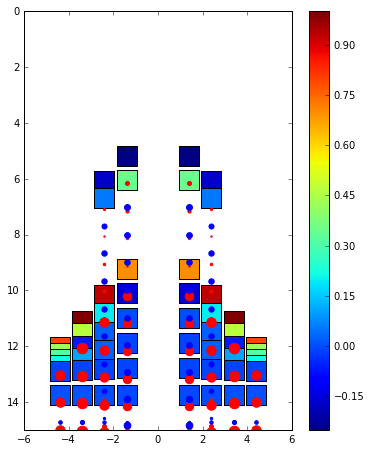

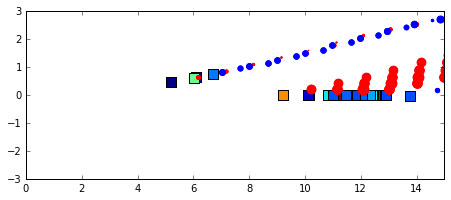

******************** New Time Step ********************
t =  2.816901408450704 time step =  276
AOA =  10.0668208694 RA =  359.9176244
Pitching Rate =  0.00836942257816 Pitching Moment =  661.283252894
q_target =  -0.133641738738 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1387.78158659 CFP Port Lift =  -1387.09572304
DW Starboard Lift =  11016.3359362 DW Port Lift =  11012.4433542
Total Lift =  19253.9019808
CFP Starboard Control Input =  -0.0946741075444 CFP Port Control Input =  -0.0946741075444
Elevon Starboard Control Input =  0.0946741075444 Elevon Port Control Input =  0.0946741075444
CFP angle: -12.4562724426 -12.4562724426 Elevon angle: 2.45627244259 2.45627244259


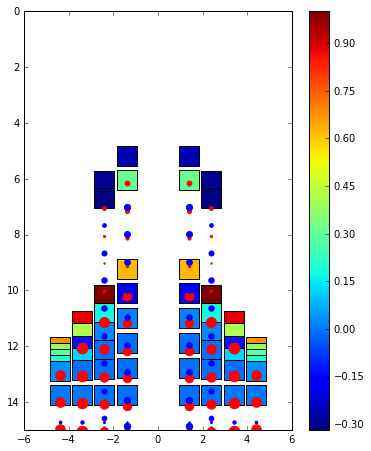

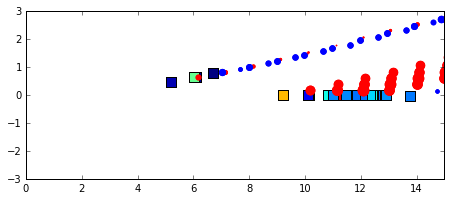

******************** New Time Step ********************
t =  2.8271075729740764 time step =  277
AOA =  10.0647733142 RA =  359.917497093
Pitching Rate =  -0.200619453792 Pitching Moment =  -15851.3067967
q_target =  -0.129546628434 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -3052.21111964 CFP Port Lift =  -3051.98810309
DW Starboard Lift =  12750.6299455 DW Port Lift =  12747.9042051
Total Lift =  19394.3349279
CFP Starboard Control Input =  0.0473818835718 CFP Port Control Input =  0.0473818835718
Elevon Starboard Control Input =  -0.0473818835718 Elevon Port Control Input =  -0.0473818835718
CFP angle: -12.2821810149 -12.2821810149 Elevon angle: 2.28218101489 2.28218101489


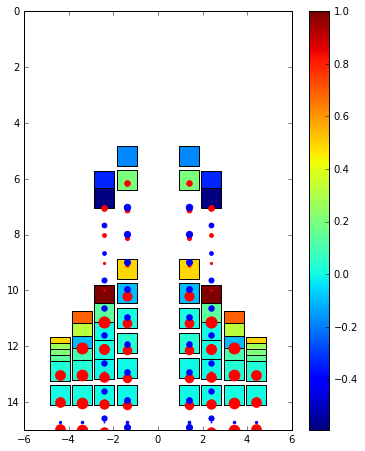

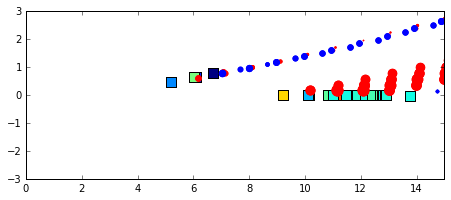

******************** New Time Step ********************
t =  2.8373137374974484 time step =  278
AOA =  10.0587911212 RA =  359.917373323
Pitching Rate =  -0.586135267912 Pitching Moment =  -46311.6102672
q_target =  -0.11758224248 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  28.5564160523 CFP Port Lift =  27.9937985448
DW Starboard Lift =  10840.0162294 DW Port Lift =  10839.2777504
Total Lift =  21735.8441944
CFP Starboard Control Input =  0.312368683622 CFP Port Control Input =  0.312368683622
Elevon Starboard Control Input =  -0.312368683622 Elevon Port Control Input =  -0.312368683622
CFP angle: -11.1344699912 -11.1344699912 Elevon angle: 1.13446999117 1.13446999117


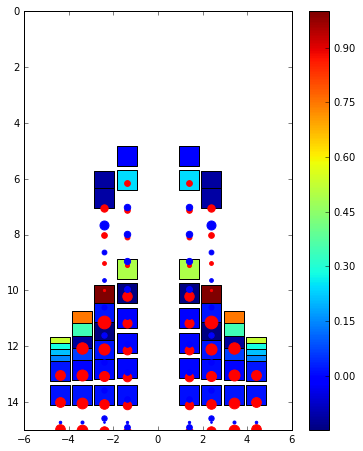

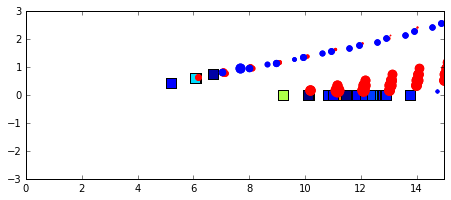

******************** New Time Step ********************
t =  2.8475199020208204 time step =  279
AOA =  10.0526742502 RA =  359.917251717
Pitching Rate =  -0.599331025054 Pitching Moment =  -47354.2309648
q_target =  -0.105348500389 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  2036.59933193 CFP Port Lift =  2036.55169954
DW Starboard Lift =  9129.64298612 DW Port Lift =  9130.82888037
Total Lift =  22333.622898
CFP Starboard Control Input =  0.32932168311 CFP Port Control Input =  0.32932168311
Elevon Starboard Control Input =  -0.32932168311 Elevon Port Control Input =  -0.32932168311
CFP angle: -9.92446993076 -9.92446993076 Elevon angle: -0.0755300692419 -0.0755300692419


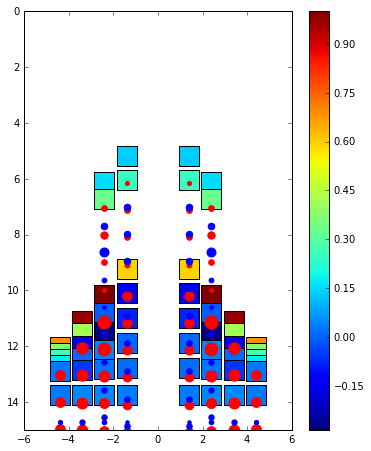

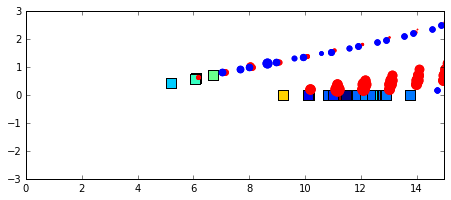

******************** New Time Step ********************
t =  2.857726066544193 time step =  280
AOA =  10.0487044431 RA =  359.917129163
Pitching Rate =  -0.388961703176 Pitching Moment =  -30732.5694127
q_target =  -0.0974088861168 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1988.11031072 CFP Port Lift =  1988.23764589
DW Starboard Lift =  8298.0353177 DW Port Lift =  8299.38739818
Total Lift =  20573.7706725
CFP Starboard Control Input =  0.194368544706 CFP Port Control Input =  0.194368544706
Elevon Starboard Control Input =  -0.194368544706 Elevon Port Control Input =  -0.194368544706
CFP angle: -9.2103172864 -9.2103172864 Elevon angle: -0.7896827136 -0.7896827136


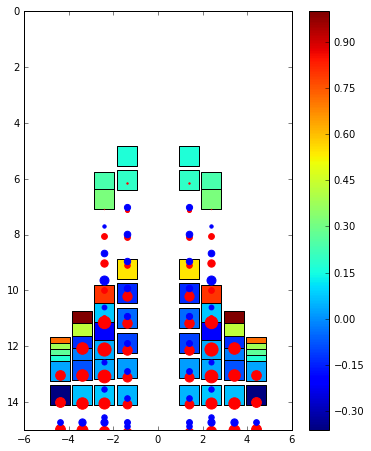

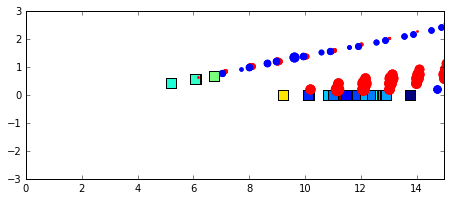

******************** New Time Step ********************
t =  2.867932231067565 time step =  281
AOA =  10.0472883697 RA =  359.91700467
Pitching Rate =  -0.138746863466 Pitching Moment =  -10962.6412509
q_target =  -0.0945767394856 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1867.8402745 CFP Port Lift =  1868.07800899
DW Starboard Lift =  8233.44033679 DW Port Lift =  8234.70167745
Total Lift =  20204.0602977
CFP Starboard Control Input =  0.02944674932 CFP Port Control Input =  0.02944674932
Elevon Starboard Control Input =  -0.02944674932 Elevon Port Control Input =  -0.02944674932
CFP angle: -9.10212347383 -9.10212347383 Elevon angle: -0.897876526166 -0.897876526166


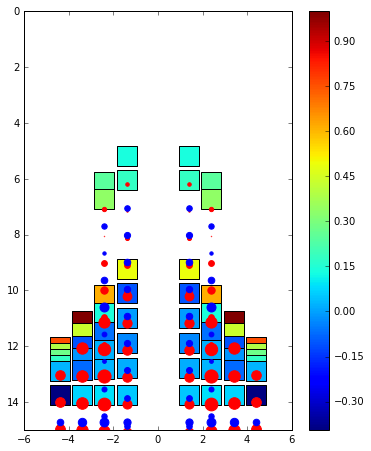

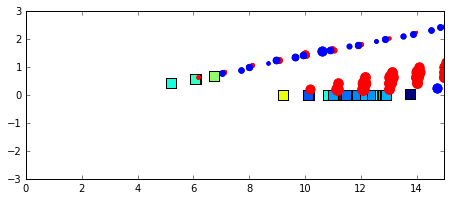

******************** New Time Step ********************
t =  2.8781383955909368 time step =  282
AOA =  10.048028197 RA =  359.916878096
Pitching Rate =  0.0724882721562 Pitching Moment =  5727.42981496
q_target =  -0.0960563939488 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1665.95227863 CFP Port Lift =  1666.30093463
DW Starboard Lift =  8422.07480547 DW Port Lift =  8423.30269567
Total Lift =  20177.6307144
CFP Starboard Control Input =  -0.112363110737 CFP Port Control Input =  -0.112363110737
Elevon Starboard Control Input =  0.112363110737 Elevon Port Control Input =  0.112363110737
CFP angle: -9.51497017587 -9.51497017587 Elevon angle: -0.485029824133 -0.485029824133


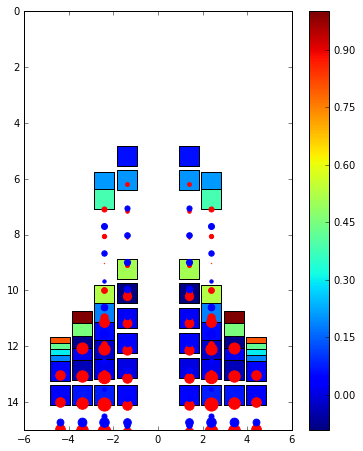

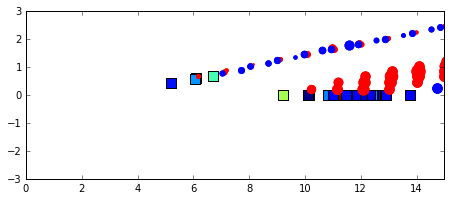

******************** New Time Step ********************
t =  2.888344560114309 time step =  283
AOA =  10.0498685722 RA =  359.916749512
Pitching Rate =  0.180319960014 Pitching Moment =  14247.4069873
q_target =  -0.0997371443063 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1396.67656016 CFP Port Lift =  1397.17947245
DW Starboard Lift =  8988.18550172 DW Port Lift =  8989.50210572
Total Lift =  20771.5436401
CFP Starboard Control Input =  -0.186704736214 CFP Port Control Input =  -0.186704736214
Elevon Starboard Control Input =  0.186704736214 Elevon Port Control Input =  0.186704736214
CFP angle: -10.2009643077 -10.2009643077 Elevon angle: 0.200964307699 0.200964307699


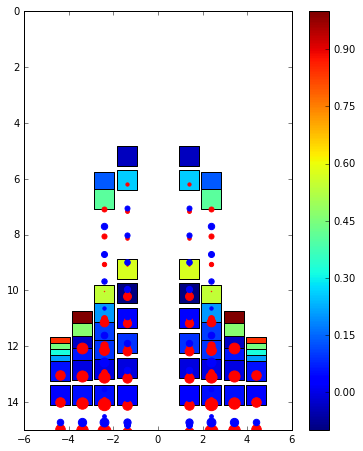

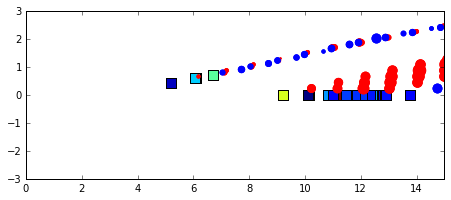

******************** New Time Step ********************
t =  2.898550724637681 time step =  284
AOA =  10.0523885198 RA =  359.916618552
Pitching Rate =  0.246904467959 Pitching Moment =  19508.3696876
q_target =  -0.104777039549 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  964.852826335 CFP Port Lift =  965.562778236
DW Starboard Lift =  9436.60558787 DW Port Lift =  9437.9863652
Total Lift =  20805.0075576
CFP Starboard Control Input =  -0.234454338339 CFP Port Control Input =  -0.234454338339
Elevon Starboard Control Input =  0.234454338339 Elevon Port Control Input =  0.234454338339
CFP angle: -11.0624009458 -11.0624009458 Elevon angle: 1.06240094581 1.06240094581


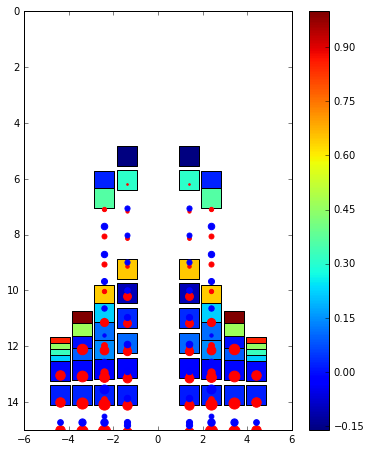

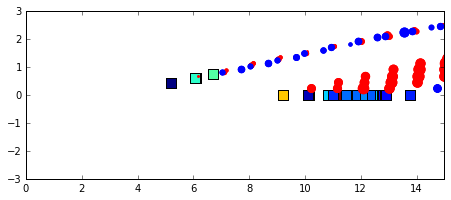

******************** New Time Step ********************
t =  2.908756889161053 time step =  285
AOA =  10.0551972664 RA =  359.916484841
Pitching Rate =  0.275200993082 Pitching Moment =  21744.1294433
q_target =  -0.110394532774 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  341.104651676 CFP Port Lift =  342.023016614
DW Starboard Lift =  10499.1637938 DW Port Lift =  10499.9304672
Total Lift =  21682.2219293
CFP Starboard Control Input =  -0.257063683904 CFP Port Control Input =  -0.257063683904
Elevon Starboard Control Input =  0.257063683904 Elevon Port Control Input =  0.257063683904
CFP angle: -12.0069092761 -12.0069092761 Elevon angle: 2.00690927614 2.00690927614


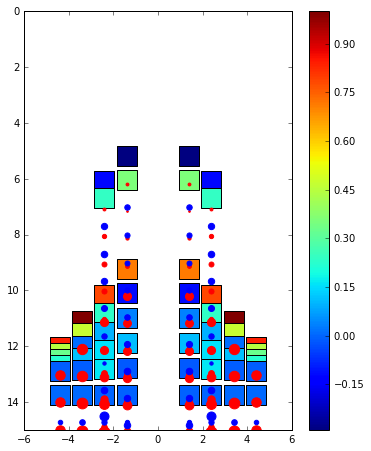

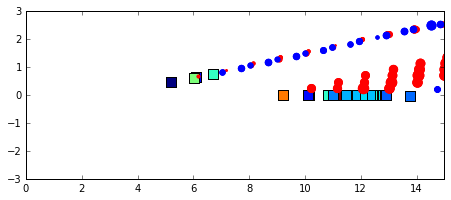

******************** New Time Step ********************
t =  2.9189630536844255 time step =  286
AOA =  10.0574978715 RA =  359.916348812
Pitching Rate =  0.225413292754 Pitching Moment =  17810.3129679
q_target =  -0.114995743077 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -577.916256052 CFP Port Lift =  -576.720907836
DW Starboard Lift =  11251.5237218 DW Port Lift =  11251.8744819
Total Lift =  21348.7610398
CFP Starboard Control Input =  -0.226939357221 CFP Port Control Input =  -0.226939357221
Elevon Starboard Control Input =  0.226939357221 Elevon Port Control Input =  0.226939357221
CFP angle: -12.8407342261 -12.8407342261 Elevon angle: 2.84073422612 2.84073422612


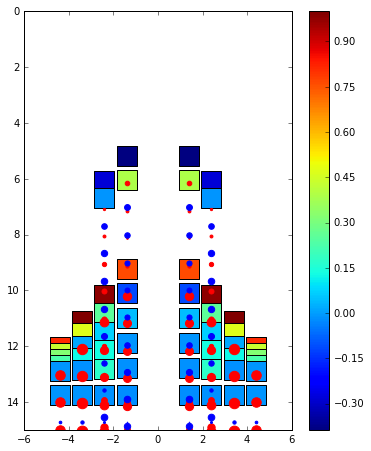

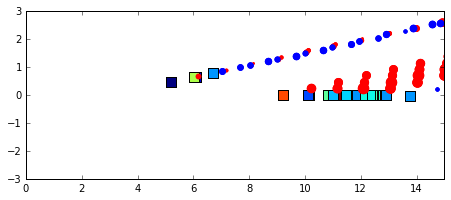

******************** New Time Step ********************
t =  2.9291692182077975 time step =  287
AOA =  10.0583881037 RA =  359.916210652
Pitching Rate =  0.0872249512245 Pitching Moment =  6891.8015479
q_target =  -0.116776207483 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1576.92186561 CFP Port Lift =  -1575.54796659
DW Starboard Lift =  12066.5949975 DW Port Lift =  12066.331727
Total Lift =  20980.4568923
CFP Starboard Control Input =  -0.136000772472 CFP Port Control Input =  -0.136000772472
Elevon Starboard Control Input =  0.136000772472 Elevon Port Control Input =  0.136000772472
CFP angle: -13.3404308794 -13.3404308794 Elevon angle: 3.34043087942 3.34043087942


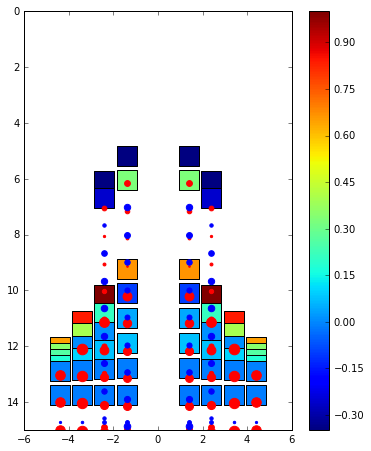

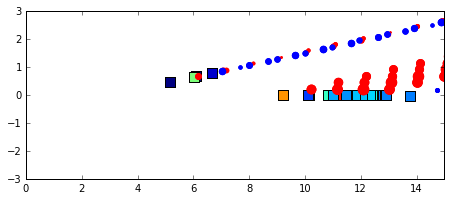

******************** New Time Step ********************
t =  2.9393753827311695 time step =  288
AOA =  10.057020535 RA =  359.916070915
Pitching Rate =  -0.133994387734 Pitching Moment =  -10587.1395264
q_target =  -0.11404106995 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1891.52469608 CFP Port Lift =  -1890.2631078
DW Starboard Lift =  12671.2215819 DW Port Lift =  12670.726359
Total Lift =  21560.160137
CFP Starboard Control Input =  0.0133022118557 CFP Port Control Input =  0.0133022118557
Elevon Starboard Control Input =  -0.0133022118557 Elevon Port Control Input =  -0.0133022118557
CFP angle: -13.2915556368 -13.2915556368 Elevon angle: 3.29155563683 3.29155563683


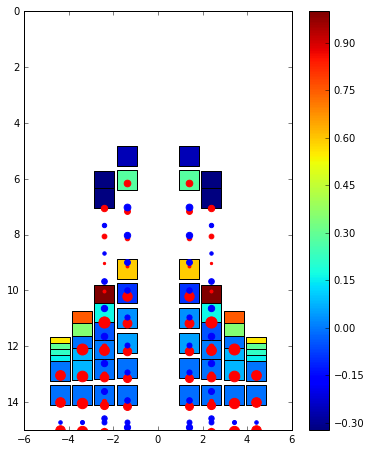

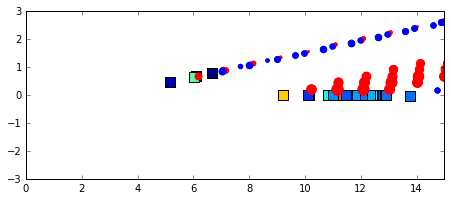

******************** New Time Step ********************
t =  2.949581547254542 time step =  289
AOA =  10.0531378367 RA =  359.915930088
Pitching Rate =  -0.38042677235 Pitching Moment =  -30058.209053
q_target =  -0.106275673495 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -848.295297934 CFP Port Lift =  -847.541733567
DW Starboard Lift =  12063.1873857 DW Port Lift =  12062.4448655
Total Lift =  22429.7952197
CFP Starboard Control Input =  0.182767399237 CFP Port Control Input =  0.182767399237
Elevon Starboard Control Input =  -0.182767399237 Elevon Port Control Input =  -0.182767399237
CFP angle: -12.6200281442 -12.6200281442 Elevon angle: 2.62002814423 2.62002814423


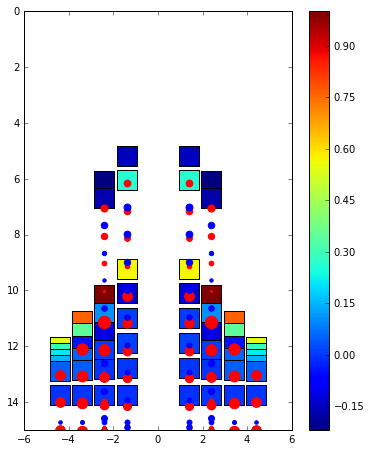

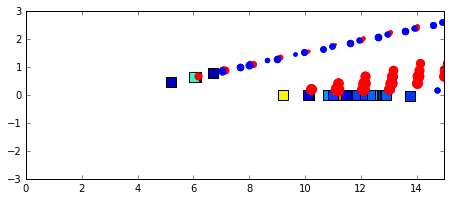

******************** New Time Step ********************
t =  2.959787711777914 time step =  290
AOA =  10.0480323679 RA =  359.915789133
Pitching Rate =  -0.500233835229 Pitching Moment =  -39524.3823189
q_target =  -0.0960647358496 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  452.215195009 CFP Port Lift =  452.522125512
DW Starboard Lift =  10713.3820004 DW Port Lift =  10712.5889954
Total Lift =  22330.7083163
CFP Starboard Control Input =  0.269446066253 CFP Port Control Input =  0.269446066253
Elevon Starboard Control Input =  -0.269446066253 Elevon Port Control Input =  -0.269446066253
CFP angle: -11.6300242266 -11.6300242266 Elevon angle: 1.63002422658 1.63002422658


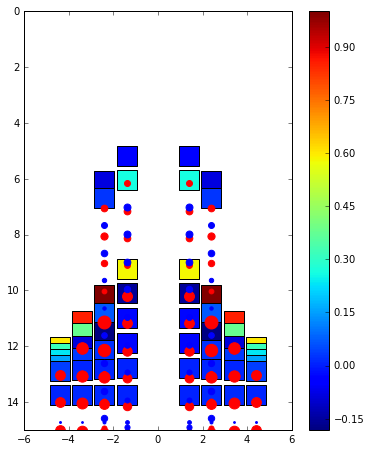

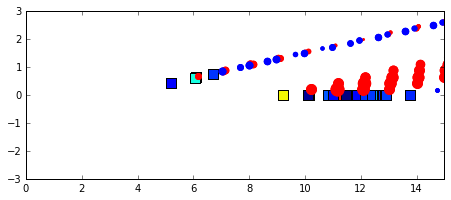

******************** New Time Step ********************
t =  2.969993876301286 time step =  291
AOA =  10.0432420089 RA =  359.915648741
Pitching Rate =  -0.469359374495 Pitching Moment =  -37084.9351964
q_target =  -0.0864840178563 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1186.65564287 CFP Port Lift =  1186.70697791
DW Starboard Lift =  9747.1994637 DW Port Lift =  9746.25000658
Total Lift =  21866.8120911
CFP Starboard Control Input =  0.255250237759 CFP Port Control Input =  0.255250237759
Elevon Starboard Control Input =  -0.255250237759 Elevon Port Control Input =  -0.255250237759
CFP angle: -10.692178895 -10.692178895 Elevon angle: 0.692178894952 0.692178894952


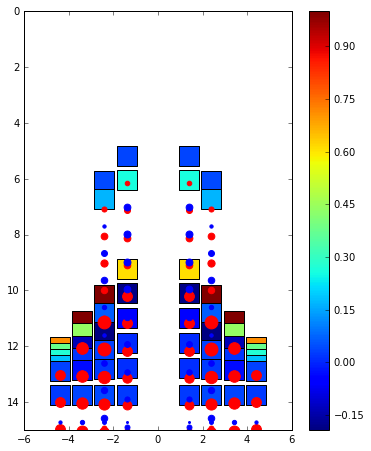

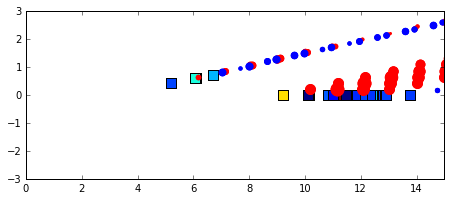

******************** New Time Step ********************
t =  2.9802000408246583 time step =  292
AOA =  10.0394690571 RA =  359.915509532
Pitching Rate =  -0.369673820686 Pitching Moment =  -29208.5988454
q_target =  -0.0789381141885 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1592.85897726 CFP Port Lift =  1592.72800731
DW Starboard Lift =  8900.86639956 DW Port Lift =  8899.77616121
Total Lift =  20986.2295453
CFP Starboard Control Input =  0.193823804332 CFP Port Control Input =  0.193823804332
Elevon Starboard Control Input =  -0.193823804332 Elevon Port Control Input =  -0.193823804332
CFP angle: -9.98002774615 -9.98002774615 Elevon angle: -0.0199722538477 -0.0199722538477


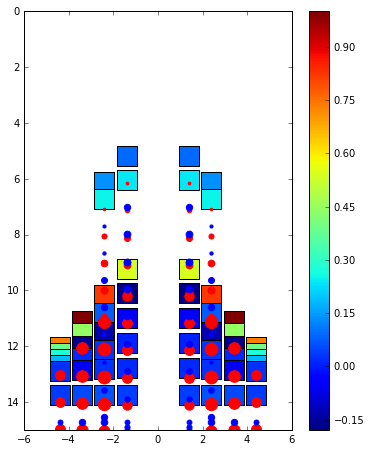

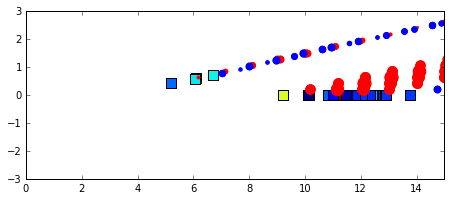

******************** New Time Step ********************
t =  2.9904062053480303 time step =  293
AOA =  10.0370054153 RA =  359.915372012
Pitching Rate =  -0.241387624097 Pitching Moment =  -19072.4738511
q_target =  -0.0740108305776 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1828.54865765 CFP Port Lift =  1828.31949139
DW Starboard Lift =  8282.07639946 DW Port Lift =  8281.21644787
Total Lift =  20220.1609964
CFP Starboard Control Input =  0.111584529013 CFP Port Control Input =  0.111584529013
Elevon Starboard Control Input =  -0.111584529013 Elevon Port Control Input =  -0.111584529013
CFP angle: -9.57004172406 -9.57004172406 Elevon angle: -0.429958275939 -0.429958275939


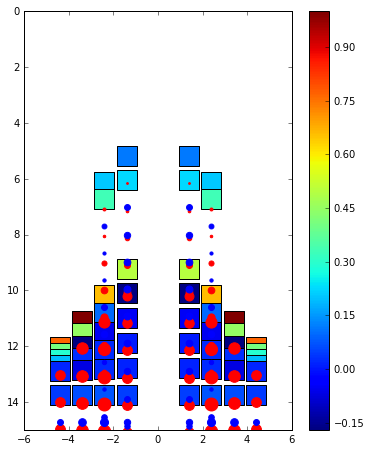

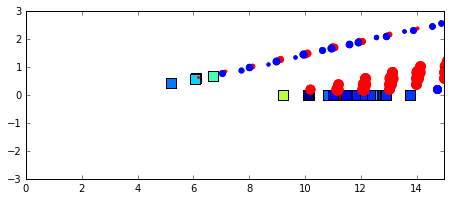

******************** New Time Step ********************
t =  3.0006123698714022 time step =  294
AOA =  10.0359589621 RA =  359.91523611
Pitching Rate =  -0.102531485502 Pitching Moment =  -8101.19857421
q_target =  -0.0719179241579 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1690.46158589 CFP Port Lift =  1691.0680915
DW Starboard Lift =  8447.22128187 DW Port Lift =  8450.58101119
Total Lift =  20279.3319705
CFP Starboard Control Input =  0.0204090408964 CFP Port Control Input =  0.0204090408964
Elevon Starboard Control Input =  -0.0204090408964 Elevon Port Control Input =  -0.0204090408964
CFP angle: -9.49505443357 -9.49505443357 Elevon angle: -0.504945566435 -0.504945566435


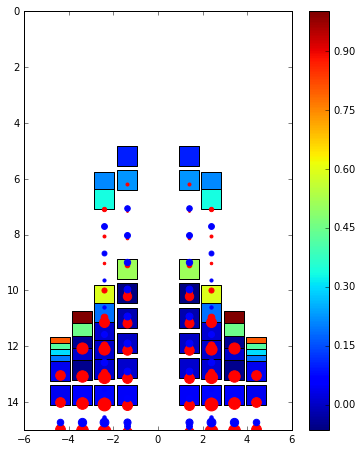

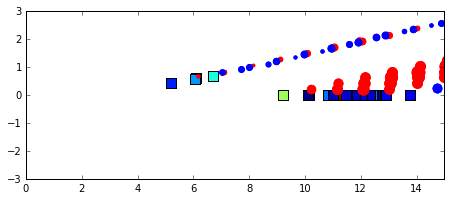

******************** New Time Step ********************
t =  3.010818534394774 time step =  295
AOA =  10.036132286 RA =  359.915095581
Pitching Rate =  0.0169822792138 Pitching Moment =  1341.80067205
q_target =  -0.0722645720291 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1473.99387016 CFP Port Lift =  1474.81285909
DW Starboard Lift =  8936.35987679 DW Port Lift =  8940.04979961
Total Lift =  20825.2164057
CFP Starboard Control Input =  -0.0594979008286 CFP Port Control Input =  -0.0594979008286
Elevon Starboard Control Input =  0.0594979008286 Elevon Port Control Input =  0.0594979008286
CFP angle: -9.71366276484 -9.71366276484 Elevon angle: -0.28633723516 -0.28633723516


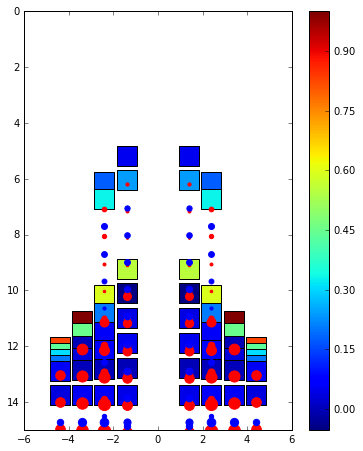

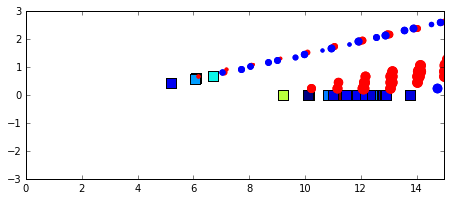

******************** New Time Step ********************
t =  3.0210246989181466 time step =  296
AOA =  10.0371812026 RA =  359.914949488
Pitching Rate =  0.10277284752 Pitching Moment =  8120.2690248
q_target =  -0.0743624052098 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1260.16394465 CFP Port Lift =  1260.98380497
DW Starboard Lift =  9043.78295553 DW Port Lift =  9045.65386213
Total Lift =  20610.5845673
CFP Starboard Control Input =  -0.118090168486 CFP Port Control Input =  -0.118090168486
Elevon Starboard Control Input =  0.118090168486 Elevon Port Control Input =  0.118090168486
CFP angle: -10.1475519326 -10.1475519326 Elevon angle: 0.147551932579 0.147551932579


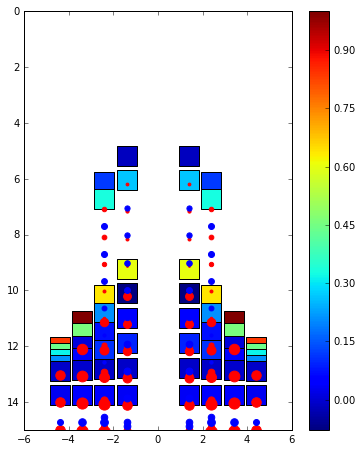

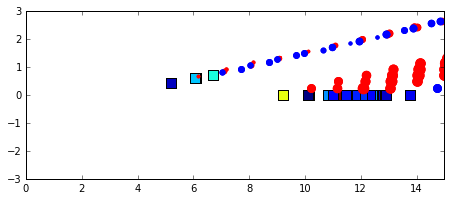

******************** New Time Step ********************
t =  3.0312308634415186 time step =  297
AOA =  10.0389357627 RA =  359.914799745
Pitching Rate =  0.171911802454 Pitching Moment =  13583.0632133
q_target =  -0.0778715254885 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  983.120190712 CFP Port Lift =  983.98003883
DW Starboard Lift =  9502.1508158 DW Port Lift =  9503.00306999
Total Lift =  20972.2541153
CFP Starboard Control Input =  -0.166522218629 CFP Port Control Input =  -0.166522218629
Elevon Starboard Control Input =  0.166522218629 Elevon Port Control Input =  0.166522218629
CFP angle: -10.7593910702 -10.7593910702 Elevon angle: 0.759391070222 0.759391070222


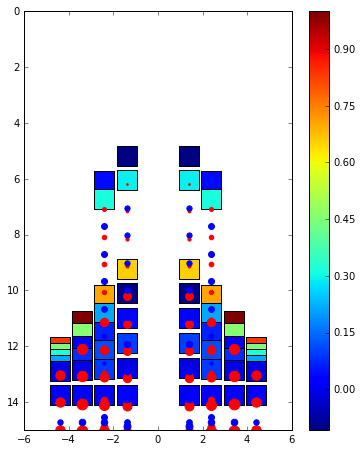

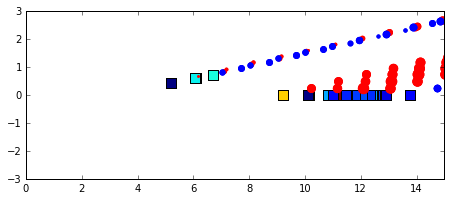

******************** New Time Step ********************
t =  3.0414370279648906 time step =  298
AOA =  10.0410306841 RA =  359.914647421
Pitching Rate =  0.2052603962 Pitching Moment =  16217.996071
q_target =  -0.082061368236 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  624.040860079 CFP Port Lift =  624.960275307
DW Starboard Lift =  9922.18104142 DW Port Lift =  9922.10414758
Total Lift =  21093.2863244
CFP Starboard Control Input =  -0.191547842957 CFP Port Control Input =  -0.191547842957
Elevon Starboard Control Input =  0.191547842957 Elevon Port Control Input =  0.191547842957
CFP angle: -11.463179838 -11.463179838 Elevon angle: 1.46317983798 1.46317983798


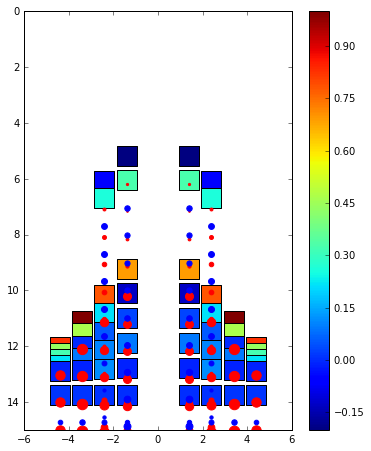

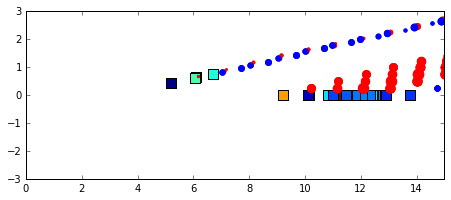

******************** New Time Step ********************
t =  3.051643192488263 time step =  299
AOA =  10.0430731483 RA =  359.914493617
Pitching Rate =  0.200120636721 Pitching Moment =  15811.8943554
q_target =  -0.0861462965218 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  62.5565629663 CFP Port Lift =  63.6080087863
DW Starboard Lift =  10081.6260221 DW Port Lift =  10081.0839068
Total Lift =  20288.8745006
CFP Starboard Control Input =  -0.190844622162 CFP Port Control Input =  -0.190844622162
Elevon Starboard Control Input =  0.190844622162 Elevon Port Control Input =  0.190844622162
CFP angle: -12.1643848184 -12.1643848184 Elevon angle: 2.16438481836 2.16438481836


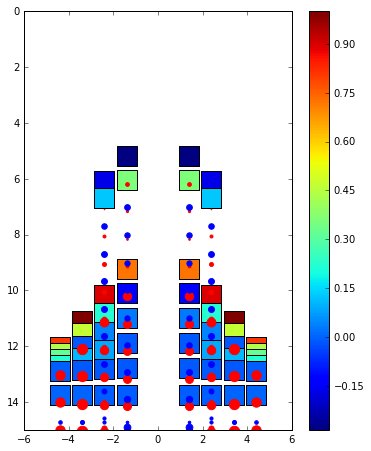

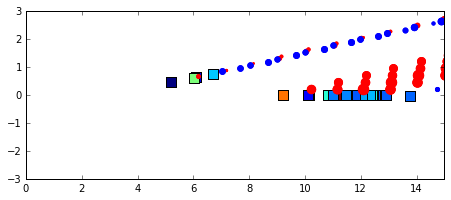

******************** New Time Step ********************
t =  3.061849357011635 time step =  300
AOA =  10.0446273891 RA =  359.914338932
Pitching Rate =  0.152284515721 Pitching Moment =  12032.2757013
q_target =  -0.0892547781654 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -842.983224645 CFP Port Lift =  -841.798924931
DW Starboard Lift =  10925.0406185 DW Port Lift =  10923.6436977
Total Lift =  20163.9021666
CFP Starboard Control Input =  -0.161026195924 CFP Port Control Input =  -0.161026195924
Elevon Starboard Control Input =  0.161026195924 Elevon Port Control Input =  0.161026195924
CFP angle: -12.7560303637 -12.7560303637 Elevon angle: 2.75603036371 2.75603036371


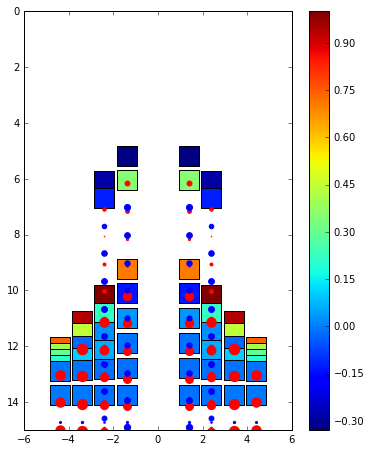

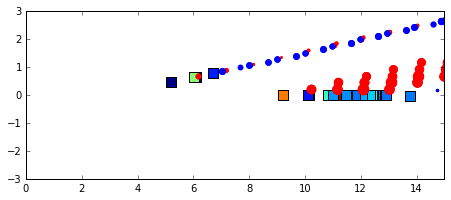

******************** New Time Step ********************
t =  3.072055521535007 time step =  301
AOA =  10.0447383182 RA =  359.914184405
Pitching Rate =  0.0108688329768 Pitching Moment =  858.76620029
q_target =  -0.0894766363605 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1980.53929992 CFP Port Lift =  -1979.38029232
DW Starboard Lift =  12051.339743 DW Port Lift =  12049.0522709
Total Lift =  20140.4724217
CFP Starboard Control Input =  -0.0668969795582 CFP Port Control Input =  -0.0668969795582
Elevon Starboard Control Input =  0.0668969795582 Elevon Port Control Input =  0.0668969795582
CFP angle: -13.0018245323 -13.0018245323 Elevon angle: 3.00182453232 3.00182453232


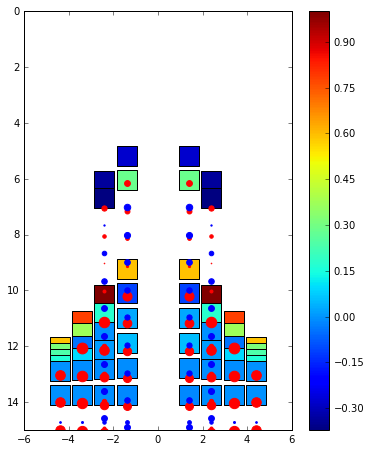

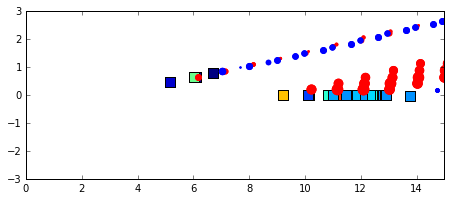

******************** New Time Step ********************
t =  3.0822616860583794 time step =  302
AOA =  10.0422164876 RA =  359.914031265
Pitching Rate =  -0.247088961049 Pitching Moment =  -19522.9468211
q_target =  -0.0844329751837 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -2123.85014885 CFP Port Lift =  -2123.25852774
DW Starboard Lift =  12486.9127792 DW Port Lift =  12484.2642522
Total Lift =  20724.0683549
CFP Starboard Control Input =  0.10843732391 CFP Port Control Input =  0.10843732391
Elevon Starboard Control Input =  -0.10843732391 Elevon Port Control Input =  -0.10843732391
CFP angle: -12.6034020317 -12.6034020317 Elevon angle: 2.60340203173 2.60340203173


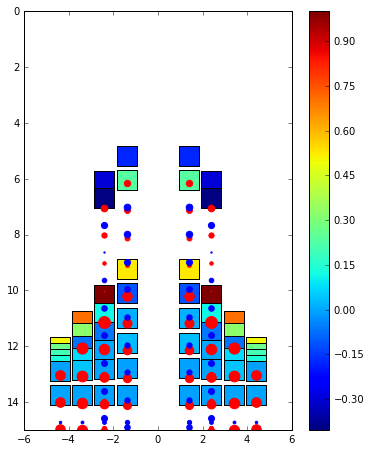

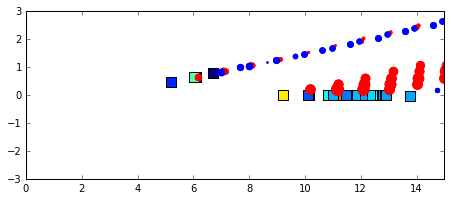

******************** New Time Step ********************
t =  3.0924678505817513 time step =  303
AOA =  10.0370006741 RA =  359.913880815
Pitching Rate =  -0.511045408277 Pitching Moment =  -40378.6243084
q_target =  -0.0740013481522 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  41.0768346035 CFP Port Lift =  40.7809040184
DW Starboard Lift =  10887.790386 DW Port Lift =  10885.7271014
Total Lift =  21855.3752261
CFP Starboard Control Input =  0.29136270675 CFP Port Control Input =  0.29136270675
Elevon Starboard Control Input =  -0.29136270675 Elevon Port Control Input =  -0.29136270675
CFP angle: -11.5328715722 -11.5328715722 Elevon angle: 1.53287157215 1.53287157215


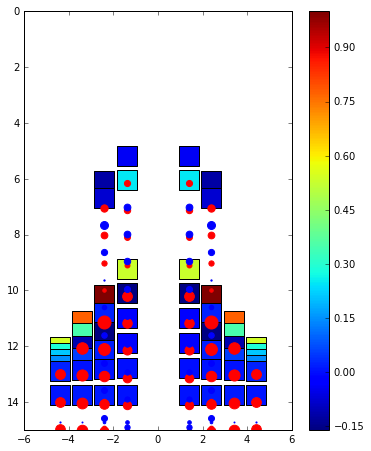

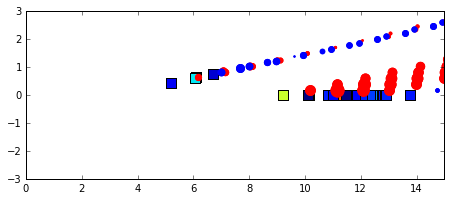

******************** New Time Step ********************
t =  3.1026740151051233 time step =  304
AOA =  10.0316782198 RA =  359.913733591
Pitching Rate =  -0.52149407199 Pitching Moment =  -41204.1921734
q_target =  -0.0633564395588 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1435.45188285 CFP Port Lift =  1435.0663622
DW Starboard Lift =  9516.30320736 DW Port Lift =  9515.48556268
Total Lift =  21902.3070151
CFP Starboard Control Input =  0.305425088288 CFP Port Control Input =  0.305425088288
Elevon Starboard Control Input =  -0.305425088288 Elevon Port Control Input =  -0.305425088288
CFP angle: -10.4106728399 -10.4106728399 Elevon angle: 0.410672839924 0.410672839924


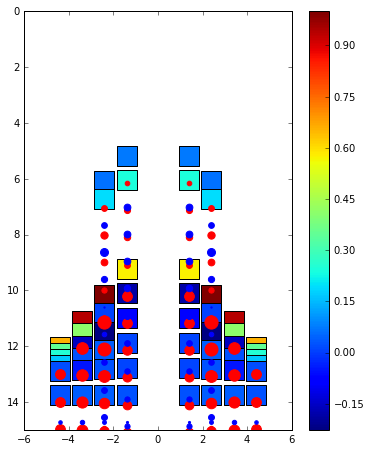

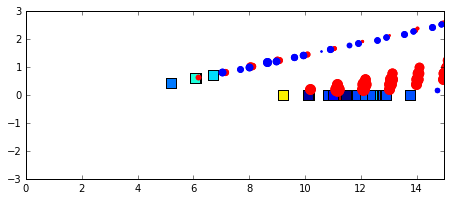

******************** New Time Step ********************
t =  3.1128801796284957 time step =  305
AOA =  10.0277691071 RA =  359.913588318
Pitching Rate =  -0.383014858657 Pitching Moment =  -30262.6984447
q_target =  -0.0555382142341 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1837.97361208 CFP Port Lift =  1837.99891046
DW Starboard Lift =  8826.17117338 DW Port Lift =  8827.23508584
Total Lift =  21329.3787818
CFP Starboard Control Input =  0.218317762949 CFP Port Control Input =  0.218317762949
Elevon Starboard Control Input =  -0.218317762949 Elevon Port Control Input =  -0.218317762949
CFP angle: -9.60852551739 -9.60852551739 Elevon angle: -0.391474482606 -0.391474482606


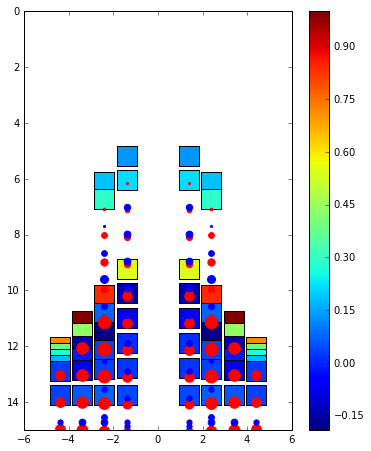

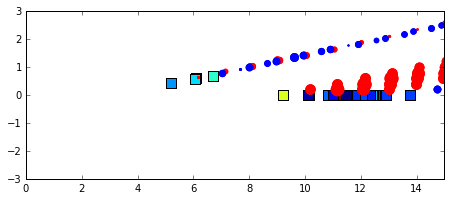

******************** New Time Step ********************
t =  3.1230863441518677 time step =  306
AOA =  10.0255485216 RA =  359.913442126
Pitching Rate =  -0.217572965773 Pitching Moment =  -17190.8345175
q_target =  -0.051097043265 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1872.74524207 CFP Port Lift =  1873.10797644
DW Starboard Lift =  8364.35828957 DW Port Lift =  8366.64389462
Total Lift =  20476.8554027
CFP Starboard Control Input =  0.110983948339 CFP Port Control Input =  0.110983948339
Elevon Starboard Control Input =  -0.110983948339 Elevon Port Control Input =  -0.110983948339
CFP angle: -9.20074616036 -9.20074616036 Elevon angle: -0.799253839638 -0.799253839638


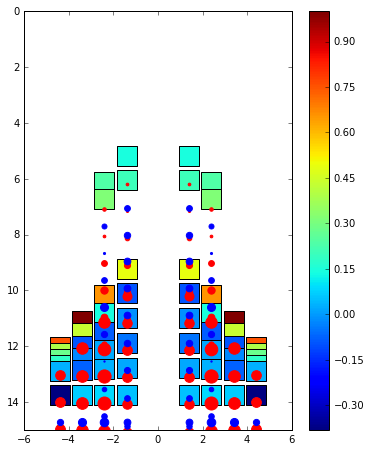

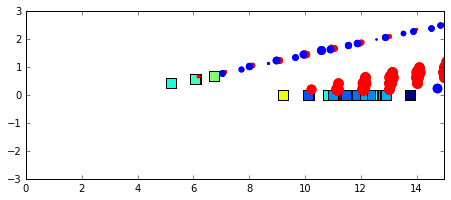

******************** New Time Step ********************
t =  3.1332925086752397 time step =  307
AOA =  10.0255211342 RA =  359.913292459
Pitching Rate =  -0.00268342220469 Pitching Moment =  -212.022053831
q_target =  -0.051042268368 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1688.96692235 CFP Port Lift =  1689.49583881
DW Starboard Lift =  8461.65832005 DW Port Lift =  8463.97807868
Total Lift =  20304.0991599
CFP Starboard Control Input =  -0.0322392307756 CFP Port Control Input =  -0.0322392307756
Elevon Starboard Control Input =  0.0322392307756 Elevon Port Control Input =  0.0322392307756
CFP angle: -9.31920016199 -9.31920016199 Elevon angle: -0.680799838013 -0.680799838013


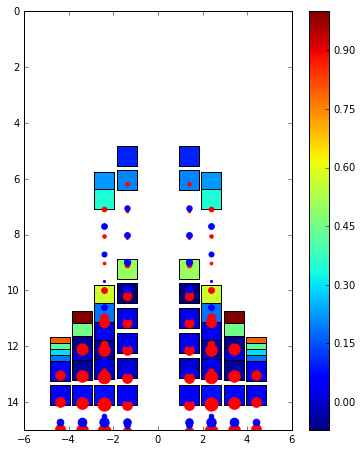

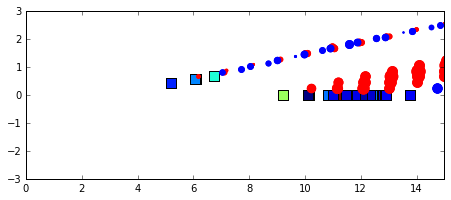

******************** New Time Step ********************
t =  3.143498673198612 time step =  308
AOA =  10.0266869936 RA =  359.913139285
Pitching Rate =  0.114230902717 Pitching Moment =  9025.5907411
q_target =  -0.0533739871416 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1484.63008766 CFP Port Lift =  1485.29269626
DW Starboard Lift =  8879.03321895 DW Port Lift =  8881.02485448
Total Lift =  20729.9808573
CFP Starboard Control Input =  -0.111736593239 CFP Port Control Input =  -0.111736593239
Elevon Starboard Control Input =  0.111736593239 Elevon Port Control Input =  0.111736593239
CFP angle: -9.72974490138 -9.72974490138 Elevon angle: -0.270255098616 -0.270255098616


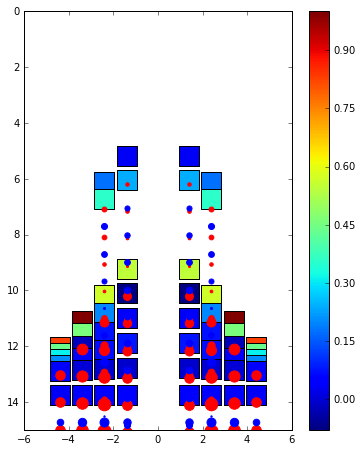

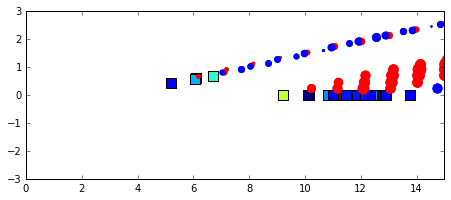

******************** New Time Step ********************
t =  3.153704837721984 time step =  309
AOA =  10.0286908454 RA =  359.912982629
Pitching Rate =  0.196337398342 Pitching Moment =  15512.9738316
q_target =  -0.0573816907207 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1192.67593381 CFP Port Lift =  1193.44284149
DW Starboard Lift =  9100.49138236 DW Port Lift =  9102.02865765
Total Lift =  20588.6388153
CFP Starboard Control Input =  -0.169146059375 CFP Port Control Input =  -0.169146059375
Elevon Starboard Control Input =  0.169146059375 Elevon Port Control Input =  0.169146059375
CFP angle: -10.3512246052 -10.3512246052 Elevon angle: 0.351224605151 0.351224605151


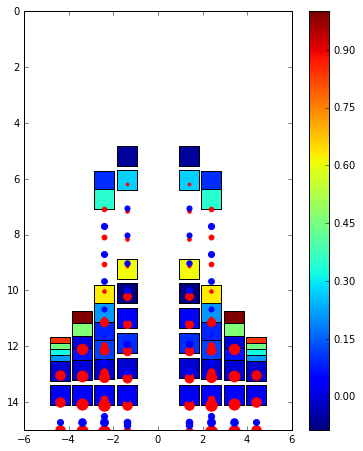

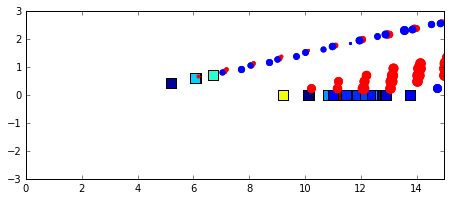

******************** New Time Step ********************
t =  3.163911002245356 time step =  310
AOA =  10.0312861916 RA =  359.912822829
Pitching Rate =  0.254292028813 Pitching Moment =  20092.0742653
q_target =  -0.0625723832868 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  813.057181319 CFP Port Lift =  813.913696558
DW Starboard Lift =  9789.99532154 DW Port Lift =  9790.85563254
Total Lift =  21207.821832
CFP Starboard Control Input =  -0.2112429414 CFP Port Control Input =  -0.2112429414
Elevon Starboard Control Input =  0.2112429414 Elevon Port Control Input =  0.2112429414
CFP angle: -11.1273774823 -11.1273774823 Elevon angle: 1.12737748231 1.12737748231


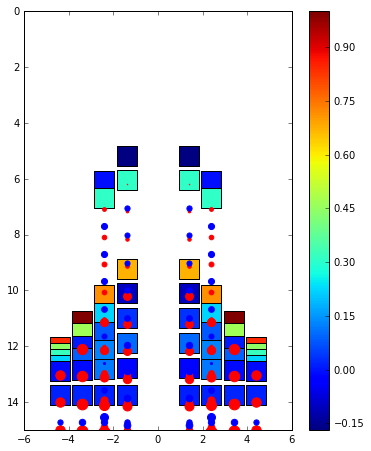

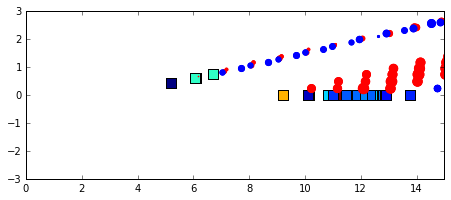

******************** New Time Step ********************
t =  3.1741171667687285 time step =  311
AOA =  10.0339766029 RA =  359.912660555
Pitching Rate =  0.263606496188 Pitching Moment =  20828.0272212
q_target =  -0.0679532058259 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  284.869454853 CFP Port Lift =  285.86455365
DW Starboard Lift =  10432.939059 DW Port Lift =  10433.1404955
Total Lift =  21436.813563
CFP Starboard Control Input =  -0.221039801343 CFP Port Control Input =  -0.221039801343
Elevon Starboard Control Input =  0.221039801343 Elevon Port Control Input =  0.221039801343
CFP angle: -11.9395261706 -11.9395261706 Elevon angle: 1.93952617065 1.93952617065


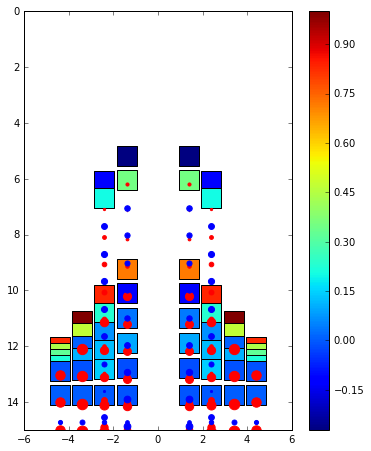

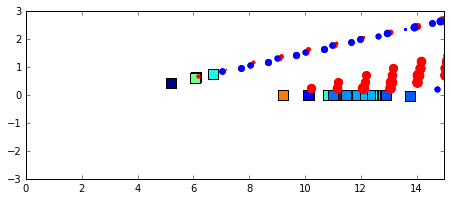

******************** New Time Step ********************
t =  3.1843233312921004 time step =  312
AOA =  10.0361944943 RA =  359.912496478
Pitching Rate =  0.217308996152 Pitching Moment =  17169.9777991
q_target =  -0.0723889885601 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -479.130141037 CFP Port Lift =  -477.978055826
DW Starboard Lift =  10698.0656838 DW Port Lift =  10697.6582114
Total Lift =  20438.6156983
CFP Starboard Control Input =  -0.193131989808 CFP Port Control Input =  -0.193131989808
Elevon Starboard Control Input =  0.193131989808 Elevon Port Control Input =  0.193131989808
CFP angle: -12.6491354412 -12.6491354412 Elevon angle: 2.64913544122 2.64913544122


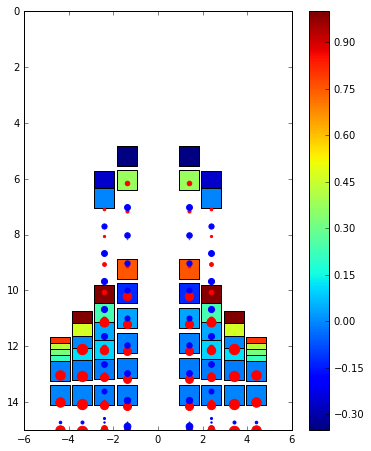

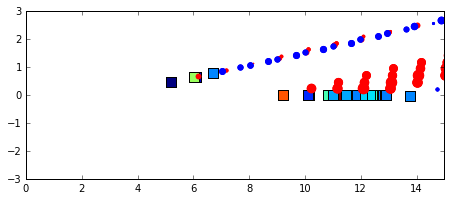

******************** New Time Step ********************
t =  3.1945294958154724 time step =  313
AOA =  10.0373413583 RA =  359.912331272
Pitching Rate =  0.11236973473 Pitching Moment =  8878.53648386
q_target =  -0.0746827165603 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1468.55248848 CFP Port Lift =  -1467.29944955
DW Starboard Lift =  11810.9725833 DW Port Lift =  11809.7614562
Total Lift =  20684.8821015
CFP Starboard Control Input =  -0.124701634193 CFP Port Control Input =  -0.124701634193
Elevon Starboard Control Input =  0.124701634193 Elevon Port Control Input =  0.124701634193
CFP angle: -13.1073165834 -13.1073165834 Elevon angle: 3.10731658339 3.10731658339


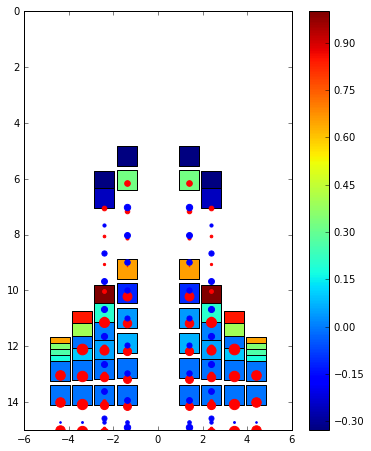

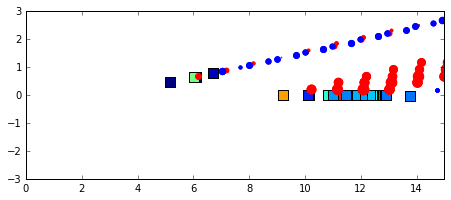

******************** New Time Step ********************
t =  3.204735660338845 time step =  314
AOA =  10.0363702932 RA =  359.912165868
Pitching Rate =  -0.0951449540745 Pitching Moment =  -7517.57533321
q_target =  -0.0727405864506 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -2026.18738656 CFP Port Lift =  -2025.13855511
DW Starboard Lift =  12510.2107126 DW Port Lift =  12508.5701665
Total Lift =  20967.4549374
CFP Starboard Control Input =  0.0149362450826 CFP Port Control Input =  0.0149362450826
Elevon Starboard Control Input =  -0.0149362450826 Elevon Port Control Input =  -0.0149362450826
CFP angle: -13.0524375445 -13.0524375445 Elevon angle: 3.05243754451 3.05243754451


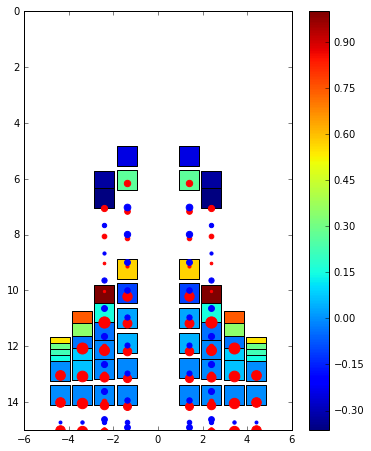

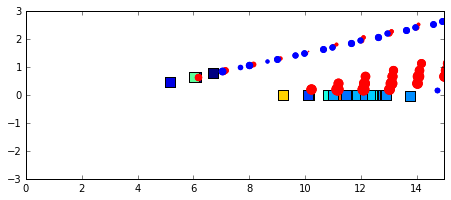

******************** New Time Step ********************
t =  3.214941824862217 time step =  315
AOA =  10.0327365626 RA =  359.912001181
Pitching Rate =  -0.356032925552 Pitching Moment =  -28130.8069879
q_target =  -0.0654731252228 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1007.74805213 CFP Port Lift =  -1007.37574134
DW Starboard Lift =  11950.7635064 DW Port Lift =  11948.9490908
Total Lift =  21884.5888038
CFP Starboard Control Input =  0.193706533552 CFP Port Control Input =  0.193706533552
Elevon Starboard Control Input =  -0.193706533552 Elevon Port Control Input =  -0.193706533552
CFP angle: -12.3407172743 -12.3407172743 Elevon angle: 2.34071727426 2.34071727426


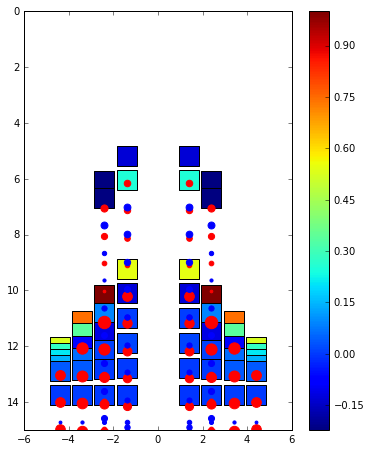

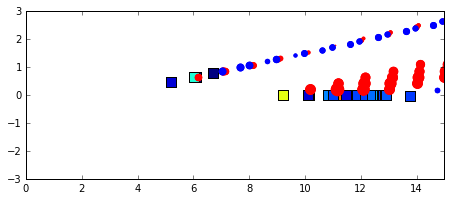

******************** New Time Step ********************
t =  3.2251479893855888 time step =  316
AOA =  10.0277052582 RA =  359.911838362
Pitching Rate =  -0.492967210821 Pitching Moment =  -38950.233149
q_target =  -0.0554105163063 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  573.840362847 CFP Port Lift =  573.634759092
DW Starboard Lift =  10370.3677932 DW Port Lift =  10368.6050072
Total Lift =  21886.4479223
CFP Starboard Control Input =  0.29170446301 CFP Port Control Input =  0.29170446301
Elevon Starboard Control Input =  -0.29170446301 Elevon Port Control Input =  -0.29170446301
CFP angle: -11.2689311273 -11.2689311273 Elevon angle: 1.26893112725 1.26893112725


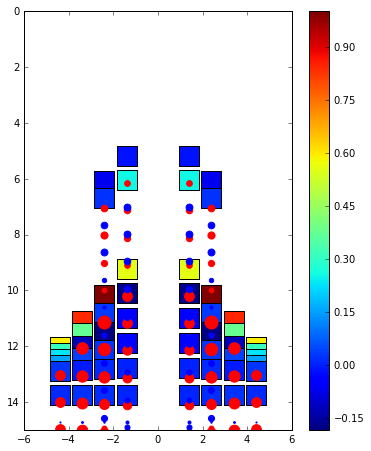

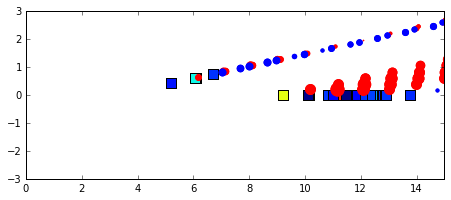

******************** New Time Step ********************
t =  3.235354153908961 time step =  317
AOA =  10.0231467084 RA =  359.911678187
Pitching Rate =  -0.446646707649 Pitching Moment =  -35290.3662075
q_target =  -0.0462934167421 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1409.16969386 CFP Port Lift =  1408.76767071
DW Starboard Lift =  9338.7728803 DW Port Lift =  9337.38923429
Total Lift =  21494.0994792
CFP Starboard Control Input =  0.266902193938 CFP Port Control Input =  0.266902193938
Elevon Starboard Control Input =  -0.266902193938 Elevon Port Control Input =  -0.266902193938
CFP angle: -10.2882739542 -10.2882739542 Elevon angle: 0.288273954181 0.288273954181


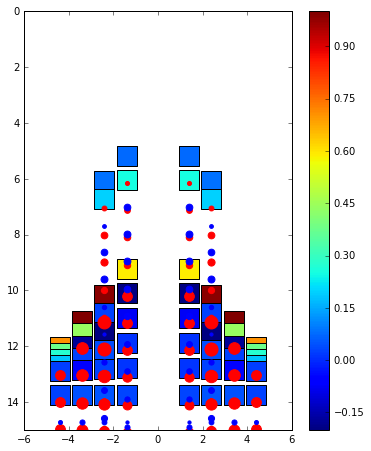

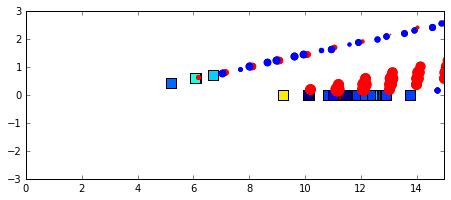

******************** New Time Step ********************
t =  3.245560318432333 time step =  318
AOA =  10.0198645962 RA =  359.911520598
Pitching Rate =  -0.321581354745 Pitching Moment =  -25408.7259127
q_target =  -0.0397291923137 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1807.60069988 CFP Port Lift =  1807.39648775
DW Starboard Lift =  8632.98750348 DW Port Lift =  8633.09220983
Total Lift =  20881.0769009
CFP Starboard Control Input =  0.187901441621 CFP Port Control Input =  0.187901441621
Elevon Starboard Control Input =  -0.187901441621 Elevon Port Control Input =  -0.187901441621
CFP angle: -9.59788286433 -9.59788286433 Elevon angle: -0.402117135668 -0.402117135668


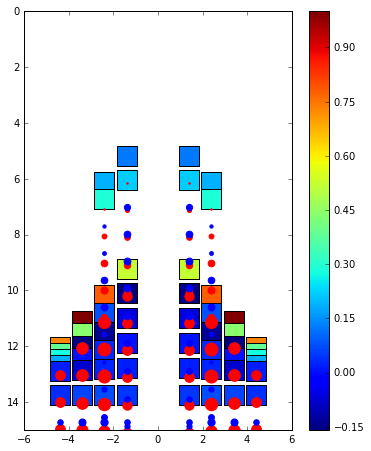

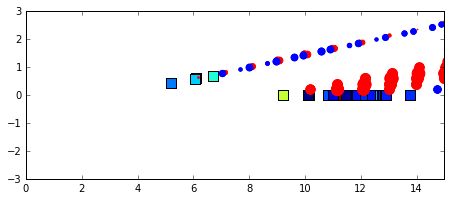

******************** New Time Step ********************
t =  3.255766482955705 time step =  319
AOA =  10.01813508 RA =  359.911363575
Pitching Rate =  -0.169457995643 Pitching Moment =  -13389.183488
q_target =  -0.0362701599471 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1830.17690446 CFP Port Lift =  1830.58312593
DW Starboard Lift =  8372.72753687 DW Port Lift =  8375.5902461
Total Lift =  20409.0778134
CFP Starboard Control Input =  0.0887918904639 CFP Port Control Input =  0.0887918904639
Elevon Starboard Control Input =  -0.0887918904639 Elevon Port Control Input =  -0.0887918904639
CFP angle: -9.27164199306 -9.27164199306 Elevon angle: -0.728358006938 -0.728358006938


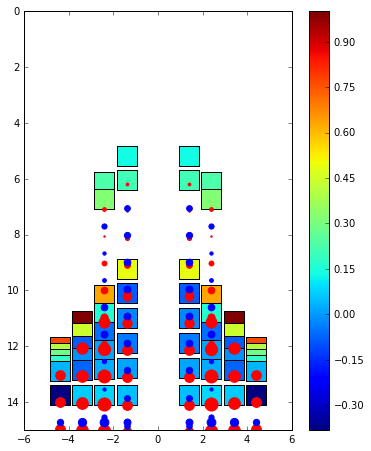

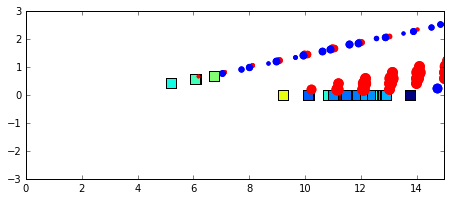

******************** New Time Step ********************
t =  3.265972647479077 time step =  320
AOA =  10.0184879927 RA =  359.911202366
Pitching Rate =  0.0345783934645 Pitching Moment =  2732.10156334
q_target =  -0.0369759854924 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1604.21348016 CFP Port Lift =  1604.81899847
DW Starboard Lift =  8669.38193297 DW Port Lift =  8672.35410242
Total Lift =  20550.768514
CFP Starboard Control Input =  -0.0477029193046 CFP Port Control Input =  -0.0477029193046
Elevon Starboard Control Input =  0.0477029193046 Elevon Port Control Input =  0.0477029193046
CFP angle: -9.44691297642 -9.44691297642 Elevon angle: -0.553087023577 -0.553087023577


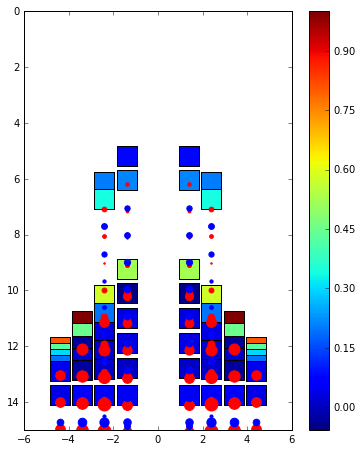

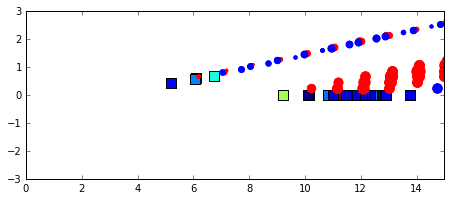

******************** New Time Step ********************
t =  3.2761788120024495 time step =  321
AOA =  10.0199069761 RA =  359.911036806
Pitching Rate =  0.13903198432 Pitching Moment =  10985.1691666
q_target =  -0.0398139521043 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1386.89390452 CFP Port Lift =  1387.59114201
DW Starboard Lift =  9065.24225105 DW Port Lift =  9067.29395226
Total Lift =  20907.0212498
CFP Starboard Control Input =  -0.119230624283 CFP Port Control Input =  -0.119230624283
Elevon Starboard Control Input =  0.119230624283 Elevon Port Control Input =  0.119230624283
CFP angle: -9.88499242878 -9.88499242878 Elevon angle: -0.11500757122 -0.11500757122


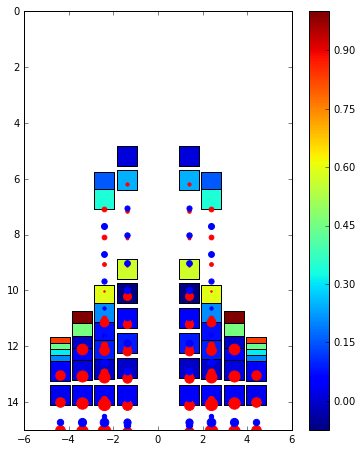

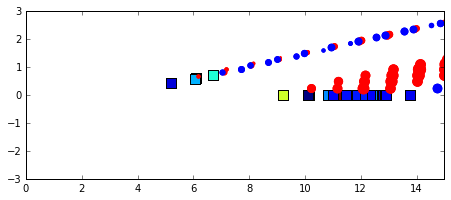

******************** New Time Step ********************
t =  3.2863849765258215 time step =  322
AOA =  10.0220550679 RA =  359.91086762
Pitching Rate =  0.210470040827 Pitching Moment =  16629.6195388
q_target =  -0.0441101358322 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1091.22731128 CFP Port Lift =  1092.01665651
DW Starboard Lift =  9231.12122235 DW Port Lift =  9232.57765424
Total Lift =  20646.9428444
CFP Starboard Control Input =  -0.169720117772 CFP Port Control Input =  -0.169720117772
Elevon Starboard Control Input =  0.169720117772 Elevon Port Control Input =  0.169720117772
CFP angle: -10.5085813489 -10.5085813489 Elevon angle: 0.508581348948 0.508581348948


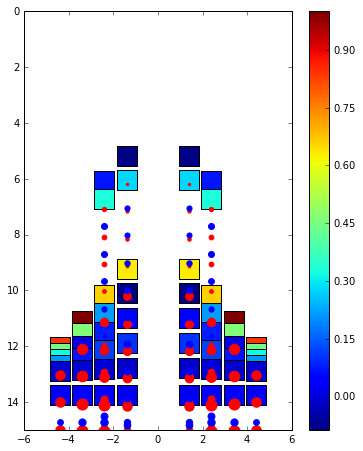

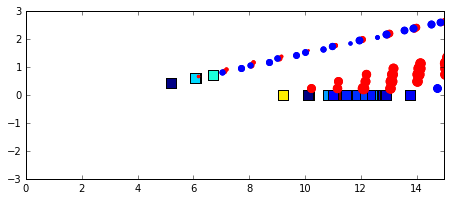

******************** New Time Step ********************
t =  3.2965911410491935 time step =  323
AOA =  10.0247098176 RA =  359.910695321
Pitching Rate =  0.260112376032 Pitching Moment =  20551.9504523
q_target =  -0.0494196352409 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  724.003719969 CFP Port Lift =  724.831509403
DW Starboard Lift =  9878.8580923 DW Port Lift =  9879.27848996
Total Lift =  21206.9718116
CFP Starboard Control Input =  -0.206354674182 CFP Port Control Input =  -0.206354674182
Elevon Starboard Control Input =  0.206354674182 Elevon Port Control Input =  0.206354674182
CFP angle: -11.2667736607 -11.2667736607 Elevon angle: 1.2667736607 1.2667736607


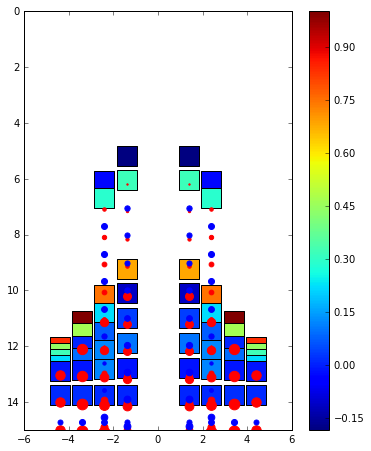

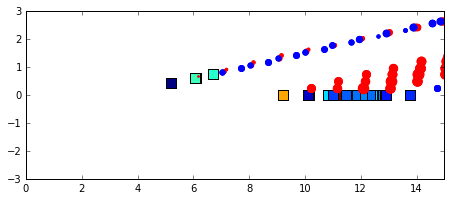

******************** New Time Step ********************
t =  3.306797305572566 time step =  324
AOA =  10.0273824769 RA =  359.910521084
Pitching Rate =  0.261867151531 Pitching Moment =  20690.5984461
q_target =  -0.0547649537045 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  182.003761759 CFP Port Lift =  182.964076452
DW Starboard Lift =  10503.6160439 DW Port Lift =  10503.4994684
Total Lift =  21372.0833505
CFP Starboard Control Input =  -0.211088070157 CFP Port Control Input =  -0.211088070157
Elevon Starboard Control Input =  0.211088070157 Elevon Port Control Input =  0.211088070157
CFP angle: -12.042357507 -12.042357507 Elevon angle: 2.04235750696 2.04235750696


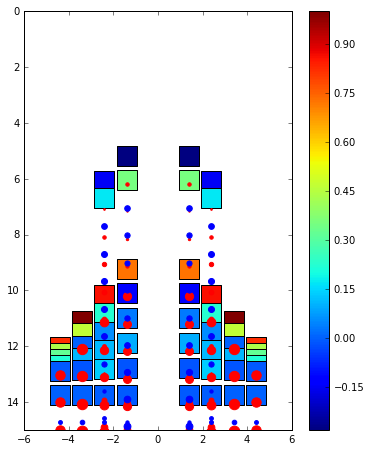

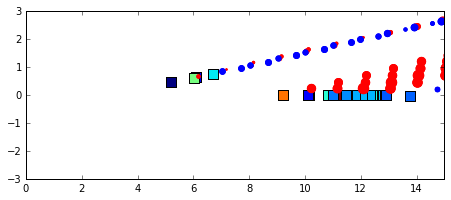

******************** New Time Step ********************
t =  3.317003470095938 time step =  325
AOA =  10.0294920552 RA =  359.910345491
Pitching Rate =  0.206696483334 Pitching Moment =  16331.4639194
q_target =  -0.0589841103351 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -611.912862627 CFP Port Lift =  -610.84531856
DW Starboard Lift =  10783.909656 DW Port Lift =  10783.1452357
Total Lift =  20344.2967105
CFP Starboard Control Input =  -0.17712039578 CFP Port Control Input =  -0.17712039578
Elevon Starboard Control Input =  0.17712039578 Elevon Port Control Input =  0.17712039578
CFP angle: -12.6931366709 -12.6931366709 Elevon angle: 2.69313667088 2.69313667088


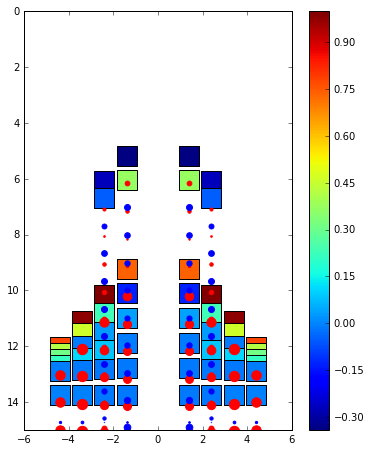

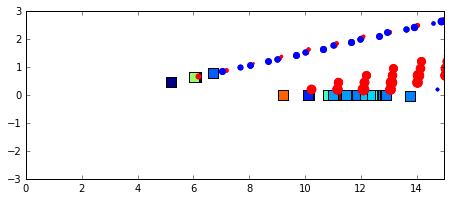

******************** New Time Step ********************
t =  3.32720963461931 time step =  326
AOA =  10.0303988745 RA =  359.910169361
Pitching Rate =  0.0888501550369 Pitching Moment =  7020.21184786
q_target =  -0.0607977489356 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1631.70919561 CFP Port Lift =  -1630.62205808
DW Starboard Lift =  11874.7594454 DW Port Lift =  11873.1687246
Total Lift =  20485.5969163
CFP Starboard Control Input =  -0.099765269315 CFP Port Control Input =  -0.099765269315
Elevon Starboard Control Input =  0.099765269315 Elevon Port Control Input =  0.099765269315
CFP angle: -13.0596961417 -13.0596961417 Elevon angle: 3.05969614172 3.05969614172


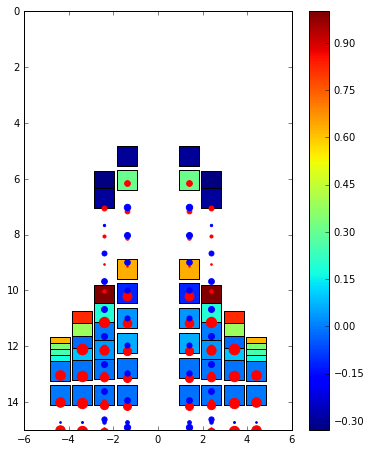

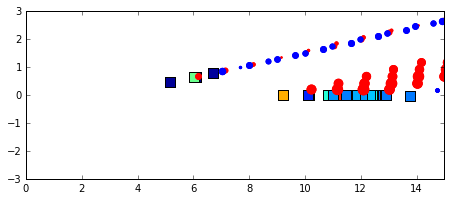

******************** New Time Step ********************
t =  3.3374157991426823 time step =  327
AOA =  10.0290300596 RA =  359.909993767
Pitching Rate =  -0.134116485137 Pitching Moment =  -10596.7866636
q_target =  -0.0580601191103 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -2072.97461824 CFP Port Lift =  -2072.22865996
DW Starboard Lift =  12517.5999503 DW Port Lift =  12515.5302675
Total Lift =  20887.9269396
CFP Starboard Control Input =  0.050704244018 CFP Port Control Input =  0.050704244018
Elevon Starboard Control Input =  -0.050704244018 Elevon Port Control Input =  -0.050704244018
CFP angle: -12.8733976334 -12.8733976334 Elevon angle: 2.87339763339 2.87339763339


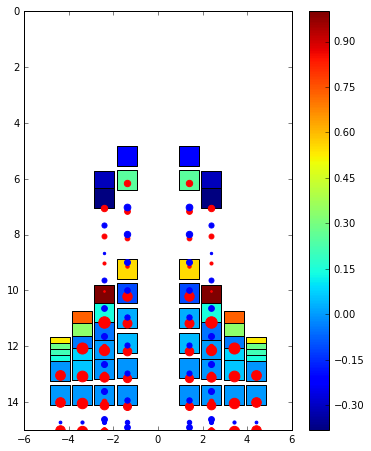

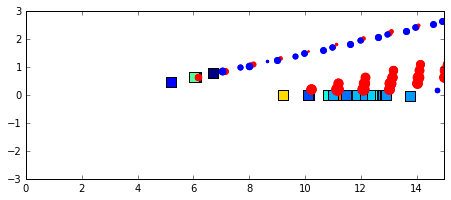

******************** New Time Step ********************
t =  3.3476219636660542 time step =  328
AOA =  10.0249673608 RA =  359.909819861
Pitching Rate =  -0.398063221217 Pitching Moment =  -31451.6968555
q_target =  -0.0499347216574 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -674.464135547 CFP Port Lift =  -674.470725329
DW Starboard Lift =  11576.5668557 DW Port Lift =  11574.5836826
Total Lift =  21802.2156774
CFP Starboard Control Input =  0.232085666373 CFP Port Control Input =  0.232085666373
Elevon Starboard Control Input =  -0.232085666373 Elevon Port Control Input =  -0.232085666373
CFP angle: -12.0206640154 -12.0206640154 Elevon angle: 2.02066401536 2.02066401536


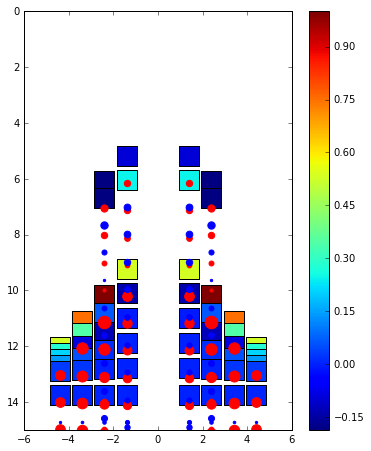

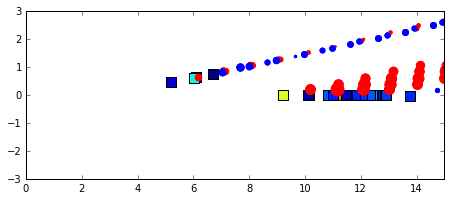

******************** New Time Step ********************
t =  3.357828128189426 time step =  329
AOA =  10.0199223935 RA =  359.909648603
Pitching Rate =  -0.494305902465 Pitching Moment =  -39056.005603
q_target =  -0.0398447869266 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  908.948679225 CFP Port Lift =  908.499586441
DW Starboard Lift =  10065.0773709 DW Port Lift =  10063.398576
Total Lift =  21945.9242126
CFP Starboard Control Input =  0.302974077025 CFP Port Control Input =  0.302974077025
Elevon Starboard Control Input =  -0.302974077025 Elevon Port Control Input =  -0.302974077025
CFP angle: -10.9074708358 -10.9074708358 Elevon angle: 0.907470835845 0.907470835845


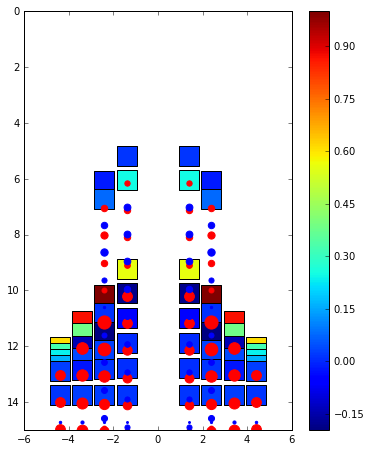

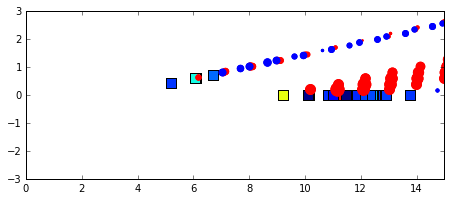

******************** New Time Step ********************
t =  3.3680342927127986 time step =  330
AOA =  10.0157009994 RA =  359.909480337
Pitching Rate =  -0.413612189855 Pitching Moment =  -32680.2490602
q_target =  -0.0314019988095 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1636.84779412 CFP Port Lift =  1636.43066643
DW Starboard Lift =  9035.48036461 DW Port Lift =  9034.76114586
Total Lift =  21343.519971
CFP Starboard Control Input =  0.254806794031 CFP Port Control Input =  0.254806794031
Elevon Starboard Control Input =  -0.254806794031 Elevon Port Control Input =  -0.254806794031
CFP angle: -9.97125481369 -9.97125481369 Elevon angle: -0.028745186313 -0.028745186313


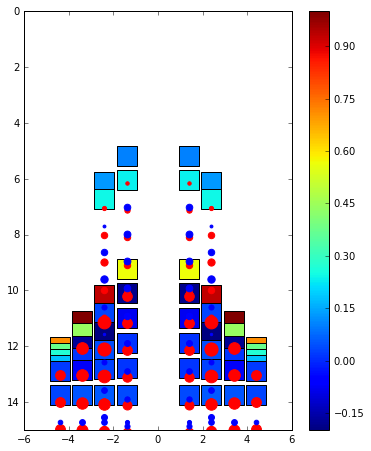

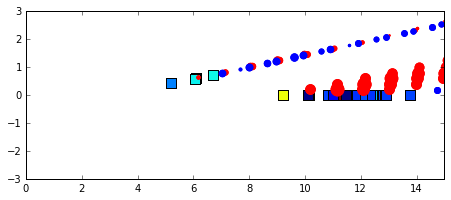

******************** New Time Step ********************
t =  3.3782404572361706 time step =  331
AOA =  10.0129858866 RA =  359.909313949
Pitching Rate =  -0.266026755791 Pitching Moment =  -21019.2563206
q_target =  -0.0259717731351 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1876.51357795 CFP Port Lift =  1876.53009041
DW Starboard Lift =  8532.60002031 DW Port Lift =  8533.88306449
Total Lift =  20819.5267532
CFP Starboard Control Input =  0.160036655104 CFP Port Control Input =  0.160036655104
Elevon Starboard Control Input =  -0.160036655104 Elevon Port Control Input =  -0.160036655104
CFP angle: -9.38324505825 -9.38324505825 Elevon angle: -0.616754941746 -0.616754941746


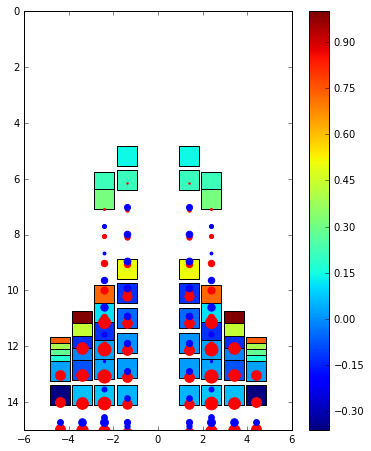

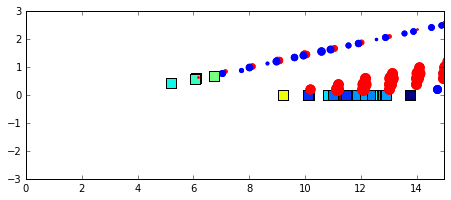

******************** New Time Step ********************
t =  3.3884466217595426 time step =  332
AOA =  10.012490362 RA =  359.909145923
Pitching Rate =  -0.0485514972748 Pitching Moment =  -3836.14183069
q_target =  -0.024980723997 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1728.78506452 CFP Port Lift =  1729.18155402
DW Starboard Lift =  8495.29260638 DW Port Lift =  8497.97569606
Total Lift =  20451.234921
CFP Starboard Control Input =  0.0157138488519 CFP Port Control Input =  0.0157138488519
Elevon Starboard Control Input =  -0.0157138488519 Elevon Port Control Input =  -0.0157138488519
CFP angle: -9.32550893265 -9.32550893265 Elevon angle: -0.67449106735 -0.67449106735


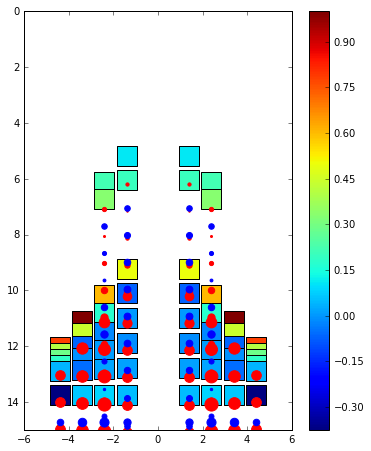

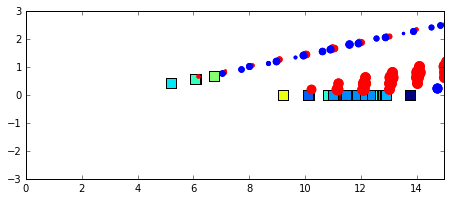

******************** New Time Step ********************
t =  3.398652786282915 time step =  333
AOA =  10.0138795824 RA =  359.908973842
Pitching Rate =  0.136115819738 Pitching Moment =  10754.7577155
q_target =  -0.027759164898 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1470.03297956 CFP Port Lift =  1470.59927493
DW Starboard Lift =  8923.58791961 DW Port Lift =  8926.04320195
Total Lift =  20790.263376
CFP Starboard Control Input =  -0.109249989757 CFP Port Control Input =  -0.109249989757
Elevon Starboard Control Input =  0.109249989757 Elevon Port Control Input =  0.109249989757
CFP angle: -9.72691734572 -9.72691734572 Elevon angle: -0.27308265428 -0.27308265428


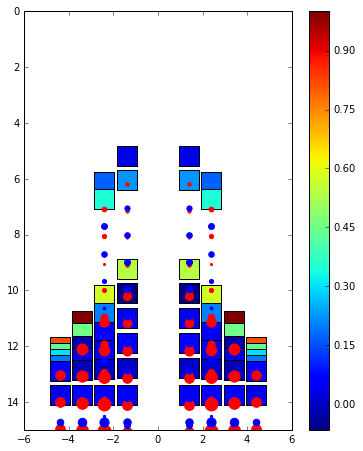

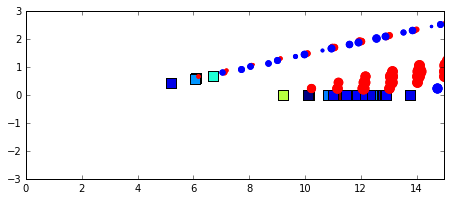

******************** New Time Step ********************
t =  3.408858950806287 time step =  334
AOA =  10.016119407 RA =  359.908797998
Pitching Rate =  0.219458007733 Pitching Moment =  17339.7751006
q_target =  -0.0322388139637 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1173.68834355 CFP Port Lift =  1174.39271139
DW Starboard Lift =  9291.43466289 DW Port Lift =  9293.29638592
Total Lift =  20932.8121038
CFP Starboard Control Input =  -0.167797881131 CFP Port Control Input =  -0.167797881131
Elevon Starboard Control Input =  0.167797881131 Elevon Port Control Input =  0.167797881131
CFP angle: -10.3434435471 -10.3434435471 Elevon angle: 0.343443547059 0.343443547059


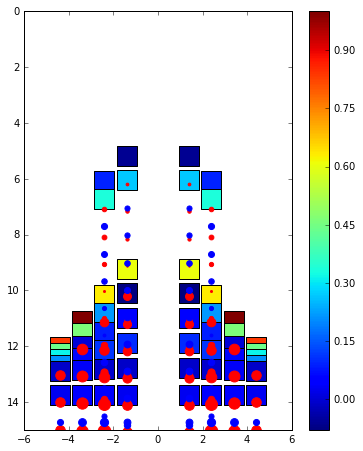

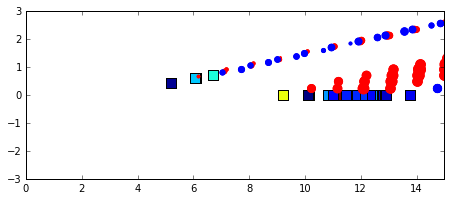

******************** New Time Step ********************
t =  3.419065115329659 time step =  335
AOA =  10.0188791652 RA =  359.908618761
Pitching Rate =  0.270401111606 Pitching Moment =  21364.882105
q_target =  -0.0377583304285 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  784.354891583 CFP Port Lift =  785.168829853
DW Starboard Lift =  9896.68163723 DW Port Lift =  9897.93681572
Total Lift =  21364.1421744
CFP Starboard Control Input =  -0.205439628023 CFP Port Control Input =  -0.205439628023
Elevon Starboard Control Input =  0.205439628023 Elevon Port Control Input =  0.205439628023
CFP angle: -11.0982737786 -11.0982737786 Elevon angle: 1.09827377862 1.09827377862


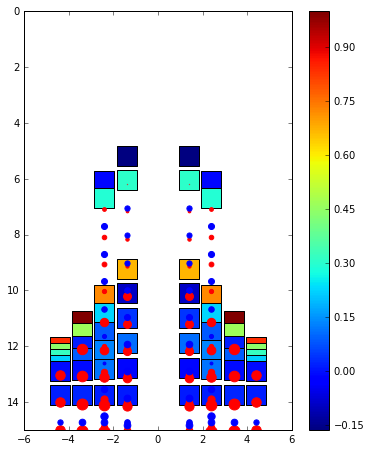

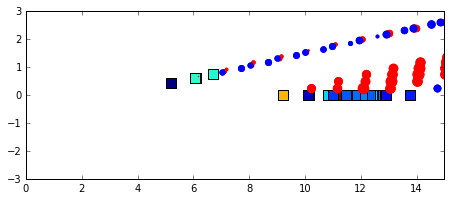

******************** New Time Step ********************
t =  3.4292712798530314 time step =  336
AOA =  10.0216970129 RA =  359.908436645
Pitching Rate =  0.276092720098 Pitching Moment =  21814.5864116
q_target =  -0.0433940258785 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  298.466289754 CFP Port Lift =  299.349600608
DW Starboard Lift =  10458.490738 DW Port Lift =  10458.6645404
Total Lift =  21514.9711687
CFP Starboard Control Input =  -0.212991163984 CFP Port Control Input =  -0.212991163984
Elevon Starboard Control Input =  0.212991163984 Elevon Port Control Input =  0.212991163984
CFP angle: -11.8808500088 -11.8808500088 Elevon angle: 1.88085000881 1.88085000881


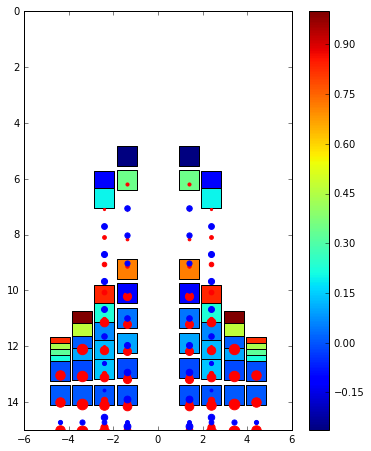

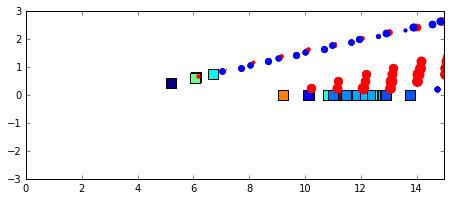

******************** New Time Step ********************
t =  3.4394774443764033 time step =  337
AOA =  10.0240576951 RA =  359.90825286
Pitching Rate =  0.231299638881 Pitching Moment =  18275.4038482
q_target =  -0.0481153902157 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -397.10959681 CFP Port Lift =  -396.097284064
DW Starboard Lift =  10847.9139127 DW Port Lift =  10847.5877672
Total Lift =  20902.294799
CFP Starboard Control Input =  -0.186276686064 CFP Port Control Input =  -0.186276686064
Elevon Starboard Control Input =  0.186276686064 Elevon Port Control Input =  0.186276686064
CFP angle: -12.5652713906 -12.5652713906 Elevon angle: 2.56527139056 2.56527139056


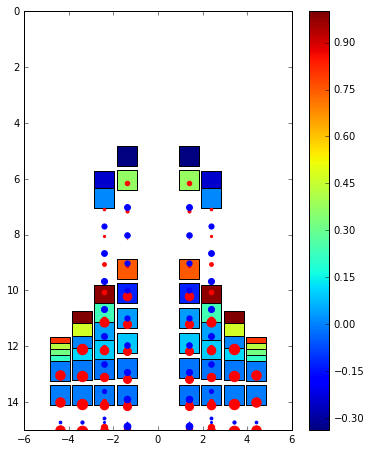

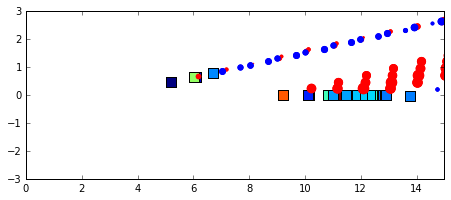

******************** New Time Step ********************
t =  3.4496836088997753 time step =  338
AOA =  10.0253963995 RA =  359.908067962
Pitching Rate =  0.131166254621 Pitching Moment =  10363.6836013
q_target =  -0.0507927989649 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1271.32431818 CFP Port Lift =  -1270.26910038
DW Starboard Lift =  11643.6833719 DW Port Lift =  11642.6689003
Total Lift =  20744.7588537
CFP Starboard Control Input =  -0.121306035724 CFP Port Control Input =  -0.121306035724
Elevon Starboard Control Input =  0.121306035724 Elevon Port Control Input =  0.121306035724
CFP angle: -13.0109763595 -13.0109763595 Elevon angle: 3.01097635954 3.01097635954


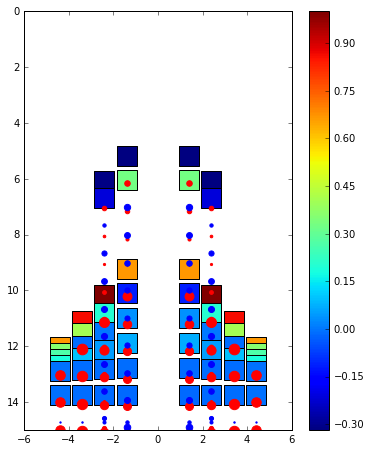

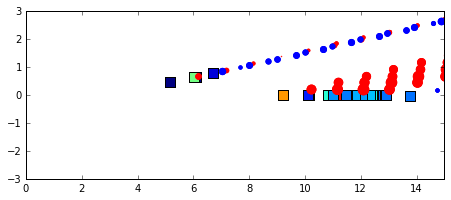

******************** New Time Step ********************
t =  3.4598897734231477 time step =  339
AOA =  10.0248389241 RA =  359.907882852
Pitching Rate =  -0.0546214373405 Pitching Moment =  -4315.73880097
q_target =  -0.0496778482129 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1857.25458985 CFP Port Lift =  -1856.39543344
DW Starboard Lift =  12344.2414413 DW Port Lift =  12342.6517069
Total Lift =  20973.2431249
CFP Starboard Control Input =  0.00329572608506 CFP Port Control Input =  0.00329572608506
Elevon Starboard Control Input =  -0.00329572608506 Elevon Port Control Input =  -0.00329572608506
CFP angle: -12.9988671394 -12.9988671394 Elevon angle: 2.99886713938 2.99886713938


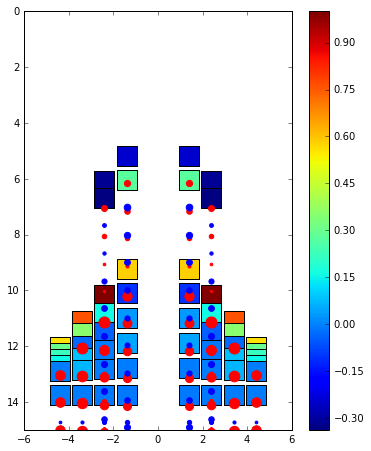

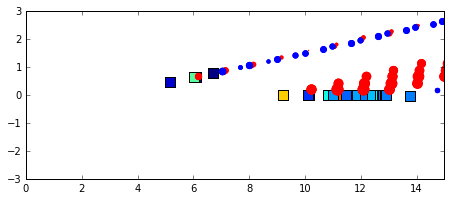

******************** New Time Step ********************
t =  3.4700959379465197 time step =  340
AOA =  10.0217881172 RA =  359.907698616
Pitching Rate =  -0.298918056464 Pitching Moment =  -23618.0576236
q_target =  -0.0435762344863 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1123.75438636 CFP Port Lift =  -1123.47952314
DW Starboard Lift =  11986.6933532 DW Port Lift =  11984.8683761
Total Lift =  21724.3278198
CFP Starboard Control Input =  0.170227881319 CFP Port Control Input =  0.170227881319
Elevon Starboard Control Input =  -0.170227881319 Elevon Port Control Input =  -0.170227881319
CFP angle: -12.3734125846 -12.3734125846 Elevon angle: 2.37341258463 2.37341258463


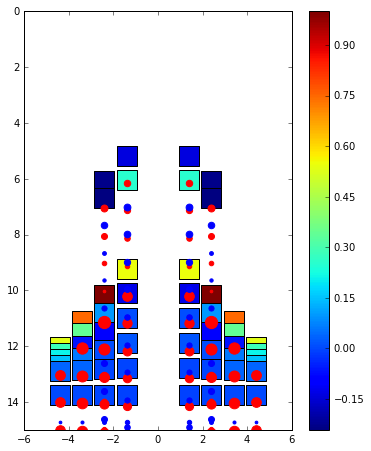

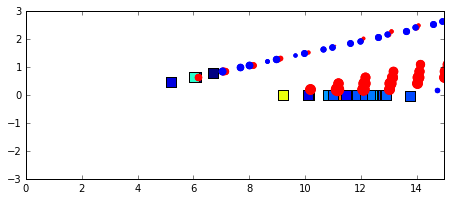

******************** New Time Step ********************
t =  3.4803021024698917 time step =  341
AOA =  10.0171736218 RA =  359.907516391
Pitching Rate =  -0.452128266175 Pitching Moment =  -35723.4740855
q_target =  -0.0343472435458 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  432.404648766 CFP Port Lift =  432.130214314
DW Starboard Lift =  10488.8964881 DW Port Lift =  10487.189009
Total Lift =  21840.6203601
CFP Starboard Control Input =  0.278520681752 CFP Port Control Input =  0.278520681752
Elevon Starboard Control Input =  -0.278520681752 Elevon Port Control Input =  -0.278520681752
CFP angle: -11.3500665402 -11.3500665402 Elevon angle: 1.35006654022 1.35006654022


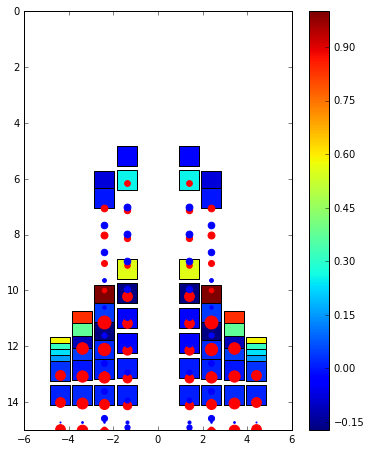

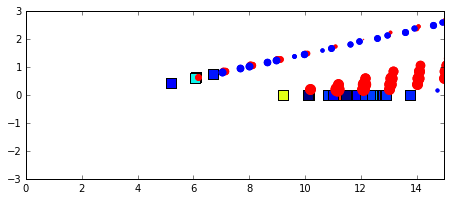

******************** New Time Step ********************
t =  3.490508266993264 time step =  342
AOA =  10.0128517905 RA =  359.907336848
Pitching Rate =  -0.423453030201 Pitching Moment =  -33457.7916988
q_target =  -0.0257035809575 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1328.92482674 CFP Port Lift =  1328.4264945
DW Starboard Lift =  9417.33828981 DW Port Lift =  9415.88056844
Total Lift =  21490.5701795
CFP Starboard Control Input =  0.265166299495 CFP Port Control Input =  0.265166299495
Elevon Starboard Control Input =  -0.265166299495 Elevon Port Control Input =  -0.265166299495
CFP angle: -10.3757874239 -10.3757874239 Elevon angle: 0.37578742389 0.37578742389


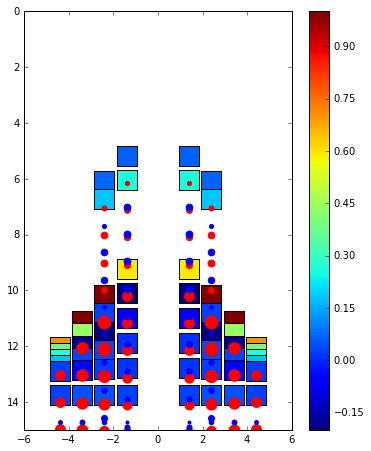

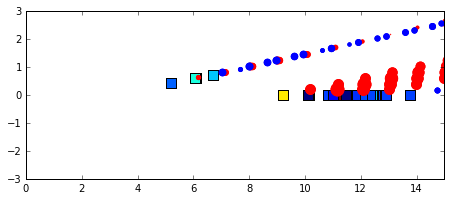

******************** New Time Step ********************
t =  3.500714431516636 time step =  343
AOA =  10.0097186502 RA =  359.90716012
Pitching Rate =  -0.306985081302 Pitching Moment =  -24255.4478827
q_target =  -0.0194373004656 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1765.29093864 CFP Port Lift =  1764.89626557
DW Starboard Lift =  8651.31002113 DW Port Lift =  8650.94568407
Total Lift =  20832.4429094
CFP Starboard Control Input =  0.191698520557 CFP Port Control Input =  0.191698520557
Elevon Starboard Control Input =  -0.191698520557 Elevon Port Control Input =  -0.191698520557
CFP angle: -9.6714450336 -9.6714450336 Elevon angle: -0.3285549664 -0.3285549664


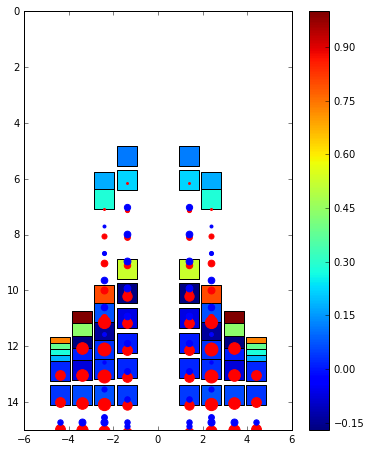

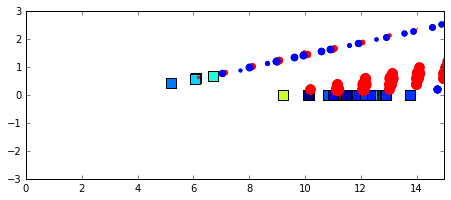

******************** New Time Step ********************
t =  3.510920596040008 time step =  344
AOA =  10.0080995571 RA =  359.906984811
Pitching Rate =  -0.158638741676 Pitching Moment =  -12534.3346151
q_target =  -0.0161991142709 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1845.49118483 CFP Port Lift =  1845.6020212
DW Starboard Lift =  8377.96447671 DW Port Lift =  8379.79364339
Total Lift =  20448.8513261
CFP Starboard Control Input =  0.0949597516031 CFP Port Control Input =  0.0949597516031
Elevon Starboard Control Input =  -0.0949597516031 Elevon Port Control Input =  -0.0949597516031
CFP angle: -9.32254208833 -9.32254208833 Elevon angle: -0.677457911665 -0.677457911665


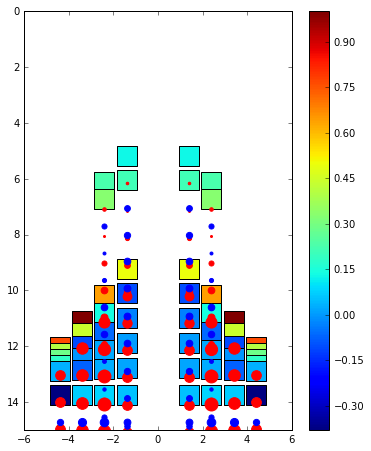

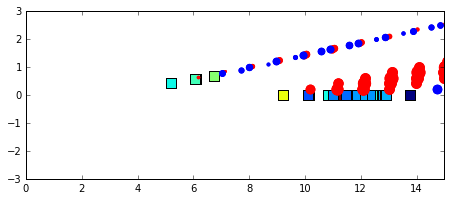

******************** New Time Step ********************
t =  3.5211267605633805 time step =  345
AOA =  10.0085663906 RA =  359.906806979
Pitching Rate =  0.0457403454326 Pitching Moment =  3614.0276266
q_target =  -0.0171327812526 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1623.46733605 CFP Port Lift =  1623.91707048
DW Starboard Lift =  8543.49588288 DW Port Lift =  8546.5083807
Total Lift =  20337.3886701
CFP Starboard Control Input =  -0.0419154177901 CFP Port Control Input =  -0.0419154177901
Elevon Starboard Control Input =  0.0419154177901 Elevon Port Control Input =  0.0419154177901
CFP angle: -9.47654852235 -9.47654852235 Elevon angle: -0.523451477654 -0.523451477654


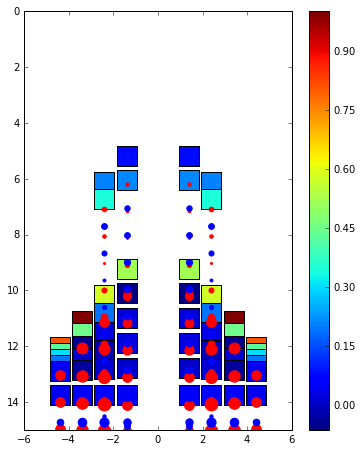

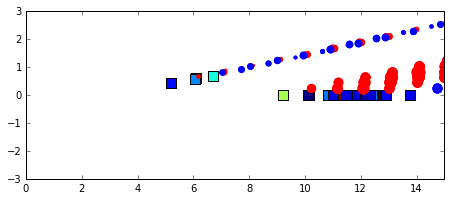

******************** New Time Step ********************
t =  3.5313329250867525 time step =  346
AOA =  10.0101428059 RA =  359.906625098
Pitching Rate =  0.154457167572 Pitching Moment =  12203.9408634
q_target =  -0.0202856117807 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1389.16633602 CFP Port Lift =  1389.76536016
DW Starboard Lift =  9042.3639816 DW Port Lift =  9044.73198993
Total Lift =  20866.0276677
CFP Starboard Control Input =  -0.116495186235 CFP Port Control Input =  -0.116495186235
Elevon Starboard Control Input =  0.116495186235 Elevon Port Control Input =  0.116495186235
CFP angle: -9.90457737563 -9.90457737563 Elevon angle: -0.0954226243719 -0.0954226243719


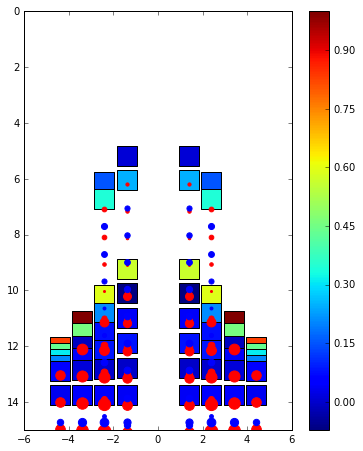

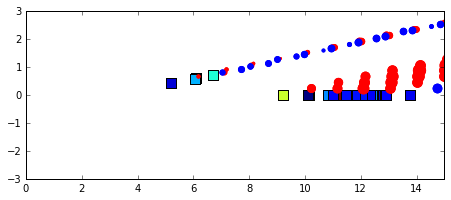

******************** New Time Step ********************
t =  3.5415390896101244 time step =  347
AOA =  10.0124513792 RA =  359.906439449
Pitching Rate =  0.226194015367 Pitching Moment =  17871.9992771
q_target =  -0.0249027584508 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1082.78115211 CFP Port Lift =  1083.48960393
DW Starboard Lift =  9258.79584003 DW Port Lift =  9260.45770003
Total Lift =  20685.5242961
CFP Starboard Control Input =  -0.167397849212 CFP Port Control Input =  -0.167397849212
Elevon Starboard Control Input =  0.167397849212 Elevon Port Control Input =  0.167397849212
CFP angle: -10.519633772 -10.519633772 Elevon angle: 0.519633771996 0.519633771996


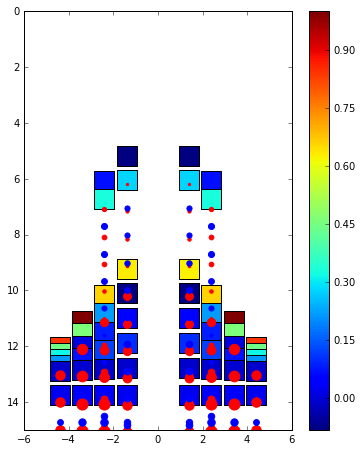

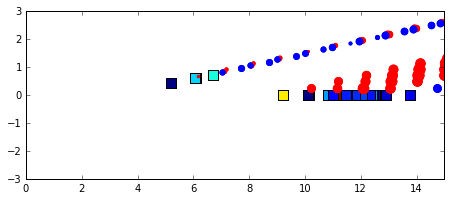

******************** New Time Step ********************
t =  3.5517452541334964 time step =  348
AOA =  10.0152484183 RA =  359.90625061
Pitching Rate =  0.27405389086 Pitching Moment =  21653.4948168
q_target =  -0.0304968366475 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  708.35940045 CFP Port Lift =  709.104943441
DW Starboard Lift =  9920.23479897 DW Port Lift =  9920.86538295
Total Lift =  21258.5645258
CFP Starboard Control Input =  -0.203033818338 CFP Port Control Input =  -0.203033818338
Elevon Starboard Control Input =  0.203033818338 Elevon Port Control Input =  0.203033818338
CFP angle: -11.2656245314 -11.2656245314 Elevon angle: 1.26562453135 1.26562453135


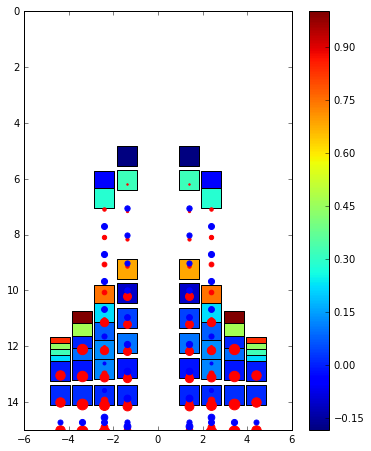

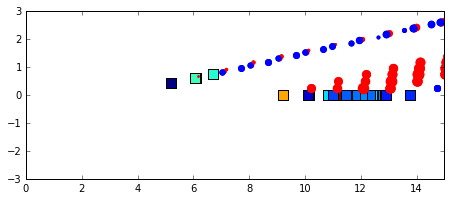

******************** New Time Step ********************
t =  3.561951418656869 time step =  349
AOA =  10.0180414579 RA =  359.906059708
Pitching Rate =  0.273662013555 Pitching Moment =  21622.5318804
q_target =  -0.0360829157158 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  188.359770911 CFP Port Lift =  189.178893788
DW Starboard Lift =  10491.0081386 DW Port Lift =  10490.7325156
Total Lift =  21359.2793189
CFP Starboard Control Input =  -0.206496619514 CFP Port Control Input =  -0.206496619514
Elevon Starboard Control Input =  0.206496619514 Elevon Port Control Input =  0.206496619514
CFP angle: -12.0243383814 -12.0243383814 Elevon angle: 2.02433838137 2.02433838137


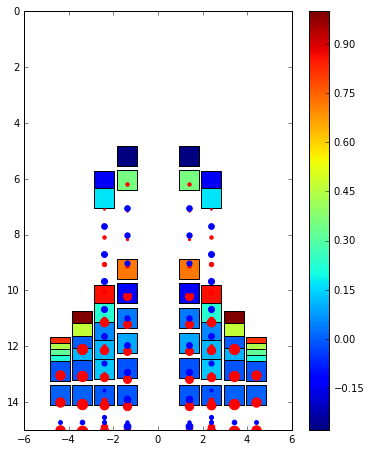

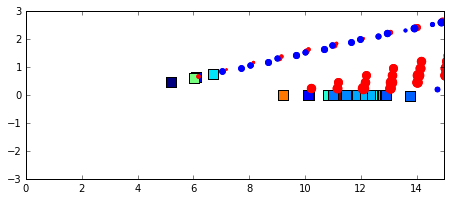

******************** New Time Step ********************
t =  3.572157583180241 time step =  350
AOA =  10.0202769767 RA =  359.905867807
Pitching Rate =  0.219036136227 Pitching Moment =  17306.442268
q_target =  -0.0405539534016 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -591.048098317 CFP Port Lift =  -590.148745351
DW Starboard Lift =  10747.4809119 DW Port Lift =  10746.7863629
Total Lift =  20313.0704311
CFP Starboard Control Input =  -0.173060059753 CFP Port Control Input =  -0.173060059753
Elevon Starboard Control Input =  0.173060059753 Elevon Port Control Input =  0.173060059753
CFP angle: -12.6601989806 -12.6601989806 Elevon angle: 2.66019898059 2.66019898059


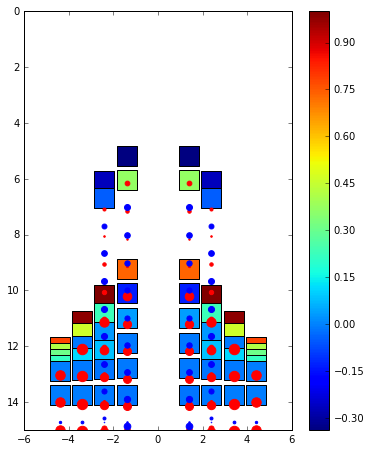

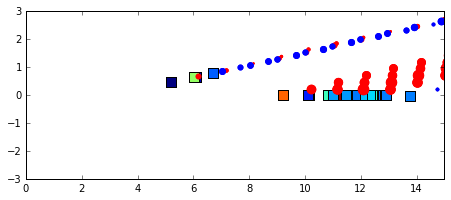

******************** New Time Step ********************
t =  3.5823637477036128 time step =  351
AOA =  10.0213354245 RA =  359.905675505
Pitching Rate =  0.103706710647 Pitching Moment =  8194.05524371
q_target =  -0.0426708489037 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1585.88277033 CFP Port Lift =  -1585.02398513
DW Starboard Lift =  11817.3695894 DW Port Lift =  11815.9240839
Total Lift =  20462.3869179
CFP Starboard Control Input =  -0.0975850397003 CFP Port Control Input =  -0.0975850397003
Elevon Starboard Control Input =  0.0975850397003 Elevon Port Control Input =  0.0975850397003
CFP angle: -13.0187478099 -13.0187478099 Elevon angle: 3.01874780986 3.01874780986


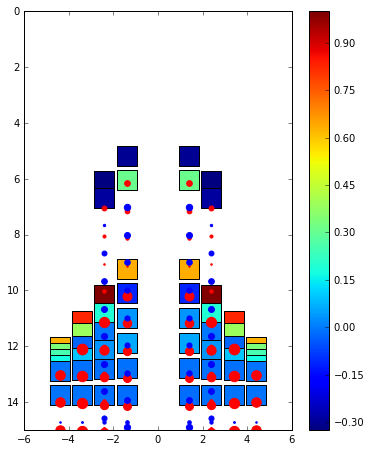

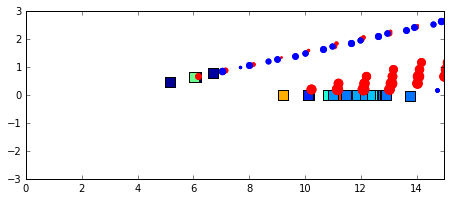

******************** New Time Step ********************
t =  3.592569912226985 time step =  352
AOA =  10.0201706901 RA =  359.905483858
Pitching Rate =  -0.114120667944 Pitching Moment =  -9016.88089184
q_target =  -0.0403413802786 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -2007.85445048 CFP Port Lift =  -2007.34873673
DW Starboard Lift =  12450.1291361 DW Port Lift =  12448.2846912
Total Lift =  20883.2106401
CFP Starboard Control Input =  0.0491861917773 CFP Port Control Input =  0.0491861917773
Elevon Starboard Control Input =  -0.0491861917773 Elevon Port Control Input =  -0.0491861917773
CFP angle: -12.8380269583 -12.8380269583 Elevon angle: 2.83802695826 2.83802695826


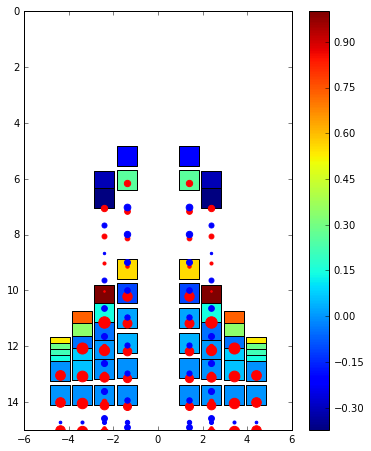

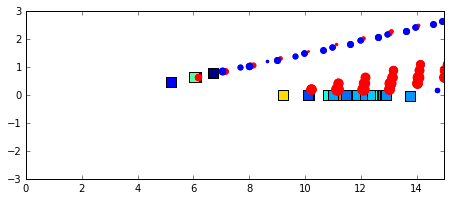

******************** New Time Step ********************
t =  3.602776076750357 time step =  353
AOA =  10.016382121 RA =  359.905293939
Pitching Rate =  -0.371204005032 Pitching Moment =  -29329.501485
q_target =  -0.0327642419844 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -665.426690305 CFP Port Lift =  -665.574371896
DW Starboard Lift =  11554.3978171 DW Port Lift =  11552.6202775
Total Lift =  21776.0170324
CFP Starboard Control Input =  0.225626508698 CFP Port Control Input =  0.225626508698
Elevon Starboard Control Input =  -0.225626508698 Elevon Port Control Input =  -0.225626508698
CFP angle: -12.0090257016 -12.0090257016 Elevon angle: 2.00902570156 2.00902570156


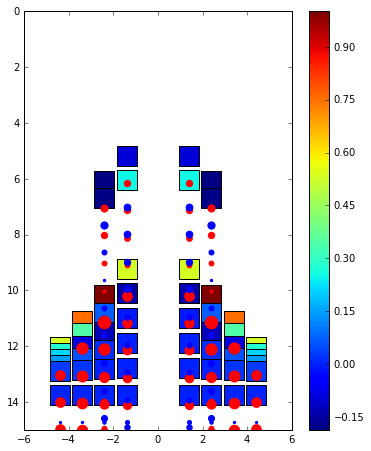

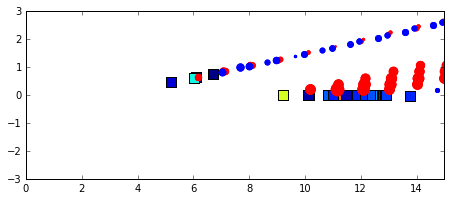

******************** New Time Step ********************
t =  3.612982241273729 time step =  354
AOA =  10.0116123368 RA =  359.905106606
Pitching Rate =  -0.467343450686 Pitching Moment =  -36925.6534011
q_target =  -0.0232246736912 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  888.597591428 CFP Port Lift =  888.093123895
DW Starboard Lift =  10080.8443754 DW Port Lift =  10079.3540493
Total Lift =  21936.8891401
CFP Starboard Control Input =  0.296079184663 CFP Port Control Input =  0.296079184663
Elevon Starboard Control Input =  -0.296079184663 Elevon Port Control Input =  -0.296079184663
CFP angle: -10.9211658681 -10.9211658681 Elevon angle: 0.921165868135 0.921165868135


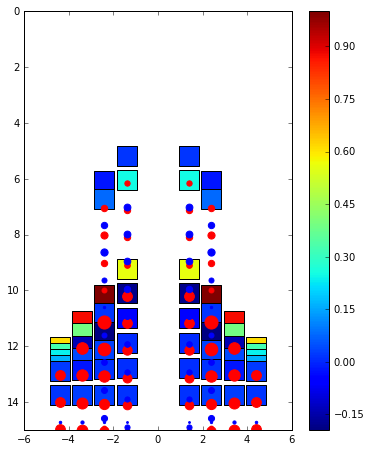

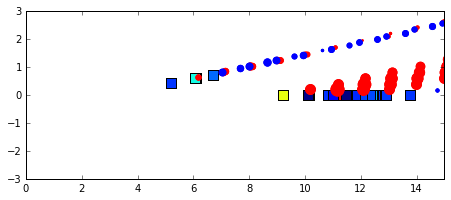

******************** New Time Step ********************
t =  3.6231884057971016 time step =  355
AOA =  10.0076354085 RA =  359.904922111
Pitching Rate =  -0.389659439747 Pitching Moment =  -30787.6988442
q_target =  -0.0152708169909 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1603.80058948 CFP Port Lift =  1603.32617299
DW Starboard Lift =  9062.23679243 DW Port Lift =  9061.53809838
Total Lift =  21330.9016533
CFP Starboard Control Input =  0.249592415171 CFP Port Control Input =  0.249592415171
Elevon Starboard Control Input =  -0.249592415171 Elevon Port Control Input =  -0.249592415171
CFP angle: -10.004108617 -10.004108617 Elevon angle: 0.00410861704966 0.00410861704966


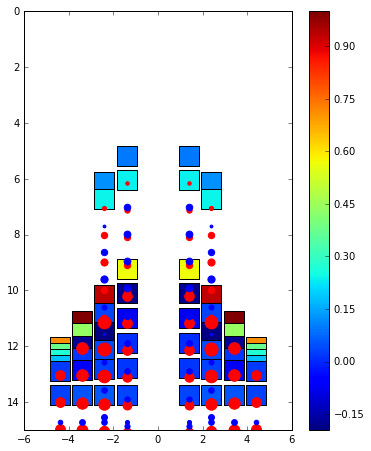

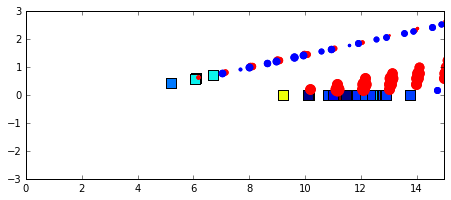

******************** New Time Step ********************
t =  3.6333945703204735 time step =  356
AOA =  10.0051220699 RA =  359.904739537
Pitching Rate =  -0.246256915522 Pitching Moment =  -19457.2053954
q_target =  -0.0102441398012 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1854.9908569 CFP Port Lift =  1854.89992107
DW Starboard Lift =  8534.52706979 DW Port Lift =  8535.58648205
Total Lift =  20780.0043298
CFP Starboard Control Input =  0.15734185048 CFP Port Control Input =  0.15734185048
Elevon Starboard Control Input =  -0.15734185048 Elevon Port Control Input =  -0.15734185048
CFP angle: -9.42600016458 -9.42600016458 Elevon angle: -0.57399983542 -0.57399983542


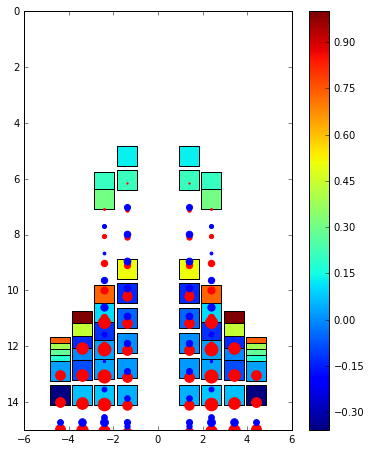

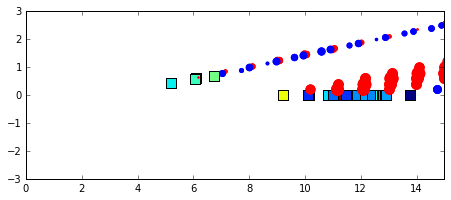

******************** New Time Step ********************
t =  3.6436007348438455 time step =  357
AOA =  10.0047942173 RA =  359.904555763
Pitching Rate =  -0.0321229929973 Pitching Moment =  -2538.09592042
q_target =  -0.00958843469818 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1717.19013323 CFP Port Lift =  1717.49998506
DW Starboard Lift =  8495.18289436 DW Port Lift =  8497.78922669
Total Lift =  20427.6622393
CFP Starboard Control Input =  0.0150230388661 CFP Port Control Input =  0.0150230388661
Elevon Starboard Control Input =  -0.0150230388661 Elevon Port Control Input =  -0.0150230388661
CFP angle: -9.37080222631 -9.37080222631 Elevon angle: -0.629197773691 -0.629197773691


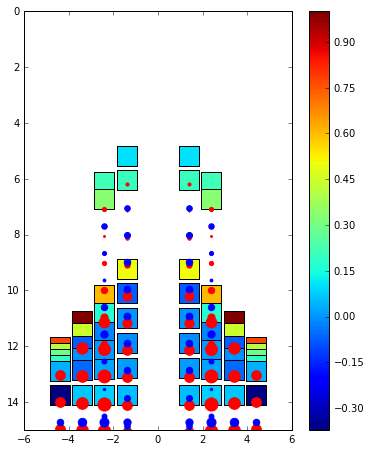

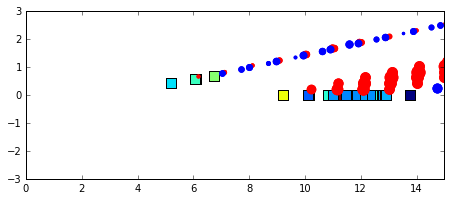

******************** New Time Step ********************
t =  3.653806899367218 time step =  358
AOA =  10.0063330894 RA =  359.904368165
Pitching Rate =  0.150778687862 Pitching Moment =  11913.2975119
q_target =  -0.0126661788881 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1457.33892596 CFP Port Lift =  1457.83233304
DW Starboard Lift =  8925.5343107 DW Port Lift =  8928.02229925
Total Lift =  20768.7278689
CFP Starboard Control Input =  -0.1089632445 CFP Port Control Input =  -0.1089632445
Elevon Starboard Control Input =  0.1089632445 Elevon Port Control Input =  0.1089632445
CFP angle: -9.77115707444 -9.77115707444 Elevon angle: -0.228842925558 -0.228842925558


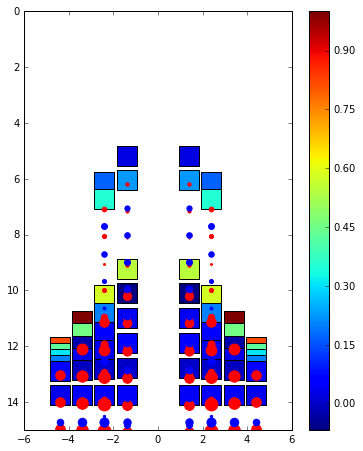

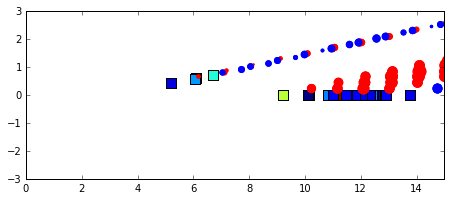

******************** New Time Step ********************
t =  3.66401306389059 time step =  359
AOA =  10.0087116781 RA =  359.904176899
Pitching Rate =  0.233054112685 Pitching Moment =  18414.0280046
q_target =  -0.0174233561219 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1156.85742031 CFP Port Lift =  1157.49369499
DW Starboard Lift =  9309.30577758 DW Port Lift =  9311.19938506
Total Lift =  20934.8562779
CFP Starboard Control Input =  -0.166984979205 CFP Port Control Input =  -0.166984979205
Elevon Starboard Control Input =  0.166984979205 Elevon Port Control Input =  0.166984979205
CFP angle: -10.3846964959 -10.3846964959 Elevon angle: 0.384696495892 0.384696495892


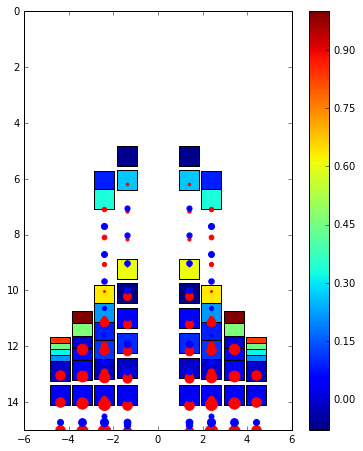

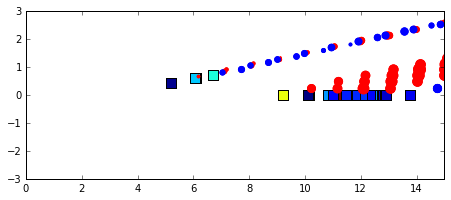

******************** New Time Step ********************
t =  3.674219228413962 time step =  360
AOA =  10.0115918331 RA =  359.903982321
Pitching Rate =  0.282197586121 Pitching Moment =  22296.9429452
q_target =  -0.023183666106 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  762.805237558 CFP Port Lift =  763.549015678
DW Starboard Lift =  9922.2079888 DW Port Lift =  9923.47830236
Total Lift =  21372.0405444
CFP Starboard Control Input =  -0.203587501485 CFP Port Control Input =  -0.203587501485
Elevon Starboard Control Input =  0.203587501485 Elevon Port Control Input =  0.203587501485
CFP angle: -11.1327216085 -11.1327216085 Elevon angle: 1.13272160851 1.13272160851


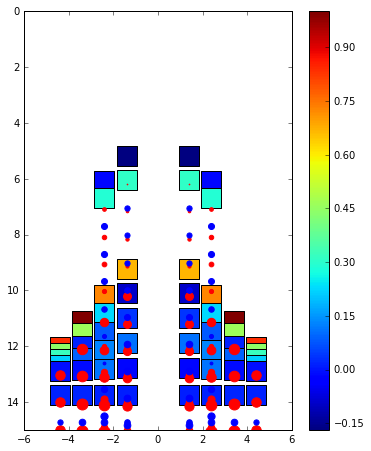

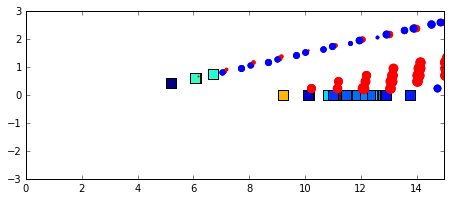

******************** New Time Step ********************
t =  3.6844253929373343 time step =  361
AOA =  10.0145065866 RA =  359.903784964
Pitching Rate =  0.285587549724 Pitching Moment =  22564.7901159
q_target =  -0.0290131731426 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  273.418039108 CFP Port Lift =  274.21254658
DW Starboard Lift =  10484.3912701 DW Port Lift =  10484.5646107
Total Lift =  21516.5864665
CFP Starboard Control Input =  -0.209733815244 CFP Port Control Input =  -0.209733815244
Elevon Starboard Control Input =  0.209733815244 Elevon Port Control Input =  0.209733815244
CFP angle: -11.9033296253 -11.9033296253 Elevon angle: 1.90332962533 1.90332962533


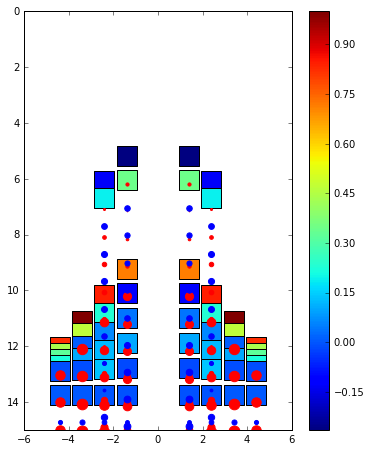

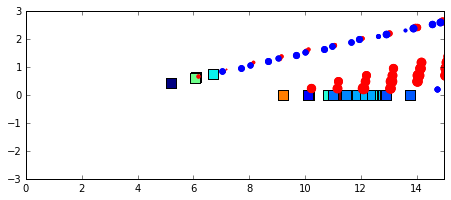

******************** New Time Step ********************
t =  3.6946315574607063 time step =  362
AOA =  10.0169382967 RA =  359.903586072
Pitching Rate =  0.238258954211 Pitching Moment =  18825.2719707
q_target =  -0.0338765933143 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -418.399252934 CFP Port Lift =  -417.505853955
DW Starboard Lift =  10865.2400602 DW Port Lift =  10864.9288204
Total Lift =  20894.2637737
CFP Starboard Control Input =  -0.18142369835 CFP Port Control Input =  -0.18142369835
Elevon Starboard Control Input =  0.18142369835 Elevon Port Control Input =  0.18142369835
CFP angle: -12.5699200663 -12.5699200663 Elevon angle: 2.5699200663 2.5699200663


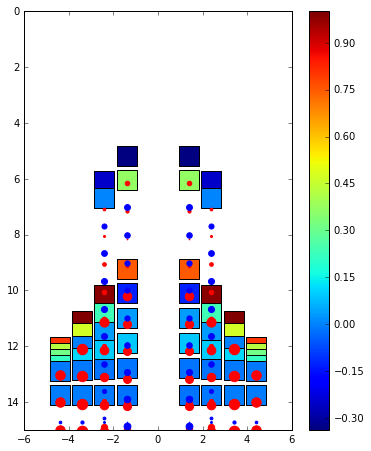

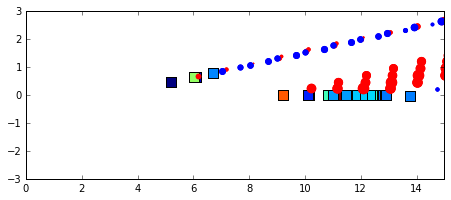

******************** New Time Step ********************
t =  3.7048377219840782 time step =  363
AOA =  10.0183282409 RA =  359.903386216
Pitching Rate =  0.136186739277 Pitching Moment =  10760.3611969
q_target =  -0.0366564818482 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1271.19554255 CFP Port Lift =  -1270.30120608
DW Starboard Lift =  11637.1697994 DW Port Lift =  11636.2088668
Total Lift =  20731.8819175
CFP Starboard Control Input =  -0.115228814084 CFP Port Control Input =  -0.115228814084
Elevon Starboard Control Input =  0.115228814084 Elevon Port Control Input =  0.115228814084
CFP angle: -12.9932959907 -12.9932959907 Elevon angle: 2.99329599067 2.99329599067


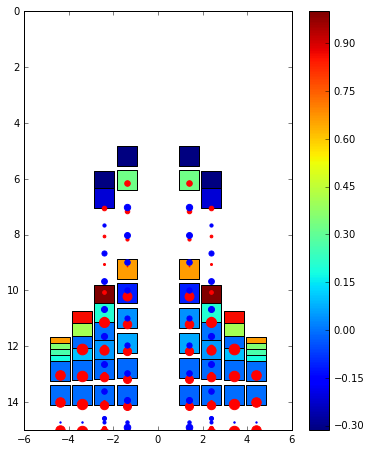

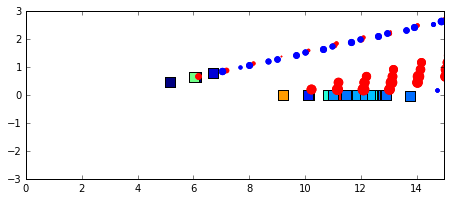

******************** New Time Step ********************
t =  3.7150438865074507 time step =  364
AOA =  10.017828279 RA =  359.903186301
Pitching Rate =  -0.0489862693059 Pitching Moment =  -3870.49395717
q_target =  -0.0356565580004 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1812.8135523 CFP Port Lift =  -1812.14800509
DW Starboard Lift =  12291.4854034 DW Port Lift =  12289.9867273
Total Lift =  20956.5105733
CFP Starboard Control Input =  0.00888647420372 CFP Port Control Input =  0.00888647420372
Elevon Starboard Control Input =  -0.00888647420372 Elevon Port Control Input =  -0.00888647420372
CFP angle: -12.9606451363 -12.9606451363 Elevon angle: 2.96064513628 2.96064513628


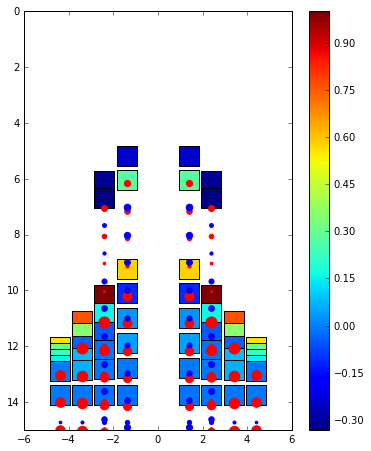

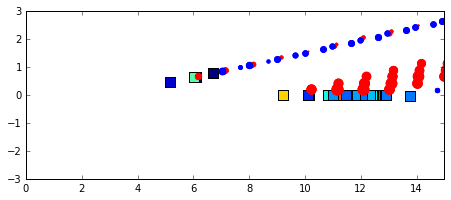

******************** New Time Step ********************
t =  3.7252500510308226 time step =  365
AOA =  10.0148928662 RA =  359.902987408
Pitching Rate =  -0.28761175103 Pitching Moment =  -22724.7259313
q_target =  -0.0297857323006 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1047.44821057 CFP Port Lift =  -1047.33108124
DW Starboard Lift =  11912.8377856 DW Port Lift =  11911.1573398
Total Lift =  21729.2158336
CFP Starboard Control Input =  0.171884012486 CFP Port Control Input =  0.171884012486
Elevon Starboard Control Input =  -0.171884012486 Elevon Port Control Input =  -0.171884012486
CFP angle: -12.3291055925 -12.3291055925 Elevon angle: 2.32910559255 2.32910559255


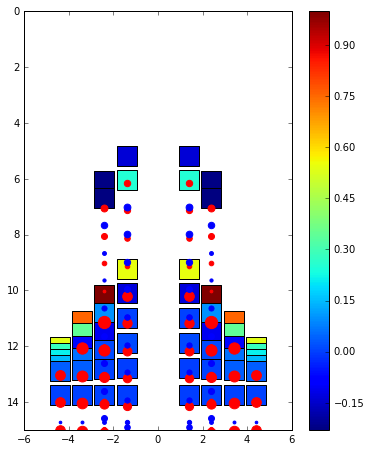

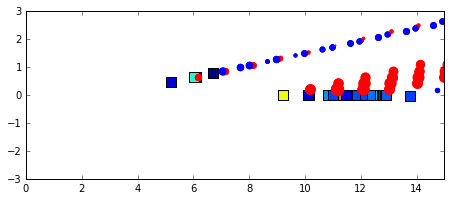

******************** New Time Step ********************
t =  3.7354562155541946 time step =  366
AOA =  10.0104802612 RA =  359.902790564
Pitching Rate =  -0.43234703739 Pitching Moment =  -34160.5233329
q_target =  -0.020960522311 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  455.818253052 CFP Port Lift =  455.458095623
DW Starboard Lift =  10448.5553741 DW Port Lift =  10446.9510685
Total Lift =  21806.7827912
CFP Starboard Control Input =  0.274257676719 CFP Port Control Input =  0.274257676719
Elevon Starboard Control Input =  -0.274257676719 Elevon Port Control Input =  -0.274257676719
CFP angle: -11.3214227632 -11.3214227632 Elevon angle: 1.3214227632 1.3214227632


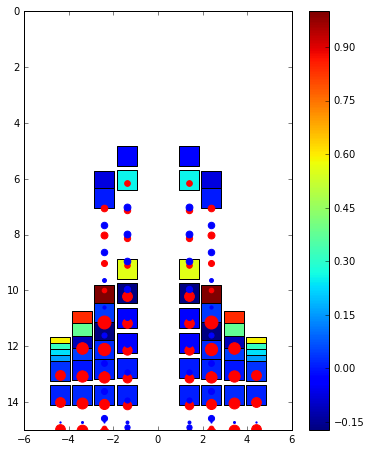

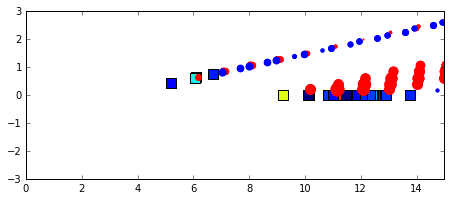

******************** New Time Step ********************
t =  3.745662380077567 time step =  367
AOA =  10.0063792262 RA =  359.902596402
Pitching Rate =  -0.401819409298 Pitching Moment =  -31748.4800863
q_target =  -0.0127584523111 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1324.66247231 CFP Port Lift =  1324.10645442
DW Starboard Lift =  9405.20324955 DW Port Lift =  9403.82276816
Total Lift =  21457.7949444
CFP Starboard Control Input =  0.259373971325 CFP Port Control Input =  0.259373971325
Elevon Starboard Control Input =  -0.259373971325 Elevon Port Control Input =  -0.259373971325
CFP angle: -10.3684259304 -10.3684259304 Elevon angle: 0.368425930411 0.368425930411


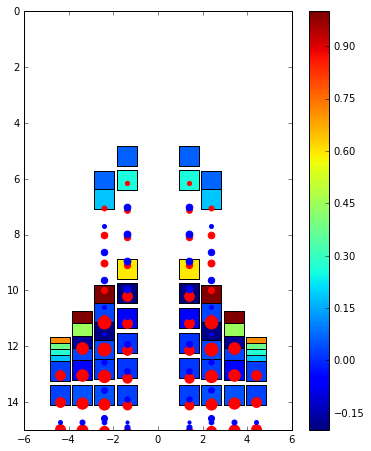

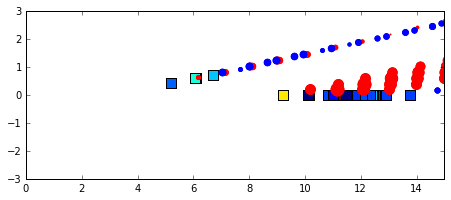

******************** New Time Step ********************
t =  3.755868544600939 time step =  368
AOA =  10.0034528125 RA =  359.902405047
Pitching Rate =  -0.28673001264 Pitching Moment =  -22655.0581824
q_target =  -0.00690562494548 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1752.65006578 CFP Port Lift =  1752.20497772
DW Starboard Lift =  8652.96754396 DW Port Lift =  8652.64591799
Total Lift =  20810.4685055
CFP Starboard Control Input =  0.186549591796 CFP Port Control Input =  0.186549591796
Elevon Starboard Control Input =  -0.186549591796 Elevon Port Control Input =  -0.186549591796
CFP angle: -9.68300183318 -9.68300183318 Elevon angle: -0.31699816682 -0.31699816682


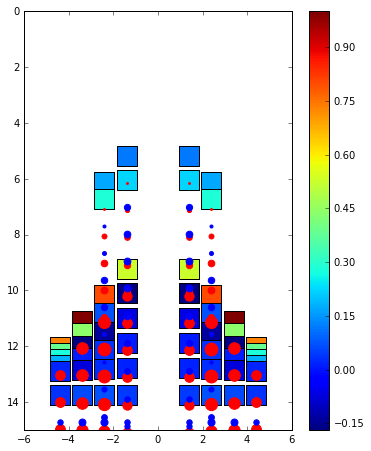

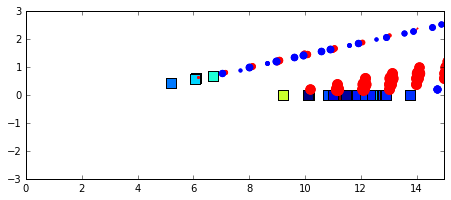

******************** New Time Step ********************
t =  3.766074709124311 time step =  369
AOA =  10.0020193947 RA =  359.902215128
Pitching Rate =  -0.140446275713 Pitching Moment =  -11096.9148938
q_target =  -0.00403878935224 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1831.50130852 CFP Port Lift =  1831.55400198
DW Starboard Lift =  8382.39439745 DW Port Lift =  8384.17906781
Total Lift =  20429.6287758
CFP Starboard Control Input =  0.0909383242404 CFP Port Control Input =  0.0909383242404
Elevon Starboard Control Input =  -0.0909383242404 Elevon Port Control Input =  -0.0909383242404
CFP angle: -9.34887449366 -9.34887449366 Elevon angle: -0.651125506344 -0.651125506344


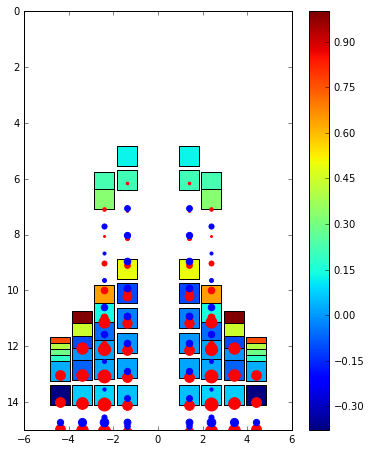

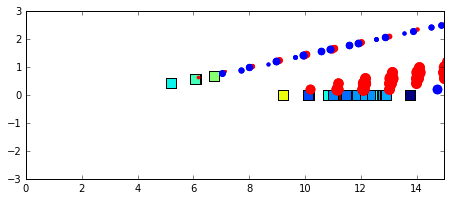

******************** New Time Step ********************
t =  3.7762808736476834 time step =  370
AOA =  10.0026474102 RA =  359.902022821
Pitching Rate =  0.0615329654034 Pitching Moment =  4861.83116483
q_target =  -0.00529482048928 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1609.87616724 CFP Port Lift =  1610.26600519
DW Starboard Lift =  8555.10553115 DW Port Lift =  8558.04825894
Total Lift =  20333.2959625
CFP Starboard Control Input =  -0.0445518572618 CFP Port Control Input =  -0.0445518572618
Elevon Starboard Control Input =  0.0445518572618 Elevon Port Control Input =  0.0445518572618
CFP angle: -9.51256778427 -9.51256778427 Elevon angle: -0.487432215731 -0.487432215731


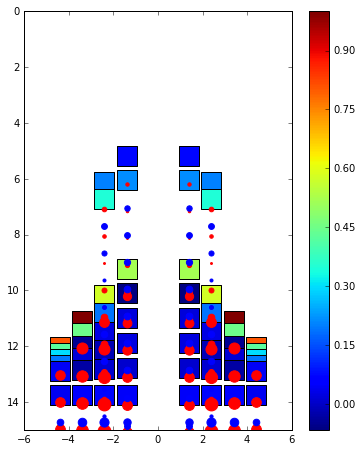

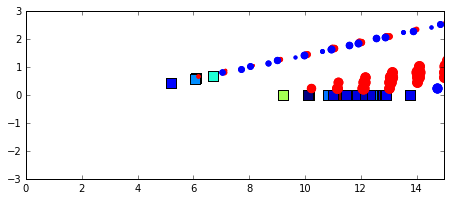

******************** New Time Step ********************
t =  3.7864870381710554 time step =  371
AOA =  10.0043678046 RA =  359.901826641
Pitching Rate =  0.168564240269 Pitching Moment =  13318.5662554
q_target =  -0.00873560922717 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1373.09056946 CFP Port Lift =  1373.6309967
DW Starboard Lift =  9056.75802209 DW Port Lift =  9059.07843281
Total Lift =  20862.558021
CFP Starboard Control Input =  -0.118199899664 CFP Port Control Input =  -0.118199899664
Elevon Starboard Control Input =  0.118199899664 Elevon Port Control Input =  0.118199899664
CFP angle: -9.94686012841 -9.94686012841 Elevon angle: -0.0531398715876 -0.0531398715876


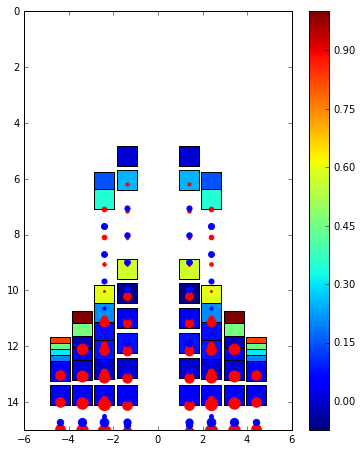

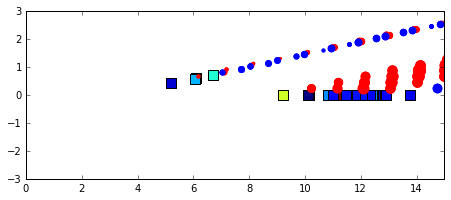

******************** New Time Step ********************
t =  3.7966932026944273 time step =  372
AOA =  10.0068022842 RA =  359.901626849
Pitching Rate =  0.238530309259 Pitching Moment =  18846.7122251
q_target =  -0.0136045683874 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1062.74107392 CFP Port Lift =  1063.39055963
DW Starboard Lift =  9278.63770983 DW Port Lift =  9280.26433837
Total Lift =  20685.0336817
CFP Starboard Control Input =  -0.168089918431 CFP Port Control Input =  -0.168089918431
Elevon Starboard Control Input =  0.168089918431 Elevon Port Control Input =  0.168089918431
CFP angle: -10.5644593388 -10.5644593388 Elevon angle: 0.564459338815 0.564459338815


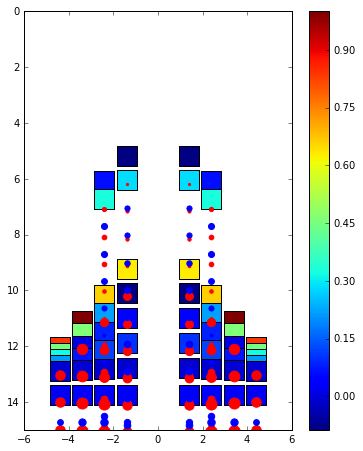

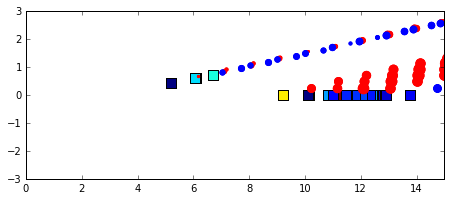

******************** New Time Step ********************
t =  3.8068993672177993 time step =  373
AOA =  10.0097039017 RA =  359.90142401
Pitching Rate =  0.284300483527 Pitching Moment =  22463.0966821
q_target =  -0.0194078034053 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  682.543113269 CFP Port Lift =  683.220157682
DW Starboard Lift =  9948.47305085 DW Port Lift =  9949.06423431
Total Lift =  21263.3005561
CFP Starboard Control Input =  -0.202472191289 CFP Port Control Input =  -0.202472191289
Elevon Starboard Control Input =  0.202472191289 Elevon Port Control Input =  0.202472191289
CFP angle: -11.3083865573 -11.3083865573 Elevon angle: 1.30838655727 1.30838655727


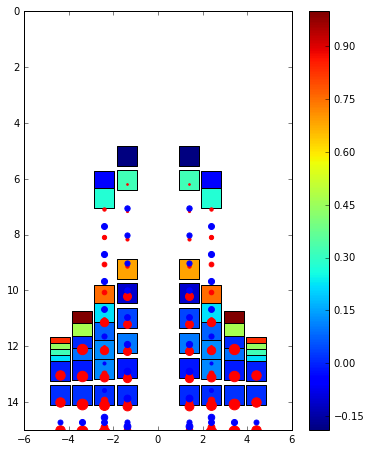

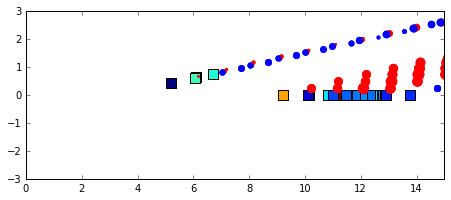

******************** New Time Step ********************
t =  3.8171055317411717 time step =  374
AOA =  10.0125730254 RA =  359.90121927
Pitching Rate =  0.281116736207 Pitching Moment =  22211.5430337
q_target =  -0.0251460507253 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  151.809208398 CFP Port Lift =  152.539153728
DW Starboard Lift =  10525.2747313 DW Port Lift =  10524.9743659
Total Lift =  21354.5974594
CFP Starboard Control Input =  -0.204175191288 CFP Port Control Input =  -0.204175191288
Elevon Starboard Control Input =  0.204175191288 Elevon Port Control Input =  0.204175191288
CFP angle: -12.0585709711 -12.0585709711 Elevon angle: 2.05857097106 2.05857097106


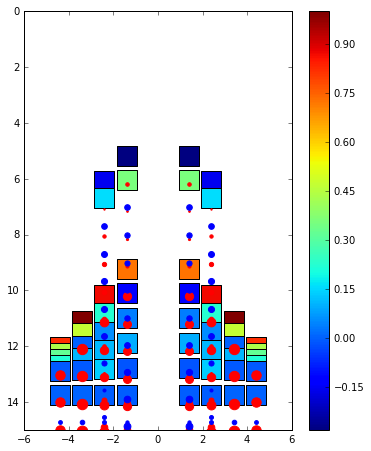

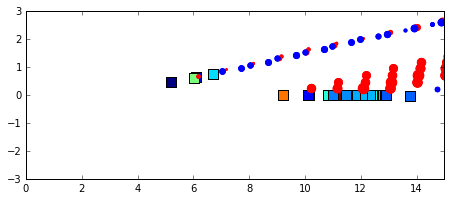

******************** New Time Step ********************
t =  3.8273116962645437 time step =  375
AOA =  10.0148457961 RA =  359.901013698
Pitching Rate =  0.222686080215 Pitching Moment =  17594.8309604
q_target =  -0.0296915922688 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -636.093857643 CFP Port Lift =  -635.320155187
DW Starboard Lift =  10784.9951224 DW Port Lift =  10784.3065804
Total Lift =  20297.8876899
CFP Starboard Control Input =  -0.168251781656 CFP Port Control Input =  -0.168251781656
Elevon Starboard Control Input =  0.168251781656 Elevon Port Control Input =  0.168251781656
CFP angle: -12.6767649024 -12.6767649024 Elevon angle: 2.67676490244 2.67676490244


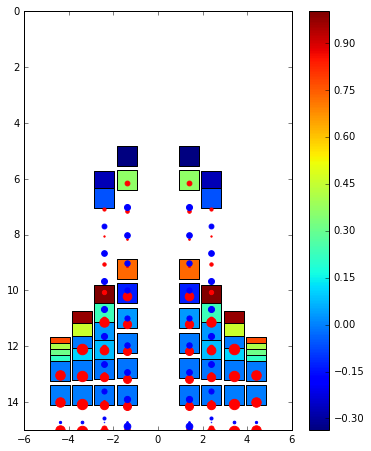

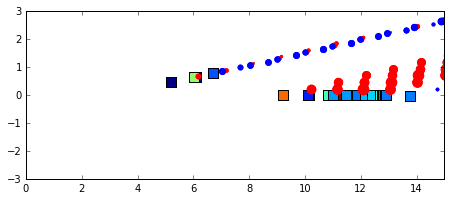

******************** New Time Step ********************
t =  3.8375178607879157 time step =  376
AOA =  10.0158957434 RA =  359.900807898
Pitching Rate =  0.102873832744 Pitching Moment =  8128.24805047
q_target =  -0.0317914867931 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1613.85331004 CFP Port Lift =  -1613.17417581
DW Starboard Lift =  11834.5088568 DW Port Lift =  11833.1228366
Total Lift =  20440.6042076
CFP Starboard Control Input =  -0.0897768796912 CFP Port Control Input =  -0.0897768796912
Elevon Starboard Control Input =  0.0897768796912 Elevon Port Control Input =  0.0897768796912
CFP angle: -13.0066248401 -13.0066248401 Elevon angle: 3.00662484007 3.00662484007


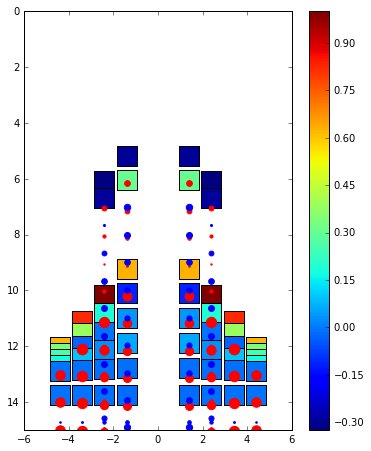

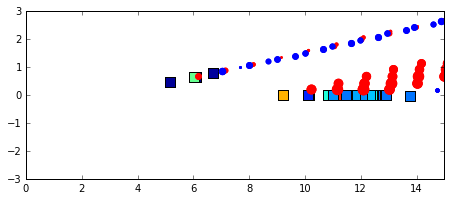

******************** New Time Step ********************
t =  3.847724025311288 time step =  377
AOA =  10.0147002119 RA =  359.900602926
Pitching Rate =  -0.117138173739 Pitching Moment =  -9255.29949586
q_target =  -0.0294004238468 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -1954.32308023 CFP Port Lift =  -1954.03014949
DW Starboard Lift =  12551.7194456 DW Port Lift =  12549.982152
Total Lift =  21193.3483679
CFP Starboard Control Input =  0.0584918332616 CFP Port Control Input =  0.0584918332616
Elevon Starboard Control Input =  -0.0584918332616 Elevon Port Control Input =  -0.0584918332616
CFP angle: -12.7917130216 -12.7917130216 Elevon angle: 2.79171302159 2.79171302159


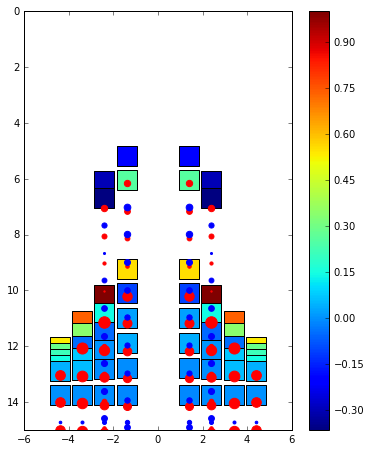

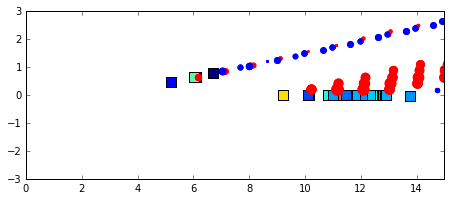

******************** New Time Step ********************
t =  3.85793018983466 time step =  378
AOA =  10.0108786988 RA =  359.900399849
Pitching Rate =  -0.374431856291 Pitching Moment =  -29584.5398655
q_target =  -0.0217573975906 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  -511.497694475 CFP Port Lift =  -511.796781667
DW Starboard Lift =  11408.5963872 DW Port Lift =  11406.9457282
Total Lift =  21792.2476393
CFP Starboard Control Input =  0.2351163058 CFP Port Control Input =  0.2351163058
Elevon Starboard Control Input =  -0.2351163058 Elevon Port Control Input =  -0.2351163058
CFP angle: -11.9278441699 -11.9278441699 Elevon angle: 1.92784416991 1.92784416991


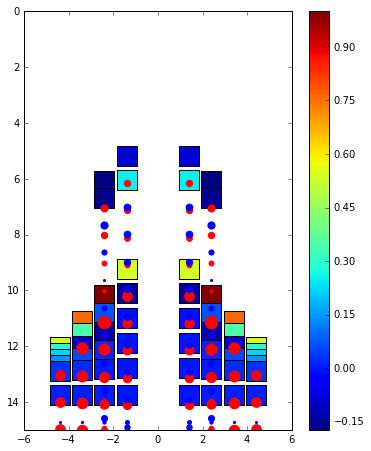

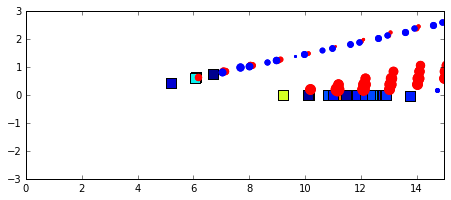

******************** New Time Step ********************
t =  3.868136354358032 time step =  379
AOA =  10.0062551051 RA =  359.900199414
Pitching Rate =  -0.453019711993 Pitching Moment =  -35793.9088359
q_target =  -0.0125102101647 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  954.861764569 CFP Port Lift =  954.287115353
DW Starboard Lift =  9986.65843941 DW Port Lift =  9985.27168169
Total Lift =  21881.079001
CFP Starboard Control Input =  0.293673001219 CFP Port Control Input =  0.293673001219
Elevon Starboard Control Input =  -0.293673001219 Elevon Port Control Input =  -0.293673001219
CFP angle: -10.848825182 -10.848825182 Elevon angle: 0.84882518196 0.84882518196


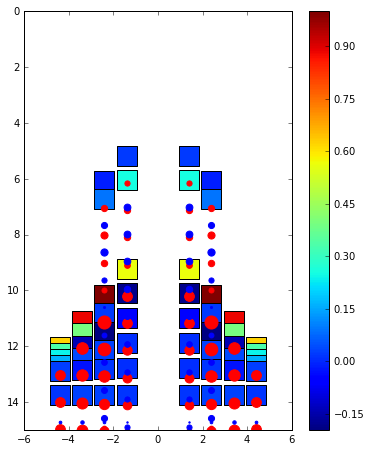

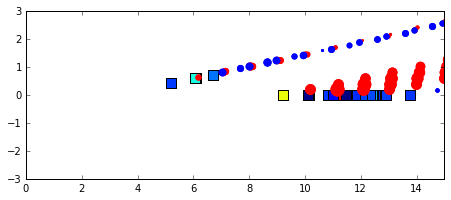

******************** New Time Step ********************
t =  3.8783425188814045 time step =  380
AOA =  10.0024888769 RA =  359.900001798
Pitching Rate =  -0.369015033369 Pitching Moment =  -29156.546865
q_target =  -0.00497775388038 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1625.6157354 CFP Port Lift =  1625.10175384
DW Starboard Lift =  9006.05271777 DW Port Lift =  9005.45505616
Total Lift =  21262.2252632
CFP Starboard Control Input =  0.242691519659 CFP Port Control Input =  0.242691519659
Elevon Starboard Control Input =  -0.242691519659 Elevon Port Control Input =  -0.242691519659
CFP angle: -9.95712333386 -9.95712333386 Elevon angle: -0.042876666143 -0.042876666143


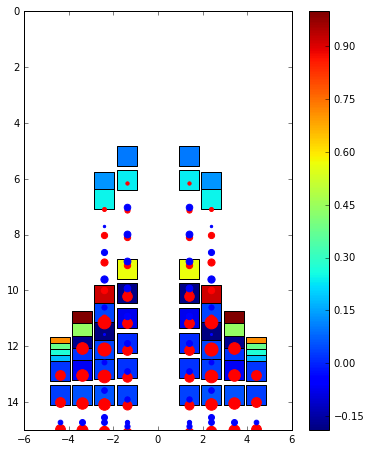

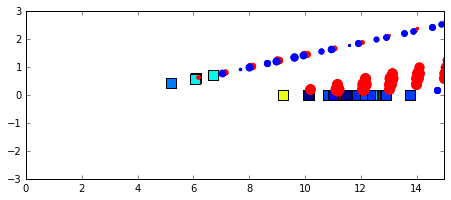

******************** New Time Step ********************
t =  3.8885486834047764 time step =  381
AOA =  10.0001954162 RA =  359.899806042
Pitching Rate =  -0.22471328438 Pitching Moment =  -17755.0040371
q_target =  -0.000390832378436 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1855.03857506 CFP Port Lift =  1854.91666731
DW Starboard Lift =  8503.46701744 DW Port Lift =  8504.58751914
Total Lift =  20718.009779
CFP Starboard Control Input =  0.149548301335 CFP Port Control Input =  0.149548301335
Elevon Starboard Control Input =  -0.149548301335 Elevon Port Control Input =  -0.149548301335
CFP angle: -9.40765008952 -9.40765008952 Elevon angle: -0.592349910483 -0.592349910483


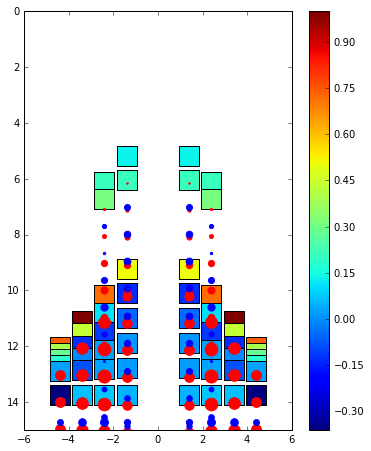

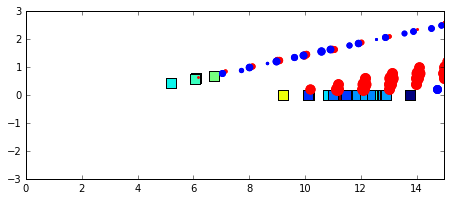

******************** New Time Step ********************
t =  3.8987548479281484 time step =  382
AOA =  10.0000763097 RA =  359.899609038
Pitching Rate =  -0.0116700547177 Pitching Moment =  -922.072182769
q_target =  -0.000152619381546 CFP_target =  0.0 E_target =  0.0
CFP Starboard Lift =  1709.868731 CFP Port Lift =  1710.133045
DW Starboard Lift =  8486.91124678 DW Port Lift =  8489.48480593
Total Lift =  20396.3978287
CFP Starboard Control Input =  0.00767829022409 CFP Port Control Input =  0.00767829022409
Elevon Starboard Control Input =  -0.00767829022409 Elevon Port Control Input =  -0.00767829022409
CFP angle: -9.37943836793 -9.37943836793 Elevon angle: -0.620561632066 -0.620561632066


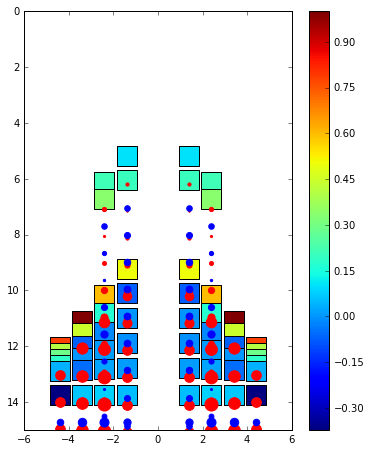

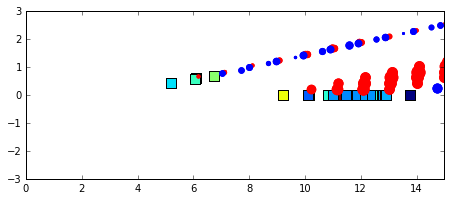

In [471]:
AOA_target = 0.0/180.0*math.pi
# Main Loop:
for ts in range (Nt):
    # Test Missions:
    if (ts*dt > 1.2)\
    and (abs(AOA) <= 0.01/180.0*math.pi)\
    and abs(q) <= 0.01/180.0*math.pi\
    and abs(MY) <= 2000.0:
        AOA_target = 10.0/180.0*math.pi
    if (abs(AOA-10.0/180.0*math.pi) <= 0.02/180.0*math.pi)\
    and abs(q) <= 0.02/180.0*math.pi\
    and abs(MY) <= 4000.0:
        break
    # Flying Attitude: 
    if ts*dt < FFST[0]:
        p = 0.0 # Aircraft Rotational Motion w.r.t x axis, Rolling Motion
        q = 0.0 # Aircraft Rotational Motion w.r.t y axis, Pitching Motion
        r = 0.0 # Aircraft Rotational Motion w.r.t z axis, Yawing Motion
    else:
        for n in range (totpanelnum):
            MX = MX+totpoint_m[n,6]/math.cos(AOA)\
            *(totpoint_m[n,1]-CG[1]) # Rolling Moment
            MY = MY+totpoint_m[n,6]/math.cos(AOA)\
            *(CG[0]-totpoint_m[n,0]) # Pitching Moment
            MZ = 0.0 # Yawing Moment
            # Note: the virtical stabilizer is not included in this projcet.
            # Hereby assume the rudder can always cancel out the extra
            # yawing moment generated by the induced drag asymmetry when rolling.
        p = MX/Ix*dt # Rolling Motion
        q = MY/Iy*dt # Pitching Motion
        r = MZ/Iz*dt # Yawing Motion
        RA = RA+p*dt
        if RA >= 2.0*math.pi:
            RA = RA-2.0*math.pi
        if RA <= 0.0:
            RA = RA+2.0*math.pi
    if ts*dt < FFST[0]: 
        AOA = 0.0
    else: 
        AOA = AOA+q*dt
    # Control Signal:
    if (ts*dt) >= FFST[1]: # The Flow Field is ready   
        CFPs,CFPp,Es,Ep,q_target,CFPs_target,Es_target\
        = AutoPilot(AOA,CFPpa_s,CFPpa_p,Epa_s,Epa_p,q,AOA_target,CFPlimit,Elimit,dt)
    # Control Input and Remesh Control Surface:
    CFPpa_s = CFPpa_s+CSRM*dt*CFPp
    CFPpa_p = CFPpa_p+CSRM*dt*CFPs
    if (CFPpa_s > CFPlimit[1]): 
        CFPpa_s = CFPlimit[1]
    if (CFPpa_s < CFPlimit[0]):
        CFPpa_s = CFPlimit[0]
    if (CFPpa_p > CFPlimit[1]): 
        CFPpa_p = CFPlimit[1]
    if (CFPpa_p < CFPlimit[0]):
        CFPpa_p = CFPlimit[0]
    if (CFPp != 0) or (CFPs != 0):
        CFPpoint_m,CFPpoint_1n,CFPpoint_2n,CFPtotpanelnum = \
         VLM_Mesh(CFPpanelnum_c,CFPpanelnum_sp,\
         CFP_hs,CFP_r,CFP_t,FD,cb_coeff,cb_dzdx_coeff,\
         CFP_LE,CFPP,CFPH,CFPpa_s,CFPpa_p,CFPHP,0)
    Epa_s = Epa_s+CSRM*dt*Ep
    Epa_p = Epa_p+CSRM*dt*Es
    if (Epa_s > Elimit[1]): 
        Epa_s = Elimit[1]
    if (Epa_s < Elimit[0]):
        Epa_s = Elimit[0]
    if (Epa_p > Elimit[1]): 
        Epa_p = Elimit[1]
    if (Epa_p < Elimit[0]):
        Epa_p = Elimit[0]
    if (Ep != 0) or (Es != 0):
        Epoint_m,Epoint_1n,Epoint_2n,Etotpanelnum = \
         VLM_Mesh(Epanelnum_c,Epanelnum_sp,\
         E_hs,E_r,E_t,FD,cb_coeff,cb_dzdx_coeff,\
         E_LE,EP,EH,Epa_s,Epa_p,EHP,0)
    # Update all Moved Panels:
    for pn in range (totpanelnum):
        if (pn < CFPtotpanelnum) and ((CFPp != 0) or (CFPs != 0)):
            totpoint_m[pn,:] = CFPpoint_m[pn,:]
            totpoint_1n[pn,:] = CFPpoint_1n[pn,:]
            totpoint_2n[pn,:] = CFPpoint_2n[pn,:]
        if (pn >= (CFPtotpanelnum+DWtotpanelnum))\
        and ((Ep != 0) or (Es != 0)):
            totpoint_m[pn,:] = Epoint_m[pn-(CFPtotpanelnum+DWtotpanelnum),:]
            totpoint_1n[pn,:] = Epoint_1n[pn-(CFPtotpanelnum+DWtotpanelnum),:]
            totpoint_2n[pn,:] = Epoint_2n[pn-(CFPtotpanelnum+DWtotpanelnum),:]
    # Compute Boundary Condition:
    totpoint_m,Gamma,b,totb,A,B,C= TDLSBC(totpoint_m,totpoint_1n,totpoint_2n,\
    SVpoints,WVpoints,U_inf,AOA,totpanelnum,WVpointsnum,SVpointsnum,p,q,r,dhdt,\
    SVpointer,WVpointer,OldGamma,ts)
    OldGamma = Gamma.copy()
    # Compute the Total Lift for CFP and DW:
    CFPstarboardlift = 0.0
    CFPportlift = 0.0
    DWstarboardlift = 0.0
    DWportlift = 0.0
    CFPstarboarddrag = 0.0
    CFPportdrag = 0.0
    DWstarboarddrag = 0.0
    DWportdrag = 0.0
    for pn in range (totpanelnum):
        if pn < CFPtotpanelnum/2.0:
            CFPstarboardlift = CFPstarboardlift+totpoint_m[pn,6]
            CFPstarboarddrag = CFPstarboarddrag+totpoint_m[pn,7]
        if (pn >= CFPtotpanelnum/2.0)\
        and (pn < CFPtotpanelnum):
            CFPportlift = CFPportlift+totpoint_m[pn,6]
            CFPportdrag = CFPportdrag+totpoint_m[pn,7]
        if (pn >= CFPtotpanelnum)\
        and (pn < CFPtotpanelnum+DWtotpanelnum/2.0):
            DWstarboardlift = DWstarboardlift+totpoint_m[pn,6]
            DWstarboarddrag = DWstarboarddrag+totpoint_m[pn,7]
        if (pn >= CFPtotpanelnum+DWtotpanelnum/2.0)\
        and (pn < CFPtotpanelnum+DWtotpanelnum):
            DWportlift = DWportlift+totpoint_m[pn,6]
            DWportdrag = DWportdrag+totpoint_m[pn,7]
    TotalLift = CFPstarboardlift+CFPportlift+DWstarboardlift+DWportlift
    if ts*dt < FFST[0]:
        dhdt = 0.0
    else:
        dhdt = (TotalLift-w*g)/w*dt
    LiftHis[ts,:] = [ts*dt,CFPstarboardlift,CFPportlift,DWstarboardlift,DWportlift,TotalLift]
    CtrlS[ts,:] = [ts*dt, TPF,CFPp,CFPs,Ep,Es,CFPpa_s,CFPpa_p,Epa_s,Epa_p]
    FAtt[ts,:] = [ts*dt, AOA,RA, p,q,r,MX,MY,MZ]
    if (ts*dt) < FFST[1]:
        print('******************** Waiting for Flow Field Stable ********************')
        print('t = ',dt*ts,'time step = ', ts)
        print('Tests will start at t = ', FFST[1])
    else:
        print('******************** New Time Step ********************')
        print('t = ',dt*ts,'time step = ', ts)
        print('AOA = ',AOA/math.pi*180.0,'RA = ',RA/math.pi*180.0)
        print('Pitching Rate = ',q/math.pi*180.0,'Pitching Moment = ',MY)
        print('q_target = ', q_target/math.pi*180.0,\
        'CFP_target = ',CFPs_target/math.pi*180.0,\
        'E_target = ',Es_target/math.pi*180.0)
        print('CFP Starboard Lift = ', CFPstarboardlift,\
        'CFP Port Lift = ',CFPportlift)
        print('DW Starboard Lift = ',DWstarboardlift,\
        'DW Port Lift = ',DWportlift)
        print('Total Lift = ', TotalLift)
        print('CFP Starboard Control Input = ',CFPs,\
        'CFP Port Control Input = ',CFPp)
        print('Elevon Starboard Control Input = ',Es,\
        'Elevon Port Control Input = ',Ep)
        print('CFP angle:', CFPpa_s/math.pi*180.0,CFPpa_p/math.pi*180.0,\
        'Elevon angle:',Epa_s/math.pi*180.0,Epa_p/math.pi*180.0)   
        Show_Flow_Result(totpoint_m,SVpointer,WVpointer,SVpoints,WVpoints)
    if ts > 0: 
        # Generate Separation Vortex and Wake Vortex
        for n in range (totpanelnum):
            if n < CFPpanelnum_sp: # CFP LE Starboard
                SVpoints[SVpointer,0:3] = totpoint_m[n,0:3]
                SVpoints[SVpointer,3:6] = totpoint_1n[n,0:3]
                SVpoints[SVpointer,6:9] = totpoint_2n[n,0:3]
                SVpoints[SVpointer,12] = Gamma[n]
                SVpointer = SVpointer+1
                # Remove Vortices too far away:
                if SVpointer == SVpointsnum:
                    for n in range (SVpointer-1):
                        SVpoints[n,:] = SVpoints[n+1,:]
                    SVpointer = SVpointer-1
            if (n >=(CFPpanelnum_sp*(CFPpanelnum_c-1.0)))\
            and(n<(CFPpanelnum_sp*CFPpanelnum_c)): # CFP TE Starboard
                WVpoints[WVpointer,0:3] = totpoint_m[n,0:3]
                WVpoints[WVpointer,3:6] = totpoint_1n[n,0:3]
                WVpoints[WVpointer,6:9] = totpoint_2n[n,0:3]
                WVpoints[WVpointer,12] = Gamma[n]
                WVpointer = WVpointer+1
                # Remove Vortices too far away:
                if WVpointer == WVpointsnum:
                    for n in range (WVpointer-1):
                        WVpoints[n,:] = WVpoints[n+1,:]
                    WVpointer = WVpointer-1
            if (n >= (CFPpanelnum_sp*CFPpanelnum_c)) \
            and (n < (CFPpanelnum_sp*(CFPpanelnum_c+1))): # CFP LE Port
                SVpoints[SVpointer,0:3] = totpoint_m[n,0:3]
                SVpoints[SVpointer,3:6] = totpoint_1n[n,0:3]
                SVpoints[SVpointer,6:9] = totpoint_2n[n,0:3]
                SVpoints[SVpointer,12] = Gamma[n]
                SVpointer = SVpointer+1
                # Remove Vortices too far away:
                if SVpointer == SVpointsnum:
                    for n in range (SVpointer-1):
                        SVpoints[n,:] = SVpoints[n+1,:]
                    SVpointer = SVpointer-1
            if (n >= (CFPpanelnum_sp*(CFPpanelnum_c*2-1)))\
            and (n < (CFPpanelnum_sp*(CFPpanelnum_c*2))): # CFP TE Port
                WVpoints[WVpointer,0:3] = totpoint_m[n,0:3]
                WVpoints[WVpointer,3:6] = totpoint_1n[n,0:3]
                WVpoints[WVpointer,6:9] = totpoint_2n[n,0:3]
                WVpoints[WVpointer,12] = Gamma[n]
                WVpointer = WVpointer+1
                # Remove Vortices too far away:
                if WVpointer == WVpointsnum:
                    for n in range (WVpointer-1):
                        WVpoints[n,:] = WVpoints[n+1,:]
                    WVpointer = WVpointer-1
            if (n >= CFPtotpanelnum)\
            and (n < (CFPtotpanelnum+DWpanelnum_sp)): # DW TE Starboard
                SVpoints[SVpointer,0:3] = totpoint_m[n,0:3]
                SVpoints[SVpointer,3:6] = totpoint_1n[n,0:3]
                SVpoints[SVpointer,6:9] = totpoint_2n[n,0:3]
                SVpoints[SVpointer,12] = Gamma[n]
                SVpointer = SVpointer+1
                # Remove Vortices too far away:
                if SVpointer == SVpointsnum:
                    for n in range (SVpointer-1):
                        SVpoints[n,:] = SVpoints[n+1,:]
                    SVpointer = SVpointer-1
            if (n >= (CFPtotpanelnum+DWpanelnum_sp*DWpanelnum_c))\
            and (n < (CFPtotpanelnum+DWpanelnum_sp*(DWpanelnum_c+1))): # DW TE Port
                SVpoints[SVpointer,0:3] = totpoint_m[n,0:3]
                SVpoints[SVpointer,3:6] = totpoint_1n[n,0:3]
                SVpoints[SVpointer,6:9] = totpoint_2n[n,0:3]
                SVpoints[SVpointer,12] = Gamma[n]
                SVpointer = SVpointer+1
                # Remove Vortices too far away:
                if SVpointer == SVpointsnum:
                    for n in range (SVpointer-1):
                        SVpoints[n,:] = SVpoints[n+1,:]
                    SVpointer = SVpointer-1
            if (n >= (CFPtotpanelnum+DWtotpanelnum))\
            and (n < (CFPtotpanelnum+DWtotpanelnum+Epanelnum_sp*Epanelnum_c)): # Elevon TE Starboard
                WVpoints[WVpointer,0:3] = totpoint_m[n,0:3]
                WVpoints[WVpointer,3:6] = totpoint_1n[n,0:3]
                WVpoints[WVpointer,6:9] = totpoint_2n[n,0:3]
                WVpoints[WVpointer,12] = Gamma[n]
                WVpointer = WVpointer+1
                # Remove Vortices too far away:
                if WVpointer == WVpointsnum:
                    for n in range (WVpointer-1):
                        WVpoints[n,:] = WVpoints[n+1,:]
                    WVpointer = WVpointer-1
            if (n >= (CFPtotpanelnum+DWtotpanelnum+Epanelnum_sp*Epanelnum_c))\
            and (n < (CFPtotpanelnum+DWtotpanelnum+Epanelnum_sp*Epanelnum_c*2)): # Elevon TE Port
                WVpoints[WVpointer,0:3] = totpoint_m[n,0:3]
                WVpoints[WVpointer,3:6] = totpoint_1n[n,0:3]
                WVpoints[WVpointer,6:9] = totpoint_2n[n,0:3]
                WVpoints[WVpointer,12] = Gamma[n]
                WVpointer = WVpointer+1
                # Remove Vortices too far away:
                if WVpointer == WVpointsnum:
                    for n in range (WVpointer-1):
                        WVpoints[n,:] = WVpoints[n+1,:]
                    WVpointer = WVpointer-1
        # Compute Separation and Wake Vortex Velocity:
        for m in range (SVpointer):
            # Vortex Point Velocity Vector:    
            SVpoints[m,9] = 0.0
            SVpoints[m,10] = 0.0
            SVpoints[m,11] = 0.0
            for n in range (totpanelnum):# Matrix A:
                uA,vA,wA = \
                Induced_Velocity(totpoint_m[n,0:3],totpoint_1n[n,0:3],totpoint_2n[n,0:3],Gamma[n])
                SVpoints[m,9] = SVpoints[m,9]+uA
                SVpoints[m,10] = SVpoints[m,10]+vA
                SVpoints[m,11] = SVpoints[m,11]+wA
            for n in range (WVpointer): # Matrix B:
                uB,vB,wB = \
                Induced_Velocity(WVpoints[n,0:3],WVpoints[n,3:6],WVpoints[n,6:9],WVpoints[n,12])
                SVpoints[m,9] = SVpoints[m,9]+uB
                SVpoints[m,10] = SVpoints[m,10]+vB
                SVpoints[m,11] = SVpoints[m,11]+wB
            for n in range (SVpointer): # Matrix C:
                uC,vC,wC = \
                Induced_Velocity(SVpoints[n,0:3],SVpoints[n,3:6],SVpoints[n,6:9],SVpoints[n,12])
                SVpoints[m,9] = SVpoints[m,9]+uC
                SVpoints[m,10] = SVpoints[m,10]+vC
                SVpoints[m,11] = SVpoints[m,11]+wC
            if (SVpoints[m,1] < 0):
                SVpoints[m,10] = SVpoints[m,10]*-1.0
            SVpoints[m,9] = SVpoints[m,9]+U_inf*math.cos(AOA)
            SVpoints[m,11] = SVpoints[m,11]+U_inf*math.sin(AOA)
        for m in range (WVpointer):
            # Vortex Point Velocity Vector:    
            WVpoints[m,9] = 0.0
            WVpoints[m,10] = 0.0
            WVpoints[m,11] = 0.0
            for n in range (totpanelnum):# Matrix A:
                uA,vA,wA = \
                Induced_Velocity(totpoint_m[n,0:3],totpoint_1n[n,0:3],totpoint_2n[n,0:3],Gamma[n])
                WVpoints[m,9] = WVpoints[m,9]+uA
                WVpoints[m,10] = WVpoints[m,10]+vA
                WVpoints[m,11] = WVpoints[m,11]+wA
            for n in range (WVpointer): # Matrix B:
                uB,vB,wB = \
                Induced_Velocity(WVpoints[n,0:3],WVpoints[n,3:6],WVpoints[n,6:9],WVpoints[n,12])
                WVpoints[m,9] = WVpoints[m,9]+uB
                WVpoints[m,10] = WVpoints[m,10]+vB
                WVpoints[m,11] = WVpoints[m,11]+wB
            for n in range (SVpointer): # Matrix C:
                uC,vC,wC = \
                Induced_Velocity(SVpoints[n,0:3],SVpoints[n,3:6],SVpoints[n,6:9],SVpoints[n,12])
                WVpoints[m,9] = WVpoints[m,9]+uC
                WVpoints[m,10] = WVpoints[m,10]+vC
                WVpoints[m,11] = WVpoints[m,11]+wC
            if (WVpoints[m,1] < 0):
                WVpoints[m,10] = WVpoints[m,10]*-1.0
            WVpoints[m,9] = WVpoints[m,9]+U_inf*math.cos(AOA)
            WVpoints[m,11] = WVpoints[m,11]+U_inf*math.sin(AOA)
        # Move Separation Vortex and Wake Vortex: 
        for m in range (SVpointer):
            # Simple BC at Fuselage and Remove Vortex far away:
            if abs(SVpoints[m,1]) <= FD/2.0:
                SVpoints[m,10] = 0.0
                if SVpoints[m,1] > 0:
                    SVpoints[m,1] = FD/2.0
                else:
                    SVpoints[m,1] = FD/(-2.0)
            if abs(SVpoints[m,4]) <= FD/2.0:
                SVpoints[m,10] = 0.0
                if SVpoints[m,4] > 0:
                    SVpoints[m,4] = FD/2.0
                else:
                    SVpoints[m,4] = FD/(-2.0)
            if abs(SVpoints[m,7]) <= FD/2.0:
                SVpoints[m,10] = 0.0
                if SVpoints[m,7] > 0:
                    SVpoints[m,7] = FD/2.0
                else:
                    SVpoints[m,7] = FD/(-2.0)
            if (abs(SVpoints[m,1]) >= 6)\
            or (abs(SVpoints[m,4]) >= 6)\
            or (abs(SVpoints[m,7]) >= 6)\
            or (abs(SVpoints[m,10]) >= (U_inf/DW_hs)):
                SVpoints[m,10] = 0.0
            SVpoints[m,0] = SVpoints[m,0]+SVpoints[m,9]*dt
            SVpoints[m,3] = SVpoints[m,3]+SVpoints[m,9]*dt
            SVpoints[m,6] = SVpoints[m,6]+SVpoints[m,9]*dt
            SVpoints[m,1] = SVpoints[m,1]+SVpoints[m,10]*dt
            SVpoints[m,4] = SVpoints[m,4]+SVpoints[m,10]*dt
            SVpoints[m,7] = SVpoints[m,7]+SVpoints[m,10]*dt
            SVpoints[m,2] = SVpoints[m,2]+SVpoints[m,11]*dt
            SVpoints[m,5] = SVpoints[m,5]+SVpoints[m,11]*dt
            SVpoints[m,8] = SVpoints[m,8]+SVpoints[m,11]*dt
        for m in range (WVpointer):
            # Simple BC at Fuselage and Remove Vortex far away:
            if abs(WVpoints[m,1]) <= FD/2.0:
                WVpoints[m,10] = 0.0
                if WVpoints[m,1] > 0:
                    WVpoints[m,1] = FD/2.0
                else:
                    WVpoints[m,1] = FD/(-2.0)
            if abs(WVpoints[m,4]) <= FD/2.0:
                WVpoints[m,10] = 0.0
                if WVpoints[m,4] > 0:
                    WVpoints[m,4] = FD/2.0
                else:
                    WVpoints[m,4] = FD/(-2.0)
            if abs(WVpoints[m,7]) <= FD/2.0 :
                WVpoints[m,10] = 0.0
                if WVpoints[m,7] > 0:
                    WVpoints[m,7] = FD/2.0
                else:
                    WVpoints[m,7] = FD/(-2.0)
            if (abs(WVpoints[m,1]) >= 6)\
            or (abs(WVpoints[m,4]) >= 6)\
            or (abs(WVpoints[m,7]) >= 6)\
            or (abs(WVpoints[m,10]) >= (U_inf/DW_hs)):
                WVpoints[m,10] = 0.0
            WVpoints[m,0] = WVpoints[m,0]+WVpoints[m,9]*dt
            WVpoints[m,3] = WVpoints[m,3]+WVpoints[m,9]*dt
            WVpoints[m,6] = WVpoints[m,6]+WVpoints[m,9]*dt
            WVpoints[m,1] = WVpoints[m,1]+WVpoints[m,10]*dt
            WVpoints[m,4] = WVpoints[m,4]+WVpoints[m,10]*dt
            WVpoints[m,7] = WVpoints[m,7]+WVpoints[m,10]*dt
            WVpoints[m,2] = WVpoints[m,2]+WVpoints[m,11]*dt
            WVpoints[m,5] = WVpoints[m,5]+WVpoints[m,11]*dt
            WVpoints[m,8] = WVpoints[m,8]+WVpoints[m,11]*dt

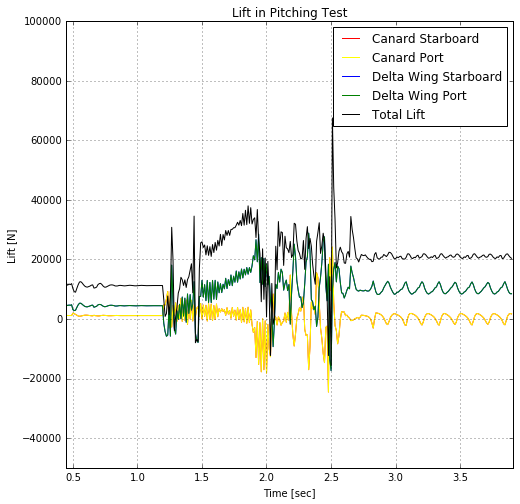

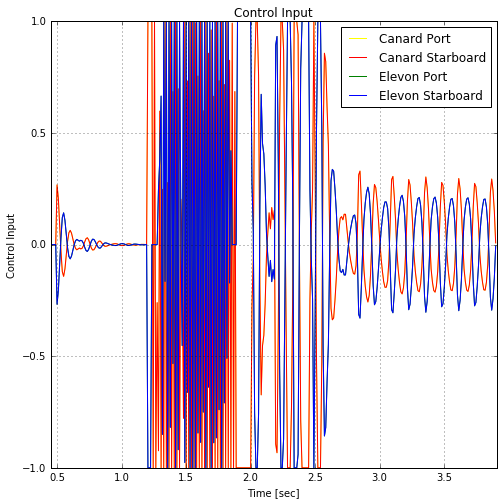

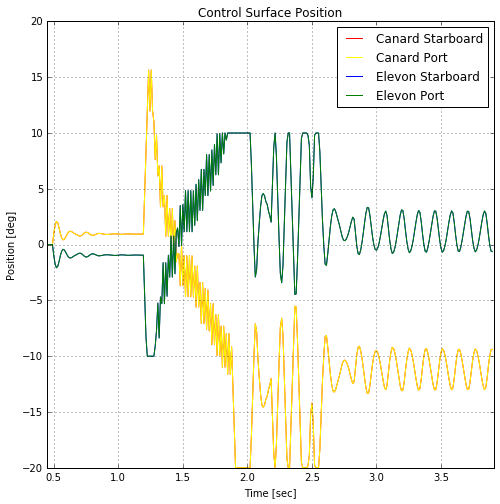

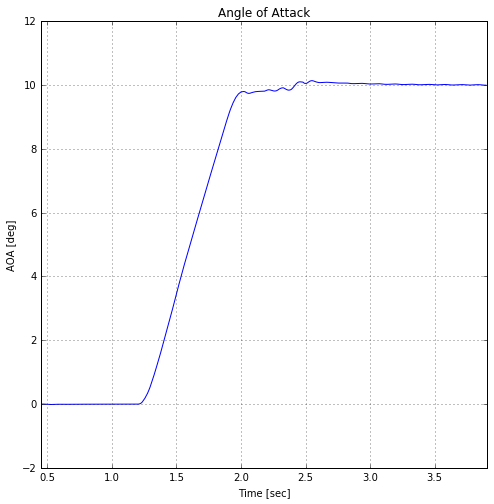

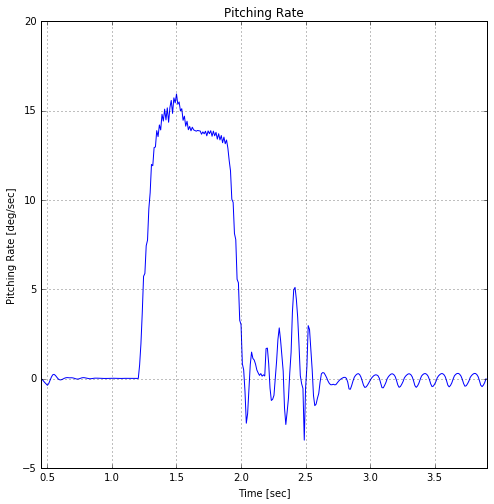

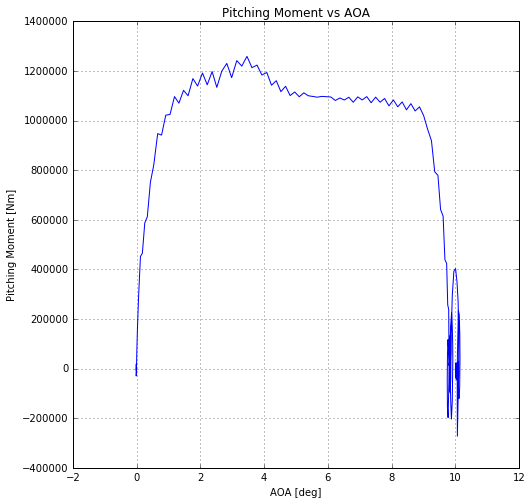

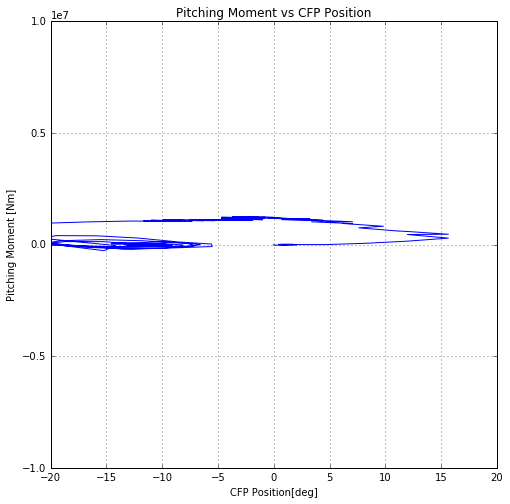

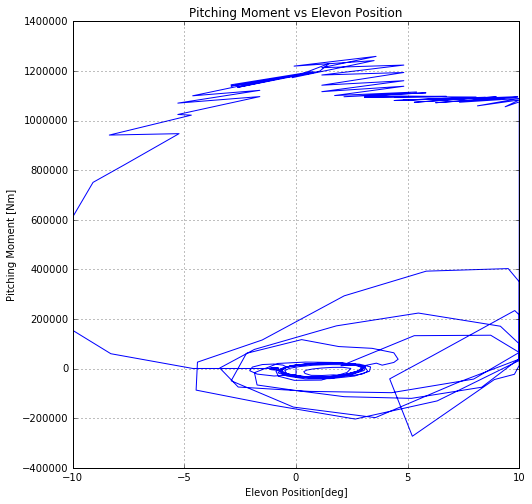

In [472]:
# Post Process:
showtime = [FFST[0],ts*dt]
plt.figure(figsize = ([8,8]))
plt.grid('on')
plt.title('Lift in Pitching Test')
plt.xlabel('Time [sec]')
plt.ylabel('Lift [N]')
plt.xlim(showtime[0],showtime[1])
plt.ylim(-50000,100000)
plt.plot(LiftHis[0:ts,0],LiftHis[0:ts,1],color = 'red')
plt.plot(LiftHis[0:ts,0],LiftHis[0:ts,2],color = 'yellow')
plt.plot(LiftHis[0:ts,0],LiftHis[0:ts,3],color = 'blue')
plt.plot(LiftHis[0:ts,0],LiftHis[0:ts,4],color = 'green')
plt.plot(LiftHis[0:ts,0],LiftHis[0:ts,5],color = 'black')
plt.legend(['Canard Starboard','Canard Port',\
'Delta Wing Starboard','Delta Wing Port','Total Lift'])
plt.figure(figsize = ([8,8]))
plt.grid('on')
plt.title('Control Input')
plt.xlabel('Time [sec]')
plt.ylabel('Control Input')
plt.xlim(showtime[0],showtime[1])
plt.plot(CtrlS[0:ts,0],CtrlS[0:ts,2],color = 'yellow')
plt.plot(CtrlS[0:ts,0],CtrlS[0:ts,3],color = 'red')
plt.plot(CtrlS[0:ts,0],CtrlS[0:ts,4],color = 'green')
plt.plot(CtrlS[0:ts,0],CtrlS[0:ts,5],color = 'blue')
plt.legend(['Canard Port','Canard Starboard','Elevon Port','Elevon Starboard'])
plt.figure(figsize = ([8,8]))
plt.grid('on')
plt.title('Control Surface Position')
plt.xlabel('Time [sec]')
plt.ylabel('Position [deg]')
plt.xlim(showtime[0],showtime[1])
plt.plot(CtrlS[0:ts,0],CtrlS[0:ts,6]/np.pi*180.0,color = 'red')
plt.plot(CtrlS[0:ts,0],CtrlS[0:ts,7]/np.pi*180.0,color = 'yellow')
plt.plot(CtrlS[0:ts,0],CtrlS[0:ts,8]/np.pi*180.0,color = 'blue')
plt.plot(CtrlS[0:ts,0],CtrlS[0:ts,9]/np.pi*180.0,color = 'green')
plt.legend(['Canard Starboard','Canard Port','Elevon Starboard','Elevon Port'])
plt.figure(figsize = ([8,8]))
plt.grid('on')
plt.title('Angle of Attack')
plt.xlabel('Time [sec]')
plt.ylabel('AOA [deg]')
plt.xlim(showtime[0],showtime[1])
plt.plot(FAtt[0:ts,0],FAtt[0:ts,1]/np.pi*180.0)
plt.figure(figsize = ([8,8]))
plt.grid('on')
plt.title('Pitching Rate')
plt.xlabel('Time [sec]')
plt.ylabel('Pitching Rate [deg/sec]')
plt.xlim(showtime[0],showtime[1])
plt.plot(FAtt[0:ts,0],FAtt[0:ts,4]/np.pi*180.0)
plt.figure(figsize = ([8,8]))
plt.grid('on')
plt.title('Pitching Moment vs AOA')
plt.xlabel('AOA [deg]')
plt.ylabel('Pitching Moment [Nm]')
plt.plot(FAtt[0:ts,1]/np.pi*180.0,FAtt[0:ts,7])
plt.figure(figsize = ([8,8]))
plt.grid('on')
plt.title('Pitching Moment vs CFP Position')
plt.xlabel('CFP Position[deg]')
plt.ylabel('Pitching Moment [Nm]')
plt.plot(CtrlS[0:ts,6]/math.pi*180.0,FAtt[0:ts,7])
plt.ylim(-0.1*10**8,0.1*10**8)
plt.figure(figsize = ([8,8]))
plt.grid('on')
plt.title('Pitching Moment vs Elevon Position')
plt.xlabel('Elevon Position[deg]')
plt.ylabel('Pitching Moment [Nm]')
plt.plot(CtrlS[0:ts,9]/math.pi*180.0,FAtt[0:ts,7])

At the beginning, the aircraft was successfully stabilized at $AOA=0^o$. Then, reached $AOA=10^o$ with pitching rate and hold as excepted. The lift vs time curve also indicates the total lift is increased when the AOA is increased to 10 degrees, although there was some oscillation when the aircraft was pitching up. This is a result of the control surfaces self adjustment at each time step. 

On the other hand, a pitching rate about 15 degrees per second is reached for this pitching test. Greater values and higher AOAs were also tested (not shown in this report), those results indicated a hard control for AOA higher than 15 degrees. However, when holding the AOA at 10 degrees, the canard planes are self adjusted to parallel to the free stream, which is a surprising and interesting result.

In addition, when pitching up, the unit lift distribution of the elevons, indicates the vortex lift increases the lift of inner part of the elevons and results in a lost of effectiveness. 

### Conclusion

In this project, a UVLM is used to simulate the leading edge vortices of delta wing and their interaction with canard wake vortices. With a flow separation correction term applied, some resonable results are shown, such as wing tip and trailing edge stall first, vortex lift causes control surface effectiveness lost, and aerodynamic instability. Based on these methods, a simple close loop automatic control function is developed which stabilized the aircraft and pull up to $AOA = 10^o$. 

However, further research is still required. For example, the automatic control function is unable to deal with high AOA, when the canard surface is in stall. Moreover, limited by the model and method, rolling motion is not considered in this project. Another critical problem of the method is the extra time required for the vortices to develop at the beginning of the simulation. Some tests such as how the different canard position affects the stall AOA limit can only be done by repeating the main loop with different variable settings. In order to make the report concise, these tests are not shown in this report, but had been shown in the presentation. 

### Reference

[1] Bertin, J.J. and Smith, M.L., "Vortex Lattice Method," Aerodynamics for Engineers, 3rd ed., Prentice-Hall, New Jersey, 1998, pp. 291-311.

[2] Airfoil Tools. (2016). Retrieved from 
http://airfoiltools.com/airfoil/details?airfoil=naca64a210-il

[3] Stoll, F. and Koenig, D.G., "Large-Scale Wing-Tunnel Investigation of a Close-Coupled Canard-Delta-Wing Fighter Model Through High Angles of Attack," AIAA Aircraft Design, Systems and Techonology Meeting, 83-2554, October 1983.

[4] Levin, D. and Katz, J., "Vortex-Lattice Method for the Calculation of the Nonsteady Separated Flow over Delta Wings," Journal of Aircraft, vol.18(12), 1981, pp. 1032-1037.

[5] 刘孟诏，"飞机转动惯量及其估算," 飞机设计, vol.1, 1997. 

Liu, M, "Rough Computation for the Moment of Inertia of Airplanes," Airplane Design, vol.1, 1997.